In [1]:
# importar bibliotecas
import pandas as pd
from pandas.tseries.offsets import DateOffset
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
#from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
import time
import warnings
warnings.filterwarnings("ignore")


#### 1 - carregar base tratada

In [2]:
# Verifica a pasta corrente
pasta = os.getcwd()

In [3]:
pasta_resultados = os.path.join(pasta, "resultados")
pasta_graficos = os.path.join(pasta, "graficos")

In [4]:
df_dados = pd.read_csv(pasta_resultados + '/' + 'df_dados.csv', index_col=[0]) # index_col para não importar Unnamed column.

#### 2 - criar features, entre elas a logqx_prob, que corresponde já convertido a escala logarítma da probabilidade de morte

In [5]:
# Criar a feature mx = dx/Lx
df_dados['qx_prob'] = df_dados['qx_mil']/1000.0
df_dados['mx'] = df_dados['dx']/df_dados['Lx']
df_dados['logqx_prob'] = np.log(df_dados['qx_prob'])

In [6]:
df_dados.head()

,idade,qx_mil,dx,lx,Lx,Tx,expx,ano,qx_prob,mx,logqx_prob
0,0,33.240000,3324.0,100000.0,98338.0,6.967679e+06,69.676788,1998,0.033240,0.033802,-3.404001
1,1,3.568621,345.0,96676.0,96503.5,6.869341e+06,71.055286,1998,0.003569,0.003575,-5.635576
2,2,1.910081,184.0,96331.0,96239.0,6.772837e+06,70.307973,1998,0.001910,0.001912,-6.260610
3,3,1.393699,134.0,96147.0,96080.0,6.676598e+06,69.441567,1998,0.001394,0.001395,-6.575794
4,4,1.031110,99.0,96013.0,95963.5,6.580518e+06,68.537784,1998,0.001031,0.001032,-6.877119


In [7]:
df_dados.shape

(2457, 11)

#### 3 - Criar a feature tempo t, com base na feature ano, que corresponde ao elemento temporal da série

In [8]:
# Preparar dataset
#serie = {'t': ano, 'logqx_prob': logqx_prob}
df_lstm = pd.DataFrame(df_dados, columns=['idade','ano','logqx_prob'])
df_lstm['t'] = pd.to_datetime(df_lstm['ano'], format='%Y')
#df_lstm.drop(['ano'], axis=1, inplace=True)
df_lstm.set_index('t', inplace=True)


In [9]:
#df_lstm[df_lstm['t'].dt.year == 1998]
df_lstm.head()

,idade,ano,logqx_prob
t,,,
1998-01-01,0,1998,-3.404001
1998-01-01,1,1998,-5.635576
1998-01-01,2,1998,-6.260610
1998-01-01,3,1998,-6.575794
1998-01-01,4,1998,-6.877119


In [10]:
df_lstm[df_lstm['idade']==0]

,idade,ano,logqx_prob
t,,,
1998-01-01,0,1998,-3.404001
1999-01-01,0,1999,-3.453017
2000-01-01,0,2000,-3.504227
2001-01-01,0,2001,-3.533587
2002-01-01,0,2002,-3.562423
2003-01-01,0,2003,-3.593575
2004-01-01,0,2004,-3.627600
2005-01-01,0,2005,-3.658573
2006-01-01,0,2006,-3.693268


#### 4 - Separar a base em base de treino e base de teste para cada idade x ao longo dos anos t, ou seja, para a idade 0, entre os anos 1998 a 2018, para a idade 1, no mesmo período e assim por diante.

##### Rotina LSTM, métricas e gráficos

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1775 - mae: 0.3401
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1679 - mae: 0.3339
Epoch 3/500
1/1 [==============================] - 0s 7ms/step - loss: 0.1654 - mae: 0.3249
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1429 - mae: 0.3026
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1595 - mae: 0.3126
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1283 - mae: 0.2777
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1327 - mae: 0.2882
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1353 - mae: 0.2824
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1208 - mae: 0.2676
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1198 - mae: 0.2621
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1096 

1/1 [==============================] - 0s 2ms/step - loss: 0.0472 - mae: 0.2145
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0322 - mae: 0.1672
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0394 - mae: 0.1932
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0352 - mae: 0.1851
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0382 - mae: 0.1897
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0401 - mae: 0.1990
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0272 - mae: 0.1555
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0356 - mae: 0.1873
Epoch 97/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0406 - mae: 0.1873
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0338 - mae: 0.1731
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0319 - ma

1/1 [==============================] - 0s 9ms/step - loss: 0.0130 - mae: 0.1063
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - mae: 0.1115
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0090 - mae: 0.0837
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0696
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0702
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0801
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0876
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0509
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0152 - mae: 0.1101
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0740
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 931us/step - loss: 0.0040 - mae: 0.0559
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0489
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0733
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0200 - mae: 0.1201
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0899
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0838
Epoch 268/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0058 - mae: 0.0714
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0324 - mae: 0.1262
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1045
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0622
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0643
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0516
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0775
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0532
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0886
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0585
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0053 - mae: 0.0645
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0604
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0093 - mae: 0.0882
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.0949
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 994us/step - loss: 0.0056 - mae: 0.0605
Epoch 437/500
1/1 [==============================] - 0s 907us/step - loss: 0.0122 - mae: 0.0871
Epoch 438/500
1/1 [==============================] - 0s 754us/step - loss: 0.0112 - mae: 0.0817
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0678
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0526
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0672
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0147 - mae: 0.0863
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0555
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0806
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0371
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - l

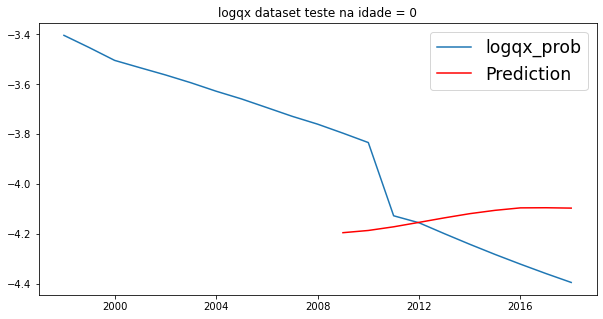

rmse:  [0.23317919]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0670
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0687
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0791
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0492
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0708
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0920
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1000
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0647
Epoch 9/500
1/1 [==============================] - 0s 992us/step - loss: 0.0061 - mae: 0.0583
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0785
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0523
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0532
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0466
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0373
Epoch 92/500
1/1 [==============================] - 0s 934us/step - loss: 0.0074 - mae: 0.0672
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0555
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0480
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0632
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0371
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0528
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0448
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0508
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0343
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0394
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0530
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0402
Epoch 181/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0018 - mae: 0.0295
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0441
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7538e-04 - mae: 0.0232
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0402
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0425
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0408
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0360
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0329
Epoch 266/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0409
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0365
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0552
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0624
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 8.4791e-04 - mae: 0.0258
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0299
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0352
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0457
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0315
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 8.8378e-04 - mae: 0.0208
Epoch 353/500
1/1 [==============================] - 0s 988us/step - loss: 0.0037 - mae: 0.0443
Epoch 354/500
1/1 [==============================] - 0s 925us/step - loss: 0.0035 - mae: 0.0433
Epoch 355/500
1/1 [==============================] - 0s 960us/step - loss: 0.0014 - mae: 0.0257
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0373
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0398
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0308
Epoch 359/500
1/1 [==============================] - 0s 1ms/step

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0243
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0328
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0410
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0356
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0276
Epoch 440/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0345
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0261
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0391
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0327
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0346
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

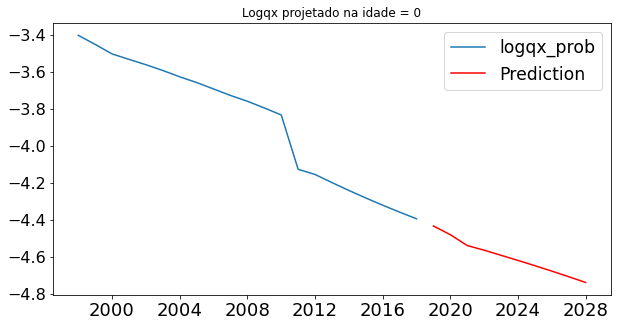

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2270 - mae: 0.3654
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.2305 - mae: 0.3687
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1994 - mae: 0.3434
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1805 - mae: 0.3122
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1867 - mae: 0.3208
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1756 - mae: 0.3146
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1762 - mae: 0.3225
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2065 - mae: 0.3435
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1675 - mae: 0.3155
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1707 - mae: 0.3115
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1265 

1/1 [==============================] - 0s 2ms/step - loss: 0.0544 - mae: 0.2300
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0381 - mae: 0.1910
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0605 - mae: 0.2361
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0531 - mae: 0.2166
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0647 - mae: 0.2494
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0779 - mae: 0.2751
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0751 - mae: 0.2669
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0601 - mae: 0.2419
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0326 - mae: 0.1667
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0563 - mae: 0.2200
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0601 - ma

Epoch 176/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0536 - mae: 0.2143
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0356 - mae: 0.1472
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0261 - mae: 0.1544
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0514 - mae: 0.1856
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0205 - mae: 0.1241
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0203 - mae: 0.1128
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0647 - mae: 0.2176
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0356 - mae: 0.1420
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0211 - mae: 0.1098
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0380 - mae: 0.1612
Epoch 186/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0152 - mae: 0.1082
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0350 - mae: 0.1551
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1213
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0185 - mae: 0.1237
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0207 - mae: 0.1071
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0092 - mae: 0.0853
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0250 - mae: 0.1442
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0187 - mae: 0.1033
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0189 - mae: 0.1151
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0285 - mae: 0.1581
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0123 - mae: 0.0930
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1067
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0719
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0286 - mae: 0.1431
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0219 - mae: 0.1303
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0208 - mae: 0.1066
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0713
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0654
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0276 - mae: 0.1221
Epoch 358/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0173 - mae: 0.1083
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0258 - mae: 0.1318
Epoch 437/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0156 - mae: 0.1091
Epoch 438/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0170 - mae: 0.1016
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0098 - mae: 0.0824
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0252 - mae: 0.1210
Epoch 441/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.1026
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0120 - mae: 0.0805
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0181 - mae: 0.1150
Epoch 444/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0212 - mae: 0.1186
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0172 - mae: 0.1082
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 

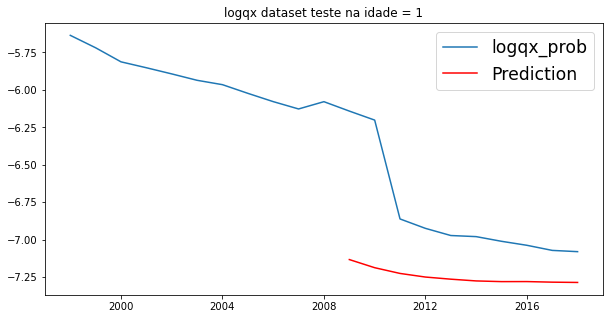

rmse:  [0.50852535]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0217 - mae: 0.1243
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0218 - mae: 0.1333
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0160 - mae: 0.1112
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0209 - mae: 0.1279
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mae: 0.0854
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0841
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0824
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0568
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0828
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0693
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0370
Epoch 89/500
1/1 [==============================] - 0s 973us/step - loss: 0.0045 - mae: 0.0573
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0101 - mae: 0.0705
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0566
Epoch 92/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0069 - mae: 0.0643
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0079 - mae: 0.0611
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0472
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0698
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0448
Epoch 97/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0056 - mae: 0.0509
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0335
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0083 - mae: 0.0620
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0491
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0600
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0431
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0481
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0351
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0643
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0550
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0514
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0350
Epoch 263/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0446
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0399
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0318
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - mae: 0.0506
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0509
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0499
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0491
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0456
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0671
Epoch 272/500
1/1 [==============================] - 0s 1ms/

Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0255
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0486
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0461
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0576
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0271
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0301
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0242
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0255
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0274
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0314
Epoch 359/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0256
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0352
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0369
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0392
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0315
Epoch 440/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0357
Epoch 441/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0292
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0397
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 7.2630e-04 - mae: 0.0243
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0630
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - los

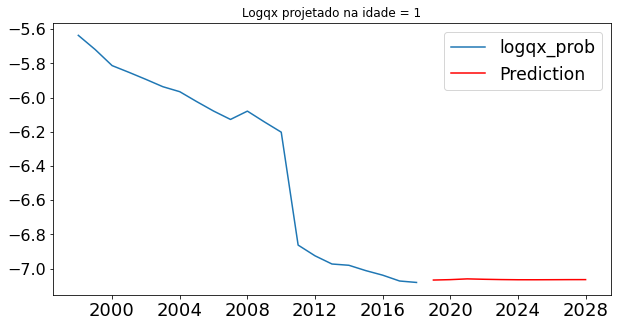

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1034 - mae: 0.2432
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0834 - mae: 0.2216
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0998 - mae: 0.2557
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0803 - mae: 0.2328
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0793 - mae: 0.2388
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0679 - mae: 0.2271
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0573 - mae: 0.2110
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0649 - mae: 0.2144
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0647 - mae: 0.2352
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0620 - mae: 0.2285
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0580 

1/1 [==============================] - 0s 6ms/step - loss: 0.0408 - mae: 0.1819
Epoch 90/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0413 - mae: 0.1842
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0274 - mae: 0.1613
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0218 - mae: 0.1369
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0209 - mae: 0.1345
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0282 - mae: 0.1514
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0284 - mae: 0.1571
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1296
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0296 - mae: 0.1617
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0315 - mae: 0.1589
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0343 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0182 - mae: 0.1138
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0994
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0840
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0993
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0285 - mae: 0.1471
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0138 - mae: 0.1046
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0182 - mae: 0.1009
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0161 - mae: 0.1046
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0811
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.1003
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1043
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.1033
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0155 - mae: 0.1092
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0883
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0722
Epoch 268/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0127 - mae: 0.0879
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0143 - mae: 0.0930
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.0987
Epoch 271/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0465
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - mae: 0.0957
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0579
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0596
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0670
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0584
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0609
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1118
Epoch 356/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0143 - mae: 0.1083
Epoch 357/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0818
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0407
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0628
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0562
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0507
Epoch 440/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0101 - mae: 0.0849
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0069 - mae: 0.0705
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0607
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0445
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0810
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0654
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0501
Epoch 447/500
1/1 [==============================] - 0s 3ms/step - loss: 0

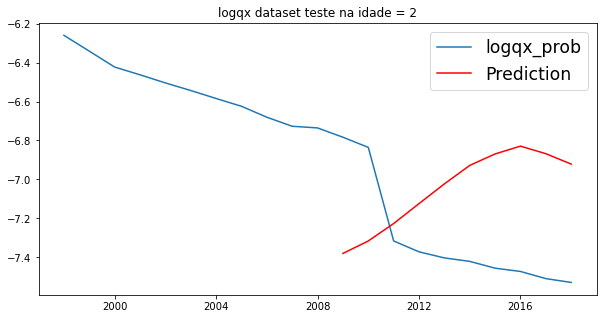

rmse:  [0.50781041]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0273 - mae: 0.1274
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0216 - mae: 0.1184
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0173 - mae: 0.1071
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0739
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.1043
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0196 - mae: 0.1200
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0133 - mae: 0.0976
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0735
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0755
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0777
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0414
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0396
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0659
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0470
Epoch 92/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0387
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0503
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0331
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0452
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0509
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0486
Epoch 98/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0048 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0239
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0562
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0387
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0557
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0436
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0413
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0437
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0373
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0282
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 5.2506e-04 - mae: 0.0171
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0365
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0334
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0326
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0397
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0504
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0330
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0363
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0463
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0494
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0456
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0455
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0341
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0437
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0347
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0442
Epoch 353/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0352
Epoch 354/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0028 - mae: 0.0395
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7232e-04 - mae: 0.0231
Epoch 356/500
1/1 [==============================] - 0s 984us/step - loss: 0.0026 - mae: 0.0305
Epoch 357/500
1/1 [==============================] - 0s 992us/step - loss: 3.8542e-04 - mae: 0.0167
Epoch 358/500
1/1 [==============================] - 0s 1ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0314
Epoch 435/500
1/1 [==============================] - 0s 945us/step - loss: 0.0017 - mae: 0.0359
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0327
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0442
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0384
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0300
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0449
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0456
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0329
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0276
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss:

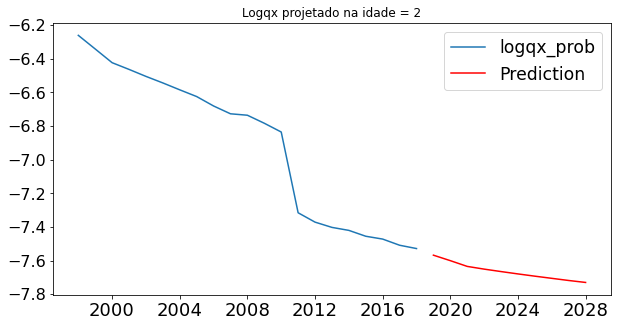

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1416 - mae: 0.3009
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1110 - mae: 0.2649
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1164 - mae: 0.2631
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1142 - mae: 0.2634
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0968 - mae: 0.2468
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1009 - mae: 0.2298
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1036 - mae: 0.2445
Epoch 8/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0828 - mae: 0.2088
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0644 - mae: 0.1907
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0678 - mae: 0.2026
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0614

1/1 [==============================] - 0s 4ms/step - loss: 0.0171 - mae: 0.1285
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0268 - mae: 0.1583
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0256 - mae: 0.1483
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0326 - mae: 0.1757
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0413 - mae: 0.1938
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0148 - mae: 0.1113
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.1202
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0180 - mae: 0.1311
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0187 - mae: 0.1276
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1317
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0359 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0644
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0842
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0171 - mae: 0.0970
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0108 - mae: 0.0955
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0768
Epoch 181/500
1/1 [==============================] - 0s 911us/step - loss: 0.0102 - mae: 0.0925
Epoch 182/500
1/1 [==============================] - 0s 975us/step - loss: 0.0076 - mae: 0.0781
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0106 - mae: 0.0878
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0565
Epoch 185/500
1/1 [==============================] - 0s 946us/step - loss: 0.0075 - mae: 0.0550
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 4ms/step - loss: 0.0082 - mae: 0.0692
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0097 - mae: 0.0739
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0104 - mae: 0.0817
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0102 - mae: 0.0839
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0576
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.0875
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0859
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0889
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0708
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0392
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0827
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0446
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0516
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0715
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0578
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0660
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0909
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0579
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0799
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0583
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0492
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0624
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0584
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0645
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0410
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0648
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0436
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0454
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0397
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0489
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0

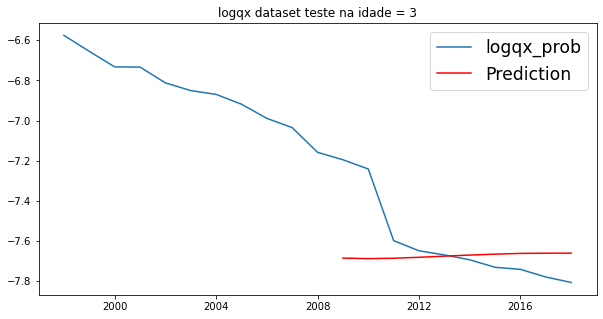

rmse:  [0.22230649]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0796
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0717
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0743
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0756
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0620
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0454
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0356
Epoch 8/500
1/1 [==============================] - 0s 962us/step - loss: 0.0033 - mae: 0.0485
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0522
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0424
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0452
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0332
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0516
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0367
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0601
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0404
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0313
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0388
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0442
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0333
Epoch 98/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0027 - ma

1/1 [==============================] - 0s 2ms/step - loss: 4.4192e-04 - mae: 0.0184
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0289
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0368
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0514
Epoch 179/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0045 - mae: 0.0426
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0324
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0297
Epoch 182/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0330
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0414
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0351
Epoch 185/500
1/1 [==============================] - 0s 5ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0441
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2272e-04 - mae: 0.0197
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0238
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0344
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0340
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0373
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0316
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0467
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0260
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0284
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 12ms/step - loss: 9.6235e-04 - mae: 0.0227
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 8.5372e-04 - mae: 0.0230
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0257
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0366
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2908e-04 - mae: 0.0195
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0303
Epoch 353/500
1/1 [==============================] - 0s 6ms/step - loss: 9.7065e-04 - mae: 0.0271
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0274
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 8.8298e-04 - mae: 0.0225
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0348
Epoch 357/500
1/1 [==============================] - 

1/1 [==============================] - 0s 4ms/step - loss: 6.9613e-04 - mae: 0.0185
Epoch 434/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0258
Epoch 435/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0250
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0305
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0235
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0280
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 8.8162e-04 - mae: 0.0208
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0304
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0272
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0276
Epoch 443/500
1/1 [==============================] - 0s 6ms/step -

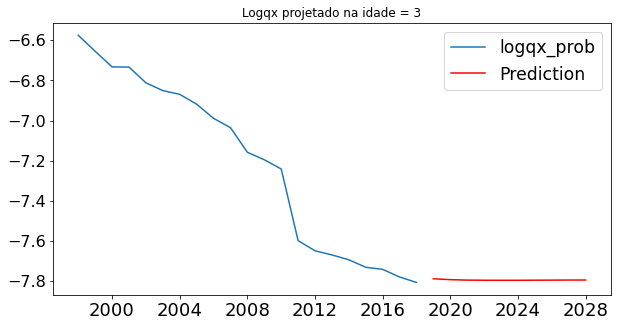

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0441 - mae: 0.1545
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0512 - mae: 0.1732
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0405 - mae: 0.1578
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0431 - mae: 0.1648
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0389 - mae: 0.1586
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0426 - mae: 0.1582
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0403 - mae: 0.1619
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0354 - mae: 0.1647
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0278 - mae: 0.1462
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0288 - mae: 0.1443
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0244 

1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0798
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0629
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0653
Epoch 92/500
1/1 [==============================] - 0s 887us/step - loss: 0.0050 - mae: 0.0615
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0564
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0651
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0350
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0565
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0398
Epoch 98/500
1/1 [==============================] - 0s 960us/step - loss: 0.0076 - mae: 0.0639
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 

1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0470
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0566
Epoch 178/500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.078 - 0s 2ms/step - loss: 0.0073 - mae: 0.0781
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0494
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0636
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0725
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0090 - mae: 0.0903
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0587
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0458
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0597
Epoch 186/500
1/1 [=================

1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0441
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0767
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0512
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0508
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0779
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0705
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0683
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0794
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0612
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0628
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 20ms/step - loss: 0.0036 - mae: 0.0539
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0430
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0556
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0357
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0603
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0614
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0414
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0505
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0327
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0445
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0491
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0464
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0326
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0543
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0531
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0487
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0536
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0463
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0462
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0633
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

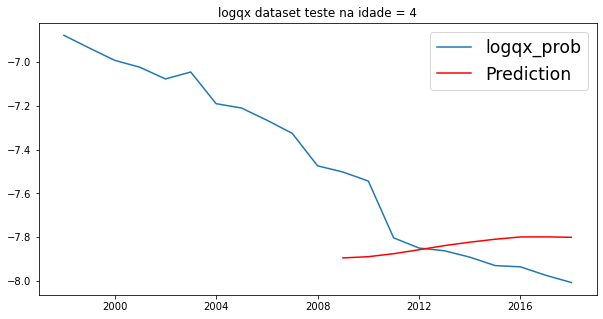

rmse:  [0.19788545]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0805
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0903
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0689
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0672
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0522
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0569
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0559
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0713
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0478
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0358
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0295
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0329
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0388
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 8.9820e-04 - mae: 0.0256
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0378
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0415
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0388
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0321
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0342
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0330
Epoch 98/500
1/1 [==============================] - 0s 992us/step - loss: 0.003

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0227
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0428
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0297
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0306
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0356
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0360
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0268
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6905e-04 - mae: 0.0247
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0335
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0340
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0289
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0349
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0334
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0301
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0335
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0273
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0252
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0316
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0384
Epoch 270/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0340
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0294
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 7.7281e-04 - mae: 0.0241
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0281
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0361
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 7.5180e-04 - mae: 0.0224
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0269
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0338
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0363
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0254
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0363
Epoch 357/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0303
Epoch 433/500
1/1 [==============================] - 0s 5ms/step - loss: 9.3108e-04 - mae: 0.0238
Epoch 434/500
1/1 [==============================] - 0s 4ms/step - loss: 7.9418e-04 - mae: 0.0184
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0239
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0264
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0296
Epoch 438/500
1/1 [==============================] - 0s 994us/step - loss: 0.0016 - mae: 0.0304
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0276
Epoch 440/500
1/1 [==============================] - 0s 958us/step - loss: 0.0016 - mae: 0.0323
Epoch 441/500
1/1 [==============================] - 0s 11ms/step - loss: 7.6025e-04 - mae: 0.0218
Epoch 442/500
1/1 [==============================] - 0s 2

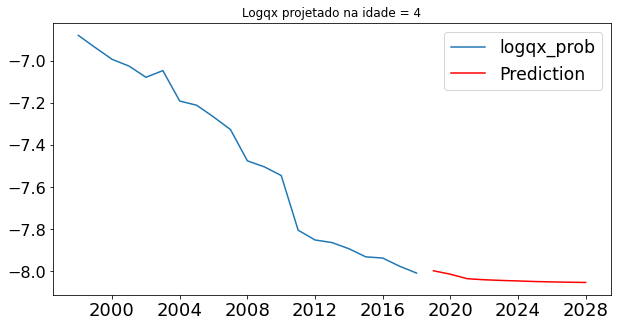

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0694 - mae: 0.1986
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0656 - mae: 0.1948
Epoch 3/500
1/1 [==============================] - 0s 943us/step - loss: 0.0684 - mae: 0.1972
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0474 - mae: 0.1671
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0459 - mae: 0.1642
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0519 - mae: 0.1829
Epoch 7/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0521 - mae: 0.1770
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0491 - mae: 0.1712
Epoch 9/500
1/1 [==============================] - 0s 984us/step - loss: 0.0390 - mae: 0.1621
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0385 - mae: 0.1682
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0

1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0765
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0788
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0589
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0609
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0761
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0909
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0101 - mae: 0.0984
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0933
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0080 - mae: 0.0724
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0782
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0789
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0623
Epoch 178/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0633
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0622
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0533
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0501
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0358
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0270
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0459
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0520
Epoch 186/500
1/1 [==============================] - 0s 9ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0427
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0332
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0578
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0373
Epoch 266/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0511
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0122 - mae: 0.0834
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0551
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0494
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0431
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0471
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0396
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0437
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0460
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0429
Epoch 353/500
1/1 [==============================] - 0s 993us/step - loss: 0.0028 - mae: 0.0474
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0297
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0486
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0518
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3396e-04 - mae: 0.0207
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0414
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - l

1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0254
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 6.4733e-04 - mae: 0.0212
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0287
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6270e-04 - mae: 0.0182
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4952e-04 - mae: 0.0238
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0285
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0309
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0289
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0257
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2542e-04 - mae: 0.0230
Epoch 445/500
1/1 [==============================] - 0s 4m

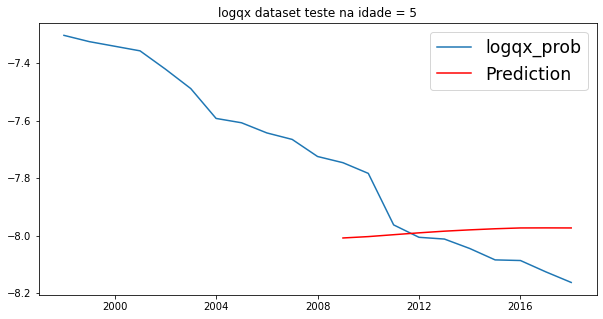

rmse:  [0.14375118]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0750
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0576
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0723
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0407
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0511
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0461
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0472
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0529
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0471
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0607
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0362
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0313
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 6.2793e-04 - mae: 0.0211
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0341
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0410
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0422
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0298
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0335
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0258
Epoch 97/500
1/1 [==============================] - 0s 998us/step - loss: 0.0016 - mae: 0.0306
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.002

Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 5.7465e-04 - mae: 0.0211
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0308
Epoch 177/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0019 - mae: 0.0349
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0377
Epoch 179/500
1/1 [==============================] - 0s 998us/step - loss: 0.0020 - mae: 0.0373
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0431
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0333
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4322e-04 - mae: 0.0208
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3262e-04 - mae: 0.0180
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0265
Epoch 185/500
1/1 [==========================

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0363
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3475e-04 - mae: 0.0240
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0274
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0318
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 9.8485e-04 - mae: 0.0247
Epoch 265/500
1/1 [==============================] - 0s 955us/step - loss: 8.3229e-04 - mae: 0.0217
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0277
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0303
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0270
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0272
Epoch 270/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0256
Epoch 347/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0256
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0263
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0380
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0271
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0227
Epoch 352/500
1/1 [==============================] - 0s 971us/step - loss: 0.0048 - mae: 0.0455
Epoch 353/500
1/1 [==============================] - 0s 8ms/step - loss: 8.5077e-04 - mae: 0.0218
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 9.2834e-04 - mae: 0.0241
Epoch 355/500
1/1 [==============================] - 0s 865us/step - loss: 9.9739e-04 - mae: 0.0246
Epoch 356/500
1/1 [==============================] - 0s 75

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0257
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0258
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0302
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0283
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0362
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0290
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6303e-04 - mae: 0.0227
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 5.9649e-04 - mae: 0.0200
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1290e-04 - mae: 0.0215
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5152e-04 - mae: 0.0212
Epoch 442/500
1/1 [==============================] - 0s 4m

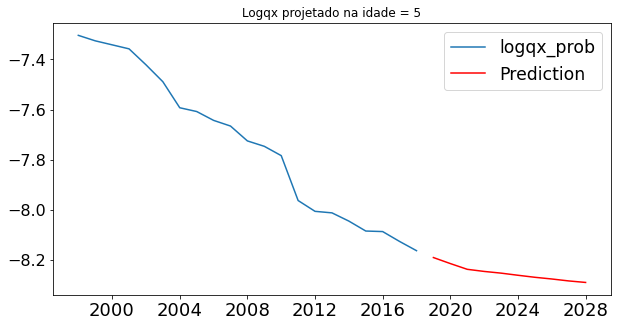

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0476 - mae: 0.1651
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0395 - mae: 0.1508
Epoch 3/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0350 - mae: 0.1457
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0390 - mae: 0.1505
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0289 - mae: 0.1365
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0289 - mae: 0.1436
Epoch 7/500
1/1 [==============================] - 0s 972us/step - loss: 0.0303 - mae: 0.1509
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - mae: 0.1310
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.1072
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0114 - mae: 0.1043
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.01

Epoch 89/500
1/1 [==============================] - 0s 1000us/step - loss: 0.0030 - mae: 0.0513
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0520
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0502
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0386
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0588
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0551
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0434
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0536
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0455
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0482
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - l

Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0469
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0461
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0567
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0410
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0398
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0605
Epoch 182/500
1/1 [==============================] - ETA: 0s - loss: 0.0019 - mae: 0.039 - 0s 3ms/step - loss: 0.0019 - mae: 0.0392
Epoch 183/500
1/1 [==============================] - 0s 986us/step - loss: 0.0040 - mae: 0.0575
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 5.5430e-04 - mae: 0.0208
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0385
Epoch 186/500
1/

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0487
Epoch 263/500
1/1 [==============================] - 0s 960us/step - loss: 0.0022 - mae: 0.0398
Epoch 264/500
1/1 [==============================] - 0s 978us/step - loss: 0.0014 - mae: 0.0303
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0407
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0344
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0395
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0421
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 6.3881e-04 - mae: 0.0195
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0532
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0291
Epoch 272/500
1/1 [==============================] - 0s 3ms/step -

1/1 [==============================] - 0s 12ms/step - loss: 8.3692e-04 - mae: 0.0247
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0256
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0334
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0354
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0325
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0478
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0295
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9719e-04 - mae: 0.0169
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0480
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 9.7043e-04 - mae: 0.0271
Epoch 358/500
1/1 [==============================] - 0s 2ms/s

1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0348
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0314
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0332
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0280
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0314
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0342
Epoch 440/500
1/1 [==============================] - 0s 7ms/step - loss: 1.0431e-04 - mae: 0.0094
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0389
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 3.7305e-04 - mae: 0.0176
Epoch 443/500
1/1 [==============================] - 0s 5ms/step - loss: 8.6448e-04 - mae: 0.0257
Epoch 444/500
1/1 [==============================] - 0s 3ms/st

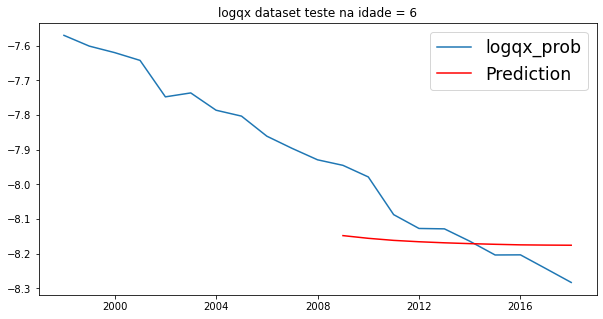

rmse:  [0.09950758]
Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - mae: 0.0859
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0716
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0670
Epoch 4/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0041 - mae: 0.0539
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0527
Epoch 6/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0642
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0460
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0566
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0507
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0370
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0273
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0388
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0326
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8835e-04 - mae: 0.0259
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0329
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0347
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0316
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0304
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0327
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0353
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 

1/1 [==============================] - 0s 947us/step - loss: 0.0025 - mae: 0.0410
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 8.0750e-04 - mae: 0.0239
Epoch 176/500
1/1 [==============================] - 0s 773us/step - loss: 3.3594e-04 - mae: 0.0149
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0325
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0342
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0348
Epoch 180/500
1/1 [==============================] - 0s 6ms/step - loss: 7.8075e-04 - mae: 0.0231
Epoch 181/500
1/1 [==============================] - 0s 952us/step - loss: 0.0021 - mae: 0.0397
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0382
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0277
Epoch 184/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 1ms/step - loss: 9.6950e-04 - mae: 0.0275
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0290
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0279
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0282
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0297
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 8.0010e-04 - mae: 0.0215
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0345
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0343
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0305
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0341
Epoch 270/500
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 967us/step - loss: 4.0892e-04 - mae: 0.0167
Epoch 347/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0259
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4658e-04 - mae: 0.0236
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0329
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0303
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 9.2869e-04 - mae: 0.0255
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0410
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2386e-04 - mae: 0.0234
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 5.9769e-04 - mae: 0.0209
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0313
Epoch 356/500
1/1 [==============================] -

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0338
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0318
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0291
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0293
Epoch 436/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0018 - mae: 0.0320
Epoch 437/500
1/1 [==============================] - 0s 19ms/step - loss: 0.0027 - mae: 0.0402
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0268
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0296
Epoch 440/500
1/1 [==============================] - 0s 879us/step - loss: 0.0021 - mae: 0.0377
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 8.8649e-04 - mae: 0.0234
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - 

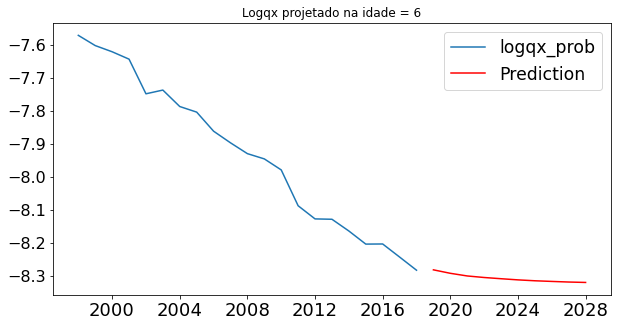

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0299 - mae: 0.1401
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0253 - mae: 0.1216
Epoch 3/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0236 - mae: 0.1205
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.0983
Epoch 5/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0139 - mae: 0.1024
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0177 - mae: 0.1191
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0120 - mae: 0.1006
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0738
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0097 - mae: 0.0921
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0739
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0106

1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0339
Epoch 90/500
1/1 [==============================] - 0s 927us/step - loss: 0.0033 - mae: 0.0443
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0468
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 8.1238e-04 - mae: 0.0191
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0430
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0301
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0386
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0353
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0559
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0486
Epoch 99/500
1/1 [==============================] - 0s 992us/step - loss: 0.0

1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0328
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0376
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9459e-04 - mae: 0.0271
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 9.7406e-04 - mae: 0.0220
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 4.1027e-04 - mae: 0.0172
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0289
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0397
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 5.2582e-04 - mae: 0.0197
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0358
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0533
Epoch 185/500
1/1 [==============================] - 0s 4m

1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0297
Epoch 262/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0357
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0277
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0479
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0296
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0383
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0409
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1834e-04 - mae: 0.0198
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0360
Epoch 270/500
1/1 [==============================] - 0s 959us/step - loss: 0.0011 - mae: 0.0307
Epoch 271/500
1/1 [==============================] - 0s 957us/step -

1/1 [==============================] - 0s 4ms/step - loss: 9.2228e-04 - mae: 0.0260
Epoch 348/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3976e-04 - mae: 0.0261
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0308
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 4.9391e-04 - mae: 0.0161
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0397
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 3.2510e-04 - mae: 0.0136
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0353
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0311
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 8.2112e-04 - mae: 0.0249
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8207e-04 - mae: 0.0192
Epoch 357/500
1/1 [==============================]

1/1 [==============================] - 0s 1ms/step - loss: 5.1669e-04 - mae: 0.0193
Epoch 433/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3760e-04 - mae: 0.0234
Epoch 434/500
1/1 [==============================] - 0s 4ms/step - loss: 5.8624e-04 - mae: 0.0213
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0444
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0333
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0273
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0453
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 6.9709e-04 - mae: 0.0208
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 5.8966e-04 - mae: 0.0210
Epoch 441/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0314
Epoch 442/500
1/1 [==============================] - 0

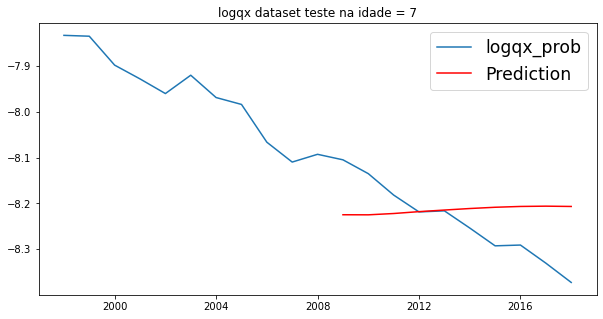

rmse:  [0.09127117]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0986
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0092 - mae: 0.0876
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0548
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0406
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0492
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0402
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0608
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0390
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0460
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0423
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0296
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0780e-04 - mae: 0.0243
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 9.1846e-04 - mae: 0.0261
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0367
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0422
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0384
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 5.8274e-04 - mae: 0.0186
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0440
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 8.1233e-04 - mae: 0.0227
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0392
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0372
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0295
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0490
Epoch 177/500
1/1 [==============================] - 0s 996us/step - loss: 0.0021 - mae: 0.0322
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0285
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0267
Epoch 180/500
1/1 [==============================] - 0s 955us/step - loss: 6.4294e-04 - mae: 0.0213
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0566
Epoch 182/500
1/1 [==============================] - 0s 905us/step - loss: 0.0023 - mae: 0.0409
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0302
Epoch 184/500
1/1 [==============================] - 0s 1ms/step

1/1 [==============================] - 0s 2ms/step - loss: 8.1186e-04 - mae: 0.0271
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0308
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8612e-04 - mae: 0.0231
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0276
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 6.2831e-04 - mae: 0.0207
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7083e-04 - mae: 0.0257
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 5.3656e-04 - mae: 0.0187
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9101e-04 - mae: 0.0236
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 4.2927e-04 - mae: 0.0152
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 9.7059e-04 - mae: 0.0256
Epoch 270/500
1/1 [=======================

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0314
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0360
Epoch 348/500
1/1 [==============================] - 0s 763us/step - loss: 8.0804e-04 - mae: 0.0221
Epoch 349/500
1/1 [==============================] - 0s 992us/step - loss: 9.9050e-04 - mae: 0.0223
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0368
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 7.0553e-04 - mae: 0.0218
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0316
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0334
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0252
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0409
Epoch 356/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0229
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 3.7093e-04 - mae: 0.0163
Epoch 434/500
1/1 [==============================] - 0s 7ms/step - loss: 4.6357e-04 - mae: 0.0189
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0303
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9513e-04 - mae: 0.0266
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0341
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7518e-04 - mae: 0.0233
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0265
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0371
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 7.5116e-04 - mae: 0.0237
Epoch 442/500
1/1 [==============================] - 0

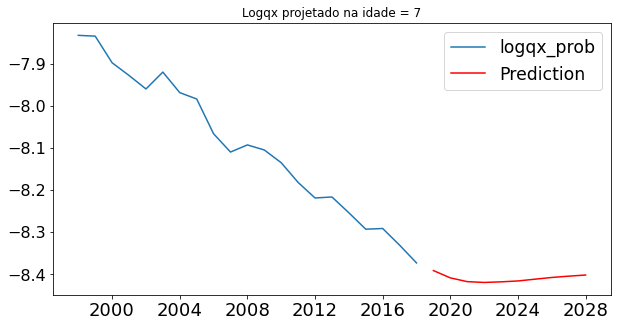

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0153 - mae: 0.0990
Epoch 2/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0124 - mae: 0.0873
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0940
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0786
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0769
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0749
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0764
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0591
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0704
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0795
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 

1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0428
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0310
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0570
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0340
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0315
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0238
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0420
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0375
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0513
Epoch 98/500
1/1 [==============================] - 0s 964us/step - loss: 0.0016 - mae: 0.0332
Epoch 99/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - 

1/1 [==============================] - 0s 3ms/step - loss: 9.1128e-04 - mae: 0.0234
Epoch 176/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0364
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0349
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 6.6206e-04 - mae: 0.0202
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0337
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0338
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0265
Epoch 182/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0012 - mae: 0.0303
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0279
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0394
Epoch 185/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0489
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0274
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0306
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0414
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4477e-04 - mae: 0.0253
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0268
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0309
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0277
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0335
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0483
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0278
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6376e-04 - mae: 0.0269
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0476
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 7.0131e-04 - mae: 0.0231
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0342
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7859e-04 - mae: 0.0231
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 8.6262e-04 - mae: 0.0244
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6813e-04 - mae: 0.0248
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0313
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0342
Epoch 357/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0322
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0366
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6494e-04 - mae: 0.0251
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0306
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0377
Epoch 438/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0012 - mae: 0.0266
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0277
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0299
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 6.1656e-04 - mae: 0.0207
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0362
Epoch 443/500
1/1 [==============================] - 0s 1ms/step -

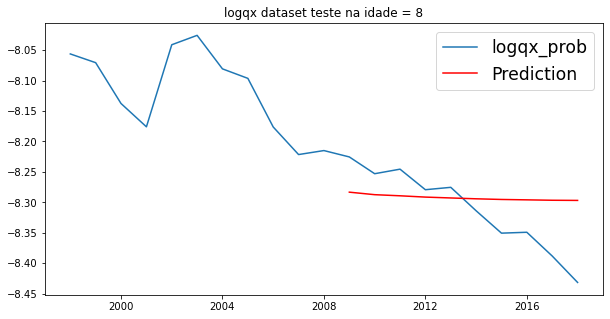

rmse:  [0.06302971]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - mae: 0.1303
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0849
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0658
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0056 - mae: 0.0616
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0599
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0799
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0172 - mae: 0.1063
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0505
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0461
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0602
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 730us/step - loss: 0.0034 - mae: 0.0452
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0316
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0263
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0432
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0452
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0315
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0460
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0314
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0407
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0572
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 8.4664e-0

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0420
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0430
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0500
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8919e-04 - mae: 0.0216
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0525
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0239
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0291
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0301
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0251
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - los

Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0279
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0323
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0470
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 6.0254e-04 - mae: 0.0195
Epoch 266/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0016 - mae: 0.0319
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0425
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0282
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0307
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0365
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0379
Epoch 272/500
1/1 [==============================] - 0s

1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0313
Epoch 349/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0262
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0252
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0466
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0289
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7810e-04 - mae: 0.0262
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0296
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0353
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0473
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0443
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0293
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0397
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0418
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0260
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0430
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4574e-04 - mae: 0.0280
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0333
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0288
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0445
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - los

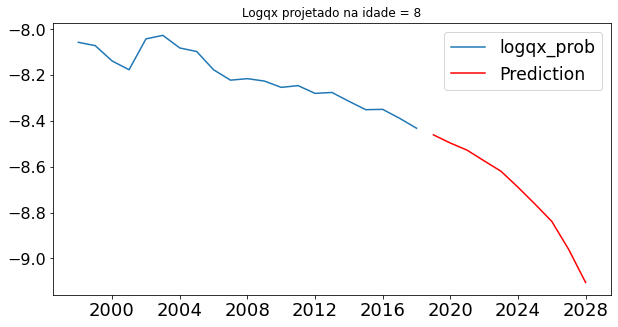

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0135 - mae: 0.0985
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0884
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0756
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0639
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0691
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0503
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0469
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0427
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0549
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0564
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 

1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0390
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0546
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0450
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0490
Epoch 93/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0027 - mae: 0.0379
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0434
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0406
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0579
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0510
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0480
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0539
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0512
Epoch 178/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0442
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0398
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0400
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0469
Epoch 182/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0034 - mae: 0.0458
Epoch 183/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0348
Epoch 184/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0477
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0427
Epoch 186/500
1/1 [==============================] - 0s 5ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0448
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0406
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0415
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0394
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0443
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0404
Epoch 269/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0411
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0452
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0477
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0425
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0432
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0479
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0508
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0434
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0403
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0411
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0453
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0453
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0379
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0449
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0447
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0467
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0357
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0371
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0437
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0433
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0450
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0396
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0463
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0403
Epoch 447/500
1/1 [==============================] - 0s 2ms/step - loss: 0

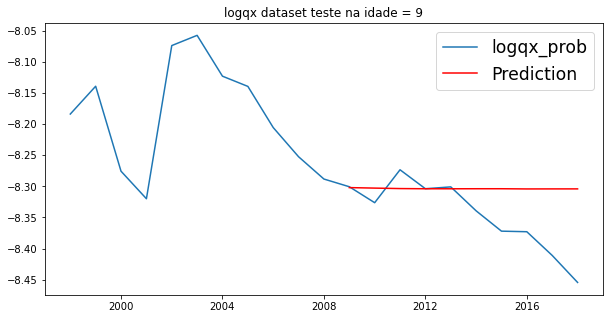

rmse:  [0.06787432]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0531 - mae: 0.2058
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0470 - mae: 0.1940
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0446 - mae: 0.1892
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0363 - mae: 0.1677
Epoch 5/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0254 - mae: 0.1417
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0210 - mae: 0.1282
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0159 - mae: 0.1052
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0158 - mae: 0.1084
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0159 - mae: 0.1005
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0231 - mae: 0.1176
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0742
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0389
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0613
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0069 - mae: 0.0602
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0564
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0455
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0488
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0515
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0490
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0482
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0449
Epoch 176/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0035 - mae: 0.0526
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0511
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0686
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0593
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0646
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0576
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0584
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0476
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0595
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0316
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0333
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0405
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0434
Epoch 266/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0475
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0414
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0442
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0321
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0390
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0460
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0453
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0416
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0299
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0483
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0444
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0409
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0314
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0400
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0381
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0394
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0331
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0395
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0342
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0451
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0387
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0473
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0462
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0473
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0474
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0332
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

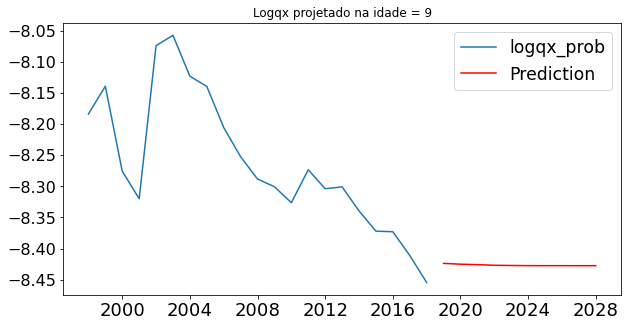

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0328 - mae: 0.1519
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0277 - mae: 0.1429
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0254 - mae: 0.1370
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0228 - mae: 0.1158
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1060
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0155 - mae: 0.1016
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1024
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0997
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0129 - mae: 0.0931
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0884
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 

1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0648
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0592
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0665
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0670
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0729
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0101 - mae: 0.0793
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0629
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0097 - mae: 0.0818
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0775
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0743
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0654
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0557
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0607
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0577
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0644
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0716
Epoch 182/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0077 - mae: 0.0727
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0559
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0607
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0676
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0601
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0733
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0615
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0734
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0710
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0914
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0465
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0673
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0675
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0779
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0697
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0651
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0581
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0567
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0759
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0724
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0851
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0068 - mae: 0.0624
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0558
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0552
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0462
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0574
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0581
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0590
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0071 - mae: 0.0668
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0084 - mae: 0.0722
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0586
Epoch 444/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0645
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0603
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0623
Epoch 447/500
1/1 [==============================] - 0s 3ms/step - loss: 0

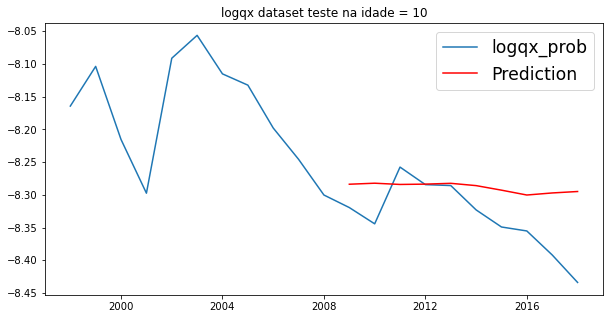

rmse:  [0.06454121]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0426 - mae: 0.1839
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0469 - mae: 0.1927
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0383 - mae: 0.1731
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0298 - mae: 0.1530
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0254 - mae: 0.1441
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0212 - mae: 0.1276
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0845
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0182 - mae: 0.0985
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1103
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0200 - mae: 0.1145
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0541
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0695
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0547
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0574
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0746
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0679
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0067 - mae: 0.0583
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0600
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0632
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0547
Epoch 98/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0035 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0069 - mae: 0.0627
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0611
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0570
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0543
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0558
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0459
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0513
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0456
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0504
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0608
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0444
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0407
Epoch 264/500
1/1 [==============================] - 0s 997us/step - loss: 0.0024 - mae: 0.0364
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0617
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0438
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0522
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0575
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0417
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0471
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0500
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0466
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0547
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0512
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0521
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0475
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0474
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0377
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0458
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0462
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0518
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 990us/step - loss: 0.0034 - mae: 0.0458
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0399
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0429
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0372
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0481
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0359
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0443
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0549
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0461
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0408
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

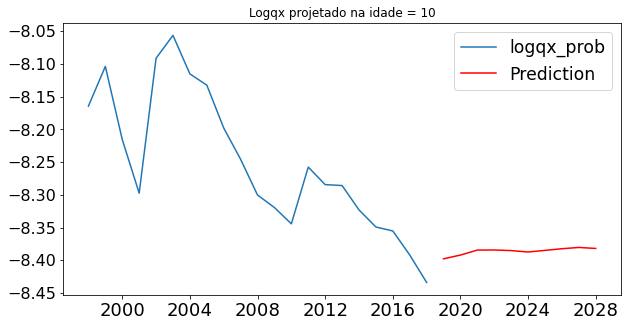

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0289 - mae: 0.1503
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0249 - mae: 0.1314
Epoch 3/500
1/1 [==============================] - 0s 981us/step - loss: 0.0237 - mae: 0.1276
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0193 - mae: 0.1121
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0191 - mae: 0.1188
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0170 - mae: 0.1114
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0128 - mae: 0.0922
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0976
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1039
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - mae: 0.0933
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.011

1/1 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0593
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - mae: 0.0761
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0654
Epoch 92/500
1/1 [==============================] - 0s 986us/step - loss: 0.0081 - mae: 0.0738
Epoch 93/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0053 - mae: 0.0582
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0663
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0637
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0751
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0637
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0740
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0808
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0662
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0732
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0763
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0797
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0749
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0637
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0797
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0732
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0699
Epoch 186/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0649
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0664
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0666
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0685
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0604
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0827
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0071 - mae: 0.0721
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0733
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0668
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0593
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0719
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0681
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0077 - mae: 0.0756
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0638
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0682
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0636
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0666
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0643
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0093 - mae: 0.0766
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0739
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0568
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0588
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0601
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0664
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0675
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0713
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0644
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0702
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0743
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0666
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

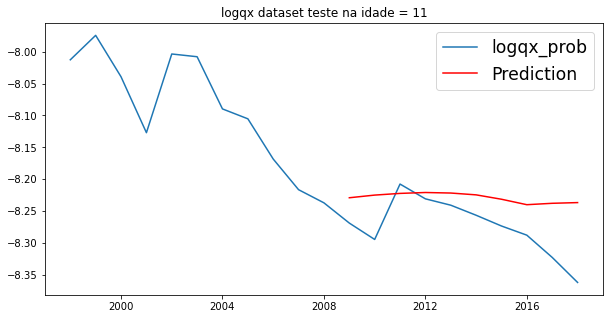

rmse:  [0.05921991]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0262 - mae: 0.1453
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0277 - mae: 0.1487
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0235 - mae: 0.1361
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0244 - mae: 0.1393
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0206 - mae: 0.1280
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0173 - mae: 0.1145
Epoch 7/500
1/1 [==============================] - 0s 961us/step - loss: 0.0165 - mae: 0.1066
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.0923
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.0914
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.0991
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0650
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0788
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0868
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0653
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0687
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0665
Epoch 94/500
1/1 [==============================] - 0s 867us/step - loss: 0.0081 - mae: 0.0785
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0891
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0768
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0698
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0752
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0608
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0766
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0754
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0685
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0647
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0740
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0752
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0618
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0621
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0443
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0551
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0548
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0395
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0558
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0617
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0592
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0613
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0598
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0673
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0451
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0406
Epoch 351/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0019 - mae: 0.0321
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0395
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0519
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0435
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0390
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0247
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0537
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0510
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0446
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0430
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0317
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0056 - mae: 0.0553
Epoch 440/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0039 - mae: 0.0521
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0457
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0394
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0358
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0373
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0290
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 

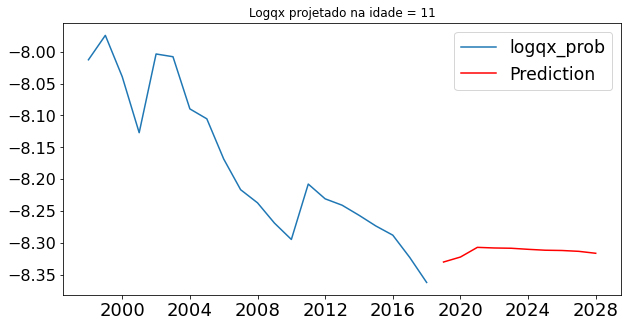

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0321 - mae: 0.1646
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1446
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0232 - mae: 0.1347
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1200
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0180 - mae: 0.1187
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0141 - mae: 0.1017
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.1040
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0919
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0111 - mae: 0.0934
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0742
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 

1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0764
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0625
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0694
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0616
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0659
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0617
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0692
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0669
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0658
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0070 - mae: 0.0725
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - ma

1/1 [==============================] - 0s 19ms/step - loss: 0.0063 - mae: 0.0696
Epoch 177/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0622
Epoch 178/500
1/1 [==============================] - 0s 919us/step - loss: 0.0071 - mae: 0.0759
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0576
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0810
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0712
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0656
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0686
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0660
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0732
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss

1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0598
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0663
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0642
Epoch 266/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0066 - mae: 0.0744
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0555
Epoch 268/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0051 - mae: 0.0614
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0739
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0757
Epoch 271/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0638
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0681
Epoch 273/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 940us/step - loss: 0.0053 - mae: 0.0597
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0586
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0681
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0642
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0563
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0678
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0644
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0646
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0049 - mae: 0.0625
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0727
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0674
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0744
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0655
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0624
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0676
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0598
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0635
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0696
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0696
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0546
Epoch 447/500
1/1 [==============================] - 0s 4ms/step - loss: 0

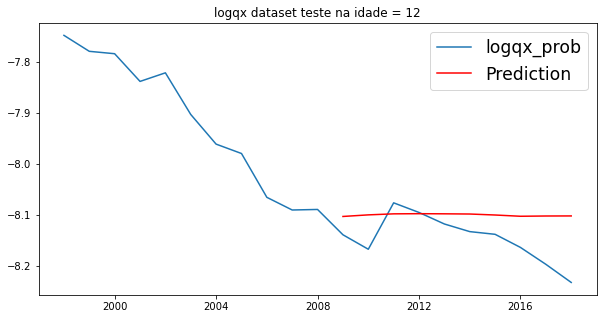

rmse:  [0.06242349]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0161 - mae: 0.1085
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.1066
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0158 - mae: 0.1106
Epoch 4/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0125 - mae: 0.0940
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0958
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0111 - mae: 0.0912
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0879
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0774
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0862
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0750
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0707
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0718
Epoch 90/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0584
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0750
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0616
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0592
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0669
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0615
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0706
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0658
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0057 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0602
Epoch 176/500
1/1 [==============================] - 0s 944us/step - loss: 0.0040 - mae: 0.0544
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0600
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0567
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0540
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0552
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0571
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0539
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0546
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0534
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 13ms/step - loss: 0.0039 - mae: 0.0464
Epoch 263/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0045 - mae: 0.0537
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0344
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0482
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0444
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0495
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0437
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0385
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0367
Epoch 271/500
1/1 [==============================] - 0s 959us/step - loss: 0.0025 - mae: 0.0398
Epoch 272/500
1/1 [==============================] - 0s 981us/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0343
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0377
Epoch 351/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0016 - mae: 0.0301
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0353
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0312
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0323
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0451
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0348
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0469
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0345
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0436
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0365
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0310
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0317
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0375
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0331
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0364
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0323
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0350
Epoch 444/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0359
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

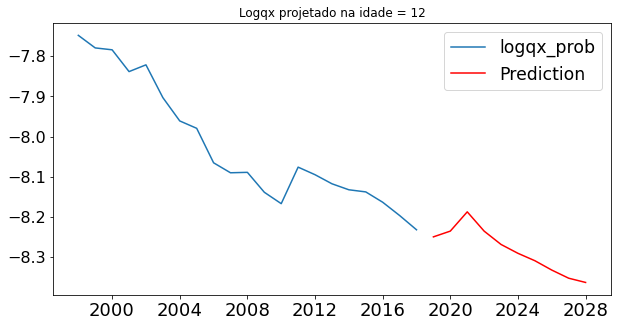

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0249 - mae: 0.1281
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0218 - mae: 0.1261
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0187 - mae: 0.1082
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0162 - mae: 0.1051
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0920
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0935
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.0989
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mae: 0.0912
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0802
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0823
Epoch 11/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0069 

1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0769
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0728
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0049 - mae: 0.0658
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0789
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0086 - mae: 0.0829
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0867
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0726
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0743
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0711
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0728
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0778
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0605
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0671
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0771
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0820
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0717
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0737
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0630
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0100 - mae: 0.0863
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0629
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0737
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0653
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0690
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0744
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0647
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0671
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0064 - mae: 0.0679
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0615
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0683
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0698
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0525
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0603
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0731
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0539
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0689
Epoch 355/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0073 - mae: 0.0701
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0641
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0662
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0604
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0583
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0507
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0548
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0625
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0623
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0509
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0554
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0564
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0566
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0701
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0460
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

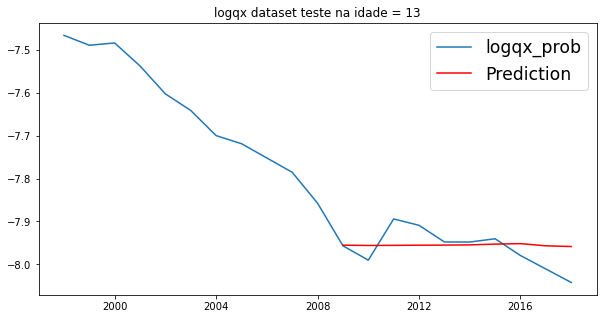

rmse:  [0.04254005]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0175 - mae: 0.1142
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0158 - mae: 0.1028
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0143 - mae: 0.1045
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0096 - mae: 0.0858
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0899
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0085 - mae: 0.0859
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0559
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0640
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0799
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0486
Epoch 11/500
1/1 [==============================] - 0s 6ms/

Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0369
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0403
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0381
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0302
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0345
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0372
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0323
Epoch 96/500
1/1 [==============================] - 0s 917us/step - loss: 0.0011 - mae: 0.0258
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0375
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0371
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0354
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0315
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0322
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0280
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0366
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0287
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 6.9103e-04 - mae: 0.0222
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0358
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0381
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0309
Epoch 185/500
1/1 [==============================] - 0s 7ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0347
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0314
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0272
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0235
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0325
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0406
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0317
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1909e-04 - mae: 0.0267
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0275
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0354
Epoch 271/500
1/1 [==============================] - 0s 938us/step - l

1/1 [==============================] - 0s 4ms/step - loss: 6.3578e-04 - mae: 0.0199
Epoch 348/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0315
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0254
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 5.3055e-04 - mae: 0.0180
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0325
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 3.9294e-04 - mae: 0.0159
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0410
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 8.6765e-04 - mae: 0.0250
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7083e-04 - mae: 0.0238
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 9.1212e-04 - mae: 0.0213
Epoch 357/500
1/1 [==============================]

1/1 [==============================] - 0s 4ms/step - loss: 9.5844e-04 - mae: 0.0219
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0244
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 5.1947e-04 - mae: 0.0190
Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0275
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 3.8652e-04 - mae: 0.0127
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 6.1035e-04 - mae: 0.0170
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0265
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0231
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 8.0113e-04 - mae: 0.0195
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 4.6701e-04 - mae: 0.0187
Epoch 442/500
1/1 [==============================]

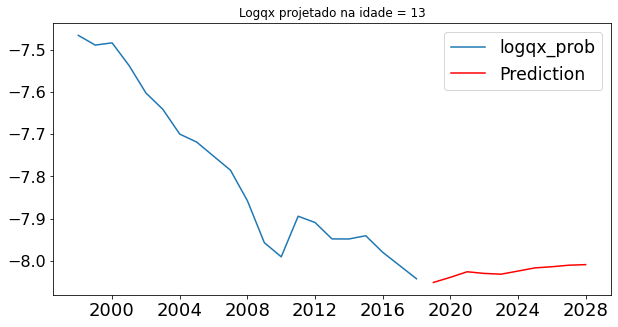

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0264 - mae: 0.1404
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0238 - mae: 0.1218
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0199 - mae: 0.1204
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0907
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.0887
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.0954
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.0961
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0817
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0770
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0093 - mae: 0.0859
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 

1/1 [==============================] - 0s 7ms/step - loss: 0.0047 - mae: 0.0604
Epoch 90/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0079 - mae: 0.0826
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0713
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0805
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0829
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0720
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0713
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0900
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0835
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0797
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0810
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0647
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0074 - mae: 0.0827
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0723
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0743
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0789
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0714
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0797
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0817
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0682
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0601
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0768
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0075 - mae: 0.0816
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0768
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0713
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0733
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0733
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0788
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0729
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0729
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0830
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0640
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0766
Epoch 353/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0079 - mae: 0.0826
Epoch 354/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0062 - mae: 0.0749
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0816
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0812
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0735
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0643
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0680
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0675
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0060 - mae: 0.0726
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0794
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0696
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0738
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0062 - mae: 0.0735
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0742
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0704
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0738
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0763
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

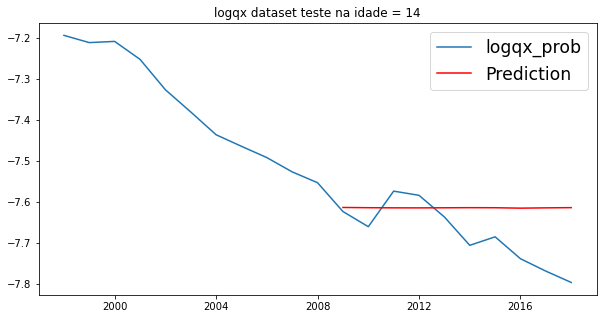

rmse:  [0.09532359]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0217 - mae: 0.1257
Epoch 2/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0196 - mae: 0.1179
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0179 - mae: 0.1108
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1042
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0140 - mae: 0.0980
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0792
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0746
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0896
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0830
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0089 - mae: 0.0791
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 5ms/step - loss: 0.0081 - mae: 0.0695
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0674
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0073 - mae: 0.0712
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0688
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0772
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0891
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0658
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0650
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0069 - mae: 0.0774
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0646
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0061 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0710
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0782
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0704
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0735
Epoch 179/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0053 - mae: 0.0592
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0843
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0681
Epoch 182/500
1/1 [==============================] - 0s 967us/step - loss: 0.0062 - mae: 0.0651
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0089 - mae: 0.0756
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0684
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0564
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0770
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0718
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0521
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0700
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0704
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0773
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0746
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0088 - mae: 0.0797
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0600
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0673
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0500
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0736
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0666
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0595
Epoch 354/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0733
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0682
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0718
Epoch 357/500
1/1 [==============================] - 0s 965us/step - loss: 0.0063 - mae: 0.0683
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0621
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0656
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0648
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0503
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0740
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0507
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0600
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0639
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0541
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0578
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0597
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

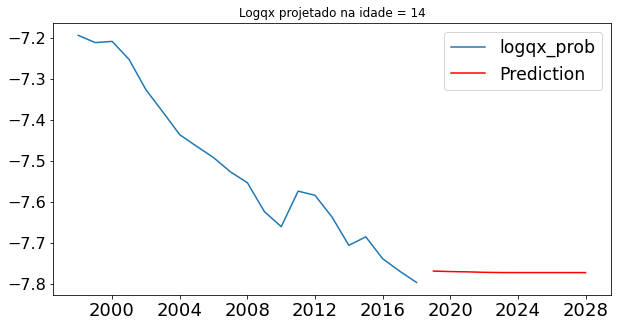

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0866 - mae: 0.2381
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0872 - mae: 0.2358
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0845 - mae: 0.2378
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0802 - mae: 0.2227
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0813 - mae: 0.2295
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0757 - mae: 0.2162
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0776 - mae: 0.2239
Epoch 8/500
1/1 [==============================] - 0s 958us/step - loss: 0.0729 - mae: 0.2177
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0696 - mae: 0.2110
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0700 - mae: 0.2133
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.066

1/1 [==============================] - 0s 911us/step - loss: 0.0261 - mae: 0.1302
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0282 - mae: 0.1385
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0376 - mae: 0.1612
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0168 - mae: 0.1077
Epoch 93/500
1/1 [==============================] - 0s 907us/step - loss: 0.0219 - mae: 0.1232
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0296 - mae: 0.1396
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0316 - mae: 0.1349
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0224 - mae: 0.1220
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1185
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0182 - mae: 0.0986
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0224 

1/1 [==============================] - 0s 2ms/step - loss: 0.0160 - mae: 0.1045
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.0993
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0193 - mae: 0.1173
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.1159
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1060
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0224 - mae: 0.1316
Epoch 182/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0212 - mae: 0.1295
Epoch 183/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0179 - mae: 0.1191
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0197 - mae: 0.1128
Epoch 185/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0199 - mae: 0.1134
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0159 - mae: 0.1141
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0954
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0150 - mae: 0.1074
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.1012
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.0988
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0166 - mae: 0.1138
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0923
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1050
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.1004
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1164
Epoch 273/500
1/1 [==============================] - 0s 935us/step - loss:

1/1 [==============================] - 0s 11ms/step - loss: 0.0054 - mae: 0.0617
Epoch 351/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0067 - mae: 0.0725
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0492
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0767
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0879
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0742
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0118 - mae: 0.0846
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0516
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0780
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0628
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0425
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0384
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0426
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0730
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0546
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0482
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0355
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0383
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0510
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0484
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

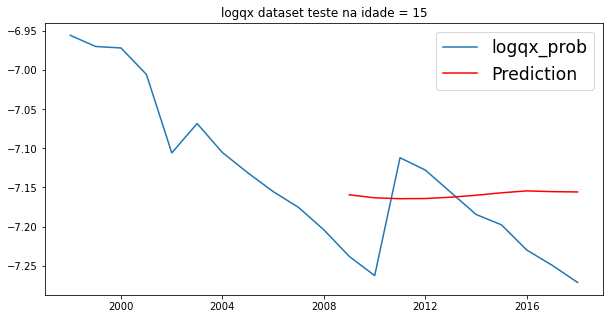

rmse:  [0.07112962]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0345 - mae: 0.1200
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0276 - mae: 0.1105
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0287 - mae: 0.1192
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0315 - mae: 0.1314
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0273 - mae: 0.1229
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0211 - mae: 0.1068
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0183 - mae: 0.1059
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0194 - mae: 0.1142
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0178 - mae: 0.1156
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0180 - mae: 0.1076
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0308
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0298
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0354
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0328
Epoch 92/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0578
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0379
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0306
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0323
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0025 - mae: 0.0401
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0469
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - ma

1/1 [==============================] - 0s 1ms/step - loss: 8.1689e-04 - mae: 0.0248
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0475
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0276
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0299
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0322
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0344
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0281
Epoch 182/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0336
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0412
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0385
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0334
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0343
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0266
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0378
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 8.9144e-04 - mae: 0.0253
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0426
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0309
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0359
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 5.2424e-04 - mae: 0.0167
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0299
Epoch 271/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0299
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0306
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0276
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0254
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8440e-04 - mae: 0.0251
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0200
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0297
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0390
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 5.1048e-04 - mae: 0.0180
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0329
Epoch 357/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 5.9875e-04 - mae: 0.0174
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 2.6216e-04 - mae: 0.0133
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0277
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0280
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 2.6547e-04 - mae: 0.0135
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 3.0259e-04 - mae: 0.0135
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 8.8838e-04 - mae: 0.0196
Epoch 439/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0021 - mae: 0.0314
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 7.2514e-04 - mae: 0.0179
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0258
Epoch 442/500
1/1 [==============================]

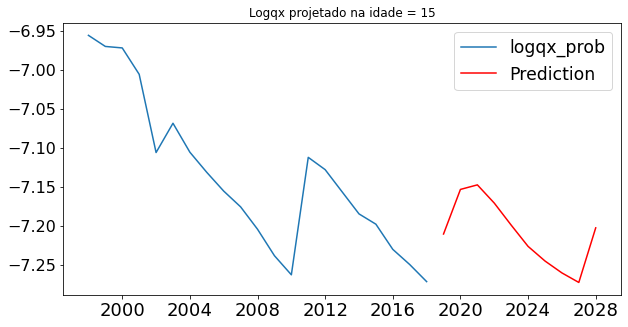

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1303 - mae: 0.2985
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1274 - mae: 0.2964
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1207 - mae: 0.2892
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1104 - mae: 0.2693
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1086 - mae: 0.2728
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0996 - mae: 0.2604
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0948 - mae: 0.2456
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0898 - mae: 0.2400
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0927 - mae: 0.2468
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0801 - mae: 0.2230
Epoch 11/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0823 

1/1 [==============================] - 0s 3ms/step - loss: 0.0364 - mae: 0.1778
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0386 - mae: 0.1745
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0416 - mae: 0.1869
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0342 - mae: 0.1681
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0326 - mae: 0.1684
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0314 - mae: 0.1588
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0325 - mae: 0.1588
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0261 - mae: 0.1460
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0276 - mae: 0.1457
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0427 - mae: 0.1835
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0417 - ma

1/1 [==============================] - 0s 5ms/step - loss: 0.0116 - mae: 0.0917
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1148
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0262 - mae: 0.1393
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0164 - mae: 0.0932
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0258 - mae: 0.1357
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.0981
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0177 - mae: 0.1070
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0286 - mae: 0.1517
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0205 - mae: 0.1201
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0214 - mae: 0.1220
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0933
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1242
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1241
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.0986
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0899
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0998
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0183 - mae: 0.1041
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0181 - mae: 0.1222
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0189 - mae: 0.1069
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.0973
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.0991
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0741
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0082 - mae: 0.0667
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0785
Epoch 354/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0091 - mae: 0.0859
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0133 - mae: 0.1010
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0595
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0065 - mae: 0.0686
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0081 - mae: 0.0700
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0654
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0170 - mae: 0.1212
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0863
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0751
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0876
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0643
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0707
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0613
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0623
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0515
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0517
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

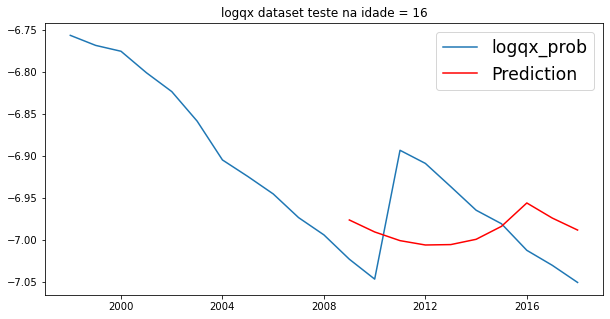

rmse:  [0.06525328]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0658
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0715
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0815
Epoch 4/500
1/1 [==============================] - 0s 932us/step - loss: 0.0037 - mae: 0.0455
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0681
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0696
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0561
Epoch 8/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0063 - mae: 0.0648
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0718
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0654
Epoch 11/500
1/1 [==============================] - 0s 2

1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0474
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0523
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0558
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0528
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0545
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0510
Epoch 94/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0493
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0654
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0513
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0524
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0484
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0381
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0515
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0474
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0395
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0352
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0521
Epoch 182/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0038 - mae: 0.0490
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0488
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0327
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0427
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0357
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0371
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0374
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0468
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0456
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0541
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0553
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0441
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0351
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0362
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0292
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0480
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0286
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0344
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0351
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0394
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0486
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0420
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0377
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0399
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0506
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0424
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0263
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0346
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0318
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0507
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0346
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0405
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0305
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0

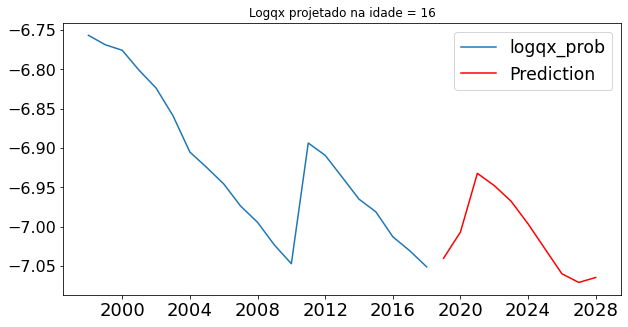

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1468 - mae: 0.3375
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1434 - mae: 0.3335
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1425 - mae: 0.3286
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1348 - mae: 0.3180
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1286 - mae: 0.3049
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1191 - mae: 0.2887
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1186 - mae: 0.2908
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1106 - mae: 0.2756
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1048 - mae: 0.2668
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1020 - mae: 0.2604
Epoch 11/500
1/1 [==============================] - 0s 972us/step - loss: 0.098

1/1 [==============================] - 0s 4ms/step - loss: 0.0324 - mae: 0.1495
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0263 - mae: 0.1317
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0320 - mae: 0.1455
Epoch 92/500
1/1 [==============================] - 0s 996us/step - loss: 0.0262 - mae: 0.1269
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0242 - mae: 0.1293
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0209 - mae: 0.1187
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0208 - mae: 0.1151
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0226 - mae: 0.1275
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1328
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0228 - mae: 0.1285
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0182 - mae: 0.1149
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0173 - mae: 0.1065
Epoch 178/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0232 - mae: 0.1210
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1177
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0208 - mae: 0.1272
Epoch 181/500
1/1 [==============================] - 0s 986us/step - loss: 0.0210 - mae: 0.1188
Epoch 182/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0210 - mae: 0.1172
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0190 - mae: 0.1197
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0211 - mae: 0.1178
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1161
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0175 - mae: 0.1165
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0166 - mae: 0.1128
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1047
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1138
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.0997
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.0963
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0188 - mae: 0.1168
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0979
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0283 - mae: 0.1337
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1179
Epoch 272/500
1/1 [==============================] - 0s 986us/step - loss:

1/1 [==============================] - 0s 5ms/step - loss: 0.0165 - mae: 0.1073
Epoch 350/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0180 - mae: 0.1104
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0147 - mae: 0.0979
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0172 - mae: 0.1144
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0170 - mae: 0.1093
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0787
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - mae: 0.1234
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1123
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0984
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0161 - mae: 0.1021
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 6ms/step - loss: 0.0081 - mae: 0.0780
Epoch 437/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0174 - mae: 0.1089
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0127 - mae: 0.0977
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0751
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.1021
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0728
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0895
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.0960
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0708
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0569
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

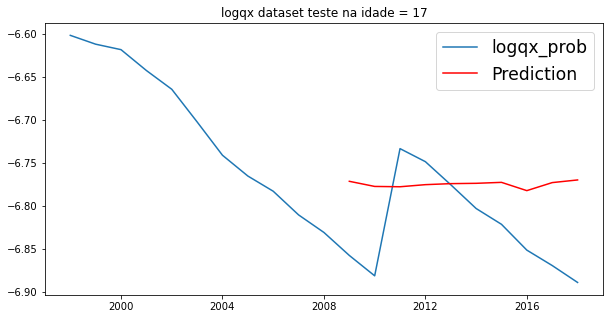

rmse:  [0.07252599]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0744 - mae: 0.1958
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0619 - mae: 0.1712
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0499 - mae: 0.1704
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0337 - mae: 0.1457
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0570 - mae: 0.1842
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0402 - mae: 0.1486
Epoch 7/500
1/1 [==============================] - 0s 967us/step - loss: 0.0398 - mae: 0.1618
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0286 - mae: 0.1363
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0336 - mae: 0.1555
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0278 - mae: 0.1479
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0998
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0958
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0778
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0151 - mae: 0.0993
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0890
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0143 - mae: 0.0974
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0954
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - mae: 0.0949
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0727
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0955
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - ma

Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0436
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0467
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0620
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0470
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0490
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0485
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0554
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0559
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0466
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0607
Epoch 185/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0518
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0422
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0392
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0474
Epoch 266/500
1/1 [==============================] - 0s 971us/step - loss: 0.0044 - mae: 0.0512
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0417
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0548
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0450
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0464
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0431
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0476
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0362
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0464
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4515e-04 - mae: 0.0199
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0309
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0359
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0369
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0460
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0364
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0337
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0297
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0304
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0266
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0358
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0324
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0467
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0358
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0234
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0414
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0420
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0

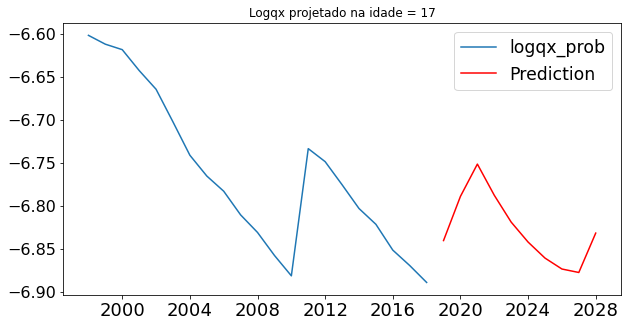

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1134 - mae: 0.2717
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1029 - mae: 0.2602
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0863 - mae: 0.2386
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0952 - mae: 0.2505
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0835 - mae: 0.2383
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0841 - mae: 0.2284
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0757 - mae: 0.2265
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0673 - mae: 0.2085
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0715 - mae: 0.2169
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0619 - mae: 0.1964
Epoch 11/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0615 

1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - mae: 0.1231
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0270 - mae: 0.1452
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0194 - mae: 0.1196
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mae: 0.1312
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0211 - mae: 0.1169
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0209 - mae: 0.1242
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0231 - mae: 0.1272
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0155 - mae: 0.1030
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0207 - mae: 0.1280
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0143 - mae: 0.0910
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0214 - mae: 0.1293
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1038
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1108
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0205 - mae: 0.1304
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1028
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0235 - mae: 0.1371
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0136 - mae: 0.0870
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1072
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.1015
Epoch 185/500
1/1 [==============================] - 0s 942us/step - loss: 0.0232 - mae: 0.1274
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0176 - mae: 0.1195
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.0977
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0121 - mae: 0.0958
Epoch 266/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0092 - mae: 0.0825
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0158 - mae: 0.1030
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0164 - mae: 0.1187
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1005
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.1013
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0227 - mae: 0.1264
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0201 - mae: 0.1100
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0117 - mae: 0.0855
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0144 - mae: 0.1058
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0757
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0192 - mae: 0.1174
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0120 - mae: 0.0995
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.0982
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0975
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1113
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0127 - mae: 0.1001
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0155 - mae: 0.1031
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1056
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0123 - mae: 0.0926
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0093 - mae: 0.0646
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0135 - mae: 0.1060
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0144 - mae: 0.0923
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0086 - mae: 0.0772
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0099 - mae: 0.0817
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0103 - mae: 0.0811
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.1056
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.1115
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

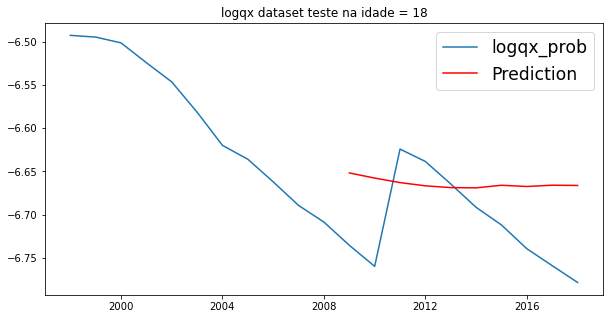

rmse:  [0.0699429]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0580 - mae: 0.1951
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0495 - mae: 0.1759
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0472 - mae: 0.1800
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1571
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0360 - mae: 0.1597
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0338 - mae: 0.1585
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0344 - mae: 0.1518
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0310 - mae: 0.1502
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0288 - mae: 0.1450
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0290 - mae: 0.1445
Epoch 11/500
1/1 [==============================] - 0s 1ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0664
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0590
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - mae: 0.0822
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0542
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0678
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0632
Epoch 94/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0067 - mae: 0.0632
Epoch 95/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0462
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0700
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0412
Epoch 98/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0037 - m

1/1 [==============================] - 0s 20ms/step - loss: 0.0022 - mae: 0.0366
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0471
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0693
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0337
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0505
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0537
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0582
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0507
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0364
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0553
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0423
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0473
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0519
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0369
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0392
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0437
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0414
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0425
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0453
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0339
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0381
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0372
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0312
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0444
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0401
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0551
Epoch 355/500
1/1 [==============================] - 0s 968us/step - loss: 0.0033 - mae: 0.0376
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0345
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0341
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0343
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 15ms/step - loss: 0.0018 - mae: 0.0349
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0262
Epoch 438/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0022 - mae: 0.0356
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0347
Epoch 440/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0028 - mae: 0.0417
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0366
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0404
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0257
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0406
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0254
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

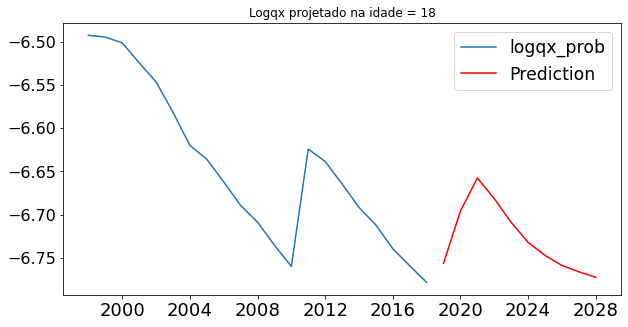

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0912 - mae: 0.2579
Epoch 2/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0854 - mae: 0.2439
Epoch 3/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0810 - mae: 0.2423
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0730 - mae: 0.2267
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0715 - mae: 0.2287
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0705 - mae: 0.2223
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0644 - mae: 0.2134
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0602 - mae: 0.1988
Epoch 9/500
1/1 [==============================] - 0s 969us/step - loss: 0.0561 - mae: 0.1943
Epoch 10/500
1/1 [==============================] - 0s 899us/step - loss: 0.0521 - mae: 0.1863
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0

1/1 [==============================] - 0s 3ms/step - loss: 0.0202 - mae: 0.1178
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - mae: 0.1241
Epoch 91/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0152 - mae: 0.1077
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.0888
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1113
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.1028
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0149 - mae: 0.1024
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0225 - mae: 0.1347
Epoch 97/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0206 - mae: 0.1145
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0179 - mae: 0.1207
Epoch 99/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0145 - m

1/1 [==============================] - 0s 5ms/step - loss: 0.0178 - mae: 0.1181
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1112
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0164 - mae: 0.1066
Epoch 178/500
1/1 [==============================] - 0s 968us/step - loss: 0.0190 - mae: 0.1193
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1090
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1021
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0168 - mae: 0.1090
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0144 - mae: 0.1074
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0145 - mae: 0.1159
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.1117
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0117 - mae: 0.0888
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1039
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0189 - mae: 0.1233
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1154
Epoch 266/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0186 - mae: 0.1134
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0143 - mae: 0.1046
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0158 - mae: 0.1012
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0158 - mae: 0.1099
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0144 - mae: 0.1053
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.0991
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0961
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1055
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0948
Epoch 352/500
1/1 [==============================] - 0s 995us/step - loss: 0.0176 - mae: 0.1139
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0153 - mae: 0.1045
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0181 - mae: 0.1223
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0136 - mae: 0.1028
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0889
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - mae: 0.0981
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0148 - mae: 0.1046
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0159 - mae: 0.1040
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0181 - mae: 0.1130
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - mae: 0.0887
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.1132
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0147 - mae: 0.1041
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0920
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.1130
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0220 - mae: 0.1234
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0118 - mae: 0.0911
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0970
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

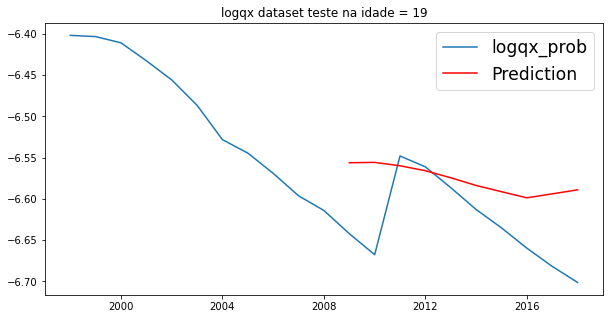

rmse:  [0.06854161]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0492 - mae: 0.1816
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0439 - mae: 0.1753
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0490 - mae: 0.1863
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0455 - mae: 0.1787
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0386 - mae: 0.1634
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0350 - mae: 0.1583
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0331 - mae: 0.1536
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0351 - mae: 0.1569
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0351 - mae: 0.1576
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0295 - mae: 0.1436
Epoch 11/500
1/1 [==============================] - 0s 1ms/

Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0949
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0835
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0103 - mae: 0.0819
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0109 - mae: 0.0846
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0110 - mae: 0.0860
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0884
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.0995
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0937
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1022
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0870
Epoch 99/500
1/1 [==============================] - 0s 4ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0567
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0589
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0505
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0611
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0636
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0476
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0459
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0616
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0488
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0552
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0686
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0585
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0428
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0352
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0530
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0438
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0419
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0517
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0582
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0494
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0078 - mae: 0.0676
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0079 - mae: 0.0658
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0469
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0667
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - mae: 0.0726
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0607
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0399
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0661
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0473
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0422
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0441
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0559
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0630
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0715
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0461
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0472
Epoch 443/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0446
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0442
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0554
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0041 - mae: 0.0510
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

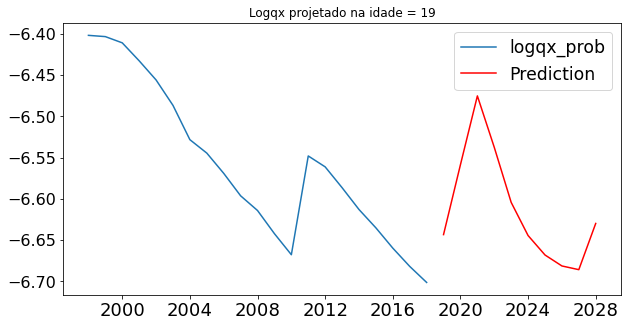

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0396 - mae: 0.1634
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0402 - mae: 0.1638
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0382 - mae: 0.1656
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0335 - mae: 0.1465
Epoch 5/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0324 - mae: 0.1572
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0332 - mae: 0.1444
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0346 - mae: 0.1611
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0264 - mae: 0.1437
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0270 - mae: 0.1445
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0307 - mae: 0.1506
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0276 

1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.1166
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1128
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0174 - mae: 0.1108
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1008
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1071
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0099 - mae: 0.0796
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.1108
Epoch 96/500
1/1 [==============================] - 0s 998us/step - loss: 0.0136 - mae: 0.0930
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - mae: 0.0907
Epoch 98/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0138 - mae: 0.0998
Epoch 99/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0176 -

1/1 [==============================] - 0s 3ms/step - loss: 0.0120 - mae: 0.0894
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0181 - mae: 0.1219
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0766
Epoch 179/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0131 - mae: 0.1034
Epoch 180/500
1/1 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.117 - 0s 2ms/step - loss: 0.0168 - mae: 0.1172
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0190 - mae: 0.1289
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0118 - mae: 0.1009
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.1066
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0141 - mae: 0.1041
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0102 - mae: 0.0903
Epoch 186/500
1/1 [=================

1/1 [==============================] - 0s 4ms/step - loss: 0.0119 - mae: 0.0983
Epoch 263/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0124 - mae: 0.1075
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0111 - mae: 0.0822
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0158 - mae: 0.1097
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0141 - mae: 0.1004
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0928
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0868
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0125 - mae: 0.1016
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0850
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0813
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0133 - mae: 0.0993
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.1038
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0097 - mae: 0.0908
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.0881
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0095 - mae: 0.0751
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0763
Epoch 355/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0131 - mae: 0.1007
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0807
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0860
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0966
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - mae: 0.0858
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - mae: 0.0804
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0754
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0771
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - mae: 0.0846
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0093 - mae: 0.0874
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0715
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0792
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0089 - mae: 0.0833
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0124 - mae: 0.0879
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss: 0

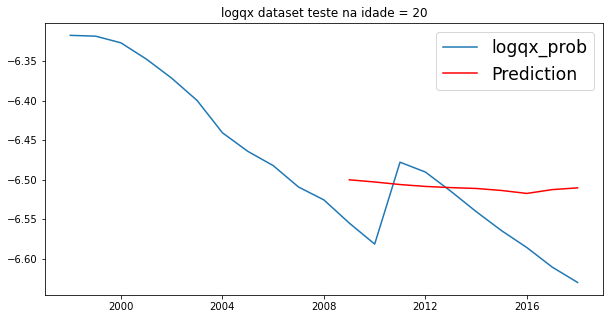

rmse:  [0.06508625]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0417 - mae: 0.1673
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0455 - mae: 0.1773
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0431 - mae: 0.1670
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0427 - mae: 0.1687
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0399 - mae: 0.1662
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0312 - mae: 0.1432
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0405 - mae: 0.1670
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0314 - mae: 0.1457
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0297 - mae: 0.1431
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0325 - mae: 0.1513
Epoch 11/500
1/1 [==============================] - 0s 7ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0165 - mae: 0.1075
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0116 - mae: 0.0889
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0920
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.1024
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0153 - mae: 0.1068
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0158 - mae: 0.1128
Epoch 94/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0139 - mae: 0.1046
Epoch 95/500
1/1 [==============================] - 0s 970us/step - loss: 0.0136 - mae: 0.0992
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.0940
Epoch 97/500
1/1 [==============================] - 0s 743us/step - loss: 0.0120 - mae: 0.0939
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0163

1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0567
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0667
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0555
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0465
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0424
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0811
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0657
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0596
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0733
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0747
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0467
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0506
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0473
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0520
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0611
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0539
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0620
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0397
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0489
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0400
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0466
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0401
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0470
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0498
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0522
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0533
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0589
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0396
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0492
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0540
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0317
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0472
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0545
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0431
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0410
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0467
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0317
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0393
Epoch 444/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0417
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0317
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

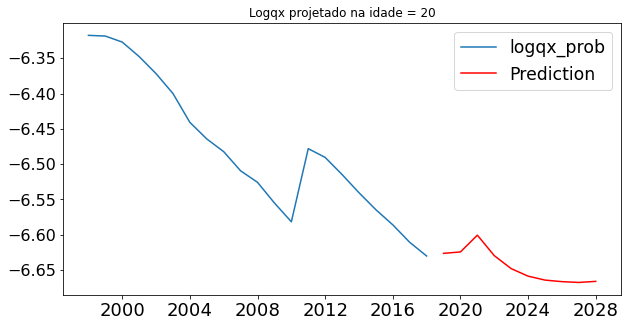

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0639 - mae: 0.2204
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0533 - mae: 0.2038
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0537 - mae: 0.2074
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0391 - mae: 0.1663
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0435 - mae: 0.1776
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0370 - mae: 0.1635
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0376 - mae: 0.1658
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0341 - mae: 0.1659
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1524
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0220 - mae: 0.1272
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0253 

1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.0986
Epoch 90/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0136 - mae: 0.1060
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0755
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - mae: 0.1025
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0933
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0717
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0931
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0951
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0971
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0822
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - m

1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.1059
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0811
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0858
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0098 - mae: 0.0833
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0113 - mae: 0.0982
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0126 - mae: 0.0933
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0102 - mae: 0.0859
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0992
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0867
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0107 - mae: 0.0815
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0858
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0159 - mae: 0.1077
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0092 - mae: 0.0822
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0909
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0852
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0986
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0974
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0753
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0952
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0886
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0931
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0968
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.1076
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0855
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.0963
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0767
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0759
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0115 - mae: 0.0941
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0782
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - mae: 0.0900
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0818
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0836
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - mae: 0.0911
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0091 - mae: 0.0777
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0919
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0107 - mae: 0.0927
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0098 - mae: 0.0813
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0750
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0089 - mae: 0.0820
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0923
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

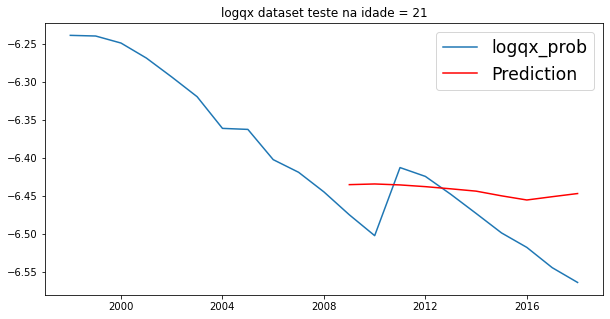

rmse:  [0.0604358]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0339 - mae: 0.1587
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0383 - mae: 0.1662
Epoch 3/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0312 - mae: 0.1472
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0333 - mae: 0.1554
Epoch 5/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0321 - mae: 0.1498
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0290 - mae: 0.1426
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0263 - mae: 0.1350
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0289 - mae: 0.1386
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0257 - mae: 0.1318
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0280 - mae: 0.1364
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0992
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0145 - mae: 0.1027
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0160 - mae: 0.1129
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1057
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0891
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.0970
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.1046
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0126 - mae: 0.0962
Epoch 96/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0156 - mae: 0.1056
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0136 - mae: 0.0970
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0126 - mae: 0.0936
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0120 - mae: 0.0941
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0790
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0126 - mae: 0.0957
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0904
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0150 - mae: 0.1074
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0131 - mae: 0.0971
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0888
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - mae: 0.0868
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.0926
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0809
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0712
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0643
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0696
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0711
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0684
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0528
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0549
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0640
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0746
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0499
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0409
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0525
Epoch 352/500
1/1 [==============================] - 0s 941us/step - loss: 0.0055 - mae: 0.0598
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0524
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0669
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0406
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0436
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0575
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0476
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0570
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0549
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0443
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0599
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0359
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0657
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0608
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0576
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0679
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0530
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

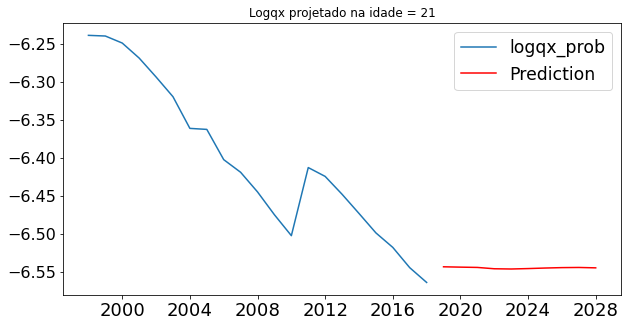

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0251 - mae: 0.1377
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0266 - mae: 0.1383
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1387
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0252 - mae: 0.1314
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0238 - mae: 0.1375
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0185 - mae: 0.1220
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0155 - mae: 0.1140
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1034
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0904
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0147 - mae: 0.1041
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 

1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0928
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0766
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0890
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.1030
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0094 - mae: 0.0855
Epoch 93/500
1/1 [==============================] - 0s 991us/step - loss: 0.0092 - mae: 0.0794
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0093 - mae: 0.0857
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0582
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0813
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0839
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - 

1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0652
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0893
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0086 - mae: 0.0825
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0109 - mae: 0.0895
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0778
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0799
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0876
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0620
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0083 - mae: 0.0810
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0840
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0717
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0079 - mae: 0.0804
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0101 - mae: 0.0843
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0563
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0804
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0702
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0672
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0644
Epoch 270/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0076 - mae: 0.0785
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0820
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0073 - mae: 0.0696
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0737
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0073 - mae: 0.0751
Epoch 352/500
1/1 [==============================] - 0s 997us/step - loss: 0.0071 - mae: 0.0740
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0701
Epoch 354/500
1/1 [==============================] - 0s 939us/step - loss: 0.0057 - mae: 0.0620
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0693
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0724
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0675
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0745
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0692
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0080 - mae: 0.0745
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0670
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0670
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0641
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0447
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0743
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0618
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0731
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0628
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

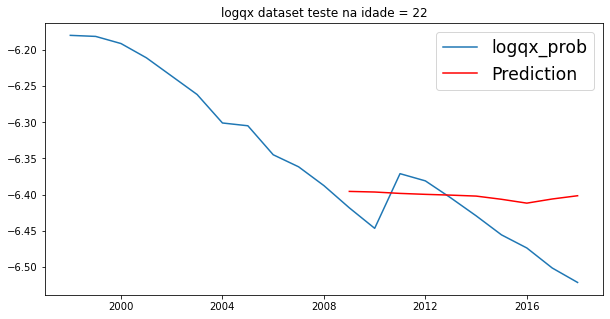

rmse:  [0.05894817]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0348 - mae: 0.1634
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0316 - mae: 0.1539
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0283 - mae: 0.1419
Epoch 4/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0246 - mae: 0.1313
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0231 - mae: 0.1249
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0201 - mae: 0.1154
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0177 - mae: 0.1016
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0138 - mae: 0.0957
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.1127
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0161 - mae: 0.1049
Epoch 11/500
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0760
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0872
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0837
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0904
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0150 - mae: 0.1052
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0960
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0873
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0838
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0916
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0964
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0829
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0901
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0883
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0117 - mae: 0.0941
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0961
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0912
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0132 - mae: 0.1010
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0154 - mae: 0.1065
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0098 - mae: 0.0830
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - mae: 0.0980
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0617
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0112 - mae: 0.0882
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0679
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0610
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0683
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0911
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0644
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0095 - mae: 0.0778
Epoch 270/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0700
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0749
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0552
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0565
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0586
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0439
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0524
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0593
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0465
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0492
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0536
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0491
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0543
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0559
Epoch 438/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0706
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0549
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0464
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0378
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0081 - mae: 0.0793
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0579
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0476
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0373
Epoch 446/500
1/1 [==============================] - 0s 8ms/step - loss: 0

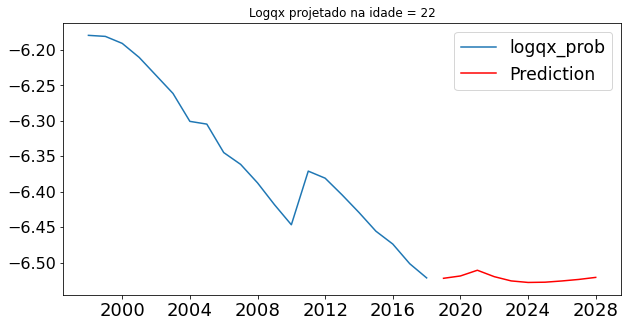

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0267 - mae: 0.1436
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0256 - mae: 0.1384
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0208 - mae: 0.1286
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1213
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1200
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0146 - mae: 0.1072
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0973
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0091 - mae: 0.0809
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - mae: 0.0864
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0670
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 

1/1 [==============================] - 0s 2ms/step - loss: 0.0079 - mae: 0.0791
Epoch 90/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0063 - mae: 0.0697
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0701
Epoch 92/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0064 - mae: 0.0733
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0643
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0818
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0866
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0680
Epoch 97/500
1/1 [==============================] - 0s 983us/step - loss: 0.0068 - mae: 0.0731
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0699
Epoch 99/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0068 

1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0670
Epoch 177/500
1/1 [==============================] - 0s 986us/step - loss: 0.0054 - mae: 0.0701
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0808
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0721
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0645
Epoch 181/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0054 - mae: 0.0687
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0690
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0643
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0695
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0645
Epoch 186/500
1/1 [==============================] - 0s 5ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0725
Epoch 264/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0056 - mae: 0.0681
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0780
Epoch 266/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0632
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0714
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0752
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0684
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0663
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0680
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0673
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0617
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0681
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0709
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0647
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0620
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0684
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0623
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0705
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0584
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0584
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0668
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0623
Epoch 439/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0045 - mae: 0.0600
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0593
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0728
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0646
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0656
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0665
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0616
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0631
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

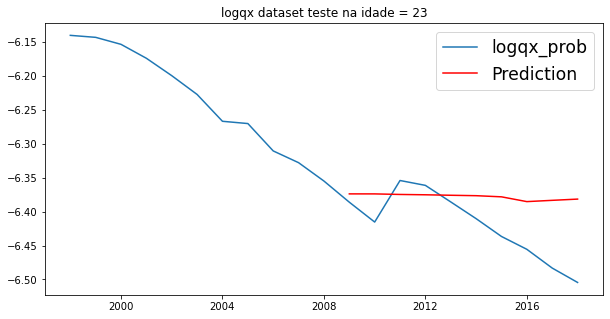

rmse:  [0.06100971]
Epoch 1/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0323 - mae: 0.1591
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0332 - mae: 0.1572
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0262 - mae: 0.1422
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0250 - mae: 0.1386
Epoch 5/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0204 - mae: 0.1217
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1228
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0908
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0772
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0938
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.1063
Epoch 11/500
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0749
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0079 - mae: 0.0739
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0095 - mae: 0.0855
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0088 - mae: 0.0815
Epoch 92/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0098 - mae: 0.0869
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0767
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0746
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0700
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - mae: 0.0793
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0103 - mae: 0.0795
Epoch 98/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0114 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0711
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0618
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mae: 0.0937
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0774
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0092 - mae: 0.0848
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0771
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0663
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0807
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0631
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0818
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0673
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0656
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0671
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0075 - mae: 0.0739
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0775
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0637
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0069 - mae: 0.0702
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0697
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0750
Epoch 271/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0060 - mae: 0.0669
Epoch 272/500
1/1 [==============================] - 0s 7ms/step - loss: 0

1/1 [==============================] - 0s 969us/step - loss: 0.0055 - mae: 0.0621
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0617
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0673
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0552
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0696
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0561
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0729
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0726
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0473
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0640
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0519
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0513
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0520
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0492
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0520
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0480
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0543
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0400
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0613
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0435
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

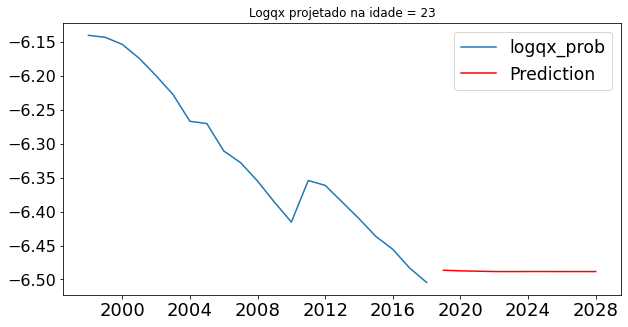

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0150 - mae: 0.1030
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0836
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0980
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0080 - mae: 0.0746
Epoch 5/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0728
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0084 - mae: 0.0788
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0622
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0611
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0573
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0562
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 

1/1 [==============================] - 0s 17ms/step - loss: 0.0041 - mae: 0.0530
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0633
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0618
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0495
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0580
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0582
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0657
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0680
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0612
Epoch 98/500
1/1 [==============================] - 0s 897us/step - loss: 0.0071 - mae: 0.0710
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0549
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0476
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0499
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0545
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0552
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0553
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0578
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0481
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0590
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0595
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0661
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0504
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0606
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0547
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0535
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0585
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0520
Epoch 270/500
1/1 [==============================] - 0s 973us/step - loss: 0.0036 - mae: 0.0526
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0517
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0596
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0448
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0386
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0476
Epoch 353/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0459
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0520
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0529
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0559
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0533
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0580
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0602
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0023 - mae: 0.0334
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0460
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0540
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0497
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0534
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0486
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0498
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0478
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0537
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0445
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

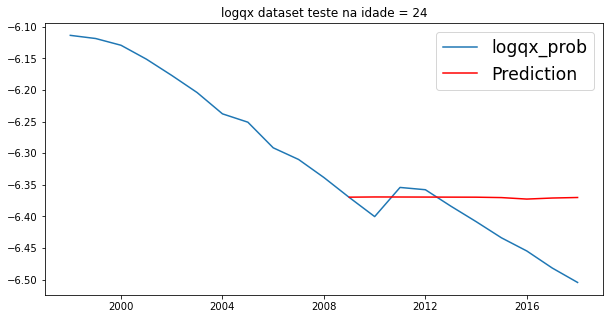

rmse:  [0.06646321]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0254 - mae: 0.1399
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0266 - mae: 0.1446
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0182 - mae: 0.1131
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0815
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0824
Epoch 6/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0770
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0905
Epoch 8/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0207 - mae: 0.1072
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0647
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0554
Epoch 11/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0557
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0572
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0715
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0620
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0638
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0574
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0764
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0651
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0585
Epoch 97/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0055 - mae: 0.0632
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - m

1/1 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0612
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0567
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0585
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0664
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0078 - mae: 0.0764
Epoch 180/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0064 - mae: 0.0677
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0701
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0604
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0638
Epoch 184/500
1/1 [==============================] - 0s 27ms/step - loss: 0.0053 - mae: 0.0655
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0612
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0519
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0632
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0688
Epoch 266/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0079 - mae: 0.0769
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0665
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0758
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0586
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0481
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0768
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0070 - mae: 0.0706
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0686
Epoch 351/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0063 - mae: 0.0666
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0703
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0575
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0519
Epoch 355/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0613
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0689
Epoch 357/500
1/1 [==============================] - 0s 991us/step - loss: 0.0045 - mae: 0.0589
Epoch 358/500
1/1 [==============================] - 0s 989us/step - loss: 0.0048 - mae: 0.0625
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0659
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0065 - mae: 0.0689
Epoch 438/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0754
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0657
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0575
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0576
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0615
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0610
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0526
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0546
Epoch 446/500
1/1 [==============================] - 0s 16ms/step - loss: 

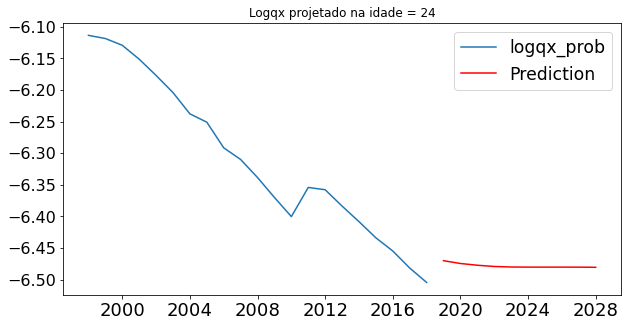

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0834
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0782
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0696
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0590
Epoch 5/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0081 - mae: 0.0689
Epoch 6/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0083 - mae: 0.0698
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0534
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0066 - mae: 0.0585
Epoch 9/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0540
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0414
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042

1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0637
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0465
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0564
Epoch 92/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0025 - mae: 0.0420
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0444
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0422
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0428
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0572
Epoch 97/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0524
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0393
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0492
Epoch 177/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0040 - mae: 0.0522
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0452
Epoch 179/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0032 - mae: 0.0507
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0374
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0447
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0413
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0388
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0429
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0551
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0342
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0429
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0386
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0426
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0421
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0357
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0562
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0437
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0423
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0421
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0253
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0332
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0341
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0353
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0446
Epoch 355/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0409
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0390
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0347
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0337
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 9.6353e-04 - mae: 0.0223
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0301
Epoch 438/500
1/1 [==============================] - 0s 23ms/step - loss: 0.0017 - mae: 0.0381
Epoch 439/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0014 - mae: 0.0349
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0344
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0290
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0356
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0276
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0319
Epoch 445/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0013 - mae: 0.0355
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0451
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss

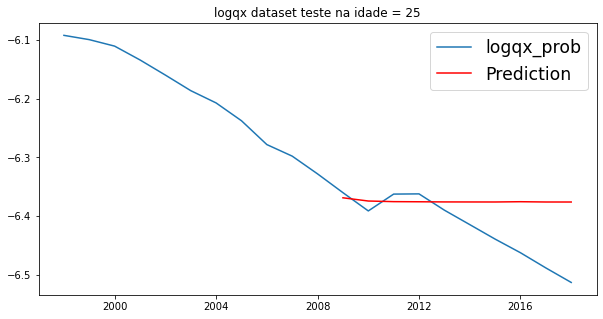

rmse:  [0.06722302]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0359 - mae: 0.1633
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0297 - mae: 0.1419
Epoch 3/500
1/1 [==============================] - 0s 741us/step - loss: 0.0236 - mae: 0.1270
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0231 - mae: 0.1306
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0215 - mae: 0.1232
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0121 - mae: 0.0957
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0102 - mae: 0.0912
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - mae: 0.0922
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0951
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0099 - mae: 0.0927
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0506
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0538
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0591
Epoch 91/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0524
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0518
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0589
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0460
Epoch 95/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0056 - mae: 0.0668
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0624
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0506
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0538
Epoch 176/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0578
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0509
Epoch 178/500
1/1 [==============================] - 0s 980us/step - loss: 0.0040 - mae: 0.0500
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0468
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0514
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0500
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0511
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0672
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0549
Epoch 185/500
1/1 [==============================] - 0s 999us/step - los

1/1 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0368
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0418
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0510
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0484
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0362
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0356
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0461
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0427
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0326
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0494
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0290
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0361
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0279
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0300
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0326
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0335
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0341
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0440
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0493
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0370
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0342
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0343
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0396
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0351
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0435
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0371
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0452
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0240
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3135e-04 - mae: 0.0243
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0365
Epoch 446/500
1/1 [==============================] - 0s 

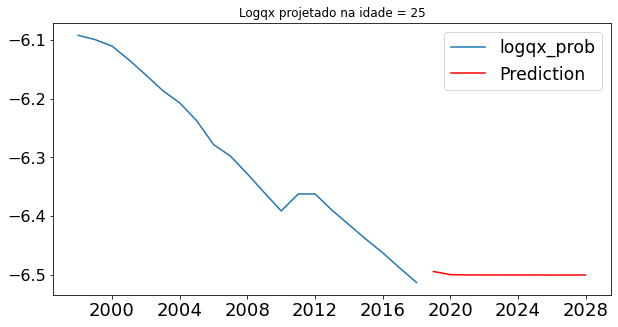

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0185 - mae: 0.1067
Epoch 2/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0123 - mae: 0.0857
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0664
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0579
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0561
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0840
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0503
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0470
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0469
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0623
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0463
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0485
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0383
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0409
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0596
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0431
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0354
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0444
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0347
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0577
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0368
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0439
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0390
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0433
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0301
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0325
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0363
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0251
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0293
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0320
Epoch 186/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0351
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0327
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0366
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0332
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0435
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0310
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0388
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0325
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0386
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0314
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0313
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0464
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0336
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0347
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0380
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0348
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0397
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0436
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0466
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0308
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 5ms/step - loss: 9.6451e-04 - mae: 0.0291
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0307
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0317
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 7.8129e-04 - mae: 0.0257
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0390
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 8.4762e-04 - mae: 0.0213
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0378
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2054e-04 - mae: 0.0242
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0315
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0385
Epoch 445/500
1/1 [==============================] - 0s 3m

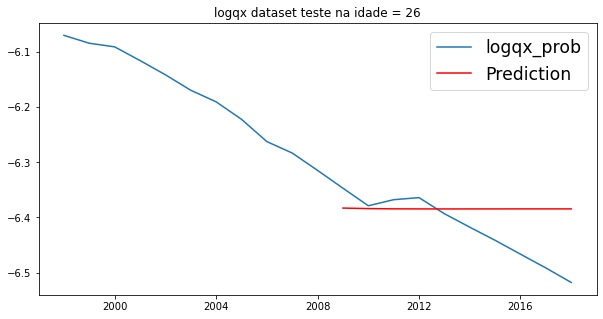

rmse:  [0.06518821]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0234 - mae: 0.1345
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0186 - mae: 0.1169
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.0989
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0803
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - mae: 0.0799
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.0892
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0646
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0595
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0548
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0563
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0460
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0312
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0454
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0544
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0442
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0444
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0479
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0493
Epoch 96/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0023 - mae: 0.0398
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0432
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - m

1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0473
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0510
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0516
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0480
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0391
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0374
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0300
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0342
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0414
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0501
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0372
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0387
Epoch 263/500
1/1 [==============================] - 0s 988us/step - loss: 0.0012 - mae: 0.0250
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0395
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0360
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0346
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0354
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0375
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0477
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0350
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0399
Epoch 348/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0278
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0358
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0382
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3768e-04 - mae: 0.0255
Epoch 352/500
1/1 [==============================] - 0s 6ms/step - loss: 9.8537e-04 - mae: 0.0262
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0413
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0285
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0310
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0415
Epoch 357/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0308
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0335
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0312
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0298
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0309
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0261
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0444
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0320
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0279
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0291
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0

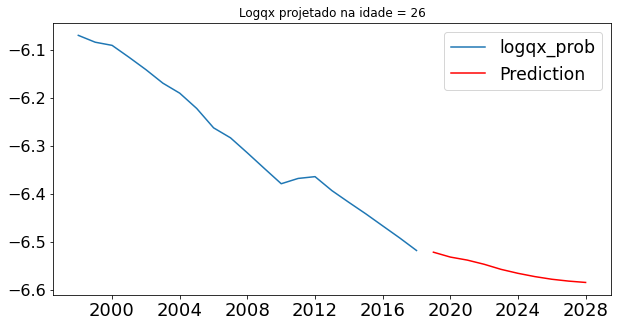

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0191 - mae: 0.1109
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0172 - mae: 0.1056
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0901
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0152 - mae: 0.0948
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0144 - mae: 0.0861
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - mae: 0.0762
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0741
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0081 - mae: 0.0699
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0614
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0576
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 

1/1 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0363
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0379
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9370e-04 - mae: 0.0239
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0305
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0620
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0344
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0395
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0384
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0306
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0321
Epoch 99/500
1/1 [==============================] - 0s 23ms/step - loss: 0.0043

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0345
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0427
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0317
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 8.2932e-04 - mae: 0.0227
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0317
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0305
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0312
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0251
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 6.5461e-04 - mae: 0.0172
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 7.5682e-04 - mae: 0.0252
Epoch 185/500
1/1 [==============================] - 0s 1ms/st

1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0452
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0348
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 4.3497e-04 - mae: 0.0170
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0392
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0484
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 8.3699e-04 - mae: 0.0245
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1074e-04 - mae: 0.0206
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 8.0488e-04 - mae: 0.0254
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0324
Epoch 270/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0364
Epoch 271/500
1/1 [==============================] - 0s 7m

1/1 [==============================] - 0s 1ms/step - loss: 7.5787e-04 - mae: 0.0235
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0233
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0313
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 6.3709e-04 - mae: 0.0217
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 6.6338e-04 - mae: 0.0249
Epoch 352/500
1/1 [==============================] - 0s 14ms/step - loss: 9.5641e-04 - mae: 0.0301
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0392
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0323
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0304
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 5.1615e-04 - mae: 0.0176
Epoch 357/500
1/1 [==============================] - 

1/1 [==============================] - 0s 15ms/step - loss: 0.0013 - mae: 0.0304
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7904e-04 - mae: 0.0248
Epoch 434/500
1/1 [==============================] - 0s 847us/step - loss: 7.0905e-04 - mae: 0.0215
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 9.7875e-04 - mae: 0.0247
Epoch 436/500
1/1 [==============================] - 0s 771us/step - loss: 0.0012 - mae: 0.0272
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0275
Epoch 438/500
1/1 [==============================] - 0s 956us/step - loss: 0.0014 - mae: 0.0334
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6337e-04 - mae: 0.0252
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7490e-04 - mae: 0.0278
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0397
Epoch 442/500
1/1 [============================

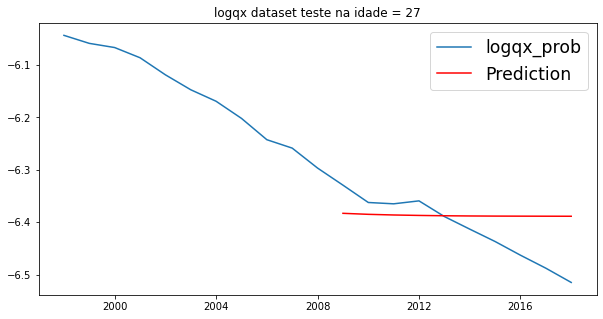

rmse:  [0.06248602]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1012
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.1001
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0835
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0683
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.0897
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0729
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0371
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0687
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0575
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0593
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0443
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0337
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0284
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0516
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0431
Epoch 93/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0337
Epoch 94/500
1/1 [==============================] - 0s 975us/step - loss: 0.0015 - mae: 0.0308
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0349
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0363
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0448
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - 

1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0329
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0349
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0305
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0346
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0314
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0321
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0283
Epoch 181/500
1/1 [==============================] - 0s 969us/step - loss: 0.0010 - mae: 0.0264
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0279
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 4.5725e-04 - mae: 0.0171
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - l

1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0297
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 9.0010e-04 - mae: 0.0230
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0262
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 4.5661e-04 - mae: 0.0196
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0267
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 5.7411e-04 - mae: 0.0210
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8045e-04 - mae: 0.0208
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8721e-04 - mae: 0.0209
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 6.2644e-04 - mae: 0.0222
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 9.9014e-04 - mae: 0.0259
Epoch 270/500
1/1 [===========================

1/1 [==============================] - 0s 1ms/step - loss: 4.5426e-04 - mae: 0.0145
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 5.0868e-04 - mae: 0.0200
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9075e-04 - mae: 0.0211
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 8.6651e-04 - mae: 0.0195
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9999e-04 - mae: 0.0191
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2305e-04 - mae: 0.0221
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 5.0607e-04 - mae: 0.0205
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 5.4225e-04 - mae: 0.0184
Epoch 353/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0258
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7418e-04 - mae: 0.0211
Epoch 355/500
1/1 [===================

1/1 [==============================] - 0s 7ms/step - loss: 9.4636e-04 - mae: 0.0259
Epoch 431/500
1/1 [==============================] - 0s 3ms/step - loss: 8.7858e-04 - mae: 0.0231
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0280
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0271
Epoch 434/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0255
Epoch 435/500
1/1 [==============================] - 0s 5ms/step - loss: 8.3230e-04 - mae: 0.0239
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 3.7021e-04 - mae: 0.0178
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 8.6986e-04 - mae: 0.0210
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0295
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0257
Epoch 440/500
1/1 [==============================] - 0

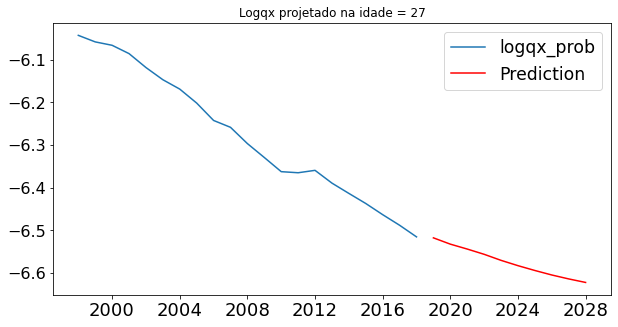

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0169 - mae: 0.1027
Epoch 2/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0151 - mae: 0.0977
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0142 - mae: 0.0879
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0841
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0587
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0632
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0078 - mae: 0.0606
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0569
Epoch 9/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0117 - mae: 0.0751
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0670
Epoch 11/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0078 

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0396
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 3.9536e-04 - mae: 0.0182
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0379
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0296
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0282
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0332
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0395
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0306
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0329
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 5.0767e-04 - mae: 0.0176
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0

Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8749e-04 - mae: 0.0238
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 6.0235e-04 - mae: 0.0216
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 6.8428e-04 - mae: 0.0220
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3571e-04 - mae: 0.0213
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0329
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5553e-04 - mae: 0.0243
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0355
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 5.9244e-04 - mae: 0.0217
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0307
Epoch 184/500
1/1 [==============================] - 0s 8ms/step - loss: 9.4844e-04 - mae: 0.0260
Epoch 185/500
1/1 [=============

1/1 [==============================] - 0s 1ms/step - loss: 7.8571e-04 - mae: 0.0215
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 7.1801e-04 - mae: 0.0255
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7649e-04 - mae: 0.0198
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 6.0982e-04 - mae: 0.0222
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9842e-04 - mae: 0.0198
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4831e-04 - mae: 0.0235
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0278
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0291
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0292
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0408
Epoch 270/500
1/1 [==============================]

1/1 [==============================] - 0s 1ms/step - loss: 8.0237e-04 - mae: 0.0224
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7201e-04 - mae: 0.0283
Epoch 347/500
1/1 [==============================] - 0s 3ms/step - loss: 9.3669e-04 - mae: 0.0282
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 6.5940e-04 - mae: 0.0238
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1595e-04 - mae: 0.0263
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3495e-04 - mae: 0.0249
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 9.9689e-04 - mae: 0.0235
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9640e-04 - mae: 0.0233
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8586e-04 - mae: 0.0208
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0274
Epoch 355/500
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 4.2136e-04 - mae: 0.0149
Epoch 430/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9065e-04 - mae: 0.0174
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 7.2935e-04 - mae: 0.0226
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 9.8980e-04 - mae: 0.0275
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9053e-04 - mae: 0.0241
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6823e-04 - mae: 0.0231
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 7.3439e-04 - mae: 0.0243
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 7.2075e-04 - mae: 0.0220
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6295e-04 - mae: 0.0234
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0318
Epoch 439/500
1/1 [===================

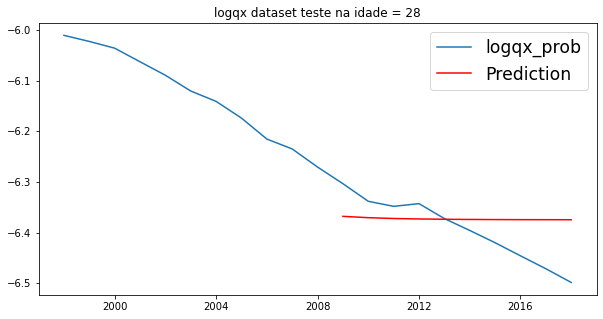

rmse:  [0.06253671]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0975
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.1006
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0802
Epoch 4/500
1/1 [==============================] - 0s 852us/step - loss: 0.0052 - mae: 0.0579
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0935
Epoch 6/500
1/1 [==============================] - 0s 981us/step - loss: 0.0127 - mae: 0.0908
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0655
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0724
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0611
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0707
Epoch 11/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0293
Epoch 89/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0297
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0290
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0295
Epoch 92/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0012 - mae: 0.0282
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0267
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 9.2336e-04 - mae: 0.0221
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 5.9070e-04 - mae: 0.0189
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0225
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0348
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 5.

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0219
Epoch 174/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9858e-04 - mae: 0.0241
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0279
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0278
Epoch 177/500
1/1 [==============================] - 0s 6ms/step - loss: 7.6649e-04 - mae: 0.0242
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 3.4288e-04 - mae: 0.0145
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0233
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 5.2395e-04 - mae: 0.0181
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0276
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0410
Epoch 183/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 8.2938e-04 - mae: 0.0246
Epoch 259/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0255
Epoch 260/500
1/1 [==============================] - 0s 3ms/step - loss: 9.7174e-04 - mae: 0.0250
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 9.6556e-04 - mae: 0.0263
Epoch 262/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0237
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0238
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0215
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0289
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0436
Epoch 267/500
1/1 [==============================] - 0s 6ms/step - loss: 7.8277e-04 - mae: 0.0221
Epoch 268/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 4ms/step - loss: 5.8797e-04 - mae: 0.0180
Epoch 344/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0296
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0331
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0290
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0263
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 4.8619e-04 - mae: 0.0185
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0318
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0231
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 6.0512e-04 - mae: 0.0195
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 8.9946e-04 - mae: 0.0253
Epoch 353/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 998us/step - loss: 0.0012 - mae: 0.0225
Epoch 429/500
1/1 [==============================] - 0s 1ms/step - loss: 7.2695e-04 - mae: 0.0214
Epoch 430/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0277
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0292
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0362
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 5.0099e-04 - mae: 0.0191
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 9.4786e-04 - mae: 0.0266
Epoch 435/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0254
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 4.1720e-04 - mae: 0.0167
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 4.6758e-04 - mae: 0.0181
Epoch 438/500
1/1 [==============================] -

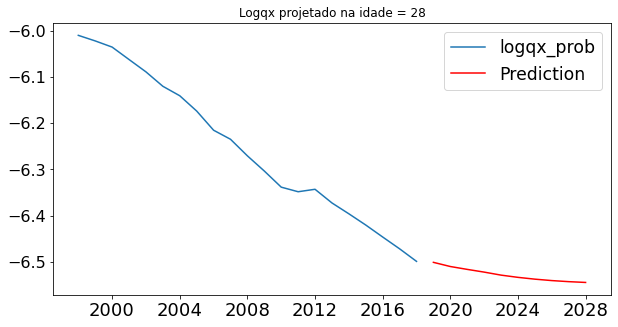

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0337 - mae: 0.1457
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0267 - mae: 0.1302
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0263 - mae: 0.1276
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0208 - mae: 0.1211
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1026
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.0975
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0165 - mae: 0.0936
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - mae: 0.0782
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0162 - mae: 0.0859
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0633
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 

1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0462
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0368
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0542
Epoch 92/500
1/1 [==============================] - 0s 976us/step - loss: 0.0022 - mae: 0.0386
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0549
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0465
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0539
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0393
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0692
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0503
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - 

1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0347
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0346
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0299
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0366
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0378
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0276
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0424
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0316
Epoch 183/500
1/1 [==============================] - 0s 943us/step - loss: 0.0014 - mae: 0.0303
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0388
Epoch 185/500
1/1 [==============================] - 0s 5ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0259
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 6.4368e-04 - mae: 0.0223
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0289
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0424
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 7.2973e-04 - mae: 0.0214
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0389
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 9.4270e-04 - mae: 0.0271
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0312
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0301
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0308
Epoch 270/500
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0385
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 5.8325e-04 - mae: 0.0200
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0319
Epoch 348/500
1/1 [==============================] - 0s 3ms/step - loss: 7.1081e-04 - mae: 0.0238
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 3.8234e-04 - mae: 0.0147
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 9.1205e-04 - mae: 0.0273
Epoch 351/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0320
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0339
Epoch 353/500
1/1 [==============================] - 0s 7ms/step - loss: 8.0482e-04 - mae: 0.0251
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0406
Epoch 355/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step - loss: 3.5717e-04 - mae: 0.0165
Epoch 430/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0324
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4797e-04 - mae: 0.0259
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0337
Epoch 433/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0432
Epoch 434/500
1/1 [==============================] - 0s 5ms/step - loss: 8.4674e-04 - mae: 0.0249
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 8.9708e-04 - mae: 0.0259
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 6.7969e-04 - mae: 0.0220
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3187e-04 - mae: 0.0235
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 5.5996e-04 - mae: 0.0207
Epoch 439/500
1/1 [===========================

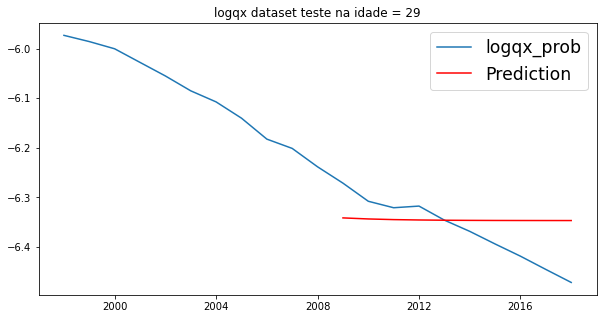

rmse:  [0.06386531]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1154
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0154 - mae: 0.1097
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0097 - mae: 0.0795
Epoch 4/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0595
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0715
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0909
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0132 - mae: 0.0917
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0688
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0613
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0585
Epoch 11/500
1/1 [==============================] - 0s 2ms/

Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0426
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0381
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0275
Epoch 92/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0035 - mae: 0.0442
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0339
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0380
Epoch 95/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0019 - mae: 0.0345
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0352
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0465
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0401
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0236
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 9.6237e-04 - mae: 0.0255
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9567e-04 - mae: 0.0212
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 6.2925e-04 - mae: 0.0220
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0285
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 5.0061e-04 - mae: 0.0149
Epoch 181/500
1/1 [==============================] - 0s 7ms/step - loss: 9.4108e-04 - mae: 0.0250
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0387
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0296
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0279
Epoch 185/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0285
Epoch 261/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0281
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0343
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 5.9476e-04 - mae: 0.0217
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 9.5623e-04 - mae: 0.0248
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0381
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0279
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 9.1777e-04 - mae: 0.0201
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 9.8773e-04 - mae: 0.0204
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 6.2703e-04 - mae: 0.0207
Epoch 270/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 10ms/step - loss: 7.0048e-04 - mae: 0.0204
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6307e-04 - mae: 0.0246
Epoch 347/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0354
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0293
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0235
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 6.9854e-04 - mae: 0.0230
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0306
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6372e-04 - mae: 0.0228
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0323
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9879e-04 - mae: 0.0207
Epoch 355/500
1/1 [==============================] - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0246
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0264
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0254
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 5.3308e-04 - mae: 0.0176
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0242
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0300
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 7.4513e-04 - mae: 0.0182
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 7.5999e-04 - mae: 0.0232
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0288
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0254
Epoch 440/500
1/1 [==============================] - 0s 1ms/st

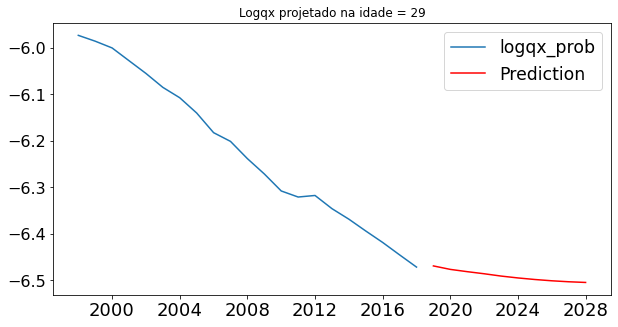

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0374 - mae: 0.1640
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0389 - mae: 0.1598
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0288 - mae: 0.1331
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0258 - mae: 0.1276
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0228 - mae: 0.1213
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0217 - mae: 0.1160
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0222 - mae: 0.1155
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.0852
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.0911
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - mae: 0.0861
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 

1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0487
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0507
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0328
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0417
Epoch 93/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0031 - mae: 0.0503
Epoch 94/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0020 - mae: 0.0373
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0524
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0440
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0419
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0474
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - 

1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0275
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0354
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0252
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3093e-04 - mae: 0.0184
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0534
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0742e-04 - mae: 0.0243
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0335
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0401
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 5.7941e-04 - mae: 0.0184
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0296
Epoch 185/500
1/1 [==============================] - 0s 1ms/st

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0334
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 9.2360e-04 - mae: 0.0238
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 8.3848e-04 - mae: 0.0272
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0273
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 5.1775e-04 - mae: 0.0192
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8952e-04 - mae: 0.0228
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0319
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0278
Epoch 268/500
1/1 [==============================] - 0s 9ms/step - loss: 7.3448e-04 - mae: 0.0235
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0374
Epoch 270/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step - loss: 2.8068e-04 - mae: 0.0139
Epoch 346/500
1/1 [==============================] - 0s 3ms/step - loss: 8.2393e-04 - mae: 0.0270
Epoch 347/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0018 - mae: 0.0337
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0302
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0296
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0296
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0262
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0278
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0330
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 4.5314e-04 - mae: 0.0187
Epoch 355/500
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 15ms/step - loss: 4.3377e-04 - mae: 0.0153
Epoch 431/500
1/1 [==============================] - 0s 3ms/step - loss: 6.3078e-04 - mae: 0.0197
Epoch 432/500
1/1 [==============================] - 0s 4ms/step - loss: 6.9979e-04 - mae: 0.0210
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9091e-04 - mae: 0.0241
Epoch 434/500
1/1 [==============================] - 0s 4ms/step - loss: 8.9951e-04 - mae: 0.0248
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3724e-04 - mae: 0.0236
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 7.0837e-04 - mae: 0.0246
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 5.6254e-04 - mae: 0.0196
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0308
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 1.0270e-04 - mae: 0.0095
Epoch 440/500
1/1 [==================

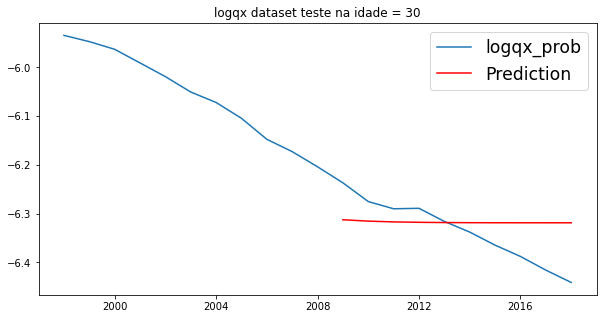

rmse:  [0.06369305]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.1017
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0122 - mae: 0.0988
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0713
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0665
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0942
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0606
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0686
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0530
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0409
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0497
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0337
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0349
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0439
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0379
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0420
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0513
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0435
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0372
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0025 - mae: 0.0380
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0297
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 8.7723e-04 

1/1 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0254
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9455e-04 - mae: 0.0263
Epoch 176/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0017 - mae: 0.0323
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0373
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0298
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3052e-04 - mae: 0.0214
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0287
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0331
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0275
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0273
Epoch 184/500
1/1 [==============================] - 0s 8ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 6.0089e-04 - mae: 0.0191
Epoch 260/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0272
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0399
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0380
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0276
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0259
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0250
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 2.5150e-04 - mae: 0.0135
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7866e-04 - mae: 0.0231
Epoch 269/500
1/1 [==============================] - 0s 1ms/st

1/1 [==============================] - 0s 3ms/step - loss: 6.8285e-04 - mae: 0.0187
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7379e-04 - mae: 0.0230
Epoch 346/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0213
Epoch 347/500
1/1 [==============================] - 0s 3ms/step - loss: 3.1924e-04 - mae: 0.0145
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7060e-04 - mae: 0.0230
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0273
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0325
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0312
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0314
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0213
Epoch 354/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 1ms/step - loss: 5.4154e-04 - mae: 0.0203
Epoch 430/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0254
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 3.4427e-04 - mae: 0.0168
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0254
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 6.0962e-04 - mae: 0.0171
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 5.4119e-04 - mae: 0.0205
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 9.5264e-04 - mae: 0.0255
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 8.5120e-04 - mae: 0.0222
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 6.9997e-04 - mae: 0.0210
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 5.8555e-04 - mae: 0.0185
Epoch 439/500
1/1 [=======================

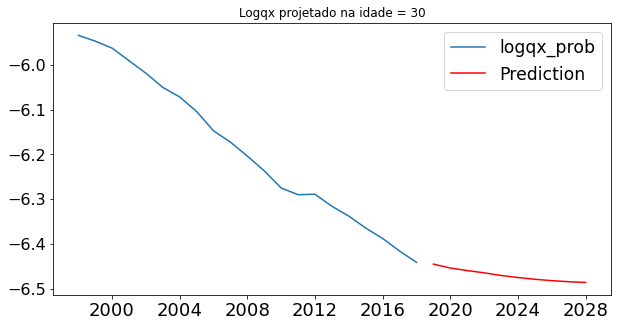

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0320 - mae: 0.1478
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0256 - mae: 0.1310
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0307 - mae: 0.1362
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0240 - mae: 0.1190
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.0989
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0125 - mae: 0.0875
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0168 - mae: 0.1000
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0141 - mae: 0.0816
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0640
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0604
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 

1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0293
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0444
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0463
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0429
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0306
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0414
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0481
Epoch 95/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0043 - mae: 0.0581
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 8.2473e-04 - mae: 0.0239
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0561
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 

1/1 [==============================] - 0s 1ms/step - loss: 3.5198e-04 - mae: 0.0144
Epoch 175/500
1/1 [==============================] - 0s 743us/step - loss: 0.0016 - mae: 0.0324
Epoch 176/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0376
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0269
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0349
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 3.7292e-04 - mae: 0.0160
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0281
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0342
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0263
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 5.8730e-04 - mae: 0.0169
Epoch 184/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0371
Epoch 259/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0279
Epoch 260/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0357
Epoch 261/500
1/1 [==============================] - 0s 4ms/step - loss: 7.9917e-04 - mae: 0.0229
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 2.0177e-04 - mae: 0.0123
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 8.1986e-04 - mae: 0.0204
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 4.3799e-04 - mae: 0.0196
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 3.2505e-04 - mae: 0.0144
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 4.6600e-04 - mae: 0.0149
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7323e-04 - mae: 0.0252
Epoch 268/500
1/1 [===========================

1/1 [==============================] - 0s 1ms/step - loss: 9.8297e-04 - mae: 0.0211
Epoch 343/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0410
Epoch 344/500
1/1 [==============================] - 0s 2ms/step - loss: 4.2086e-04 - mae: 0.0148
Epoch 345/500
1/1 [==============================] - 0s 2ms/step - loss: 4.0215e-04 - mae: 0.0174
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 6.0694e-04 - mae: 0.0225
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 1.6525e-04 - mae: 0.0095
Epoch 348/500
1/1 [==============================] - 0s 5ms/step - loss: 8.0677e-04 - mae: 0.0233
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6822e-04 - mae: 0.0198
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 5.5678e-04 - mae: 0.0196
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3194e-04 - mae: 0.0256
Epoch 352/500
1/1 [===================

1/1 [==============================] - 0s 1ms/step - loss: 6.9013e-04 - mae: 0.0240
Epoch 427/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0290
Epoch 428/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0288
Epoch 429/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0287
Epoch 430/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0309
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 2.5837e-04 - mae: 0.0116
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 3.6298e-04 - mae: 0.0176
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 4.8994e-04 - mae: 0.0184
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 4.4124e-04 - mae: 0.0199
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 2.7289e-04 - mae: 0.0146
Epoch 436/500
1/1 [==============================]

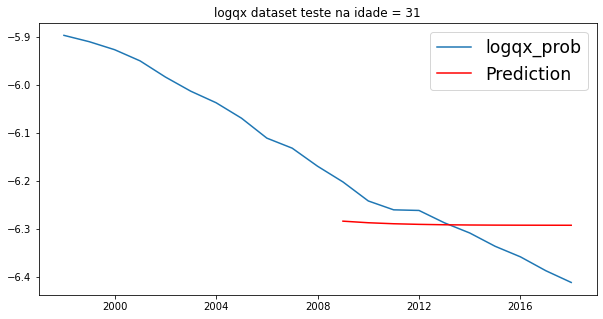

rmse:  [0.06350713]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.1023
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0915
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0694
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0513
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0557
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0642
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0700
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0625
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0496
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0477
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0450
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9920e-04 - mae: 0.0266
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0319
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0361
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0395
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0322
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0339
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0277
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0428
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0346
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 

1/1 [==============================] - 0s 17ms/step - loss: 0.0012 - mae: 0.0247
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5387e-04 - mae: 0.0226
Epoch 176/500
1/1 [==============================] - ETA: 0s - loss: 0.0015 - mae: 0.030 - 0s 3ms/step - loss: 0.0015 - mae: 0.0309
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0298
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0318
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0339
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9495e-04 - mae: 0.0201
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0385
Epoch 182/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0023 - mae: 0.0371
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7265e-04 - mae: 0.0238
Epoch 184/500
1/1 [====

1/1 [==============================] - 0s 15ms/step - loss: 0.0012 - mae: 0.0288
Epoch 260/500
1/1 [==============================] - 0s 3ms/step - loss: 5.2108e-04 - mae: 0.0174
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 8.7843e-04 - mae: 0.0207
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 5.8185e-04 - mae: 0.0221
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0283
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9495e-04 - mae: 0.0254
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3238e-04 - mae: 0.0250
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0280
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 5.3999e-04 - mae: 0.0176
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0301
Epoch 269/500
1/1 [==============================

1/1 [==============================] - 0s 1ms/step - loss: 8.9623e-04 - mae: 0.0231
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5964e-04 - mae: 0.0218
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0308
Epoch 347/500
1/1 [==============================] - 0s 5ms/step - loss: 7.9462e-04 - mae: 0.0226
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 4.5959e-04 - mae: 0.0168
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 5.0537e-04 - mae: 0.0162
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 6.8686e-04 - mae: 0.0220
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0315
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0393
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0304
Epoch 354/500
1/1 [==============================]

1/1 [==============================] - 0s 1ms/step - loss: 7.1893e-04 - mae: 0.0202
Epoch 430/500
1/1 [==============================] - 0s 2ms/step - loss: 4.2867e-04 - mae: 0.0163
Epoch 431/500
1/1 [==============================] - 0s 3ms/step - loss: 5.0461e-04 - mae: 0.0183
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0304
Epoch 433/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0302
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0280
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4464e-04 - mae: 0.0244
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 8.3869e-04 - mae: 0.0223
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 9.1828e-04 - mae: 0.0238
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 3.2462e-04 - mae: 0.0156
Epoch 439/500
1/1 [===========================

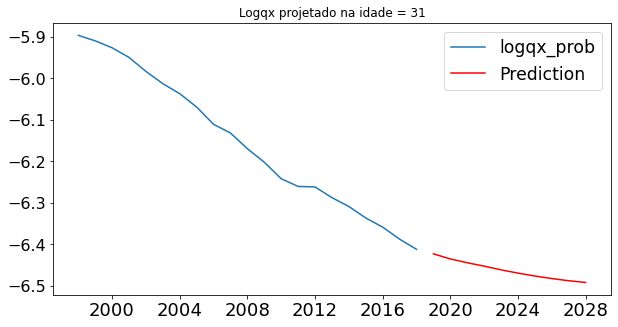

Epoch 1/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0284 - mae: 0.1294
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0212 - mae: 0.1101
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0192 - mae: 0.1104
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0193 - mae: 0.1033
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0211 - mae: 0.1052
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0164 - mae: 0.0951
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0149 - mae: 0.0922
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.0924
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0922
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.0876
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 

1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0320
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 7.2970e-04 - mae: 0.0247
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0366
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0421
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0494
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0340
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0537
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0488
Epoch 97/500
1/1 [==============================] - 0s 977us/step - loss: 0.0016 - mae: 0.0361
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0315
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.001

1/1 [==============================] - 0s 11ms/step - loss: 0.0013 - mae: 0.0304
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0384
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0295
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 5.4959e-04 - mae: 0.0163
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0295
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 8.2280e-04 - mae: 0.0281
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0296
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0312
Epoch 183/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0010 - mae: 0.0264
Epoch 184/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0019 - mae: 0.0337
Epoch 185/500
1/1 [==============================] - 0s 5ms/step

1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0266
Epoch 261/500
1/1 [==============================] - 0s 5ms/step - loss: 5.3114e-04 - mae: 0.0159
Epoch 262/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0268
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 8.5405e-04 - mae: 0.0269
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 4.2501e-04 - mae: 0.0150
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 5.4135e-04 - mae: 0.0190
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 3.7460e-04 - mae: 0.0167
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0312
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0251
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 5.3902e-04 - mae: 0.0185
Epoch 270/500
1/1 [==============================]

1/1 [==============================] - 0s 3ms/step - loss: 5.9210e-04 - mae: 0.0223
Epoch 345/500
1/1 [==============================] - 0s 5ms/step - loss: 1.6341e-04 - mae: 0.0111
Epoch 346/500
1/1 [==============================] - 0s 3ms/step - loss: 3.3803e-04 - mae: 0.0159
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9884e-04 - mae: 0.0240
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 3.0929e-04 - mae: 0.0131
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 4.8764e-04 - mae: 0.0173
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0282
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 3.7341e-04 - mae: 0.0151
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3148e-04 - mae: 0.0210
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0333
Epoch 354/500
1/1 [=======================

Epoch 429/500
1/1 [==============================] - 0s 4ms/step - loss: 3.2026e-04 - mae: 0.0123
Epoch 430/500
1/1 [==============================] - 0s 2ms/step - loss: 5.0263e-04 - mae: 0.0185
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 4.2378e-04 - mae: 0.0183
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 3.5641e-04 - mae: 0.0148
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0289
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0252
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 8.9000e-04 - mae: 0.0237
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 2.6858e-04 - mae: 0.0129
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 2.2239e-04 - mae: 0.0117
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0305
Epoch 439/500
1/1 [=============

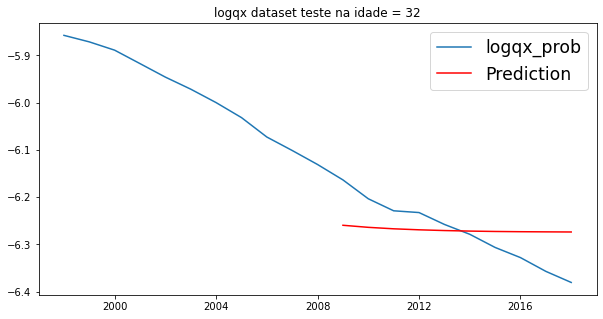

rmse:  [0.06196336]
Epoch 1/500
1/1 [==============================] - 0s 930us/step - loss: 0.0117 - mae: 0.0972
Epoch 2/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0109 - mae: 0.0960
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0857
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0653
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0646
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0624
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0573
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0558
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0364
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2900e-04 - mae: 0.0206
Epoch 11/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step - loss: 8.6808e-04 - mae: 0.0254
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5042e-04 - mae: 0.0219
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0367
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0383
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0287
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7291e-04 - mae: 0.0210
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0266
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0351
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0261
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0242
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.035 - 0s 1ms/step - loss: 0.0023 - mae: 0.0354
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 5.9450e-04 - mae: 0.0191
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0303
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0325
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0247
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9706e-04 - mae: 0.0213
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 5.2903e-04 - mae: 0.0194
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0275
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 9.6121e-04 - mae: 0.0199
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0277
Epoch 184/500
1/1 [=

1/1 [==============================] - 0s 2ms/step - loss: 8.0773e-04 - mae: 0.0233
Epoch 260/500
1/1 [==============================] - 0s 1ms/step - loss: 4.6256e-04 - mae: 0.0175
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0299
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0344
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7954e-04 - mae: 0.0164
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0219
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 7.8243e-04 - mae: 0.0213
Epoch 266/500
1/1 [==============================] - 0s 10ms/step - loss: 3.1785e-04 - mae: 0.0149
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0243
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0269
Epoch 269/500
1/1 [==============================] - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0221
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4797e-04 - mae: 0.0205
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1751e-04 - mae: 0.0186
Epoch 347/500
1/1 [==============================] - 0s 2ms/step - loss: 8.2033e-04 - mae: 0.0218
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3059e-04 - mae: 0.0236
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0219
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0307
Epoch 351/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0263
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6525e-04 - mae: 0.0169
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0286
Epoch 354/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0521
Epoch 430/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9023e-04 - mae: 0.0240
Epoch 431/500
1/1 [==============================] - 0s 2ms/step - loss: 6.1090e-04 - mae: 0.0220
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 2.9816e-04 - mae: 0.0136
Epoch 433/500
1/1 [==============================] - 0s 4ms/step - loss: 7.3648e-04 - mae: 0.0212
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4431e-04 - mae: 0.0225
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3806e-04 - mae: 0.0213
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7292e-04 - mae: 0.0174
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6466e-04 - mae: 0.0246
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0284
Epoch 439/500
1/1 [=======================

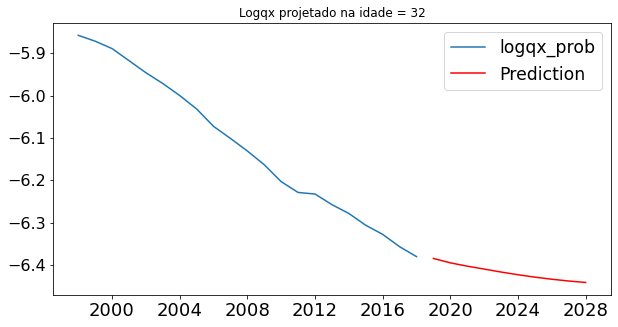

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0165 - mae: 0.0882
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0142 - mae: 0.0901
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0122 - mae: 0.0830
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0755
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - mae: 0.0865
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0632
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0809
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0091 - mae: 0.0804
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0779
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0099 - mae: 0.0946
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 

1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0274
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0454
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0367
Epoch 91/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0020 - mae: 0.0374
Epoch 92/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0038 - mae: 0.0533
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0327
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0335
Epoch 95/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0404
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6163e-04 - mae: 0.0282
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0353
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0269
Epoch 174/500
1/1 [==============================] - 0s 1ms/step - loss: 3.5622e-04 - mae: 0.0149
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 2.9052e-04 - mae: 0.0145
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0321
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 7.8582e-04 - mae: 0.0197
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0281
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 4.8385e-04 - mae: 0.0148
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 4.5301e-04 - mae: 0.0175
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0402
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 8.4377e-04 - mae: 0.0227
Epoch 183/500
1/1 [==============================]

1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0263
Epoch 259/500
1/1 [==============================] - 0s 4ms/step - loss: 3.0587e-04 - mae: 0.0160
Epoch 260/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0278
Epoch 261/500
1/1 [==============================] - 0s 3ms/step - loss: 3.9054e-04 - mae: 0.0151
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 9.0933e-04 - mae: 0.0202
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0267
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9719e-04 - mae: 0.0201
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 3.1693e-04 - mae: 0.0149
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 3.2979e-04 - mae: 0.0162
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 6.5527e-04 - mae: 0.0175
Epoch 268/500
1/1 [===========================

1/1 [==============================] - 0s 2ms/step - loss: 9.1413e-04 - mae: 0.0215
Epoch 343/500
1/1 [==============================] - 0s 2ms/step - loss: 3.5970e-04 - mae: 0.0171
Epoch 344/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0483
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0316
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0260
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0274
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3931e-04 - mae: 0.0273
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 3.6513e-04 - mae: 0.0170
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 8.4828e-04 - mae: 0.0257
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 1.4197e-04 - mae: 0.0104
Epoch 352/500
1/1 [==============================]

1/1 [==============================] - 0s 1ms/step - loss: 3.1419e-04 - mae: 0.0163
Epoch 427/500
1/1 [==============================] - 0s 1ms/step - loss: 3.7688e-04 - mae: 0.0144
Epoch 428/500
1/1 [==============================] - 0s 1ms/step - loss: 3.7018e-04 - mae: 0.0154
Epoch 429/500
1/1 [==============================] - 0s 1ms/step - loss: 5.0411e-04 - mae: 0.0155
Epoch 430/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0275
Epoch 431/500
1/1 [==============================] - 0s 2ms/step - loss: 9.7617e-04 - mae: 0.0246
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 6.6985e-04 - mae: 0.0232
Epoch 433/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0310
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0373
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 3.4126e-04 - mae: 0.0144
Epoch 436/500
1/1 [===========================

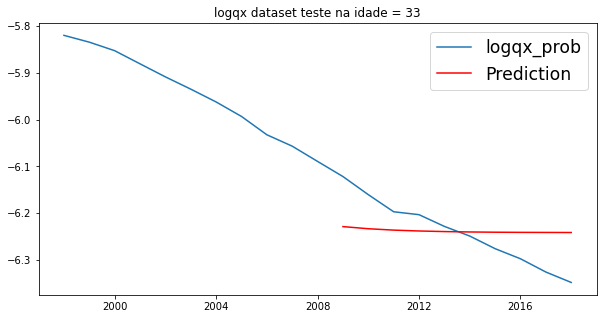

rmse:  [0.06539623]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0843
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0772
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0581
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0612
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0431
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0534
Epoch 7/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0032 - mae: 0.0489
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0508
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0497
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0369
Epoch 11/500
1/1 [==============================] - 0s 1ms/

Epoch 88/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0275
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 6.4265e-04 - mae: 0.0180
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0299
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0296
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0378
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0246
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0254
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 6.8323e-04 - mae: 0.0238
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0268
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 9.3545e-04 - mae: 0.0224
Epoch 98/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 1ms/step - loss: 4.9513e-04 - mae: 0.0173
Epoch 174/500
1/1 [==============================] - 0s 2ms/step - loss: 3.9447e-04 - mae: 0.0172
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0327
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 8.1763e-04 - mae: 0.0236
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 7.2625e-04 - mae: 0.0229
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 9.5200e-04 - mae: 0.0224
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 7.2955e-04 - mae: 0.0225
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0286
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 9.2139e-04 - mae: 0.0235
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 4.6344e-04 - mae: 0.0182
Epoch 183/500
1/1 [=======================

1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0303
Epoch 259/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0267
Epoch 260/500
1/1 [==============================] - 0s 1ms/step - loss: 8.0795e-04 - mae: 0.0238
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7771e-04 - mae: 0.0241
Epoch 262/500
1/1 [==============================] - 0s 4ms/step - loss: 5.4817e-04 - mae: 0.0181
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0269
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0210
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 5.5259e-04 - mae: 0.0195
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4731e-04 - mae: 0.0239
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0278
Epoch 268/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step - loss: 3.6606e-04 - mae: 0.0158
Epoch 344/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0243
Epoch 345/500
1/1 [==============================] - 0s 3ms/step - loss: 4.5843e-04 - mae: 0.0184
Epoch 346/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0326
Epoch 347/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0237
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2783e-04 - mae: 0.0219
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0220
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0288
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9318e-04 - mae: 0.0200
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0264
Epoch 353/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0313
Epoch 429/500
1/1 [==============================] - 0s 2ms/step - loss: 9.9256e-04 - mae: 0.0265
Epoch 430/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0272
Epoch 431/500
1/1 [==============================] - 0s 2ms/step - loss: 8.2047e-04 - mae: 0.0250
Epoch 432/500
1/1 [==============================] - 0s 3ms/step - loss: 3.4546e-04 - mae: 0.0136
Epoch 433/500
1/1 [==============================] - 0s 2ms/step - loss: 4.3400e-04 - mae: 0.0168
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7912e-04 - mae: 0.0183
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 7.4139e-04 - mae: 0.0184
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 9.3388e-04 - mae: 0.0221
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0294
Epoch 438/500
1/1 [===========================

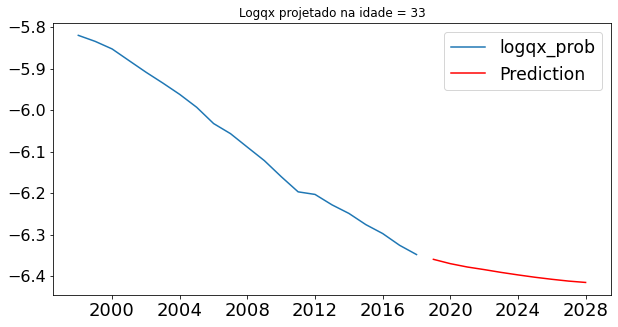

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0691 - mae: 0.2202
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0718 - mae: 0.2224
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0697 - mae: 0.2100
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0682 - mae: 0.2134
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0664 - mae: 0.2078
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0619 - mae: 0.1975
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0552 - mae: 0.1898
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0503 - mae: 0.1735
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0488 - mae: 0.1712
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0435 - mae: 0.1633
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0434 

1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0749
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0103 - mae: 0.0950
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0852
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0082 - mae: 0.0821
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0560
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0549
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0799
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0802
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0806
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0190 - mae: 0.1193
Epoch 99/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - ma

1/1 [==============================] - 0s 980us/step - loss: 0.0019 - mae: 0.0377
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0287
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0498
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0267
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 3.6142e-04 - mae: 0.0138
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7676e-04 - mae: 0.0176
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.0742
Epoch 183/500
1/1 [==============================] - 0s 918us/step - loss: 0.0016 - mae: 0.0348
Epoch 184/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0016 - mae: 0.0372
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0288
Epoch 186/500
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0275
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0448
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0527
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 9.6412e-04 - mae: 0.0259
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0245
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 9.3166e-04 - mae: 0.0252
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0446
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0407
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0394
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0342
Epoch 272/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 6.9404e-04 - mae: 0.0248
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 5.6870e-04 - mae: 0.0210
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 1.5303e-04 - mae: 0.0100
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 9.3775e-04 - mae: 0.0194
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0402
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0380
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 6.1562e-04 - mae: 0.0176
Epoch 355/500
1/1 [==============================] - 0s 932us/step - loss: 5.9889e-04 - mae: 0.0184
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0292
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 6.1827e-04 - mae: 0.0204
Epoch 358/500
1/1 [=========================

1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0284
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3242e-04 - mae: 0.0218
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 2.4345e-04 - mae: 0.0108
Epoch 436/500
1/1 [==============================] - 0s 12ms/step - loss: 8.3851e-04 - mae: 0.0231
Epoch 437/500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.042 - 0s 1ms/step - loss: 0.0022 - mae: 0.0421
Epoch 438/500
1/1 [==============================] - 0s 8ms/step - loss: 5.1407e-04 - mae: 0.0210
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0448
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0321
Epoch 441/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0282
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0320
Epoch 443/500
1/1 [

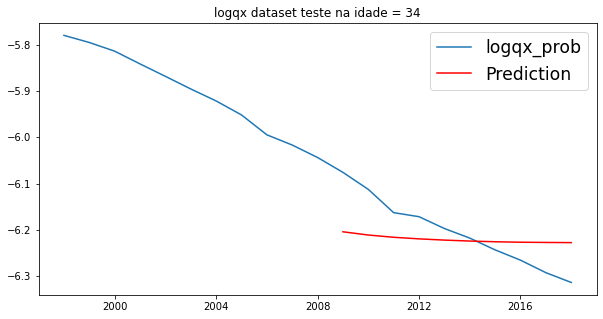

rmse:  [0.06734906]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0915
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0120 - mae: 0.0931
Epoch 3/500
1/1 [==============================] - 0s 961us/step - loss: 0.0111 - mae: 0.0942
Epoch 4/500
1/1 [==============================] - 0s 991us/step - loss: 0.0038 - mae: 0.0501
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0675
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0485
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0503
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0507
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0494
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0479
Epoch 11/500
1/1 [==============================] - 0s 

Epoch 88/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0464
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0410
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0403
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0315
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0407
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7060e-04 - mae: 0.0243
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 5.8543e-04 - mae: 0.0205
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0346
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0266
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0381
Epoch 98/500
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0312
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3480e-04 - mae: 0.0240
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0320
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0419
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0249
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 7.7745e-04 - mae: 0.0233
Epoch 180/500
1/1 [==============================] - 0s 988us/step - loss: 0.0016 - mae: 0.0260
Epoch 181/500
1/1 [==============================] - 0s 981us/step - loss: 8.1574e-04 - mae: 0.0236
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0480
Epoch 183/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0021 - mae: 0.0301
Epoch 184/500
1/1 [==============================] - 0s 1

1/1 [==============================] - 0s 5ms/step - loss: 9.6886e-04 - mae: 0.0265
Epoch 260/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0300
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0404
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 7.5041e-04 - mae: 0.0188
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 4.9507e-04 - mae: 0.0153
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0350
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0341
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0553
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 5.8597e-04 - mae: 0.0185
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0254
Epoch 269/500
1/1 [==============================] - 0s 5m

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0263
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2710e-04 - mae: 0.0228
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1082e-04 - mae: 0.0252
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 2.5074e-04 - mae: 0.0132
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6665e-04 - mae: 0.0225
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0299
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0369
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 6.4763e-04 - mae: 0.0178
Epoch 352/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0300
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0284
Epoch 354/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step - loss: 7.8750e-04 - mae: 0.0241
Epoch 430/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0319
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0338
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 3.1770e-04 - mae: 0.0140
Epoch 433/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0296
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6169e-04 - mae: 0.0192
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0295
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5481e-04 - mae: 0.0211
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 7.0963e-04 - mae: 0.0182
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0217
Epoch 439/500
1/1 [==============================] - 0

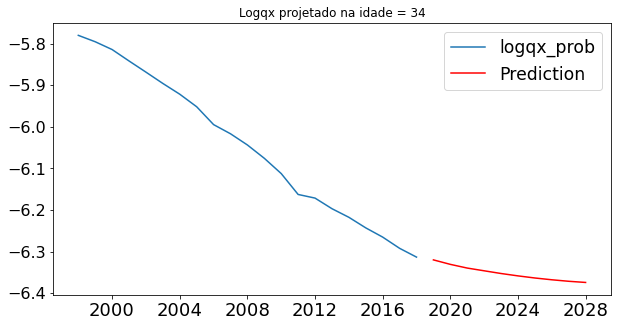

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0498 - mae: 0.1771
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0446 - mae: 0.1663
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0467 - mae: 0.1698
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0376 - mae: 0.1526
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0394 - mae: 0.1540
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1473
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0312 - mae: 0.1344
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0285 - mae: 0.1258
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0250 - mae: 0.1219
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0317 - mae: 0.1351
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0217 

1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0704
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0752
Epoch 91/500
1/1 [==============================] - 0s 911us/step - loss: 0.0040 - mae: 0.0580
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0885
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0934
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0558
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0518
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0935
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0425
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0502
Epoch 99/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0065 - 

Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0305
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0281
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0291
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0330
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5849e-04 - mae: 0.0238
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0294
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5330e-04 - mae: 0.0229
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0339
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0286
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0370
Epoch 186/500
1/1 [==============================] -

1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0345
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0488
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0390
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0468
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0395
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0328
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0352
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0232
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0339
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0436
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 9.9282e-04 - mae: 0.0246
Epoch 349/500
1/1 [==============================] - 0s 8ms/step - loss: 1.9102e-04 - mae: 0.0130
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0262
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0318
Epoch 352/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0013 - mae: 0.0239
Epoch 353/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0040 - mae: 0.0503
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 7.0278e-04 - mae: 0.0223
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0328
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0239
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0334
Epoch 358/500
1/1 [============================

1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0253
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 7.5412e-04 - mae: 0.0234
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7879e-04 - mae: 0.0202
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0260
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0267
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 7.1016e-04 - mae: 0.0209
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0345
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0259
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3266e-04 - mae: 0.0237
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0445
Epoch 444/500
1/1 [==============================] - 0s 95

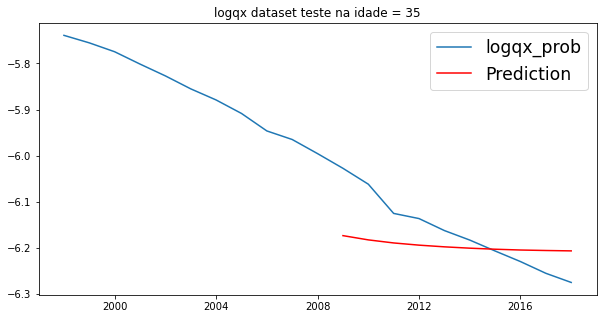

rmse:  [0.07248714]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0689
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0594
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0539
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0603
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0513
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0524
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0563
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0373
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0319
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9771e-04 - mae: 0.0229
Epoch 11/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0240
Epoch 88/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0332
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 3.0941e-04 - mae: 0.0145
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0405
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0310
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0298
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0349
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0345
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0271
Epoch 96/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0017 - mae: 0.0268
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013

Epoch 173/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0295
Epoch 174/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0237
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0351
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 7.2000e-04 - mae: 0.0213
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3593e-04 - mae: 0.0229
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0361
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0307
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0318
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0292
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6477e-04 - mae: 0.0238
Epoch 183/500
1/1 [=============================

1/1 [==============================] - 0s 2ms/step - loss: 7.1911e-04 - mae: 0.0216
Epoch 259/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0395
Epoch 260/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0243
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7516e-04 - mae: 0.0248
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0380
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3283e-04 - mae: 0.0196
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0338
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0234
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0404
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0306
Epoch 268/500
1/1 [==============================] - 0s 1ms/st

Epoch 344/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0320
Epoch 345/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0352
Epoch 346/500
1/1 [==============================] - 0s 992us/step - loss: 0.0016 - mae: 0.0295
Epoch 347/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0257
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0220
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0260
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0291
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0244
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0221
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0207
Epoch 354/500
1/1 [==============================] - 0s 4m

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0316
Epoch 430/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0013 - mae: 0.0241
Epoch 431/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0240
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 2.5508e-04 - mae: 0.0128
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0269
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 9.6249e-04 - mae: 0.0218
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 4.9958e-04 - mae: 0.0180
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0335
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0259
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0217
Epoch 439/500
1/1 [==============================] - 0s 1ms/s

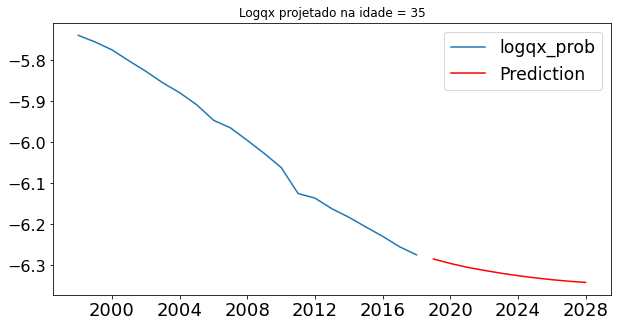

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0602 - mae: 0.1937
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0552 - mae: 0.1856
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0703 - mae: 0.2079
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0596 - mae: 0.1937
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0521 - mae: 0.1756
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0406 - mae: 0.1579
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0396 - mae: 0.1518
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0324 - mae: 0.1435
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0388 - mae: 0.1544
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0266 - mae: 0.1342
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0206 

1/1 [==============================] - 0s 3ms/step - loss: 0.0146 - mae: 0.1053
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0942
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.1044
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0899
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0768
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0105 - mae: 0.0970
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0601
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0054 - mae: 0.0650
Epoch 97/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0819
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - mae: 0.0846
Epoch 99/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0543
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0631
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0410
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0586
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0516
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0430
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0502
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0411
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0401
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0415
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 9

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0323
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0395
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0352
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 9.4497e-04 - mae: 0.0255
Epoch 266/500
1/1 [==============================] - 0s 10ms/step - loss: 8.0321e-04 - mae: 0.0262
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0246
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0300
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0384
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 5.4508e-04 - mae: 0.0206
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 4.3990e-04 - mae: 0.0177
Epoch 272/500
1/1 [==============================] - 0s 3

1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0484
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0285
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0292
Epoch 351/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0382
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0513
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 2.4342e-04 - mae: 0.0104
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0279
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0316
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0380
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0398
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0406
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0274
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0328
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0332
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0307
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0300
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 6.2453e-04 - mae: 0.0181
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8617e-04 - mae: 0.0256
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0441
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 9.1949e-04 - mae: 0.0238
Epoch 444/500
1/1 [==============================] - 0s 1ms/st

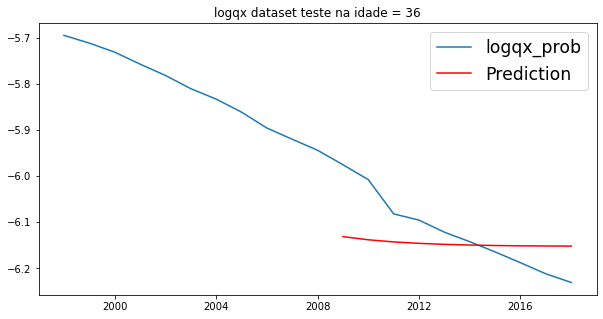

rmse:  [0.07725271]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0784
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0064 - mae: 0.0666
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0683
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0556
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0662
Epoch 6/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0060 - mae: 0.0702
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0572
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0452
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0336
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0333
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0405
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0314
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0252
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0376
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0277
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0374
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0307
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0310
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 6.6212e-04 - mae: 0.0221
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 5.1979e

1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0302
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0241
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0340
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 3.8999e-04 - mae: 0.0172
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0241
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0328
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 2.8280e-04 - mae: 0.0144
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0417
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0359
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0357
Epoch 184/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0287
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7716e-04 - mae: 0.0235
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0359
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9001e-04 - mae: 0.0244
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0270
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0298
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0312
Epoch 267/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0020 - mae: 0.0318
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 1.4572e-04 - mae: 0.0095
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0332
Epoch 270/500
1/1 [==============================] - 0s 2ms/s

Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0231
Epoch 347/500
1/1 [==============================] - 0s 8ms/step - loss: 5.1367e-04 - mae: 0.0194
Epoch 348/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0261
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0211
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0199
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0210
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5414e-04 - mae: 0.0173
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0288
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 4.3073e-04 - mae: 0.0149
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0349
Epoch 356/500
1/1 [=============================

1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0251
Epoch 432/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0339
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0346
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 8.4293e-04 - mae: 0.0222
Epoch 435/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0028 - mae: 0.0375
Epoch 436/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0010 - mae: 0.0241
Epoch 437/500
1/1 [==============================] - 0s 8ms/step - loss: 3.6122e-04 - mae: 0.0093
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0253
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0291
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0309
Epoch 441/500
1/1 [==============================] - 0s 3ms/step -

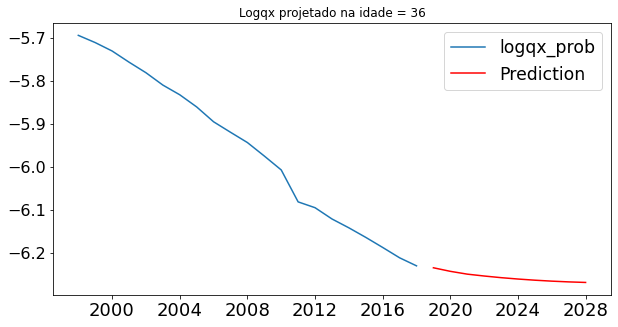

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1061 - mae: 0.2738
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1028 - mae: 0.2641
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0854 - mae: 0.2360
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0797 - mae: 0.2269
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0912 - mae: 0.2392
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0687 - mae: 0.2066
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0727 - mae: 0.2181
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0717 - mae: 0.2071
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0624 - mae: 0.1936
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0570 - mae: 0.1842
Epoch 11/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0511 

1/1 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0634
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1079
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0155 - mae: 0.1157
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0452
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0109 - mae: 0.0941
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0274 - mae: 0.1187
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0157 - mae: 0.0988
Epoch 96/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0106 - mae: 0.0878
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1184
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0257 - mae: 0.1511
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0135 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0802
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0888
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0301
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0626
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0656
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0440
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0618
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0575
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0081 - mae: 0.0700
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0415
Epoch 186/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 9.5952e-04 - mae: 0.0259
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0473
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0079 - mae: 0.0766
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0619
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0408
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0288
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0100 - mae: 0.0819
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0335
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0569
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0293
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0475
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0321
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0368
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0365
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0351
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0317
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3209e-04 - mae: 0.0237
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0356
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 7.1459e-04 - mae: 0.0226
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0427
Epoch 360/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 7.6363e-04 - mae: 0.0219
Epoch 437/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0513
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0403
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0348
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0250
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5038e-04 - mae: 0.0188
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0373
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0331
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0441
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 5.3507e-04 - mae: 0.0164
Epoch 446/500
1/1 [==============================] - 0s 1ms/st

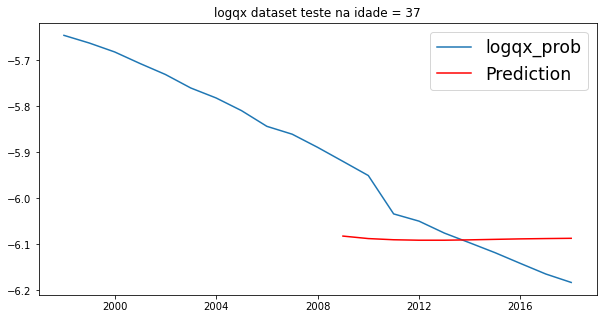

rmse:  [0.08317527]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0893
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0631
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0826
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0532
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0444
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0682
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0542
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0587
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0517
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0334
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0427
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0367
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 6.2246e-04 - mae: 0.0202
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0288
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0308
Epoch 93/500
1/1 [==============================] - 0s 973us/step - loss: 0.0028 - mae: 0.0403
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0281
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0344
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 5.7344e-04 - mae: 0.0208
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0326
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0273
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0283
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0484
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0326
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 5.7445e-04 - mae: 0.0199
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0277
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0325
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0397
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0359
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0237
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 5.0474e-04 - mae: 0.0179
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0367
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0294
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0257
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0307
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 8.3315e-04 - mae: 0.0218
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 6.0573e-04 - mae: 0.0190
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0329
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0304
Epoch 269/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0019 - mae: 0.0331
Epoch 270/500
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 2ms/step - loss: 5.8662e-04 - mae: 0.0172
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5342e-04 - mae: 0.0207
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 8.6456e-04 - mae: 0.0217
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0400
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0247
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 5.8972e-04 - mae: 0.0189
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 2.3792e-04 - mae: 0.0126
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 4.9881e-04 - mae: 0.0180
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0305
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0244
Epoch 356/500
1/1 [==============================]

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0384
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0273
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0329
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0355
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0287
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0266
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0246
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 9.0297e-04 - mae: 0.0223
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0355
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 5.0535e-04 - mae: 0.0171
Epoch 442/500
1/1 [==============================] - 0s 1ms/step -

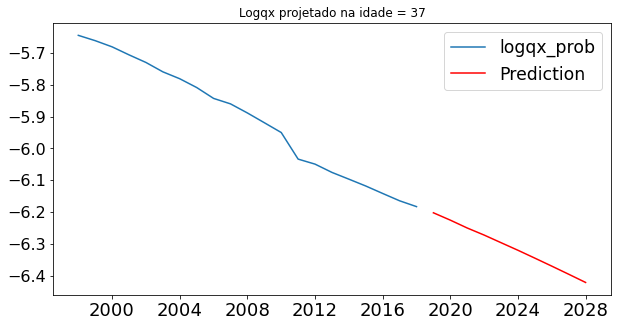

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0630 - mae: 0.1939
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0470 - mae: 0.1736
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0514 - mae: 0.1763
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0446 - mae: 0.1606
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0493 - mae: 0.1685
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0401 - mae: 0.1513
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0323 - mae: 0.1460
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0318 - mae: 0.1524
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0304 - mae: 0.1431
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0257 - mae: 0.1316
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0222 

1/1 [==============================] - 0s 2ms/step - loss: 0.0105 - mae: 0.0998
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0713
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0143 - mae: 0.1160
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0927
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0757
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0097 - mae: 0.0879
Epoch 95/500
1/1 [==============================] - 0s 19ms/step - loss: 0.0109 - mae: 0.1003
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0647
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0876
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0117 - mae: 0.0996
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - m

1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0769
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0426
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0458
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0321
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0480
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0325
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0401
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0482
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0823
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0422
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0615
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0535
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0511
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0280
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0597
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0341
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0306
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0561
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0551
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0394
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0371
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0478
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0583
Epoch 353/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0044 - mae: 0.0633
Epoch 354/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0319
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0420
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0301
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 2.0621e-04 - mae: 0.0118
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0300
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0406
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - los

Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0381
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0232
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0464
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0406
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 8.3902e-04 - mae: 0.0247
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0304
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0377
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0471
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0302
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0301
Epoch 447/500
1/1 [==============================] - 0s 

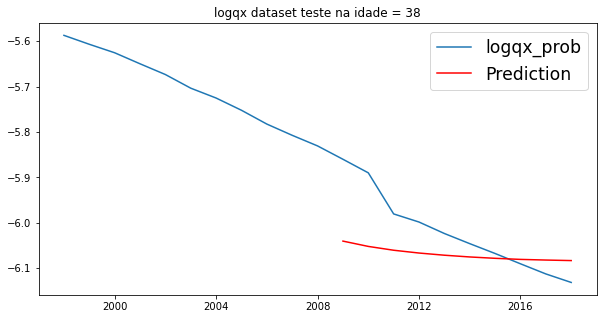

rmse:  [0.08736553]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0896
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0664
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0697
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0765
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0605
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0597
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0550
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0496
Epoch 9/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0523
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0558
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 5.8511e-04 - mae: 0.0188
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0419
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0454
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0354
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0323
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0249
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0505
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0464
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0313
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0542
Epoch 98/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0022 

1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0281
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1262e-04 - mae: 0.0228
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4465e-04 - mae: 0.0216
Epoch 177/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0364
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0276
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0366
Epoch 180/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0396
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0293
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0286
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0336
Epoch 184/500
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0341
Epoch 261/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0175
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0251
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0255
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0344
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0209
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0379
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0261
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0258
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7236e-04 - mae: 0.0182
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 5ms/step - loss: 9.8347e-04 - mae: 0.0222
Epoch 346/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0234
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3821e-04 - mae: 0.0222
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0256
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0254
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0233
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 5.6877e-04 - mae: 0.0198
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0256
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7301e-04 - mae: 0.0189
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 7.2016e-04 - mae: 0.0180
Epoch 355/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step - loss: 6.3044e-04 - mae: 0.0208
Epoch 431/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0285
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0375
Epoch 433/500
1/1 [==============================] - 0s 3ms/step - loss: 7.6606e-04 - mae: 0.0218
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7726e-04 - mae: 0.0131
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0264
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0239
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0340
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 8.5553e-04 - mae: 0.0185
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9346e-04 - mae: 0.0178
Epoch 440/500
1/1 [==============================] - 0

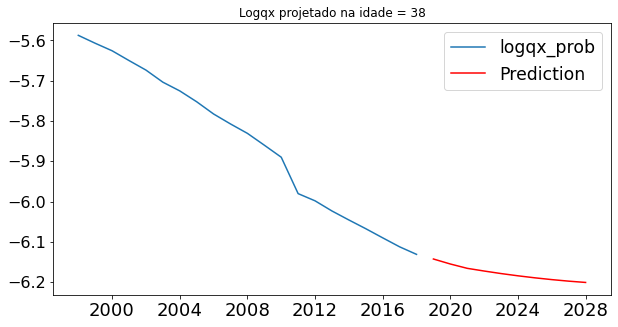

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0502 - mae: 0.1670
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0351 - mae: 0.1532
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0306 - mae: 0.1406
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0299 - mae: 0.1485
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1534
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0224 - mae: 0.1309
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0317 - mae: 0.1625
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.1087
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - mae: 0.1471
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0121 - mae: 0.1044
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 

1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0717
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0730
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0896
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0774
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0700
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0369
Epoch 95/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0651
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0626
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0861
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0530
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0406
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0077 - mae: 0.0720
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0401
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0366
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0598
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0433
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0643
Epoch 183/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0058 - mae: 0.0704
Epoch 184/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0394
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0623
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0475
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0103 - mae: 0.0807
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0692
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0632
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0327
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0455
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0370
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0358
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0519
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0289
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0530
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0319
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0365
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0298
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0432
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0366
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0467
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0538
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0501
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0429
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0435
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0275
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0271
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7822e-04 - mae: 0.0213
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0340
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0554
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0327
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3705e-04 - mae: 0.0268
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0399
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0369
Epoch 446/500
1/1 [==============================] - 0s 2ms/step -

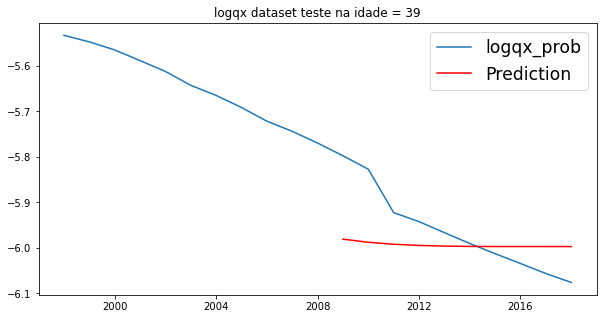

rmse:  [0.08894809]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0917
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0929
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0650
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0676
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0676
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0514
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0425
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0543
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0297
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0485
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0285
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0319
Epoch 90/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0017 - mae: 0.0266
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0330
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0415
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0367
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 9.5758e-04 - mae: 0.0245
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0432
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0250
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0375
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 5.9411

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0328
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0306
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0356
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0308
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 8.7899e-04 - mae: 0.0183
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0289
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0438
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0270
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 8.9831e-04 - mae: 0.0271
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0353
Epoch 184/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 7.5800e-04 - mae: 0.0125
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 2.7253e-04 - mae: 0.0139
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 4.2191e-04 - mae: 0.0174
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0394
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0309
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0375
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0338
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0281
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 1.3525e-04 - mae: 0.0096
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0387
Epoch 270/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 1ms/step - loss: 9.9970e-04 - mae: 0.0226
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3696e-04 - mae: 0.0195
Epoch 348/500
1/1 [==============================] - 0s 3ms/step - loss: 7.4630e-04 - mae: 0.0170
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0298
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0263
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0312
Epoch 352/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0012 - mae: 0.0246
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0366
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0264
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0365
Epoch 356/500
1/1 [==============================] - 0s 4ms/s

1/1 [==============================] - 0s 3ms/step - loss: 8.1996e-04 - mae: 0.0188
Epoch 433/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0239
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 8.5767e-04 - mae: 0.0221
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0296
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0367
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0316
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0230
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 8.2349e-04 - mae: 0.0216
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0327
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0333
Epoch 442/500
1/1 [==============================] - 0s 4ms/st

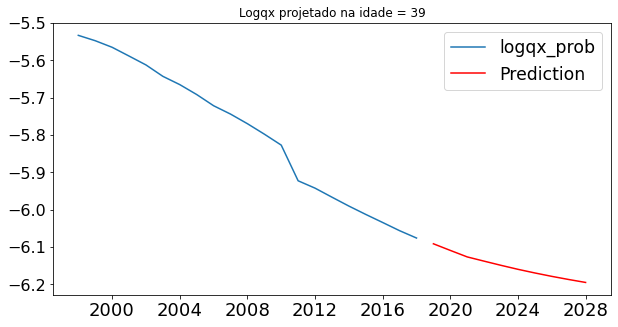

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0812 - mae: 0.2252
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0667 - mae: 0.2011
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0593 - mae: 0.1881
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0608 - mae: 0.1890
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0636 - mae: 0.1859
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0577 - mae: 0.1837
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0473 - mae: 0.1671
Epoch 8/500
1/1 [==============================] - 0s 956us/step - loss: 0.0392 - mae: 0.1561
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0343 - mae: 0.1438
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0401 - mae: 0.1607
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.030

1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0728
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0711
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0650
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0480
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0561
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0169 - mae: 0.1119
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0810
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0652
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0462
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0406
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0609
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0636
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0493
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0375
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0730
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0670
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0498
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0523
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0414
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 8.8868e-04 - mae: 0.0237
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0286
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0424
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0382
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0307
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0777
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0328
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0621
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0392
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0605
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0616
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0332
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0713
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0352
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0693
Epoch 353/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0490
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0547
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0480
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0345
Epoch 357/500
1/1 [==============================] - 0s 6ms/step - loss: 4.2983e-04 - mae: 0.0168
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0239
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0452
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0366
Epoch 438/500
1/1 [==============================] - 0s 877us/step - loss: 7.9014e-04 - mae: 0.0239
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0291
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0378
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0388
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0376
Epoch 443/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0040 - mae: 0.0552
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0502
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0525
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - 

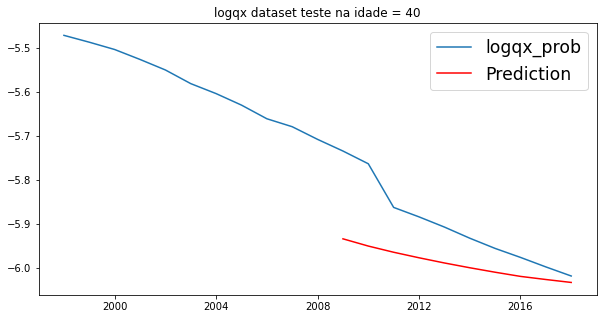

rmse:  [0.10527406]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0909
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0816
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0895
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0769
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0732
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0524
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0708
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0533
Epoch 9/500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.057 - 0s 5ms/step - loss: 0.0063 - mae: 0.0575
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0562
Epoch 11/500
1/1 [===

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0313
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0487
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0461
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0221
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0609
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0357
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0332
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0457
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0350
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0425
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0249
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0380
Epoch 177/500
1/1 [==============================] - 0s 885us/step - loss: 0.0017 - mae: 0.0343
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0394
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0293
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0507
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0356
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0367
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0286
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0296
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0355
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0269
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0294
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0374
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0303
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0360
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0297
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0382
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0298
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0309
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0421
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 7.1180e-04 - mae: 0.0180
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0354
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0298
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0268
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0341
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0413
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0389
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0250
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0334
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0323
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0356
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0405
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0315
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0286
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0257
Epoch 439/500
1/1 [==============================] - 0s 916us/step - loss: 0.0020 - mae: 0.0295
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0371
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0338
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0267
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss:

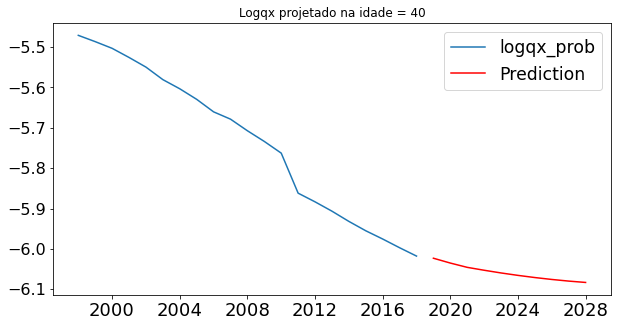

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0526 - mae: 0.1723
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0532 - mae: 0.1809
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0485 - mae: 0.1670
Epoch 4/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0382 - mae: 0.1520
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0407 - mae: 0.1593
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0280 - mae: 0.1459
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0362 - mae: 0.1622
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0343 - mae: 0.1684
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0320 - mae: 0.1689
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0245 - mae: 0.1396
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0175 

1/1 [==============================] - 0s 2ms/step - loss: 0.0122 - mae: 0.1003
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0652
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0090 - mae: 0.0894
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0147 - mae: 0.1130
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0095 - mae: 0.0852
Epoch 94/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0136 - mae: 0.1126
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0090 - mae: 0.0786
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0652
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0533
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0836
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - ma

1/1 [==============================] - 0s 10ms/step - loss: 0.0084 - mae: 0.0764
Epoch 177/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0295
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0436
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0604
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0376
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0410
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0539
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0755
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0646
Epoch 185/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0372
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0687
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0419
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0361
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0453
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0551
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0377
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0347
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0413
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0669
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0338
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0436
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0363
Epoch 352/500
1/1 [==============================] - 0s 984us/step - loss: 0.0023 - mae: 0.0440
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0458
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0441
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0803
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0610
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0562
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0443
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0357
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0278
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0606
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0434
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0326
Epoch 440/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0318
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 5.4962e-04 - mae: 0.0199
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0328
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0303
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 6.9500e-04 - mae: 0.0237
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0375
Epoch 446/500
1/1 [==============================] - 0s 1ms/step -

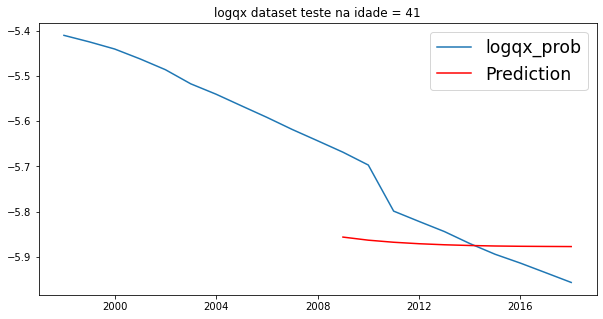

rmse:  [0.09057267]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1031
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0788
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0597
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0813
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0726
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0734
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - mae: 0.0828
Epoch 8/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0061 - mae: 0.0655
Epoch 9/500
1/1 [==============================] - 0s 965us/step - loss: 0.0033 - mae: 0.0491
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0472
Epoch 11/500
1/1 [==============================] - 0s 1

1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0417
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0397
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0310
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 8.2519e-04 - mae: 0.0227
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0322
Epoch 93/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0338
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0309
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0324
Epoch 96/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0272
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0519
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 

1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0588
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0304
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0489
Epoch 177/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0307
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5302e-04 - mae: 0.0251
Epoch 179/500
1/1 [==============================] - 0s 994us/step - loss: 1.9406e-04 - mae: 0.0102
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0271
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0372
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 7.5598e-04 - mae: 0.0238
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0368
Epoch 184/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 7.3280e-04 - mae: 0.0240
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0711e-04 - mae: 0.0249
Epoch 262/500
1/1 [==============================] - 0s 4ms/step - loss: 6.4798e-04 - mae: 0.0194
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0331
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0261
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 5.7220e-04 - mae: 0.0150
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0324
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 8.4409e-04 - mae: 0.0207
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0296
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0263
Epoch 270/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0289
Epoch 347/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0323
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 8.2937e-04 - mae: 0.0207
Epoch 349/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0253
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 9.3992e-04 - mae: 0.0204
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0241
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0199
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 4.4694e-04 - mae: 0.0180
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0358
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 7.2473e-04 - mae: 0.0164
Epoch 356/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 4ms/step - loss: 9.8421e-04 - mae: 0.0231
Epoch 433/500
1/1 [==============================] - 0s 4ms/step - loss: 8.1643e-04 - mae: 0.0241
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0221
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0341
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0326
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8444e-04 - mae: 0.0163
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5314e-04 - mae: 0.0200
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0311
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0288
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9661e-04 - mae: 0.0184
Epoch 442/500
1/1 [==============================] - 0

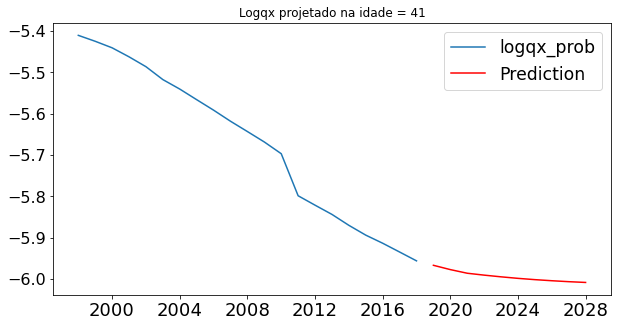

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0888 - mae: 0.2280
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0829 - mae: 0.2277
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0790 - mae: 0.2186
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0708 - mae: 0.2069
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0653 - mae: 0.1988
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0608 - mae: 0.1856
Epoch 7/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0606 - mae: 0.1858
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0598 - mae: 0.1887
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0535 - mae: 0.1837
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0444 - mae: 0.1681
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0406

1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0739
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0807
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0622
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0896
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0572
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1077
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0637
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0702
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0921
Epoch 98/500
1/1 [==============================] - 0s 964us/step - loss: 0.0036 - mae: 0.0497
Epoch 99/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0246 - 

1/1 [==============================] - 0s 967us/step - loss: 0.0061 - mae: 0.0734
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0610
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0839
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0490
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0556
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0326
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0611
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0763
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0882
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0415
Epoch 186/500
1/1 [==============================] - 0s 5ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0418
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0698
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0519
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0529
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0569
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0521
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0669
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0674
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0632
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0373
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0039 - mae: 0.0525
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0348
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0414
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0414
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0366
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0347
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0387
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0496
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0453
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0351
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 7.8271e-04 - mae: 0.0216
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0324
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0489
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0418
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0473
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0440
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0607
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0472
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0543
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0546
Epoch 447/500
1/1 [==============================] - 0s 3ms/step - los

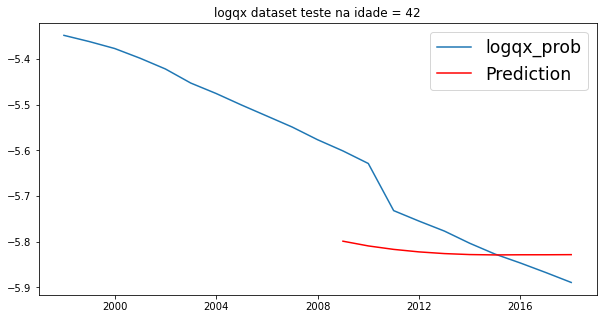

rmse:  [0.09585939]
Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0848
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0123 - mae: 0.0988
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1016
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0690
Epoch 5/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0049 - mae: 0.0582
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0595
Epoch 7/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0040 - mae: 0.0532
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0472
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0565
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0653
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0399
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0323
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0363
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0337
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0403
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0464
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0400
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0406
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0364
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0393
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - ma

1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0294
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0243
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0464
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0250
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0349
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0335
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0295
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0266
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0328
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0281
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 6

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0316
Epoch 262/500
1/1 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.027 - 0s 3ms/step - loss: 0.0016 - mae: 0.0274
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0269
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0317
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0258
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0375
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 6.3140e-04 - mae: 0.0192
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0335
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0480
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0298
Epoch 271/500
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0275
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0287
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0312
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0574
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0295
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0270
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8486e-04 - mae: 0.0193
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0334
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0365
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0365
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0248
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0236
Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0226
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0247
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0248
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 5.1289e-04 - mae: 0.0179
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0280
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0298
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7691e-04 - mae: 0.0239
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0377
Epoch 443/500
1/1 [==============================] - 0s 1ms/step -

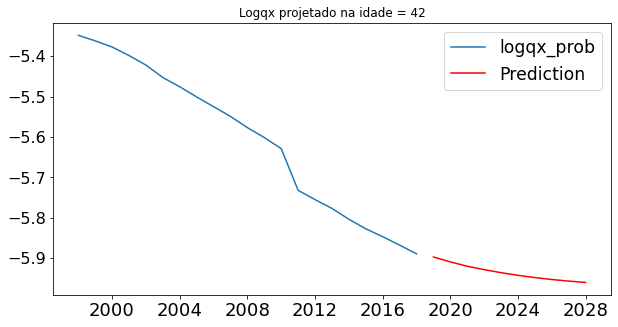

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1021 - mae: 0.2620
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1129 - mae: 0.2625
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1051 - mae: 0.2579
Epoch 4/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0861 - mae: 0.2294
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0779 - mae: 0.2220
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0840 - mae: 0.2230
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0773 - mae: 0.2124
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0648 - mae: 0.2037
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0557 - mae: 0.1899
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0574 - mae: 0.1871
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0449 

1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - mae: 0.1342
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0149 - mae: 0.1116
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1274
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0130 - mae: 0.0932
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0941
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0142 - mae: 0.1108
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0842
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0939
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.1000
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0923
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0635
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0860
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0341
Epoch 179/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0037 - mae: 0.0411
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0352
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0495
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0167 - mae: 0.0921
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0705
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0708
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0597
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0309
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0602
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0488
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0525
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0316
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0441
Epoch 269/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0034 - mae: 0.0533
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0742
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0364
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0663
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0363
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0458
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0730
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0536
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0410
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0440
Epoch 356/500
1/1 [==============================] - 0s 999us/step - loss: 0.0015 - mae: 0.0274
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0388
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0404
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0426
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0465
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0256
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0409
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0297
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0459
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0622
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0435
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0612
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0490
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0358
Epoch 447/500
1/1 [==============================] - 0s 4ms/step - loss: 0

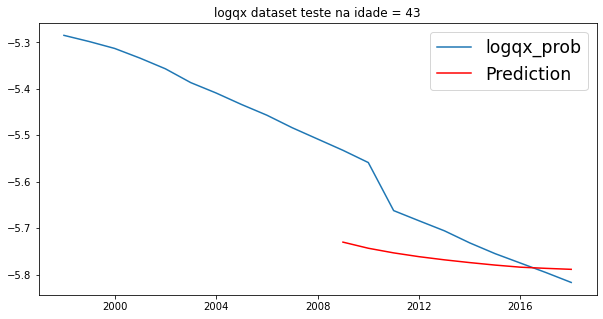

rmse:  [0.09734635]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1095
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0842
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0124 - mae: 0.1026
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0105 - mae: 0.0939
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0765
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0761
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0841
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0790
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0083 - mae: 0.0717
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0713
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0350
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0370
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0360
Epoch 91/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0034 - mae: 0.0416
Epoch 92/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0014 - mae: 0.0290
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0388
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0438
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0403
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0376
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0392
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - 

1/1 [==============================] - 0s 6ms/step - loss: 7.6576e-04 - mae: 0.0217
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 7.1049e-04 - mae: 0.0206
Epoch 176/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0344
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0401
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0372
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0398
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0263
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0253
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0278
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0284
Epoch 184/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0261
Epoch 261/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0309
Epoch 262/500
1/1 [==============================] - 0s 919us/step - loss: 0.0020 - mae: 0.0290
Epoch 263/500
1/1 [==============================] - 0s 740us/step - loss: 0.0013 - mae: 0.0297
Epoch 264/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0027 - mae: 0.0371
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0389
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0267
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0242
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0278
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0217
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0303
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2399e-04 - mae: 0.0240
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 7.5735e-04 - mae: 0.0221
Epoch 349/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0018 - mae: 0.0326
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0310
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0346
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0291
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0325
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0310
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0302
Epoch 356/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0247
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0271
Epoch 434/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0411
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0300
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0307
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0312
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7081e-04 - mae: 0.0187
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0244
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0360
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 6.2763e-04 - mae: 0.0207
Epoch 442/500
1/1 [==============================] - 0s 3ms/step -

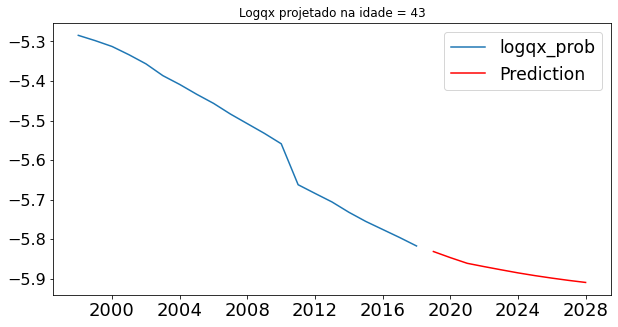

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0415 - mae: 0.1583
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0426 - mae: 0.1611
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0272 - mae: 0.1395
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0451 - mae: 0.1746
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0294 - mae: 0.1525
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0232 - mae: 0.1380
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0272 - mae: 0.1535
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0199 - mae: 0.1375
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0240 - mae: 0.1534
Epoch 10/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0173 - mae: 0.1243
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0191

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0755
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0798
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.0977
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0981
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0916
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0063 - mae: 0.0637
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0678
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.1060
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0657
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0455
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0419
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0480
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0432
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0510
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0467
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0740
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0539
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0519
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0773
Epoch 185/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0487
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0452
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0409
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0483
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0089 - mae: 0.0840
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0318
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.0941
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0604
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0264
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0501
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0444
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0565
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0637
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0466
Epoch 353/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0646
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0485
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0585
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0672
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0518
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0554
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0546
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 9.9594e-04 - mae: 0.0256
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0545
Epoch 439/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0021 - mae: 0.0375
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0587
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0381
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0398
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0509
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0346
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0410
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0579
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - lo

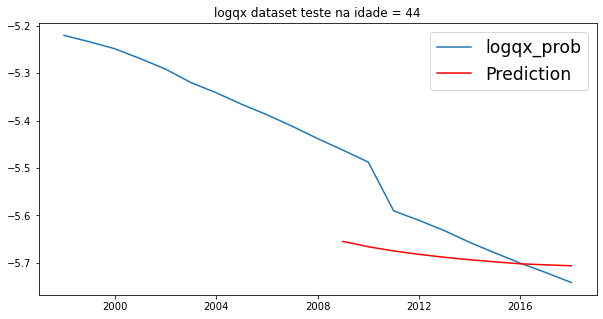

rmse:  [0.09367757]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.1000
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0991
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0853
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0829
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - mae: 0.0861
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0639
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0646
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0624
Epoch 9/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0667
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0579
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 954us/step - loss: 0.0014 - mae: 0.0255
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0344
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0283
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 4.5649e-04 - mae: 0.0170
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0400
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0373
Epoch 94/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0025 - mae: 0.0361
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0510
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0419
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 8.8162e-04 - mae: 0.0258
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0

Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0304
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0362
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0356
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0389
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 2.7335e-04 - mae: 0.0133
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0322
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0439
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0285
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7935e-04 - mae: 0.0189
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 8.0937e-04 - mae: 0.0243
Epoch 185/500
1/1 [=============================

1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0250
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0420
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0333
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0271
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0262
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0256
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0394
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0353
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0529
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0385
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0271
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0302
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0295
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0251
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0277
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0242
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0346
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0334
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0377
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0338
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0411
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0366
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0231
Epoch 436/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0399
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0429
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0731e-04 - mae: 0.0216
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0292
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0316e-04 - mae: 0.0250
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0312
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0373
Epoch 443/500
1/1 [==============================] - 0s 4ms/step -

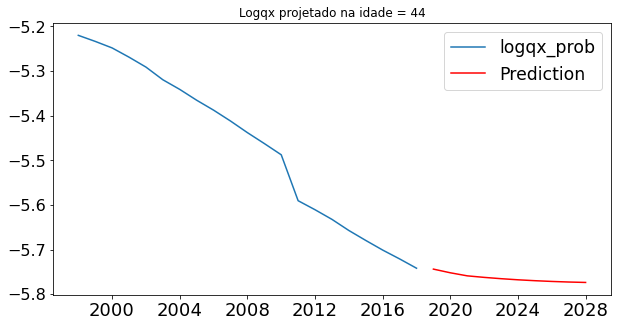

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0883 - mae: 0.2319
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0765 - mae: 0.2251
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0819 - mae: 0.2190
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0679 - mae: 0.2008
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0787 - mae: 0.2115
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0781 - mae: 0.2193
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0643 - mae: 0.1978
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0611 - mae: 0.1889
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0530 - mae: 0.1742
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0352 - mae: 0.1577
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0350 

1/1 [==============================] - 0s 1ms/step - loss: 0.0235 - mae: 0.1388
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0852
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.1014
Epoch 92/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0164 - mae: 0.1192
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0176 - mae: 0.1182
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0805
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0157 - mae: 0.1072
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0939
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0482
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.1047
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - m

1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0518
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0320
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0444
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0409
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0410
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0647
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0541
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0553
Epoch 184/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0030 - mae: 0.0442
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0101 - mae: 0.0847
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0295
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0368
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0448
Epoch 266/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0517
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0376
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0587
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0606
Epoch 270/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0635
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0535
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0478
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0421
Epoch 351/500
1/1 [==============================] - 0s 987us/step - loss: 0.0039 - mae: 0.0546
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0333
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0467
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0661
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0426
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0646
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0368
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0347
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0323
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0452
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0515
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0405
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0503
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0406
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0586
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0599
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0361
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0336
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0351
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

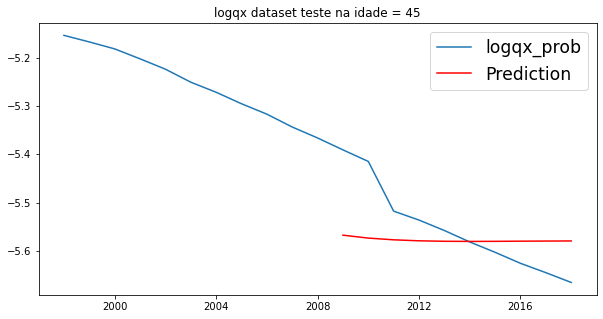

rmse:  [0.08740234]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0800
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0088 - mae: 0.0830
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0975
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0726
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0714
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0599
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0490
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0310
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0509
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0340
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0264
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0296
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0286
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0441
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0287
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0398
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3221e-04 - mae: 0.0220
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0425
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0286
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0410
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 

1/1 [==============================] - 0s 938us/step - loss: 0.0021 - mae: 0.0308
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0271
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0452
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0398
Epoch 178/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0294
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0388
Epoch 180/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0036 - mae: 0.0409
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0374
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0302
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0278
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss

1/1 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0514
Epoch 261/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0013 - mae: 0.0330
Epoch 262/500
1/1 [==============================] - 0s 21ms/step - loss: 0.0036 - mae: 0.0417
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0254
Epoch 264/500
1/1 [==============================] - 0s 962us/step - loss: 0.0015 - mae: 0.0286
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0338
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0375
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0370
Epoch 268/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0060 - mae: 0.0482
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 6.0064e-04 - mae: 0.0187
Epoch 270/500
1/1 [==============================] - 0s 10ms/step 

1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0345
Epoch 347/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0414
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0279
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6916e-04 - mae: 0.0246
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0387
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0461
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0483
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0347
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 9.9345e-04 - mae: 0.0235
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0492
Epoch 356/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 6.6865e-04 - mae: 0.0203
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0386
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0267
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0390
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 9.0735e-04 - mae: 0.0234
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0397
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1487e-04 - mae: 0.0214
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0338
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0585
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0336
Epoch 442/500
1/1 [==============================] - 0s 1ms/st

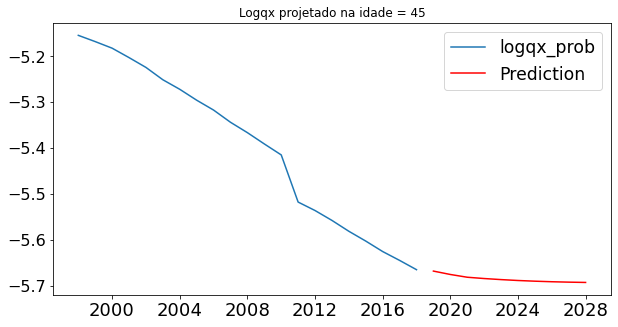

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0703 - mae: 0.1965
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0697 - mae: 0.2003
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0654 - mae: 0.2007
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0657 - mae: 0.2003
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0571 - mae: 0.1844
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0499 - mae: 0.1725
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0470 - mae: 0.1658
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0445 - mae: 0.1704
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0362 - mae: 0.1591
Epoch 10/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0379 - mae: 0.1545
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0306 

1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1131
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1225
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0109 - mae: 0.0970
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0236 - mae: 0.1291
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.1022
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0985
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.1066
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0154 - mae: 0.1230
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0926
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0997
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0716
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0374
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0460
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0741
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0675
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0548
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0458
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0451
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0423
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0354
Epoch 186/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 15ms/step - loss: 0.0035 - mae: 0.0387
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0501
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0641
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0582
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0547
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0508
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0290
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0337
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0530
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0405
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0272
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0444
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0314
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0590
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0612
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0490
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0502
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0743
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0404
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0452
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0373
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0422
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0501
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0401
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0370
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0076 - mae: 0.0737
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0511
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0688
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6202e-04 - mae: 0.0217
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0338
Epoch 447/500
1/1 [==============================] - 0s 2ms/step - los

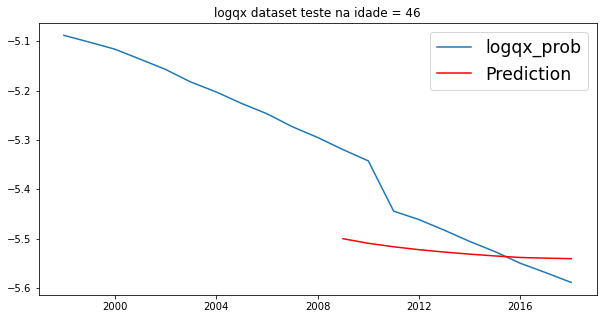

rmse:  [0.08689538]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0975
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0806
Epoch 3/500
1/1 [==============================] - 0s 26ms/step - loss: 0.0091 - mae: 0.0832
Epoch 4/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0833
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0813
Epoch 6/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0070 - mae: 0.0776
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0858
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0068 - mae: 0.0733
Epoch 9/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0037 - mae: 0.0548
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0093 - mae: 0.0800
Epoch 11/500
1/1 [==============================] - 0s 9

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0438
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0276
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0316
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0334
Epoch 92/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0259
Epoch 93/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0345
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0405
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0395
Epoch 96/500
1/1 [==============================] - 0s 957us/step - loss: 0.0016 - mae: 0.0313
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0379
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0355
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0251
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0356
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0259
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0262
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0339
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0403
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 8.3819e-04 - mae: 0.0225
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0309
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0366
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0300
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0425
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0371
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0455
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0351
Epoch 266/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0011 - mae: 0.0272
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0288
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0373
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0414
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0421
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 7.5193e-04 - mae: 0.0222
Epoch 348/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0024 - mae: 0.0361
Epoch 349/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0364
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0290
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0475
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0333
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0330
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0255
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0338
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0361
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0327
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0298
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0314
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 2.6446e-04 - mae: 0.0123
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0268
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0380
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0292
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0349
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9442e-04 - mae: 0.0232
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0324
Epoch 443/500
1/1 [==============================] - 0s 1ms/step -

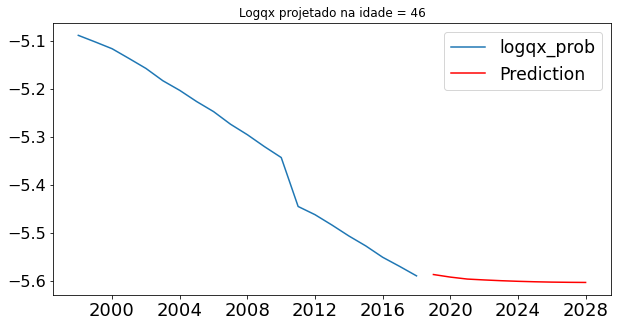

Epoch 1/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0989 - mae: 0.2508
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0928 - mae: 0.2385
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0898 - mae: 0.2345
Epoch 4/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0800 - mae: 0.2160
Epoch 5/500
1/1 [==============================] - 0s 27ms/step - loss: 0.0808 - mae: 0.2242
Epoch 6/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0750 - mae: 0.2104
Epoch 7/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0709 - mae: 0.2060
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0685 - mae: 0.2020
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0588 - mae: 0.1889
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0646 - mae: 0.1890
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0623

1/1 [==============================] - 0s 2ms/step - loss: 0.0172 - mae: 0.1271
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0153 - mae: 0.1058
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0136 - mae: 0.0926
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0114 - mae: 0.1023
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0195 - mae: 0.1314
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1244
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0159 - mae: 0.1123
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.0937
Epoch 97/500
1/1 [==============================] - 0s 965us/step - loss: 0.0169 - mae: 0.1266
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0167 - mae: 0.1198
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0200 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0695
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0264
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0894
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0439
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0484
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0464
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0077 - mae: 0.0636
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0569
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0126 - mae: 0.0861
Epoch 185/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0060 - mae: 0.0660
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0066 - mae: 0.0584
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0055 - mae: 0.0631
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0760
Epoch 266/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0410
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0601
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0680
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0445
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0356
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0565
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0609
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0739
Epoch 351/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0619
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0564
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0561
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0405
Epoch 355/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0025 - mae: 0.0390
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - mae: 0.0624
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0586
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0275
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0507
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0367
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0369
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0411
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0257
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0565
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 5.4824e-04 - mae: 0.0155
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0447
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0414
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0476
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0458
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - los

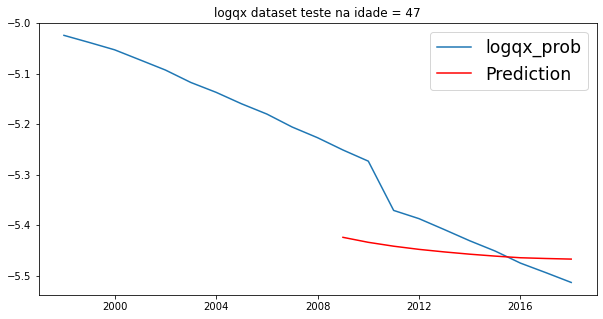

rmse:  [0.08383132]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.1049
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0139 - mae: 0.1109
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0978
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0518
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0769
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0087 - mae: 0.0689
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0502
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0547
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0551
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0597
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0322
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0393
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0317
Epoch 91/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0445
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0321
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0388
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0406
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0423
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0349
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0396
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0325
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 4.8369e-04 - mae: 0.0177
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0412
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0219
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 7.6728e-04 - mae: 0.0210
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0327
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0378
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0318
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0385
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0372
Epoch 185/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 3.5535e-04 - mae: 0.0152
Epoch 262/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0044 - mae: 0.0422
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8937e-04 - mae: 0.0233
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0305
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0387
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0303
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 5.3666e-04 - mae: 0.0168
Epoch 268/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0292
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0373
Epoch 270/500
1/1 [==============================] - 0s 21ms/step - loss: 0.0036 - mae: 0.0419
Epoch 271/500
1/1 [==============================] - 0s 5ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0273
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0246
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0273
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0325
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0363
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0409
Epoch 353/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0285
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0208
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0191
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0257
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0277
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0329
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0359
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0295
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0285
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0488
Epoch 439/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0021 - mae: 0.0247
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 9.7298e-04 - mae: 0.0217
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0300
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0339
Epoch 443/500
1/1 [==============================] - 0s 6ms/step - los

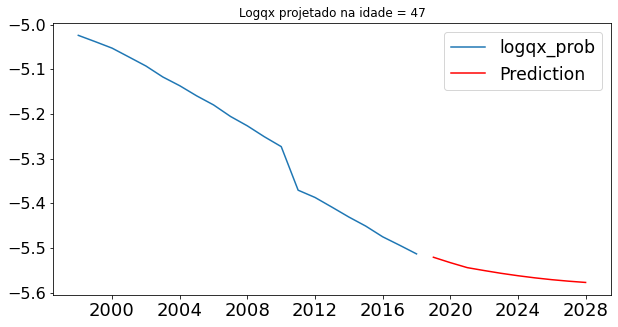

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0959 - mae: 0.2407
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0841 - mae: 0.2346
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0690 - mae: 0.2059
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0733 - mae: 0.2084
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0675 - mae: 0.2007
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0525 - mae: 0.1699
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0525 - mae: 0.1715
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0510 - mae: 0.1704
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0481 - mae: 0.1578
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0383 - mae: 0.1532
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0475 

1/1 [==============================] - 0s 3ms/step - loss: 0.0118 - mae: 0.0946
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0116 - mae: 0.0994
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0137 - mae: 0.1003
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.1071
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0175 - mae: 0.1211
Epoch 94/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0062 - mae: 0.0690
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0115 - mae: 0.1017
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0896
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0733
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0969
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0735
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0814
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0326
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0574
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0552
Epoch 181/500
1/1 [==============================] - 0s 946us/step - loss: 0.0029 - mae: 0.0481
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0753
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0696
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0361
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0715
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0488
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0475
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0600
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0381
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0575
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0818
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0403
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0708
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0420
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0575
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0569
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0301
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0481
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0530
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0416
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0700
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0375
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0442
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0592
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0307
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0585
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0347
Epoch 439/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0542
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0444
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0592
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0406
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 5.3313e-04 - mae: 0.0213
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0424
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0470
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0387
Epoch 447/500
1/1 [==============================] - 0s 2ms/step - los

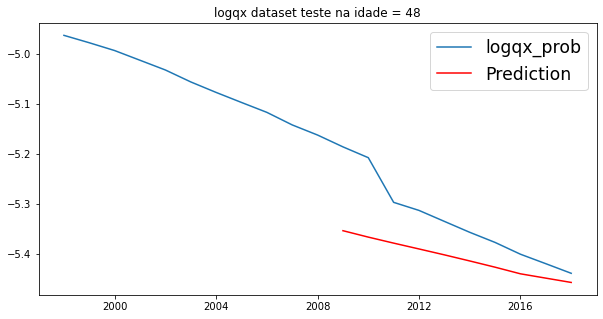

rmse:  [0.08889186]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0821
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0864
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0766
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0884
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0619
Epoch 6/500
1/1 [==============================] - 0s 992us/step - loss: 0.0095 - mae: 0.0925
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0487
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0512
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0594
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0462
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0457
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0364
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0369
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0391
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0387
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0437
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 9.8462e-04 - mae: 0.0255
Epoch 95/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0258
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0273
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0462
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 

1/1 [==============================] - 0s 4ms/step - loss: 9.8710e-04 - mae: 0.0240
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0374
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 8.8107e-04 - mae: 0.0217
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0441
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0349
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0276
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0274
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0438
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0500
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0310
Epoch 185/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0368
Epoch 262/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0389
Epoch 263/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0382
Epoch 264/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0359
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0440
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0332
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0322
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0348
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0237
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0274
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 8

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0340
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0410
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0353
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0282
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0392
Epoch 353/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0020 - mae: 0.0293
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0303
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0247
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0421
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 7.1195e-04 - mae: 0.0192
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - lo

Epoch 435/500
1/1 [==============================] - 0s 5ms/step - loss: 8.5760e-04 - mae: 0.0202
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0278
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0354
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 8.6005e-04 - mae: 0.0217
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0360
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0359
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0326
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0370
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 7.3149e-04 - mae: 0.0229
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0279
Epoch 445/500
1/1 [=============================

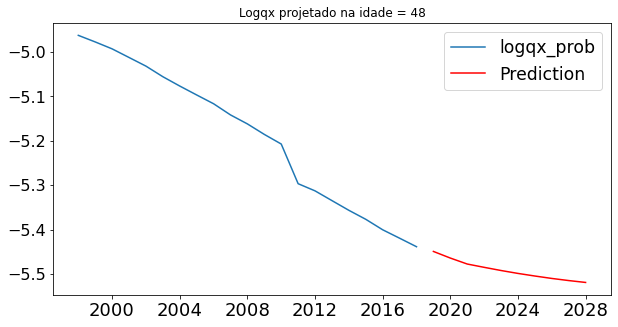

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0828 - mae: 0.2266
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0756 - mae: 0.2175
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0684 - mae: 0.2054
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0791 - mae: 0.2170
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0665 - mae: 0.2011
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0654 - mae: 0.1902
Epoch 7/500
1/1 [==============================] - 0s 764us/step - loss: 0.0497 - mae: 0.1714
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0517 - mae: 0.1746
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0512 - mae: 0.1730
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0550 - mae: 0.1791
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.048

1/1 [==============================] - 0s 843us/step - loss: 0.0110 - mae: 0.0867
Epoch 90/500
1/1 [==============================] - 0s 826us/step - loss: 0.0106 - mae: 0.0919
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0738
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0112 - mae: 0.0915
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0150 - mae: 0.0989
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0829
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0751
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - mae: 0.0849
Epoch 97/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0081 - mae: 0.0836
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0685
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027

1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0785
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0422
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0728
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0120 - mae: 0.0911
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0397
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0486
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0623
Epoch 183/500
1/1 [==============================] - 0s 976us/step - loss: 0.0033 - mae: 0.0463
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0534
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0682
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0635
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0502
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0342
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0668
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0574
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0342
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0624
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0457
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0282
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7381e-04 - mae: 0.0250
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 3.8455e-04 - mae: 0.0172
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0283
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 7.6030e-04 - mae: 0.0239
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0120 - mae: 0.0802
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0680
Epoch 354/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0576
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0389
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0447
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0310
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0440
Epoch 359/500
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0554
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0407
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0333
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0113 - mae: 0.0849
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0463
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0515
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0485
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0385
Epoch 444/500
1/1 [==============================] - 0s 960us/step - loss: 0.0043 - mae: 0.0514
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0584
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss:

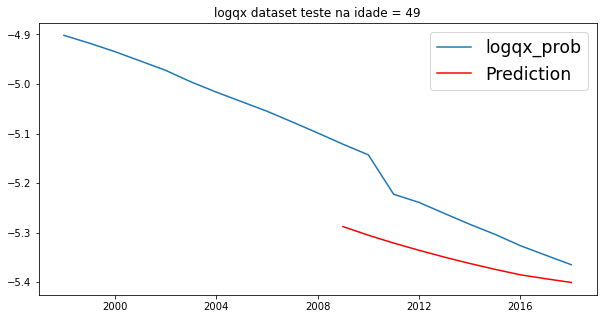

rmse:  [0.09955533]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0884
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0889
Epoch 3/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0081 - mae: 0.0764
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0100 - mae: 0.0847
Epoch 5/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0068 - mae: 0.0715
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0708
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0746
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0675
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0555
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0400
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0296
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0274
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0411
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0266
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 7.4903e-04 - mae: 0.0242
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0418
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0246
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0368
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0368
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0234
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 

1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0397
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0388
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0263
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0376
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0333
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0282
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0408
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0270
Epoch 183/500
1/1 [==============================] - 0s 7ms/step - loss: 7.6580e-04 - mae: 0.0216
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0335
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 8.6766e-04 - mae: 0.0231
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 9.2247e-04 - mae: 0.0230
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0297
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0424
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0407
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0392
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0274
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0360
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0381
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0318
Epoch 271/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 6.0376e-04 - mae: 0.0192
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 9.4778e-04 - mae: 0.0219
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 9.2616e-04 - mae: 0.0244
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0379
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0316
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0299
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 5.0449e-04 - mae: 0.0180
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0332
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0413
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0430
Epoch 357/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0294
Epoch 434/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0014 - mae: 0.0289
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 7.8627e-04 - mae: 0.0225
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0377
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 7.6561e-04 - mae: 0.0198
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 9.5670e-04 - mae: 0.0253
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0280
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0328
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 5.3034e-04 - mae: 0.0201
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0301
Epoch 443/500
1/1 [==============================] - 0s 6

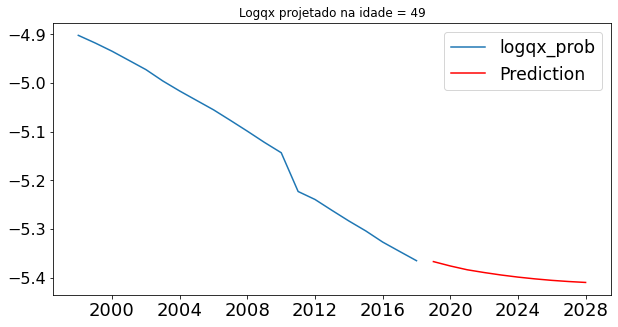

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0532 - mae: 0.1845
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0457 - mae: 0.1664
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0565 - mae: 0.1848
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0411 - mae: 0.1526
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0431 - mae: 0.1612
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0425 - mae: 0.1594
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0285 - mae: 0.1309
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0308 - mae: 0.1366
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0259 - mae: 0.1313
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0201 - mae: 0.1245
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0274 

1/1 [==============================] - 0s 3ms/step - loss: 0.0154 - mae: 0.1155
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0774
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - mae: 0.0923
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0810
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.0947
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0156 - mae: 0.1150
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0941
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0474
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0098 - mae: 0.0869
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0844
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - ma

1/1 [==============================] - 0s 5ms/step - loss: 0.0066 - mae: 0.0644
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0527
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0406
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0618
Epoch 180/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0065 - mae: 0.0746
Epoch 181/500
1/1 [==============================] - 0s 995us/step - loss: 0.0054 - mae: 0.0632
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0429
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0442
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0305
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0521
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss

Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0464
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0437
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0411
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0386
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0408
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0445
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9265e-04 - mae: 0.0222
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0556
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0506
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0522
Epoch 273/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0480
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0060 - mae: 0.0580
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0351
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0340
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0470
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0525
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0383
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0507
Epoch 357/500
1/1 [==============================] - 0s 970us/step - loss: 0.0014 - mae: 0.0284
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0263
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0512
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 9.5501e-04 - mae: 0.0270
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0362
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0406
Epoch 440/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0043 - mae: 0.0566
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0447
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0658
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0565
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0453
Epoch 445/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0500
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - lo

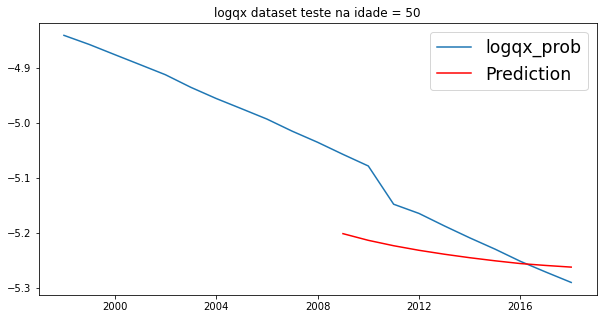

rmse:  [0.07389743]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0077 - mae: 0.0759
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0722
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0556
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0815
Epoch 5/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0628
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0628
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0694
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0771
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0502
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0443
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0297
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0197
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 6.4216e-04 - mae: 0.0176
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0351
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0258
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0540
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0221
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 9.0538e-04 - mae: 0.0234
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 8.4764e-04 - mae: 0.0236
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 7.2318e-04 - mae: 0.0173
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - l

1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0251
Epoch 175/500
1/1 [==============================] - 0s 994us/step - loss: 0.0038 - mae: 0.0364
Epoch 176/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0013 - mae: 0.0256
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0317
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0297
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0288
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0453
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0412
Epoch 182/500
1/1 [==============================] - 0s 808us/step - loss: 0.0034 - mae: 0.0416
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0241
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0268
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9695e-04 - mae: 0.0216
Epoch 262/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0390
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 6.3987e-04 - mae: 0.0199
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0229
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0397
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0350
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0242
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0282
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0247
Epoch 270/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 9.8025e-04 - mae: 0.0228
Epoch 347/500
1/1 [==============================] - 0s 3ms/step - loss: 7.8255e-04 - mae: 0.0218
Epoch 348/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0291
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 8.6409e-04 - mae: 0.0200
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 6.0933e-04 - mae: 0.0158
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0287
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0260
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0324
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0374
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0270
Epoch 356/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 6.4099e-04 - mae: 0.0191
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0352
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0281
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0329
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 9.6849e-04 - mae: 0.0258
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0326
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0369
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0394
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0339
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0395
Epoch 442/500
1/1 [==============================] - 0s 2ms/step -

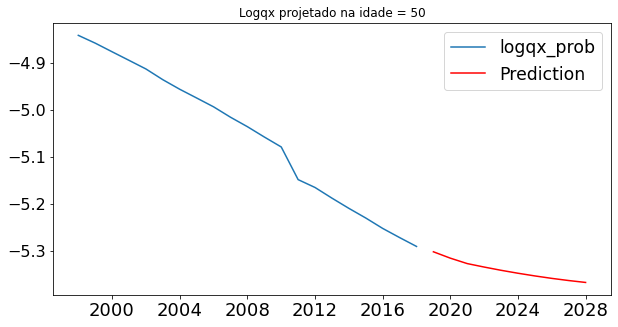

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0704 - mae: 0.2151
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0660 - mae: 0.1995
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0555 - mae: 0.1838
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0563 - mae: 0.1874
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0496 - mae: 0.1722
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0363 - mae: 0.1394
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0322 - mae: 0.1405
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0307 - mae: 0.1473
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0286 - mae: 0.1487
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0309 - mae: 0.1390
Epoch 11/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0261 

1/1 [==============================] - 0s 4ms/step - loss: 0.0120 - mae: 0.0993
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0726
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0855
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0869
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0919
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0952
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0962
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0099 - mae: 0.0931
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0921
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0088 - mae: 0.0884
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0091 - mae: 0.0820
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0789
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0421
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0361
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0507
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0503
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0312
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0260
Epoch 184/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0030 - mae: 0.0438
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0608
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0415
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0249
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0428
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0697
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0539
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0256
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0494
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0537
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0606
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0477
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0471
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0430
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0374
Epoch 352/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0042 - mae: 0.0427
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0398
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 5.6473e-04 - mae: 0.0198
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0273
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9302e-04 - mae: 0.0253
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0463
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0466
Epoch 359/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0427
Epoch 436/500
1/1 [==============================] - 0s 6ms/step - loss: 5.7525e-04 - mae: 0.0173
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0410
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 4.6591e-04 - mae: 0.0184
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0309
Epoch 440/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0026 - mae: 0.0396
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0361
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0609
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0520
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0266
Epoch 445/500
1/1 [==============================] - 0s 3ms/step 

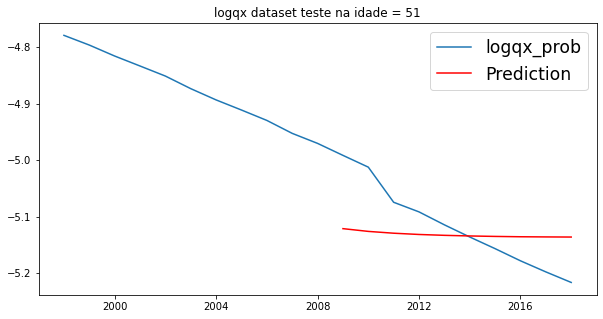

rmse:  [0.06879083]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0665
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0694
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0753
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0558
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0672
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0526
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0679
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0493
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0566
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0463
Epoch 11/500
1/1 [==============================] - 0s 877u

1/1 [==============================] - 0s 1ms/step - loss: 9.5799e-04 - mae: 0.0246
Epoch 89/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0021 - mae: 0.0359
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0292
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0075 - mae: 0.0512
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 7.8884e-04 - mae: 0.0230
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0400
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0320
Epoch 95/500
1/1 [==============================] - 0s 998us/step - loss: 0.0030 - mae: 0.0390
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9462e-04 - mae: 0.0237
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 6.4014e-04 - mae: 0.0191
Epoch 98/500
1/1 [==============================] - 0s 1ms/step 

1/1 [==============================] - 0s 1ms/step - loss: 8.0275e-04 - mae: 0.0234
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0296
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0192
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0299
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0271
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0279
Epoch 180/500
1/1 [==============================] - 0s 12ms/step - loss: 8.0262e-04 - mae: 0.0213
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0288
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6753e-04 - mae: 0.0209
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0371
Epoch 184/500
1/1 [==============================] - 0s 1ms/s

1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0273
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0288
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0318
Epoch 263/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0319
Epoch 264/500
1/1 [==============================] - 0s 14ms/step - loss: 6.5442e-04 - mae: 0.0194
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0340
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 5.6025e-04 - mae: 0.0161
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 1.9431e-04 - mae: 0.0105
Epoch 268/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0330
Epoch 269/500
1/1 [==============================] - 0s 947us/step - loss: 0.0021 - mae: 0.0326
Epoch 270/500
1/1 [==============================] - 0s 3ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0266
Epoch 346/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0378
Epoch 347/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0279
Epoch 348/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0022 - mae: 0.0348
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0274
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0400
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7176e-04 - mae: 0.0252
Epoch 352/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0370
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0266
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0343
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0319
Epoch 432/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0445
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0377
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 7.8855e-04 - mae: 0.0215
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0250
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0266
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0245
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0314
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0344
Epoch 440/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0044 - mae: 0.0484
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - lo

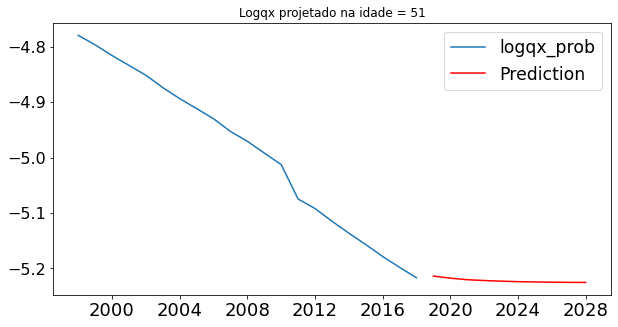

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2385
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0660 - mae: 0.2129
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0619 - mae: 0.2008
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0518 - mae: 0.1865
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0466 - mae: 0.1714
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0593 - mae: 0.1916
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0500 - mae: 0.1746
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0414 - mae: 0.1652
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0480 - mae: 0.1824
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0355 - mae: 0.1495
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0262 

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0499
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0794
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0624
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0597
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0571
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0706
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0748
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0544
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0581
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0310
Epoch 99/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - ma

1/1 [==============================] - 0s 7ms/step - loss: 0.0027 - mae: 0.0336
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0605
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 9.4438e-04 - mae: 0.0230
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0411
Epoch 180/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0567
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0425
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0552
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0461
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0312
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0373
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0301
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0376
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0336
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0376
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0378
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0295
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0326
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0418
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0356
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0289
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0309
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0492
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0320
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0284
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0337
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0244
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0492
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0328
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 6.6969e-04 - mae: 0.0194
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0265
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0305
Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0420
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 8.5178e-04 - mae: 0.0238
Epoch 437/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0024 - mae: 0.0385
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 7.3988e-04 - mae: 0.0206
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 9.4522e-04 - mae: 0.0268
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 7.5065e-04 - mae: 0.0226
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0403
Epoch 442/500
1/1 [==============================] - 0s 954us/step - loss: 0.0010 - mae: 0.0261
Epoch 443/500
1/1 [==============================] - 0s 946us/step - loss: 0.0018 - mae: 0.0297
Epoch 444/500
1/1 [==============================] - 

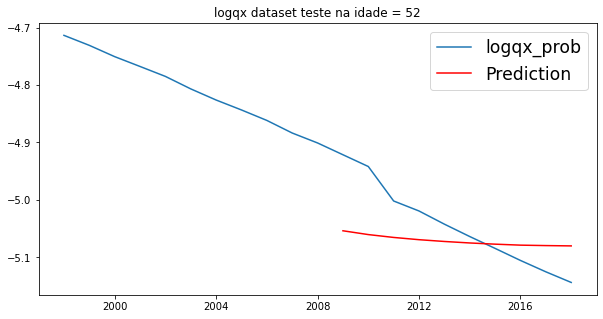

rmse:  [0.06780202]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0896
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0852
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0785
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0784
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0568
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0483
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0543
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0482
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0488
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0400
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0296
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0339
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 4.8767e-04 - mae: 0.0179
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0248
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0264
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7996e-04 - mae: 0.0210
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 7.5482e-04 - mae: 0.0219
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0415
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8217e-04 - mae: 0.0185
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0300
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 8.0349e-04 - mae: 0.0223
Epoch 175/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0286
Epoch 176/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0343
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0280
Epoch 178/500
1/1 [==============================] - 0s 946us/step - loss: 0.0025 - mae: 0.0362
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 4.8932e-04 - mae: 0.0189
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0230
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0278
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0513
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0268
Epoch 184/500
1/1 [==============================] - 0s 2ms/step

1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0336
Epoch 260/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0310
Epoch 261/500
1/1 [==============================] - 0s 4ms/step - loss: 8.4794e-04 - mae: 0.0256
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 6.5317e-04 - mae: 0.0182
Epoch 263/500
1/1 [==============================] - 0s 6ms/step - loss: 8.1465e-04 - mae: 0.0225
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7641e-04 - mae: 0.0204
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0377
Epoch 266/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0272
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0379
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5020e-04 - mae: 0.0238
Epoch 269/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0375
Epoch 346/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0011 - mae: 0.0298
Epoch 347/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0306
Epoch 348/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0287
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0357
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0424
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0236
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0311
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 7.3170e-04 - mae: 0.0218
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0336
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - lo

1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0295
Epoch 431/500
1/1 [==============================] - 0s 8ms/step - loss: 9.9256e-04 - mae: 0.0209
Epoch 432/500
1/1 [==============================] - 0s 9ms/step - loss: 8.2511e-04 - mae: 0.0187
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0535
Epoch 434/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0290
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 9.9862e-04 - mae: 0.0225
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0312
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 3.0592e-04 - mae: 0.0132
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 9.5533e-04 - mae: 0.0233
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0267
Epoch 440/500
1/1 [==============================] - 0

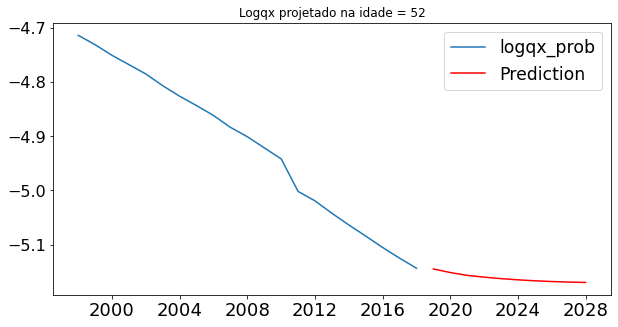

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0706 - mae: 0.2109
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0622 - mae: 0.2004
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0554 - mae: 0.1926
Epoch 4/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0527 - mae: 0.1828
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0539 - mae: 0.1812
Epoch 6/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0514 - mae: 0.1832
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0429 - mae: 0.1650
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0415 - mae: 0.1632
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0449 - mae: 0.1708
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0370 - mae: 0.1566
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0307 

1/1 [==============================] - 0s 4ms/step - loss: 0.0139 - mae: 0.1063
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0793
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.0977
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.1070
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0681
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0925
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0131 - mae: 0.1046
Epoch 96/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0091 - mae: 0.0891
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0768
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0080 - mae: 0.0801
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - m

1/1 [==============================] - 0s 2ms/step - loss: 8.3471e-04 - mae: 0.0233
Epoch 177/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0371
Epoch 178/500
1/1 [==============================] - 0s 948us/step - loss: 0.0015 - mae: 0.0278
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0406
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0381
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0406
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0282
Epoch 183/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0014 - mae: 0.0330
Epoch 184/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0495
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0583
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0345
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0524
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0309
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0444
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0662
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0391
Epoch 268/500
1/1 [==============================] - 0s 19ms/step - loss: 0.0053 - mae: 0.0602
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0298
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0310
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0414
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0621
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0320
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0351
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0417
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0362
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0296
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0594
Epoch 355/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0038 - mae: 0.0523
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0436
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0260
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0

Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 8.5744e-04 - mae: 0.0248
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0337
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 4.9058e-04 - mae: 0.0164
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 8.4689e-04 - mae: 0.0202
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0367
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0465
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0403
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0694
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0491
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0385
Epoch 445/500
1/1 [=============================

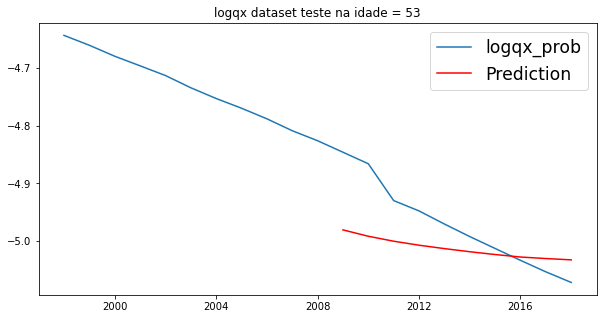

rmse:  [0.06845673]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0637
Epoch 2/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0058 - mae: 0.0646
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0678
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0660
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0600
Epoch 6/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0034 - mae: 0.0467
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0564
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0391
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0384
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0355
Epoch 11/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0500
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0393
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0338
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0338
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0297
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3092e-04 - mae: 0.0221
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0339
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 7.1127e-04 - mae: 0.0185
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0265
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0346
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0

1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0389
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 9.5502e-04 - mae: 0.0266
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 6.0079e-04 - mae: 0.0163
Epoch 177/500
1/1 [==============================] - 0s 10ms/step - loss: 6.9490e-04 - mae: 0.0206
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0503
Epoch 179/500
1/1 [==============================] - 0s 9ms/step - loss: 4.9229e-04 - mae: 0.0193
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 9.9947e-04 - mae: 0.0201
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0384
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0312
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0298
Epoch 184/500
1/1 [==============================] - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0314
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0261
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 7.2164e-04 - mae: 0.0222
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0331
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 8.9098e-04 - mae: 0.0242
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0323
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0336
Epoch 267/500
1/1 [==============================] - 0s 11ms/step - loss: 7.9551e-04 - mae: 0.0239
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0299
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0367
Epoch 270/500
1/1 [==============================] - 0s 4ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0284
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0430
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0221
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0394
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7289e-04 - mae: 0.0197
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 6.3576e-04 - mae: 0.0193
Epoch 352/500
1/1 [==============================] - 0s 8ms/step - loss: 9.9450e-04 - mae: 0.0253
Epoch 353/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0285
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0289
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0275
Epoch 356/500
1/1 [==============================] - 0s 11ms/s

1/1 [==============================] - 0s 1ms/step - loss: 7.1271e-04 - mae: 0.0218
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0254
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 9.7030e-04 - mae: 0.0223
Epoch 435/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0384
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0326
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0295
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0265
Epoch 439/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0289
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 8.7080e-04 - mae: 0.0227
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0244
Epoch 442/500
1/1 [==============================] - 0s 3ms/st

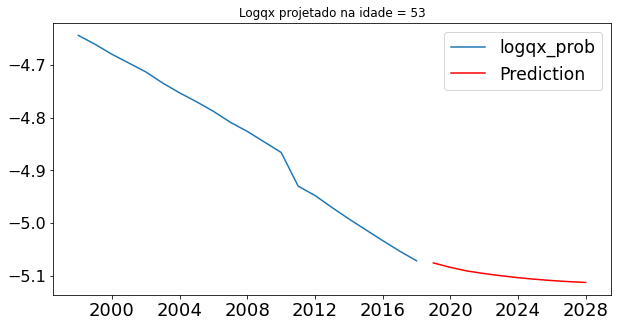

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1042 - mae: 0.2619
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0858 - mae: 0.2313
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0890 - mae: 0.2355
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0803 - mae: 0.2168
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0661 - mae: 0.1908
Epoch 6/500
1/1 [==============================] - 0s 983us/step - loss: 0.0605 - mae: 0.1967
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0579 - mae: 0.1821
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0504 - mae: 0.1743
Epoch 9/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0203 - mae: 0.1196
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0316 - mae: 0.1550
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.030

1/1 [==============================] - 0s 4ms/step - loss: 0.0091 - mae: 0.0935
Epoch 89/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0103 - mae: 0.0924
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1156
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0128 - mae: 0.0955
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1170
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0664
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0843
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.1247
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0180 - mae: 0.1275
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0762
Epoch 98/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0192 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0404
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0464
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0387
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0369
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0500
Epoch 180/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0554
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0317
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0433
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0431
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0461
Epoch 185/500
1/1 [==============================] - 0s 7ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0354
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0374
Epoch 264/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0022 - mae: 0.0379
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0072 - mae: 0.0663
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0420
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0337
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0379
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0399
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0097 - mae: 0.0865
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0529
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0466
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0332
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0260
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0346
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0299
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0426
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0327
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0460
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0494
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0332
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0353
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0530
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0442
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0450
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0322
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0333
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0372
Epoch 443/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0478
Epoch 444/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0412
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0398
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

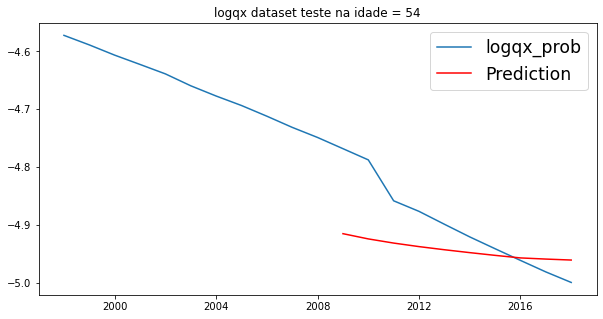

rmse:  [0.07358729]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0902
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.1006
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0886
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0699
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0589
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0574
Epoch 7/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0581
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0637
Epoch 9/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0035 - mae: 0.0516
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0459
Epoch 11/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0357
Epoch 89/500
1/1 [==============================] - 0s 25ms/step - loss: 0.0031 - mae: 0.0388
Epoch 90/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0438
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0348
Epoch 92/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0011 - mae: 0.0253
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0450
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0310
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0356
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0529
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0402
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0337
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0316
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0381
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0311
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5003e-04 - mae: 0.0186
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0377
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0453
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0434
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0303
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0277
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0333
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0303
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0382
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0440
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0346
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0460
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0307
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0423
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0318
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 8.1545e-04 - mae: 0.0222
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0235
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0238
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0398
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0290
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0344
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0333
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6524e-04 - mae: 0.0237
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0339
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0474
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0448
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0353
Epoch 433/500
1/1 [==============================] - 0s 2ms/step - loss: 8.7800e-04 - mae: 0.0217
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0315
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 1.6353e-04 - mae: 0.0099
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0232
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0343
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 5.4948e-04 - mae: 0.0187
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0249
Epoch 440/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0321
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0259
Epoch 442/500
1/1 [==============================] - 0s 2ms/st

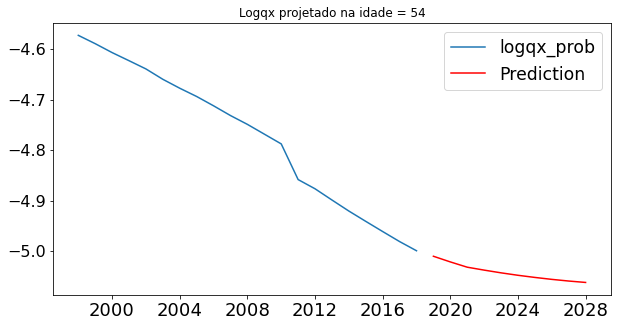

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1017 - mae: 0.2655
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1000 - mae: 0.2522
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0897 - mae: 0.2390
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0963 - mae: 0.2474
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0939 - mae: 0.2352
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0797 - mae: 0.2228
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0757 - mae: 0.2178
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0637 - mae: 0.1960
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0626 - mae: 0.1916
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0635 - mae: 0.1956
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0559 

1/1 [==============================] - 0s 1ms/step - loss: 0.0207 - mae: 0.1422
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0165 - mae: 0.1228
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0141 - mae: 0.1118
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.1122
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0148 - mae: 0.1157
Epoch 94/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0133 - mae: 0.0968
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0161 - mae: 0.1119
Epoch 96/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0177 - mae: 0.1249
Epoch 97/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0155 - mae: 0.1212
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1323
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0368 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0561
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0644
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0315
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0331
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0091 - mae: 0.0766
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0725
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0577
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0158 - mae: 0.0970
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0641
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0271
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0565
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0454
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0447
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0645
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0431
Epoch 268/500
1/1 [==============================] - 0s 993us/step - loss: 0.0035 - mae: 0.0401
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0617
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0477
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0446
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0527
Epoch 273/500
1/1 [==============================] - 0s 4ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0579
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0452
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0401
Epoch 353/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0719
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0449
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0396
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0376
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0469
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0421
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0354
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0392
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 9.1443e-04 - mae: 0.0229
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0429
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0500
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 5.5518e-04 - mae: 0.0196
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0300
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 8.1524e-04 - mae: 0.0180
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0378
Epoch 445/500
1/1 [==============================] - 0s 937us/step - loss: 0.0018 - mae: 0.0346
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0429
Epoch 447/500
1/1 [==============================] - 0s 1ms/

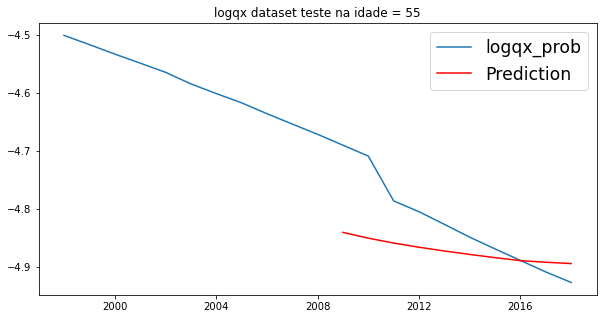

rmse:  [0.07511279]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0907
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0728
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0735
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - mae: 0.0950
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0746
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0732
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0608
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0673
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0647
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0429
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0392
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0353
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0396
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0392
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0327
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0260
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0436
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0292
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0426
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0448
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0332
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0337
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0335
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0434
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0468
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0254
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0268
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0383
Epoch 182/500
1/1 [==============================] - 0s 11ms/step - loss: 6.4706e-04 - mae: 0.0184
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0266
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - lo

1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0255
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0429
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0270
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0257
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0432
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0292
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0407
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0316
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0514
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0436
Epoch 270/500
1/1 [==============================] - 0s 983us/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0348
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0288
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 1.8758e-04 - mae: 0.0092
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0388
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0411
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0396
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 8.7689e-04 - mae: 0.0257
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 6.2388e-04 - mae: 0.0193
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0338
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0343
Epoch 357/500
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 1ms/step - loss: 7.0386e-04 - mae: 0.0188
Epoch 434/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0014 - mae: 0.0299
Epoch 435/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0021 - mae: 0.0303
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0227
Epoch 437/500
1/1 [==============================] - ETA: 0s - loss: 7.1403e-04 - mae: 0.018 - 0s 5ms/step - loss: 7.1403e-04 - mae: 0.0182
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0371
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7376e-04 - mae: 0.0226
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 6.9343e-04 - mae: 0.0211
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0382
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 7.0747e-04 - mae: 0.0201
Epoch 443/5

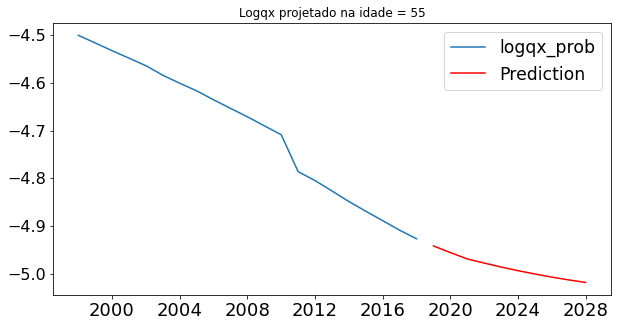

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1090 - mae: 0.2676
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1093 - mae: 0.2652
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1063 - mae: 0.2578
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0940 - mae: 0.2490
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0984 - mae: 0.2483
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0705 - mae: 0.2131
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0769 - mae: 0.2203
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0678 - mae: 0.2031
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0626 - mae: 0.1972
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0609 - mae: 0.1909
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0643 

1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.1140
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0121 - mae: 0.0926
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0082 - mae: 0.0835
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0970
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0957
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0194 - mae: 0.1296
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0213 - mae: 0.1414
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0167 - mae: 0.1150
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0166 - mae: 0.1130
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0101 - mae: 0.0907
Epoch 99/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0164 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0379
Epoch 177/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0639
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0194 - mae: 0.1016
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0507
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0663
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0495
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0567
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0861
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0742
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0527
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0304
Epoch 264/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0024 - mae: 0.0391
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0620
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0390
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0383
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0590
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0411
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0472
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0641
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0313
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0080 - mae: 0.0803
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0506
Epoch 352/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0408
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0799
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0268
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0395
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0496
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0492
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0732
Epoch 359/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0011 - mae: 0.0299
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0452
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0417
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0474
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0397
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0259
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 9.0808e-04 - mae: 0.0203
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0430
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0441
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 6.4079e-04 - mae: 0.0222
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0469
Epoch 447/500
1/1 [==============================] - 0s 2ms/step -

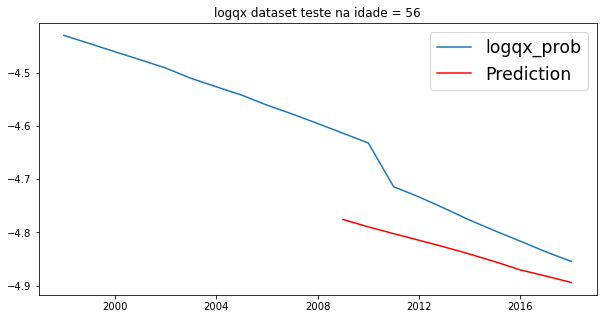

rmse:  [0.09214988]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0212 - mae: 0.1237
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0885
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0890
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0718
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0689
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0751
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0745
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0661
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0641
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0582
Epoch 11/500
1/1 [==============================] - 0s 9ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0380
Epoch 89/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0020 - mae: 0.0345
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0424
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0415
Epoch 92/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0255
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0360
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0333
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0495
Epoch 96/500
1/1 [==============================] - 0s 970us/step - loss: 0.0029 - mae: 0.0348
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0364
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0042 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0439
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0358
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3289e-04 - mae: 0.0234
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0323
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0529
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0523
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0388
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0402
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0310
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0305
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0403
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0306
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0285
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0406
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0408
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0415
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0439
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0448
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0323
Epoch 270/500
1/1 [==============================] - ETA: 0s - loss: 0.0017 - mae: 0.035 - 0s 1ms/step - loss: 0.0017 - mae: 0.0356
Epoch 271/500
1/1 [=================

1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0324
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0323
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0378
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0336
Epoch 351/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0515
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0310
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0334
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0508
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0260
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0233
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0418
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0315
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0251
Epoch 436/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0028 - mae: 0.0419
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0407
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0315
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0313
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0436
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0475
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 8.2062e-04 - mae: 0.0212
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - los

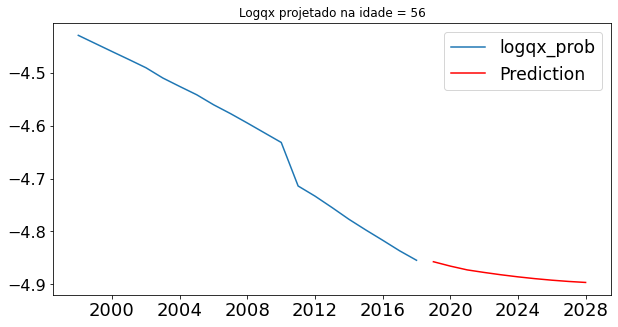

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0929 - mae: 0.2390
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0868 - mae: 0.2278
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0953 - mae: 0.2312
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0819 - mae: 0.2193
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0716 - mae: 0.2094
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0595 - mae: 0.1889
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0519 - mae: 0.1731
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0519 - mae: 0.1785
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0449 - mae: 0.1626
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0385 - mae: 0.1676
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0345 

1/1 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0754
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.1073
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mae: 0.1317
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.1187
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0973
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1098
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0217 - mae: 0.1397
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0222 - mae: 0.1415
Epoch 97/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0164 - mae: 0.1234
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0137 - mae: 0.1062
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0148 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0553
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.0731
Epoch 178/500
1/1 [==============================] - 0s 987us/step - loss: 0.0077 - mae: 0.0715
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0595
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0537
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0621
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0861
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0646
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0592
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0677
Epoch 186/500
1/1 [==============================] - 0s 968us/step - los

1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0416
Epoch 264/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0416
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0414
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0468
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0477
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0474
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0420
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - mae: 0.0778
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0655
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0394
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0438
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0637
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0050 - mae: 0.0551
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0356
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0399
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0541
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6893e-04 - mae: 0.0281
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0366
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0325
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0461
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - los

Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0326
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0439
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0621
Epoch 440/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0560
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0509
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0576
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0395
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0445
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0398
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 7.1131e-04 - mae: 0.0226
Epoch 447/500
1/1 [==============================] - 0s 

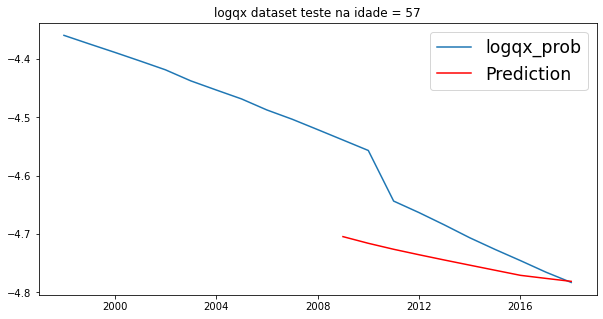

rmse:  [0.08518659]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - mae: 0.1044
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1125
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.1030
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0834
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0583
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0722
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0804
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0899
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0593
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0525
Epoch 11/500
1/1 [==============================] - 0s 7ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0420
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0305
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0304
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0379
Epoch 92/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0375
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0339
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0486
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0341
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0460
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0330
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0418
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0390
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0430
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0333
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0405
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0333
Epoch 180/500
1/1 [==============================] - 0s 988us/step - loss: 0.0025 - mae: 0.0399
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0411
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0338
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 3.7061e-04 - mae: 0.0173
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - l

Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0449
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0298
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0377
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 9.2900e-04 - mae: 0.0214
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0415
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0284
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0516
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0269
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0389
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0439
Epoch 271/500
1/1 [==============================] - 0s 

Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 6.8278e-04 - mae: 0.0200
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0382
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0329
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0465
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4278e-04 - mae: 0.0236
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0274
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0319
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0289
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0375
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0316
Epoch 358/500
1/1 [==============================] -

1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0269
Epoch 435/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0245
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0228
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0216
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0253
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0382
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0334
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0423
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 7.3622e-04 - mae: 0.0220
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0507
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - los

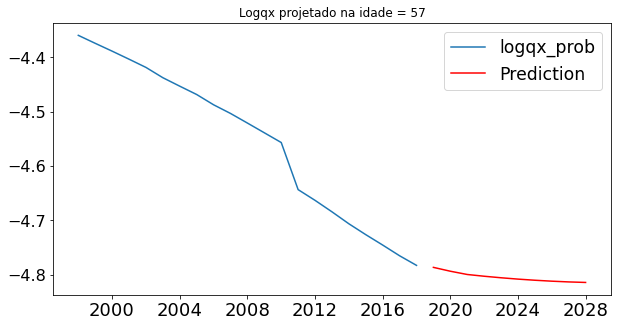

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0875 - mae: 0.2250
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0723 - mae: 0.2061
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0722 - mae: 0.2015
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0634 - mae: 0.1943
Epoch 5/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0639 - mae: 0.1894
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0613 - mae: 0.1890
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0716 - mae: 0.2135
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0579 - mae: 0.1877
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0534 - mae: 0.1951
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0398 - mae: 0.1640
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0340 

1/1 [==============================] - 0s 10ms/step - loss: 0.0181 - mae: 0.1309
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0111 - mae: 0.1012
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0233 - mae: 0.1493
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.1030
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1556
Epoch 94/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0109 - mae: 0.0961
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0918
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.1094
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.1053
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.1080
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0190 - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0726
Epoch 177/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0085 - mae: 0.0819
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0946
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0127 - mae: 0.1028
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0644
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0581
Epoch 182/500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.069 - 0s 1ms/step - loss: 0.0073 - mae: 0.0693
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0490
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0494
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0821
Epoch 186/500
1/1 [=================

1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0644
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0576
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0079 - mae: 0.0665
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0598
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0480
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0623
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0859
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0654
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0463
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0580
Epoch 272/500
1/1 [==============================] - 0s 8ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0461
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0661
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0334
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0612
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0418
Epoch 353/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0351
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - mae: 0.0777
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0492
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0347
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0596
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0323
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0252
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0470
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0864
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0497
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0580
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0458
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0298
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0457
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0443
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

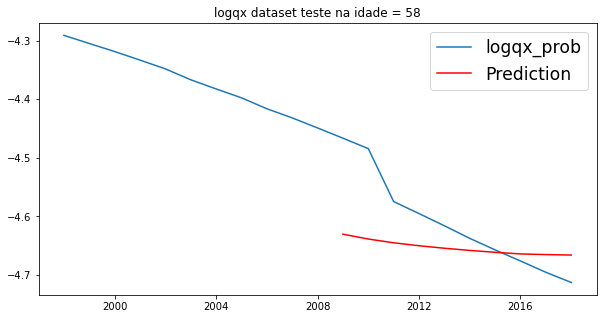

rmse:  [0.07980868]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0172 - mae: 0.1185
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0799
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0959
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0947
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0654
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0087 - mae: 0.0809
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0675
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0532
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0642
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0603
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0365
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0370
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0330
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0433
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0438
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0348
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0438
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 9.8450e-04 - mae: 0.0234
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0413
Epoch 97/500
1/1 [==============================] - 0s 971us/step - loss: 0.0012 - mae: 0.0273
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.003

1/1 [==============================] - 0s 18ms/step - loss: 0.0022 - mae: 0.0407
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0396
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0349
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0332
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0240
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0391
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0416
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0448
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0280
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0391
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0543
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0379
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0393
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0390
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0450
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0378
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0359
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0349
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0375
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0446
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 5.3562e-04 - mae: 0.0197
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0289
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0266
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0364
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0235
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0426
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0373
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0308
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0324
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0378
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0265
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0336
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0505
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0510
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0281
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0482
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0283
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0306
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0468
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 7.6541e-04 - mae: 0.0209
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - los

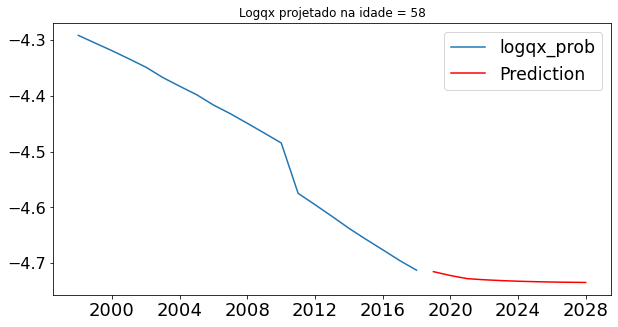

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2236 - mae: 0.3974
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1804 - mae: 0.3630
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1892 - mae: 0.3676
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1736 - mae: 0.3529
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1614 - mae: 0.3471
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1561 - mae: 0.3211
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1466 - mae: 0.3080
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.1553 - mae: 0.3163
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1366 - mae: 0.2909
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1173 - mae: 0.2700
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1187 

1/1 [==============================] - 0s 4ms/step - loss: 0.0242 - mae: 0.1416
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0201 - mae: 0.1390
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0328 - mae: 0.1641
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0371 - mae: 0.1827
Epoch 93/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0131 - mae: 0.1087
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0323 - mae: 0.1712
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0283 - mae: 0.1646
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0285 - mae: 0.1583
Epoch 97/500
1/1 [==============================] - 0s 930us/step - loss: 0.0284 - mae: 0.1464
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0162 - mae: 0.1189
Epoch 99/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0135 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.1021
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0678
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0101 - mae: 0.0890
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0672
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0743
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0891
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0987
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0666
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0907
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.1016
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0078 - mae: 0.0802
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0109 - mae: 0.0772
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.1081
Epoch 266/500
1/1 [==============================] - 0s 931us/step - loss: 0.0026 - mae: 0.0468
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0597
Epoch 268/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0066 - mae: 0.0547
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0525
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0866
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0150 - mae: 0.0982
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0118 - mae: 0.0818
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 7ms/step - loss: 0.0023 - mae: 0.0432
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0747
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0594
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0614
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0150 - mae: 0.1058
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0421
Epoch 355/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0031 - mae: 0.0426
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0390
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0719
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0580
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0030 - mae: 0.0502
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0575
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0462
Epoch 439/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0068 - mae: 0.0597
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0633
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0444
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0430
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0737
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0733
Epoch 445/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0072 - mae: 0.0618
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss:

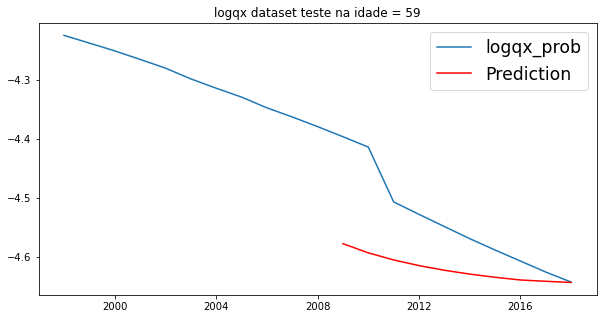

rmse:  [0.09749442]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0286 - mae: 0.1590
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0187 - mae: 0.1211
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1278
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0162 - mae: 0.1042
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.1004
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0906
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0692
Epoch 8/500
1/1 [==============================] - 0s 936us/step - loss: 0.0130 - mae: 0.0992
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0751
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0712
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0331
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 9.7798e-04 - mae: 0.0264
Epoch 90/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0047 - mae: 0.0569
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0267
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0373
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0401
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0409
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0548
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0327
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0417
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 

1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0514
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0481
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0402
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0415
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0259
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0342
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0325
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0290
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5392e-04 - mae: 0.0193
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0303
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0257
Epoch 263/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0280
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0402
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0272
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0281
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0433
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0373
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0357
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0405
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0332
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0336
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0390
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0363
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0285
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0434
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0298
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0328
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0239
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0416
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0501
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0304
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0234
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0402
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0312
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0355
Epoch 441/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0350
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0261
Epoch 443/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0487
Epoch 444/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0419
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0396
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 6

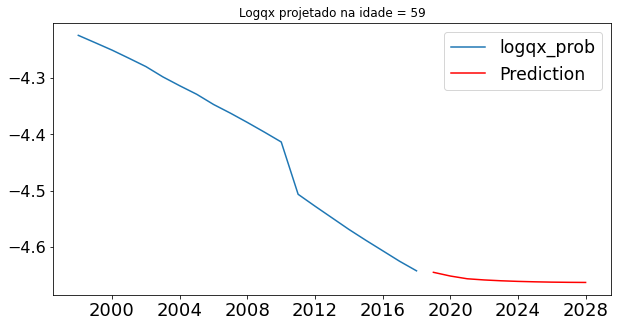

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1280 - mae: 0.2871
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1104 - mae: 0.2580
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1199 - mae: 0.2792
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1153 - mae: 0.2608
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1031 - mae: 0.2463
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0903 - mae: 0.2232
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1005 - mae: 0.2482
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0879 - mae: 0.2274
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0767 - mae: 0.2188
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0696 - mae: 0.2112
Epoch 11/500
1/1 [==============================] - 0s 978us/step - loss: 0.066

1/1 [==============================] - 0s 5ms/step - loss: 0.0156 - mae: 0.1090
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0195 - mae: 0.1355
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0304 - mae: 0.1580
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0321 - mae: 0.1582
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0177 - mae: 0.1237
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0364 - mae: 0.1818
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0206 - mae: 0.1334
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0219 - mae: 0.1346
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0277 - mae: 0.1622
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1139
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0236 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0279 - mae: 0.1359
Epoch 177/500
1/1 [==============================] - 0s 993us/step - loss: 0.0059 - mae: 0.0702
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0536
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0601
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0133 - mae: 0.0882
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0466
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0644
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0732
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0448
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0591
Epoch 186/500
1/1 [==============================] - 0s 8ms/step - loss:

1/1 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0233
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0522
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0056 - mae: 0.0486
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0784
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0637
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0699
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - mae: 0.0925
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0696
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0523
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0562
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0686
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0381
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0487
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0302
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0497
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0603
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0632
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0700
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0395
Epoch 359/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0509
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0671
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0319
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0562
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0266
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0440
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0411
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0592
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0440
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0434
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0360
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

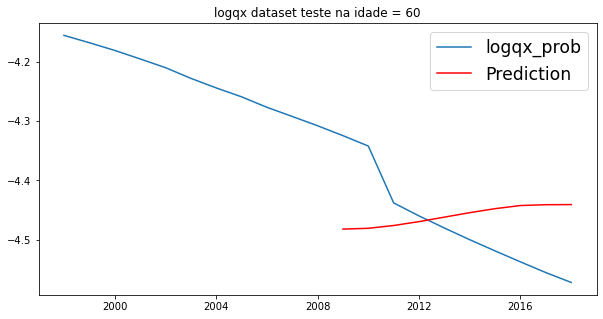

rmse:  [0.09608882]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0856
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.1062
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0793
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0576
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0679
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0604
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0347
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0598
Epoch 9/500
1/1 [==============================] - 0s 948us/step - loss: 0.0061 - mae: 0.0573
Epoch 10/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0026 - mae: 0.0425
Epoch 11/500
1/1 [==============================] - 0s 1

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0294
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0539
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0575
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0276
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0397
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0388
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 9.5704e-04 - mae: 0.0259
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0518
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0346
Epoch 97/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0518
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0309
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0410
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0421
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0507
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0344
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0367
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0466
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0298
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0253
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0414
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0386
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0413
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0290
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0378
Epoch 266/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0445
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0320
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0259
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0341
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0346
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0265
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0335
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0431
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0297
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0395
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0426
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 6.9272e-04 - mae: 0.0221
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0427
Epoch 356/500
1/1 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.028 - 0s 3ms/step - loss: 0.0012 - mae: 0.0283
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0382
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0338
Epoch 359/500
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0280
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0315
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0257
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0424
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0289
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0241
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 8.5011e-04 - mae: 0.0216
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0266
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0307
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0279
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - los

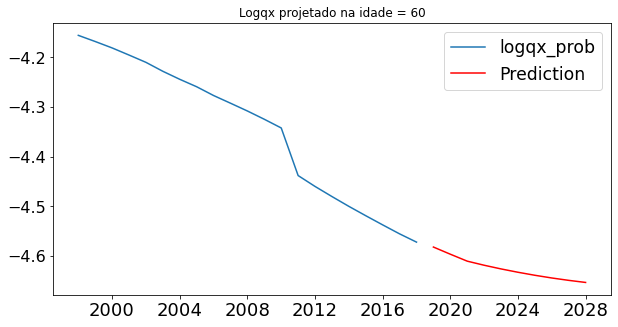

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0965 - mae: 0.2338
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0889 - mae: 0.2318
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0881 - mae: 0.2270
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0756 - mae: 0.2189
Epoch 5/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0740 - mae: 0.2078
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0853 - mae: 0.2271
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0606 - mae: 0.1909
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0625 - mae: 0.2012
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0621 - mae: 0.2044
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0496 - mae: 0.1830
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0425

1/1 [==============================] - 0s 8ms/step - loss: 0.0161 - mae: 0.1159
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1278
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0243 - mae: 0.1433
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.1123
Epoch 93/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0227 - mae: 0.1453
Epoch 94/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0128 - mae: 0.0945
Epoch 95/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0397 - mae: 0.1889
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0231 - mae: 0.1440
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0215 - mae: 0.1446
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0176 - mae: 0.1259
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - m

1/1 [==============================] - 0s 2ms/step - loss: 0.0111 - mae: 0.0740
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0481
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0099 - mae: 0.0837
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0999
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.1002
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0786
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0141 - mae: 0.1060
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0144 - mae: 0.0835
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0542
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0642
Epoch 186/500
1/1 [==============================] - 0s 8ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0659
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0601
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0539
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0514
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0750
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0559
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0522
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0369
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0855
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0756
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0497
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0582
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0639
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0474
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0735
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0083 - mae: 0.0760
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0648
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0570
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0485
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0653
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0624
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0601
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0730
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0424
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0662
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0525
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0533
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0490
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0693
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0601
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

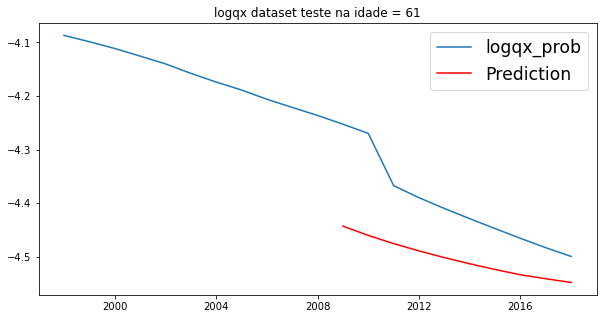

rmse:  [0.11203074]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1212
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0191 - mae: 0.1154
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0129 - mae: 0.0955
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0175 - mae: 0.1164
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1138
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0812
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.0979
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0766
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.1030
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0822
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0584
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0603
Epoch 90/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0478
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0413
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0381
Epoch 93/500
1/1 [==============================] - 0s 20ms/step - loss: 0.0021 - mae: 0.0397
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0510
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0359
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0501
Epoch 97/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0555
Epoch 98/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0106 - m

1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0357
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0312
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0377
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0355
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0309
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 7.9628e-04 - mae: 0.0249
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0356
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0635
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0357
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0309
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0464
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0378
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0321
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0250
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0419
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0317
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0294
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0399
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0476
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0423
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0407
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0387
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0346
Epoch 352/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0017 - mae: 0.0317
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0312
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 8.4991e-04 - mae: 0.0250
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0418
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0226
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0349
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0369
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 821us/step - loss: 0.0028 - mae: 0.0403
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0335
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0275
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0403
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0358
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0251
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0360
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0293
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0258
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0281
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss:

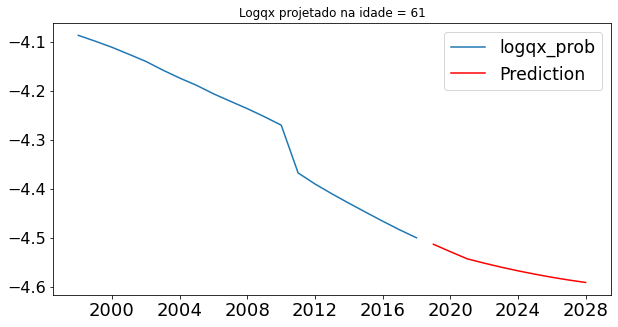

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1304 - mae: 0.2856
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1024 - mae: 0.2520
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1074 - mae: 0.2632
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0954 - mae: 0.2432
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0846 - mae: 0.2297
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0974 - mae: 0.2396
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0770 - mae: 0.2194
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0809 - mae: 0.2238
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0733 - mae: 0.2097
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0712 - mae: 0.2156
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0477 

1/1 [==============================] - 0s 3ms/step - loss: 0.0274 - mae: 0.1432
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0166 - mae: 0.1142
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.1147
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0340 - mae: 0.1763
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0185 - mae: 0.1280
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0190 - mae: 0.1226
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0259 - mae: 0.1426
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0228 - mae: 0.1263
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - mae: 0.1041
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0169 - mae: 0.1238
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0185 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - mae: 0.0751
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.0946
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0730
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.0981
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0101 - mae: 0.0853
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0614
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0619
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0360
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0284
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0689
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0463
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0116 - mae: 0.0789
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0487
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0671
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0775
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0631
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0416
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0103 - mae: 0.0893
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0642
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0644
Epoch 273/500
1/1 [==============================] - 0s 17ms/step - loss: 

1/1 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0529
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0448
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0562
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0674
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0577
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0660
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0536
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0103 - mae: 0.0624
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0073 - mae: 0.0690
Epoch 359/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0373
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0574
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0499
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0441
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0588
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0540
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0655
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0584
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0521
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0864
Epoch 445/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0092 - mae: 0.0780
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0

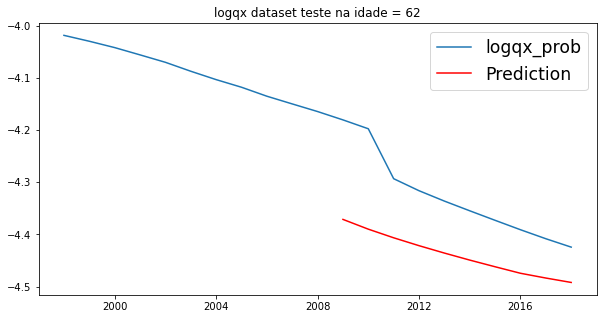

rmse:  [0.11884547]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1183
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0223 - mae: 0.1219
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mae: 0.1144
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0157 - mae: 0.1175
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0124 - mae: 0.1013
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0914
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0122 - mae: 0.0956
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0609
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - mae: 0.0850
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0162 - mae: 0.1037
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0302
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0325
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0581
Epoch 91/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0020 - mae: 0.0329
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0303
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0413
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 8.7246e-04 - mae: 0.0266
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0557
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0456
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0501
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072

1/1 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0471
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0405
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0674
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0511
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0427
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0515
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0525
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0422
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0447
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0435
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0500
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0494
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0393
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0286
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0252
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0263
Epoch 268/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0361
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0357
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0283
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0297
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0393
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0387
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0453
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0478
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0372
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0407
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0329
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0222
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0264
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0292
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0

Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0471
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0373
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0301
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0367
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0304
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 7.1516e-04 - mae: 0.0174
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0401
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0296
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0410
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0363
Epoch 445/500
1/1 [==============================] - 0s 

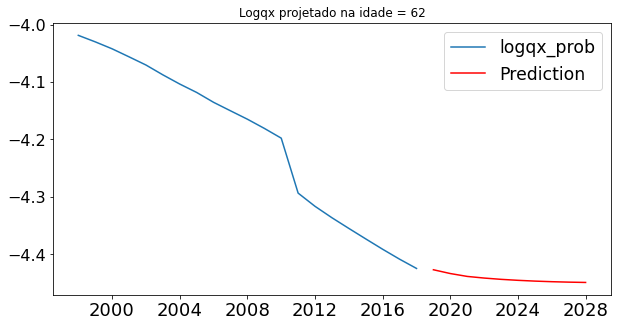

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1240 - mae: 0.2755
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1129 - mae: 0.2641
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0961 - mae: 0.2480
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0974 - mae: 0.2465
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0861 - mae: 0.2265
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0885 - mae: 0.2309
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0715 - mae: 0.2059
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0667 - mae: 0.2062
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0586 - mae: 0.1908
Epoch 10/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0624 - mae: 0.2110
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0655

1/1 [==============================] - 0s 5ms/step - loss: 0.0174 - mae: 0.1297
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0245 - mae: 0.1451
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0205 - mae: 0.1310
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0265 - mae: 0.1440
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0321 - mae: 0.1728
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1557
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0200 - mae: 0.1244
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0187 - mae: 0.1271
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.1050
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0996
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0185 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0666
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0729
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0054 - mae: 0.0620
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0665
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0435
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0108 - mae: 0.0848
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0537
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0832
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0458
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0408
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0715
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.1084
Epoch 265/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0112 - mae: 0.0831
Epoch 266/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0074 - mae: 0.0664
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0507
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0150 - mae: 0.0954
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0592
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0841
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0409
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0101 - mae: 0.0887
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0698
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0729
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - mae: 0.0729
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0628
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0398
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - mae: 0.0827
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0327
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0641
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0500
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0631
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 10ms/step - loss: 0.0108 - mae: 0.0831
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0487
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0093 - mae: 0.0787
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0374
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0428
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0447
Epoch 442/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0021 - mae: 0.0395
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0460
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0403
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0829
Epoch 446/500
1/1 [==============================] - 0s 21ms/step - loss:

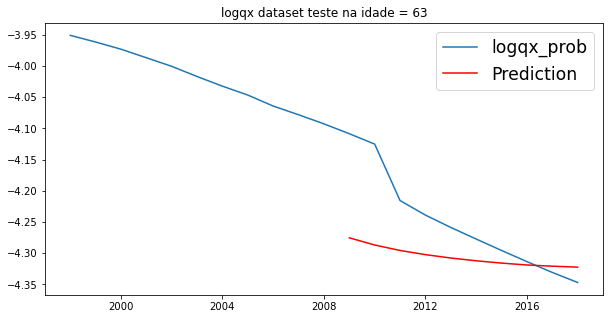

rmse:  [0.08318437]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0119 - mae: 0.1013
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0883
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0836
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0995
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0906
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0118 - mae: 0.0967
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0901
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0718
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0879
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0115 - mae: 0.0908
Epoch 11/500
1/1 [==============================] - 0s 984u

1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0603
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0384
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0397
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0390
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0256
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0412
Epoch 94/500
1/1 [==============================] - 0s 886us/step - loss: 7.6923e-04 - mae: 0.0189
Epoch 95/500
1/1 [==============================] - 0s 864us/step - loss: 0.0051 - mae: 0.0549
Epoch 96/500
1/1 [==============================] - 0s 716us/step - loss: 0.0013 - mae: 0.0306
Epoch 97/500
1/1 [==============================] - 0s 876us/step - loss: 9.8295e-04 - mae: 0.0248
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - l

1/1 [==============================] - 0s 9ms/step - loss: 0.0061 - mae: 0.0604
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0435
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0402
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0377
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0549
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0406
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0424
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0583
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0437
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0039 - mae: 0.0505
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0526
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0267
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0324
Epoch 265/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0498
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0687
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0339
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0425
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0430
Epoch 270/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0587
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0557
Epoch 272/500
1/1 [==============================] - 0s 9ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0366
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0356
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0340
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0302
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0362
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0293
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0316
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0358
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0410
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0456
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0341
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0405
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0063 - mae: 0.0471
Epoch 438/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0026 - mae: 0.0384
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0388
Epoch 440/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0395
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0441
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0416
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0621
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0485
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 

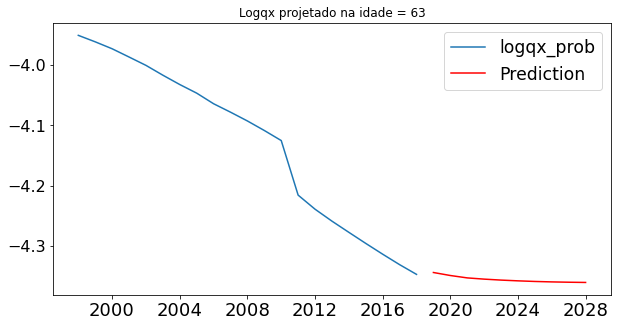

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0681 - mae: 0.2092
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0792 - mae: 0.2143
Epoch 3/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0622 - mae: 0.1904
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0605 - mae: 0.1843
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0667 - mae: 0.1926
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0386 - mae: 0.1620
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0554 - mae: 0.1972
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0517 - mae: 0.1901
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0332 - mae: 0.1530
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0338 - mae: 0.1684
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0374 

1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.1102
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1176
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0150 - mae: 0.1206
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0198 - mae: 0.1386
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1284
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.1123
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0811
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0785
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0199 - mae: 0.1289
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0205 - mae: 0.1307
Epoch 99/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0120 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0359
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0695
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0090 - mae: 0.0653
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.0809
Epoch 180/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0100 - mae: 0.0698
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0592
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0404
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0836
Epoch 184/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0015 - mae: 0.0309
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - mae: 0.0981
Epoch 186/500
1/1 [==============================] - 0s 16ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0468
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - mae: 0.0730
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0312
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0535
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0579
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0669
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0526
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0687
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0622
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0499
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0610
Epoch 351/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0548
Epoch 352/500
1/1 [==============================] - 0s 21ms/step - loss: 0.0041 - mae: 0.0579
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0538
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0585
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0455
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0298
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0069 - mae: 0.0760
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0635
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0491
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0587
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0651
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0682
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0422
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0539
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0391
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.0826
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0693
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0485
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0358
Epoch 447/500
1/1 [==============================] - 0s 9ms/step - loss: 0

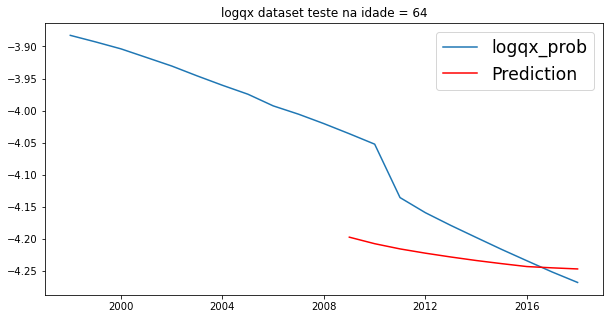

rmse:  [0.08064931]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.1178
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0114 - mae: 0.0946
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0907
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0919
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0133 - mae: 0.1019
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1074
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0722
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0610
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0672
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0528
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0428
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0623
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0476
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0476
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0368
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0423
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0453
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - mae: 0.0684
Epoch 96/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0404
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0440
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0448
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0456
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0216
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0416
Epoch 179/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0035 - mae: 0.0480
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0442
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0357
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0512
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0430
Epoch 184/500
1/1 [==============================] - 0s 20ms/step - loss: 5.7121e-04 - mae: 0.0213
Epoch 185/500
1/1 [==============================] - 0s 21ms/step - 

1/1 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0458
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0302
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0417
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0306
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0311
Epoch 267/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0360
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0422
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0577
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0368
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0264
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0390
Epoch 350/500
1/1 [==============================] - 0s 791us/step - loss: 0.0034 - mae: 0.0435
Epoch 351/500
1/1 [==============================] - 0s 782us/step - loss: 6.7702e-04 - mae: 0.0223
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0364
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0410
Epoch 354/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0053 - mae: 0.0492
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0293
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0303
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0381
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0277
Epoch 359/500
1/1 [==============================] - 0s 2ms/step 

1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0497
Epoch 436/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0373
Epoch 437/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0012 - mae: 0.0202
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0399
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0374
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0317
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0337
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0357
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0275
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0226
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 

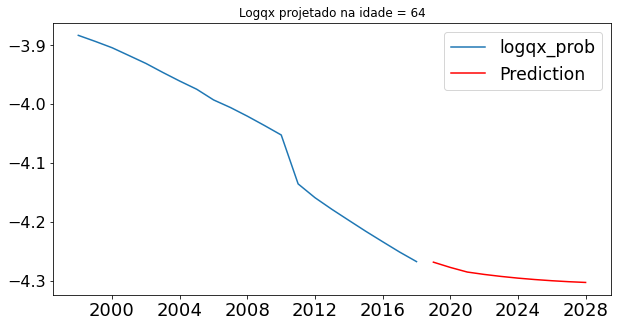

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1369 - mae: 0.2919
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1196 - mae: 0.2778
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1240 - mae: 0.2838
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1056 - mae: 0.2583
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0968 - mae: 0.2515
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0975 - mae: 0.2473
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0913 - mae: 0.2347
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0906 - mae: 0.2385
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0935 - mae: 0.2302
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0866 - mae: 0.2321
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0872 

1/1 [==============================] - 0s 1ms/step - loss: 0.0159 - mae: 0.1109
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0214 - mae: 0.1415
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0300 - mae: 0.1697
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - mae: 0.1096
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0199 - mae: 0.1277
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0148 - mae: 0.1067
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0169 - mae: 0.1138
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0302 - mae: 0.1561
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0328 - mae: 0.1670
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1175
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0412
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0150 - mae: 0.1007
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0428
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0090 - mae: 0.0654
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0884
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0071 - mae: 0.0710
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0543
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0521
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0709
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0640
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0462
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0438
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0423
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0533
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0103 - mae: 0.0828
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0888
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0612
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0582
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0771
Epoch 272/500
1/1 [==============================] - 0s 965us/step - loss: 0.0041 - mae: 0.0579
Epoch 273/500
1/1 [==============================] - 0s 14ms/step - loss

1/1 [==============================] - 0s 916us/step - loss: 0.0109 - mae: 0.0826
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0606
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 5.3770e-04 - mae: 0.0188
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0595
Epoch 354/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0079 - mae: 0.0714
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0600
Epoch 356/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0529
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0154 - mae: 0.1091
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0478
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0656
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0521
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0590
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0447
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0346
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0515
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0547
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0684
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0398
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0522
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0390
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

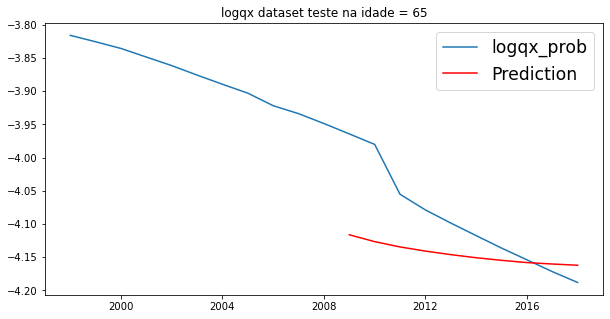

rmse:  [0.07694394]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1078
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0831
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0981
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0084 - mae: 0.0795
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0754
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0545
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0107 - mae: 0.0777
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0963
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0155 - mae: 0.0940
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0682
Epoch 11/500
1/1 [==============================] - 0s 5ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0309
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0397
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0358
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0323
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0258
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0379
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0302
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0413
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0386
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0428
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0490
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 1.9785e-04 - mae: 0.0122
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0312
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0373
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 4.5415e-04 - mae: 0.0170
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0255
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0506
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0512
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0252
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0467
Epoch 185/500
1/1 [==============================] - 0s 1ms/step -

Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0372
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0397
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0387
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0489
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0299
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0389
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0531
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0512
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0437
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 9.2981e-04 - mae: 0.0216
Epoch 272/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0331
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0292
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0349
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0330
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0464
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0403
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0369
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0307
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0548
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0297
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 9.6844e-04 - mae: 0.0259
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0353
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0286
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0389
Epoch 439/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0040 - mae: 0.0453
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0410
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1399e-04 - mae: 0.0246
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0485
Epoch 443/500
1/1 [==============================] - 0s 8ms/step - loss: 6.4616e-04 - mae: 0.0236
Epoch 444/500
1/1 [==============================] - 0s 8ms/st

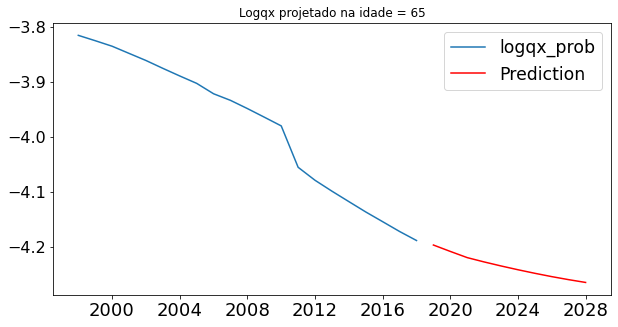

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0883 - mae: 0.2342
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0819 - mae: 0.2269
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0764 - mae: 0.2152
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0671 - mae: 0.2009
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0641 - mae: 0.1940
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0699 - mae: 0.2152
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0591 - mae: 0.1895
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0514 - mae: 0.1858
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0606 - mae: 0.1967
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0483 - mae: 0.1799
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0542 

1/1 [==============================] - 0s 2ms/step - loss: 0.0127 - mae: 0.0986
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0145 - mae: 0.1093
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0184 - mae: 0.1169
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0161 - mae: 0.1204
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0161 - mae: 0.1172
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0200 - mae: 0.1180
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0206 - mae: 0.1268
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1091
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.1180
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0976
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - ma

1/1 [==============================] - 0s 6ms/step - loss: 0.0079 - mae: 0.0712
Epoch 176/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0090 - mae: 0.0778
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0699
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0331
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0461
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0631
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0082 - mae: 0.0715
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0461
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0098 - mae: 0.0785
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0085 - mae: 0.0777
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0647
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0644
Epoch 264/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0107 - mae: 0.0785
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0299
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0708
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0725
Epoch 268/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0066 - mae: 0.0667
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0082 - mae: 0.0806
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0093 - mae: 0.0614
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0530
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0647
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0775
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0513
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0408
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0338
Epoch 354/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0092 - mae: 0.0757
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0522
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0528
Epoch 357/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0040 - mae: 0.0515
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0507
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0550
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0471
Epoch 438/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0073 - mae: 0.0711
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0528
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0489
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0388
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0440
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0565
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0272
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0496
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

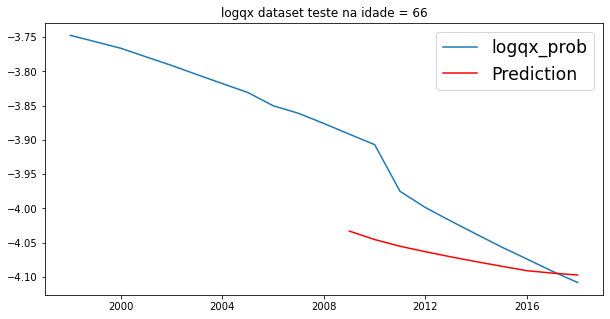

rmse:  [0.07437254]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0144 - mae: 0.1087
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0137 - mae: 0.1052
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0943
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.1050
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0838
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0793
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0603
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0816
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0537
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0399
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0313
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0523
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0447
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0372
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0436
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0416
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0289
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0500
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0487
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0405
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0502
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 8.6041e-04 - mae: 0.0225
Epoch 177/500
1/1 [==============================] - 0s 8ms/step - loss: 8.6406e-04 - mae: 0.0212
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0267
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0230
Epoch 180/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0418
Epoch 181/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0030 - mae: 0.0376
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0598
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0349
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0382
Epoch 185/500
1/1 [==============================] - 0s 1ms/step 

1/1 [==============================] - 0s 1ms/step - loss: 7.2883e-04 - mae: 0.0210
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0292
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0367
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0446
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0374
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0272
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0413
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0346
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 5.8696e-04 - mae: 0.0216
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0459
Epoch 271/500
1/1 [==============================] - 0s 4ms/step -

Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0321
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0293
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0335
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0253
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0498
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0203
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0415
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0362
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0328
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0367
Epoch 358/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step - loss: 8.5233e-04 - mae: 0.0219
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0324
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0464
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0272
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0469
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0308
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0372
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0314
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0312
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 2.2171e-04 - mae: 0.0117
Epoch 444/500
1/1 [==============================] - 0s 1ms/step -

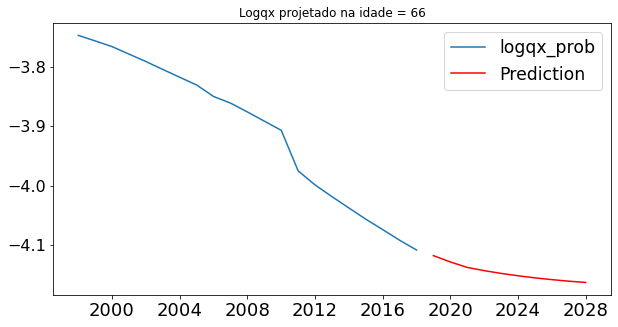

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1389 - mae: 0.2999
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1216 - mae: 0.2705
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1103 - mae: 0.2674
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1052 - mae: 0.2633
Epoch 5/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0859 - mae: 0.2290
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0902 - mae: 0.2248
Epoch 7/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0786 - mae: 0.2191
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0872 - mae: 0.2345
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0515 - mae: 0.1834
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0532 - mae: 0.1990
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0720

1/1 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0818
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0160 - mae: 0.1177
Epoch 90/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0310 - mae: 0.1524
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0118 - mae: 0.0943
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0160 - mae: 0.1240
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0199 - mae: 0.1203
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0079 - mae: 0.0850
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0149 - mae: 0.1178
Epoch 96/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0184 - mae: 0.1227
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0217 - mae: 0.1362
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - m

Epoch 175/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0325
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0358
Epoch 177/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0478
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0560
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0494
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0721
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0575
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0657
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0082 - mae: 0.0822
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0432
Epoch 185/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0415
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0092 - mae: 0.0888
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0398
Epoch 265/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0041 - mae: 0.0598
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0617
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0318
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0549
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0597
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0527
Epoch 271/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0051 - mae: 0.0608
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0440
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0462
Epoch 350/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0515
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0444
Epoch 352/500
1/1 [==============================] - 0s 984us/step - loss: 0.0042 - mae: 0.0552
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0296
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0621
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0488
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0672
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0523
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0306
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0694
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0322
Epoch 438/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0023 - mae: 0.0364
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0281
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0452
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0598
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0330
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0496
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0485
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0

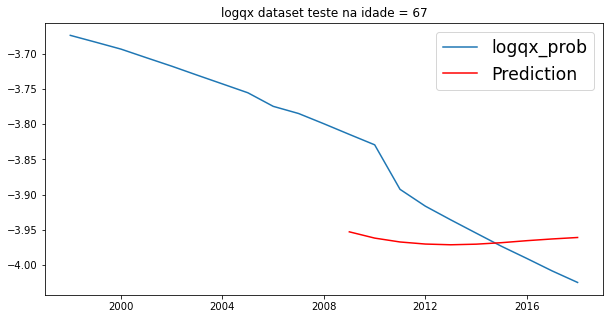

rmse:  [0.07324078]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1210
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0099 - mae: 0.0807
Epoch 3/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0106 - mae: 0.0884
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1094
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0475
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0550
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0638
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0627
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0898
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0547
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 922us/step - loss: 0.0025 - mae: 0.0403
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0429
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0513
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0283
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0301
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0472
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0342
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0533
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0511
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0394
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3339e-0

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0312
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 8.9151e-04 - mae: 0.0256
Epoch 177/500
1/1 [==============================] - 0s 953us/step - loss: 0.0018 - mae: 0.0335
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0442
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0391
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0547
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0364
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0424
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9961e-04 - mae: 0.0229
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0423
Epoch 185/500
1/1 [==============================] - 0s 1ms/step

1/1 [==============================] - 0s 2ms/step - loss: 7.9265e-04 - mae: 0.0235
Epoch 262/500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.044 - 0s 2ms/step - loss: 0.0047 - mae: 0.0445
Epoch 263/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0320
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0449
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 7.6365e-04 - mae: 0.0200
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0219
Epoch 267/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0026 - mae: 0.0388
Epoch 268/500
1/1 [==============================] - 0s 985us/step - loss: 0.0041 - mae: 0.0365
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0364
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0416
Epoch 271/500
1/1 [======

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0383
Epoch 348/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0252
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0322
Epoch 350/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0323
Epoch 351/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0262
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0300
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0482
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0309
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0345
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0431
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0331
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0237
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0338
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0315
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0356
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0304
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0352
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0279
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0276
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0500
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0

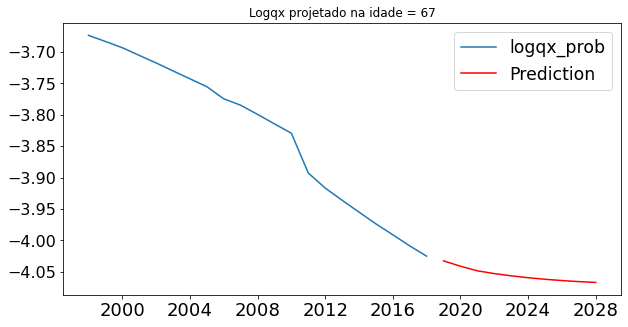

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3244
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1421 - mae: 0.3116
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1167 - mae: 0.2830
Epoch 4/500
1/1 [==============================] - 0s 755us/step - loss: 0.1057 - mae: 0.2672
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1013 - mae: 0.2588
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1128 - mae: 0.2666
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0984 - mae: 0.2507
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0850 - mae: 0.2330
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0709 - mae: 0.2153
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0621 - mae: 0.1945
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.062

1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.1111
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.1129
Epoch 91/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0181 - mae: 0.1240
Epoch 92/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0248 - mae: 0.1536
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0803
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0227 - mae: 0.1356
Epoch 95/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0170 - mae: 0.1142
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.1051
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0136 - mae: 0.1052
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0165 - mae: 0.1194
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0152 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0727
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0739
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0536
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0323
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0703
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0139 - mae: 0.0898
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0464
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0232 - mae: 0.1197
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0090 - mae: 0.0796
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0625
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0522
Epoch 264/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0622
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0091 - mae: 0.0826
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0724
Epoch 267/500
1/1 [==============================] - 0s 942us/step - loss: 0.0037 - mae: 0.0501
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0422
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0589
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0066 - mae: 0.0701
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0318
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0490
Epoch 273/500
1/1 [==============================] - 0s 8ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0749
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0453
Epoch 352/500
1/1 [==============================] - 0s 869us/step - loss: 0.0047 - mae: 0.0406
Epoch 353/500
1/1 [==============================] - 0s 811us/step - loss: 0.0042 - mae: 0.0567
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0482
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0420
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0358
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0441
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0389
Epoch 359/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0028 - mae: 0.0456
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - lo

Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0485
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0635
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0612
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0535
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0369
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9421e-04 - mae: 0.0226
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0581
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0677
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0464
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0524
Epoch 447/500
1/1 [==============================] - 0s 

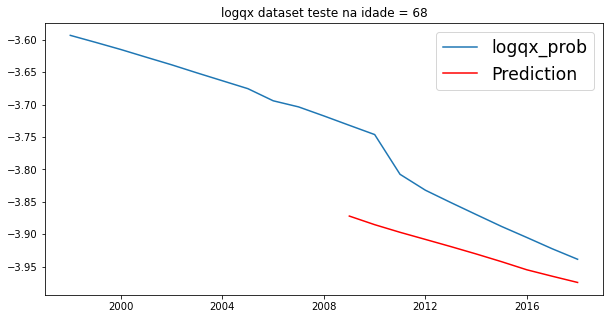

rmse:  [0.0834003]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0974
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0176 - mae: 0.1215
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.1085
Epoch 4/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0107 - mae: 0.0921
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.1118
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0657
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0958
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0594
Epoch 9/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0501
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0093 - mae: 0.0756
Epoch 11/500
1/1 [==============================] - 0s 15ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0432
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0335
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0529
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0548
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0299
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0306
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0545
Epoch 95/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0015 - mae: 0.0298
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0366
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0463
Epoch 98/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0022 - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0224
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0407
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0412
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0291
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0653
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0509
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0320
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0417
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0478
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0402
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 8

1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0360
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0421
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0473
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0530
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0377
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0404
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0542
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0305
Epoch 270/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0015 - mae: 0.0299
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0431
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0498
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0351
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0220
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0272
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0397
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0265
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0361
Epoch 356/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0070 - mae: 0.0536
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 6.3533e-04 - mae: 0.0174
Epoch 358/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0490
Epoch 359/500
1/1 [==============================] - 0s 16ms/step - l

1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0458
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0307
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3997e-04 - mae: 0.0263
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0536
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 7.4292e-04 - mae: 0.0239
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0424
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0395
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0364
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0491
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0373
Epoch 445/500
1/1 [==============================] - 0s 1ms/step -

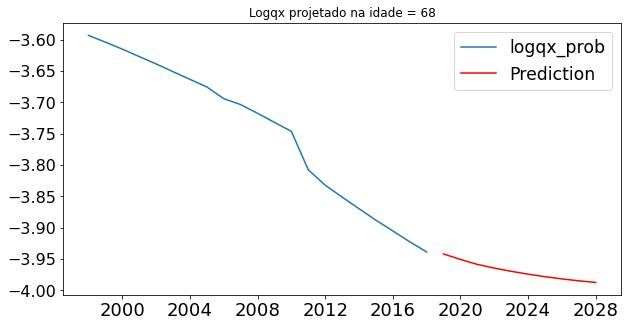

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1148 - mae: 0.2766
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1031 - mae: 0.2550
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0955 - mae: 0.2426
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2315
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0771 - mae: 0.2300
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0750 - mae: 0.2163
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0605 - mae: 0.1927
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0590 - mae: 0.1899
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0515 - mae: 0.1902
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0520 - mae: 0.1906
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0527 

1/1 [==============================] - 0s 10ms/step - loss: 0.0073 - mae: 0.0733
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0184 - mae: 0.1271
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0141 - mae: 0.1059
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0133 - mae: 0.1014
Epoch 93/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0143 - mae: 0.1052
Epoch 94/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0081 - mae: 0.0817
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0874
Epoch 96/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0061 - mae: 0.0705
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0576
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0093 - mae: 0.0866
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - 

1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0618
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0569
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0555
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0671
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0814
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0497
Epoch 182/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0026 - mae: 0.0457
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0627
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0073 - mae: 0.0720
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0665
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 7ms/step - loss: 0.0033 - mae: 0.0443
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0351
Epoch 265/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0079 - mae: 0.0723
Epoch 266/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0560
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0290
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0695
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0568
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0781
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0462
Epoch 272/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0044 - mae: 0.0568
Epoch 273/500
1/1 [==============================] - 0s 989us/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0489
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0553
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0580
Epoch 353/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0033 - mae: 0.0393
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0356
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0265
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0298
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0397
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0789
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0494
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 7.3081e-04 - mae: 0.0232
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0385
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0372
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0299
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0411
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0650
Epoch 443/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0021 - mae: 0.0416
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0295
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0440
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0448
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - lo

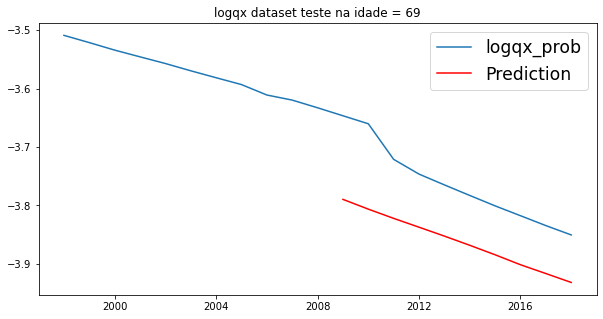

rmse:  [0.10132884]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0174 - mae: 0.1176
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1431
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0949
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - mae: 0.0976
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1034
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0111 - mae: 0.0939
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0658
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0623
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0767
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0799
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0272
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0516
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0306
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0447
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0307
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0381
Epoch 94/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0049 - mae: 0.0545
Epoch 95/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0041 - mae: 0.0424
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0235
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0481
Epoch 98/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0042 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0230
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0327
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0391
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0267
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 8.4608e-04 - mae: 0.0208
Epoch 180/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0013 - mae: 0.0272
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0409
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0354
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0463
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 9.2493e-04 - mae: 0.0264
Epoch 185/500
1/1 [==============================] - 0s 9ms/step 

1/1 [==============================] - 0s 3ms/step - loss: 8.4307e-04 - mae: 0.0253
Epoch 262/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0373
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0259
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 3.4786e-04 - mae: 0.0135
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0387
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0303
Epoch 267/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0334
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0406
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0365
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0426
Epoch 271/500
1/1 [==============================] - 0s 3ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0502
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0208
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 4.7868e-04 - mae: 0.0171
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0321
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 6.4384e-04 - mae: 0.0201
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0303
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0247
Epoch 354/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0024 - mae: 0.0392
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0248
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0412
Epoch 357/500
1/1 [==============================] - 0s 1ms/step 

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0307
Epoch 434/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0376
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 6.2609e-04 - mae: 0.0207
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 8.6256e-04 - mae: 0.0217
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0306
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0377
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0331
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0265
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0296
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 4.5177e-04 - mae: 0.0180
Epoch 443/500
1/1 [==============================] - 0s 952us/

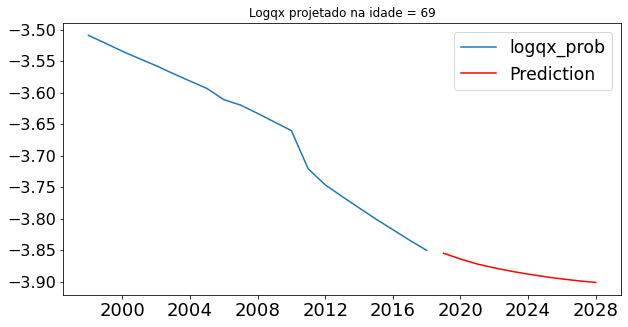

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1364 - mae: 0.3093
Epoch 2/500
1/1 [==============================] - 0s 19ms/step - loss: 0.1369 - mae: 0.3046
Epoch 3/500
1/1 [==============================] - 0s 7ms/step - loss: 0.1325 - mae: 0.2954
Epoch 4/500
1/1 [==============================] - 0s 20ms/step - loss: 0.1298 - mae: 0.2983
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1228 - mae: 0.2752
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1011 - mae: 0.2575
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0923 - mae: 0.2426
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0810 - mae: 0.2300
Epoch 9/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0843 - mae: 0.2353
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0728 - mae: 0.2089
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.060

1/1 [==============================] - 0s 12ms/step - loss: 0.0177 - mae: 0.1104
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0292 - mae: 0.1613
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0135 - mae: 0.1036
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0225 - mae: 0.1448
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0252 - mae: 0.1531
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1059
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0157 - mae: 0.1095
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mae: 0.1480
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0204 - mae: 0.1317
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1529
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0221 - m

1/1 [==============================] - 0s 2ms/step - loss: 0.0126 - mae: 0.0853
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0104 - mae: 0.0768
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0668
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0090 - mae: 0.0742
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0190 - mae: 0.1208
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0755
Epoch 182/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0774
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0078 - mae: 0.0693
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0175 - mae: 0.0861
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0668
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0766
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0081 - mae: 0.0713
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0535
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0390
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0722
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0668
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.0745
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0538
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0624
Epoch 272/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0079 - mae: 0.0778
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 947us/step - loss: 0.0130 - mae: 0.0866
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0316
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0688
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0553
Epoch 354/500
1/1 [==============================] - 0s 958us/step - loss: 0.0052 - mae: 0.0608
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0742
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mae: 0.0839
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0570
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0377
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0728
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0427
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0471
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0067 - mae: 0.0637
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0362
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0591
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0399
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0336
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0648
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 9.3274e-04 - mae: 0.0250
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0339
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - los

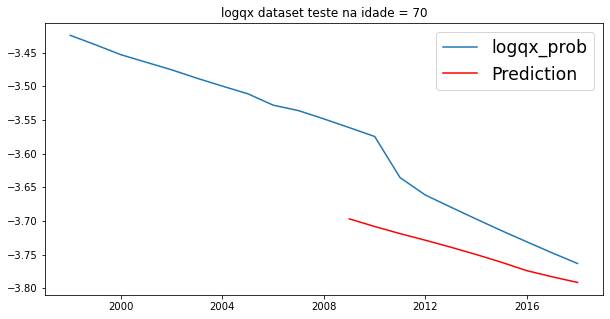

rmse:  [0.07747066]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0915
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0169 - mae: 0.1092
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0116 - mae: 0.0887
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0818
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0697
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0077 - mae: 0.0760
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0694
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0136 - mae: 0.1006
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0154 - mae: 0.0936
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0675
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0447
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0394
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0341
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0356
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0516
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0227
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0398
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0339
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0360
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0467
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0345
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0376
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 9.4703e-04 - mae: 0.0239
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0466
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0434
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0457
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0293
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0319
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0313
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0360
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0480
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0029 - mae: 0.0432
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0425
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0358
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0451
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0274
Epoch 267/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0394
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0308
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 7.2233e-04 - mae: 0.0225
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0422
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0296
Epoch 348/500
1/1 [==============================] - 0s 776us/step - loss: 0.0018 - mae: 0.0344
Epoch 349/500
1/1 [==============================] - 0s 813us/step - loss: 0.0011 - mae: 0.0266
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 6.4750e-04 - mae: 0.0130
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0591
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0314
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0408
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0417
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0400
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0293
Epoch 357/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0357
Epoch 434/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0340
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0350
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0321
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0356
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0327
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0359
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0376
Epoch 441/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0059 - mae: 0.0449
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0350
Epoch 443/500
1/1 [==============================] - 0s 5ms/step - loss: 

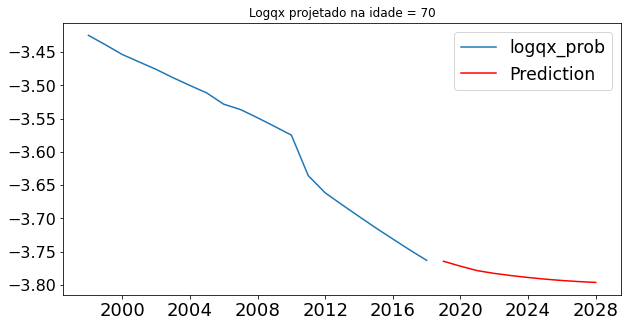

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0992 - mae: 0.2444
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1004 - mae: 0.2530
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0705 - mae: 0.2130
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0761 - mae: 0.2160
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0741 - mae: 0.2113
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0709 - mae: 0.2161
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0485 - mae: 0.1815
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0555 - mae: 0.1899
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0410 - mae: 0.1679
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0482 - mae: 0.1909
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0347 

1/1 [==============================] - 0s 1ms/step - loss: 0.0190 - mae: 0.1318
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0217 - mae: 0.1365
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0158 - mae: 0.1137
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0241 - mae: 0.1538
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0180 - mae: 0.1248
Epoch 94/500
1/1 [==============================] - 0s 960us/step - loss: 0.0204 - mae: 0.1367
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mae: 0.1464
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1104
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0174 - mae: 0.1220
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0252 - mae: 0.1558
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0221 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0793
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0775
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0077 - mae: 0.0603
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0122 - mae: 0.0894
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0864
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0677
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0733
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0088 - mae: 0.0815
Epoch 184/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0015 - mae: 0.0313
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0649
Epoch 186/500
1/1 [==============================] - 0s 9ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0344
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0065 - mae: 0.0680
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0494
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0376
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0366
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0372
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0463
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0373
Epoch 271/500
1/1 [==============================] - 0s 798us/step - loss: 0.0026 - mae: 0.0422
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0455
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0672
Epoch 351/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0565
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0454
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0341
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0418
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0650
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0584
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0751
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0596
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0605
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0336
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0675
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9890e-04 - mae: 0.0229
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0474
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0324
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0386
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0355
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0415
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0333
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0446
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - los

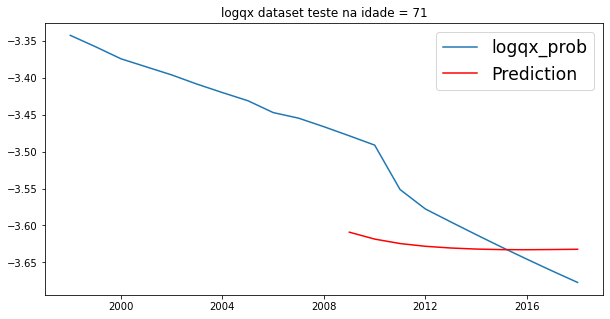

rmse:  [0.06771735]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1142
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0093 - mae: 0.0873
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0712
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0798
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0675
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0367
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0518
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0656
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0303
Epoch 10/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0044 - mae: 0.0583
Epoch 11/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0403
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0397
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0341
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0407
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0301
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0337
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0359
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0421
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0313
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0322
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0402
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 4.5252e-04 - mae: 0.0174
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0337
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0496
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0398
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0302
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0337
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0282
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0345
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0363
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0369
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0365
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0400
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0489
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0355
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0468
Epoch 267/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0018 - mae: 0.0301
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0324
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0314
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0551
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0457
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0320
Epoch 349/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0377
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0348
Epoch 351/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0290
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0420
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0377
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0334
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0279
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0252
Epoch 357/500
1/1 [==============================] - 0s 14ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0343
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 1.5814e-04 - mae: 0.0097
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0271
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 4.9939e-04 - mae: 0.0203
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0267
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 8.0041e-04 - mae: 0.0211
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0326
Epoch 440/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0013 - mae: 0.0277
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0375
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0354
Epoch 443/500
1/1 [==============================] - 0s 992us

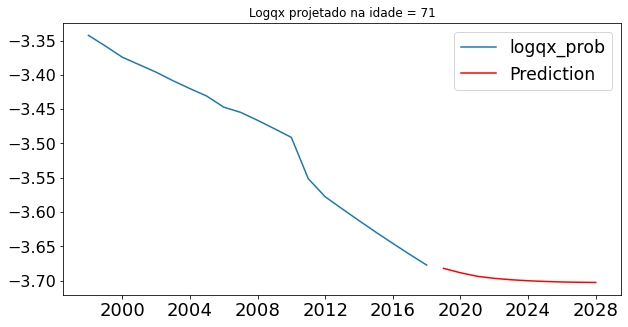

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1127 - mae: 0.2684
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1050 - mae: 0.2592
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1004 - mae: 0.2551
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0985 - mae: 0.2548
Epoch 5/500
1/1 [==============================] - 0s 777us/step - loss: 0.0906 - mae: 0.2366
Epoch 6/500
1/1 [==============================] - 0s 742us/step - loss: 0.0763 - mae: 0.2221
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0827 - mae: 0.2275
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0805 - mae: 0.2281
Epoch 9/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0793 - mae: 0.2246
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0834 - mae: 0.2313
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.

1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1147
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0923
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0071 - mae: 0.0814
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0381 - mae: 0.1823
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.1147
Epoch 94/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0265 - mae: 0.1467
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0233 - mae: 0.1454
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0172 - mae: 0.1102
Epoch 97/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0151 - mae: 0.1158
Epoch 98/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0067 - mae: 0.0740
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - 

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0371
Epoch 177/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0308
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0154 - mae: 0.1077
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0442
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0347
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0518
Epoch 182/500
1/1 [==============================] - 0s 975us/step - loss: 0.0050 - mae: 0.0530
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0631
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0568
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0045 - mae: 0.0598
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0372
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0542
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0701
Epoch 266/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0056 - mae: 0.0580
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0090 - mae: 0.0627
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0318
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0466
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0512
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0553
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0090 - mae: 0.0791
Epoch 273/500
1/1 [==============================] - 0s 14ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0399
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0562
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0486
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0302
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0781
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0593
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 6.9473e-04 - mae: 0.0219
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0524
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0376
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0464
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0553
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0742
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0585
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0293
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0498
Epoch 441/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0411
Epoch 442/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0557
Epoch 443/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0035 - mae: 0.0465
Epoch 444/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0035 - mae: 0.0457
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0428
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

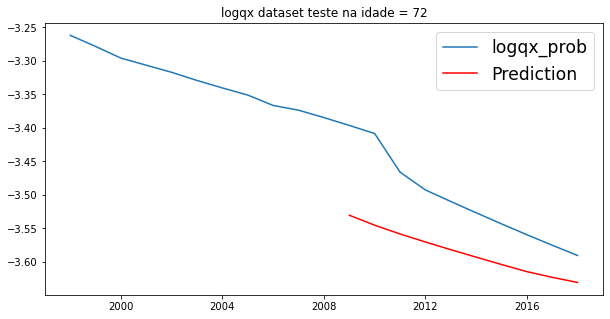

rmse:  [0.08456007]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0969
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0128 - mae: 0.0934
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - mae: 0.0893
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0131 - mae: 0.1034
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0782
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0938
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0119 - mae: 0.0976
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0660
Epoch 9/500
1/1 [==============================] - 0s 885us/step - loss: 0.0048 - mae: 0.0589
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0711
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0435
Epoch 89/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0387
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0348
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0367
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0300
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0489
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0346
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0244
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0471
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0347
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0319
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0246
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0284
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0420
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0343
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0325
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0474
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0373
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0284
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0246
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0

Epoch 261/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0392
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0324
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0236
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0323
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0330
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0245
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0321
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0260
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0347
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0556
Epoch 271/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0341
Epoch 348/500
1/1 [==============================] - 0s 6ms/step - loss: 7.3993e-04 - mae: 0.0205
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0464
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0315
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0311
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 7.3079e-04 - mae: 0.0212
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0319
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0278
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0389
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0292
Epoch 357/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 12ms/step - loss: 0.0022 - mae: 0.0323
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0317
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0387
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0305
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0339
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0339
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0369
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0342
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0349
Epoch 442/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0022 - mae: 0.0364
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss:

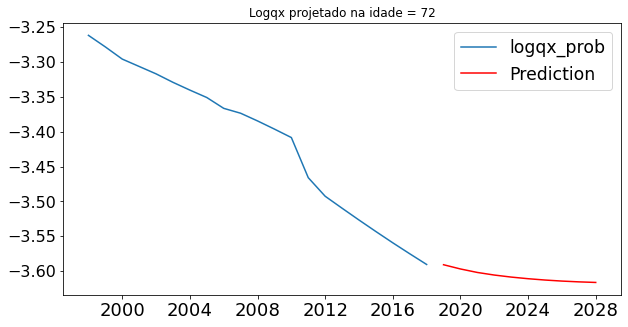

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1377 - mae: 0.3079
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1489 - mae: 0.3269
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1226 - mae: 0.2898
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1180 - mae: 0.2787
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1176 - mae: 0.2798
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0999 - mae: 0.2568
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1064 - mae: 0.2615
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1015 - mae: 0.2516
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0920 - mae: 0.2449
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0947 - mae: 0.2397
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0852 

1/1 [==============================] - 0s 1ms/step - loss: 0.0262 - mae: 0.1585
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0263 - mae: 0.1567
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0174 - mae: 0.1109
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0177 - mae: 0.1073
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0309 - mae: 0.1704
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0140 - mae: 0.1082
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0245 - mae: 0.1236
Epoch 96/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0129 - mae: 0.0956
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.1026
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0228 - mae: 0.1396
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0169 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0333
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1109
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0187 - mae: 0.1169
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0435
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0121 - mae: 0.0820
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0099 - mae: 0.0818
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.1146
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0882
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0554
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0594
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0351
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0409
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0630
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0575
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0128 - mae: 0.0990
Epoch 268/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0078 - mae: 0.0654
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0611
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0625
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0545
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0859
Epoch 273/500
1/1 [==============================] - 0s 7ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0394
Epoch 351/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0384
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0469
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0660
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - mae: 0.0698
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0489
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0413
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0371
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0572
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0417
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0365
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0396
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0352
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0477
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0400
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0431
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0616
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0586
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0301
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0680
Epoch 447/500
1/1 [==============================] - 0s 2ms/step - loss: 0

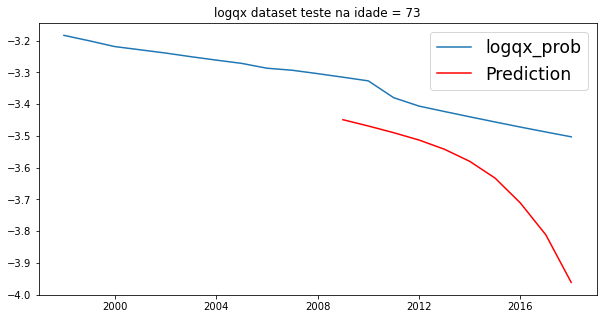

rmse:  [0.22355529]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.1027
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0179 - mae: 0.1022
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1077
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.1049
Epoch 5/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0060 - mae: 0.0667
Epoch 6/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0085 - mae: 0.0695
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0657
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0727
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0707
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0591
Epoch 11/500
1/1 [==============================] - 0s 5ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0278
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0421
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0409
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0497
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0362
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0366
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 8.2262e-04 - mae: 0.0249
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0495
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0325
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0347
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 

1/1 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0316
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0364
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0290
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0221
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 5.9814e-04 - mae: 0.0207
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0263
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0288
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0277
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 8.2116e-04 - mae: 0.0212
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0466
Epoch 185/500
1/1 [==============================] - 0s 9ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0310
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0322
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0373
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0353
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0423
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5973e-04 - mae: 0.0224
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0317
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0453
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0506
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0341
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0264
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0362
Epoch 349/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0043 - mae: 0.0420
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0405
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0408
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0275
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0531
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0245
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0314
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0318
Epoch 357/500
1/1 [==============================] - 0s 8ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0289
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0231
Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0469
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0484
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0415
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0300
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0233
Epoch 440/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0014 - mae: 0.0340
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0321
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0335
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 

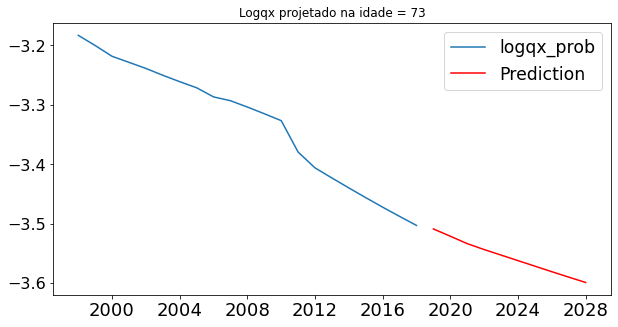

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1165 - mae: 0.2846
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1114 - mae: 0.2841
Epoch 3/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1030 - mae: 0.2720
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0986 - mae: 0.2533
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0877 - mae: 0.2370
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0826 - mae: 0.2345
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0804 - mae: 0.2301
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0710 - mae: 0.2101
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0688 - mae: 0.2094
Epoch 10/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0647 - mae: 0.2082
Epoch 11/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0645

1/1 [==============================] - 0s 1ms/step - loss: 0.0199 - mae: 0.1056
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0176 - mae: 0.1183
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0127 - mae: 0.1096
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0184 - mae: 0.1182
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1217
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0606
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0952
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1106
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0945
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0211 - mae: 0.1155
Epoch 99/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0087 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0746
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0658
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0594
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0811
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0461
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0620
Epoch 182/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0082 - mae: 0.0757
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0441
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0771
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0078 - mae: 0.0828
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0529
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0528
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0413
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0504
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0539
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0494
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0407
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0073 - mae: 0.0601
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0579
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0682
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0527
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0594
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0440
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0614
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0509
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3049e-04 - mae: 0.0247
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0641
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0500
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0473
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 8.8750e-04 - mae: 0.0237
Epoch 360/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0523
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0441
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0512
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0549
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0519
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0649
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0317
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0678
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0291
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0361
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

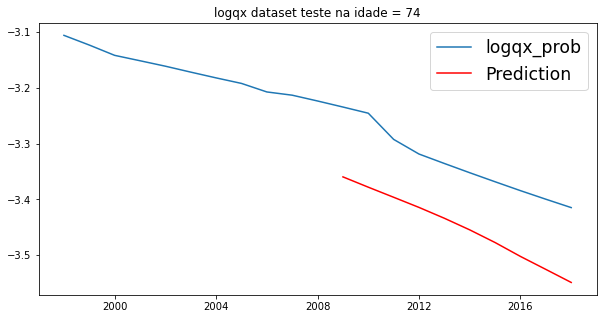

rmse:  [0.11533514]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0870
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0168 - mae: 0.1151
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0719
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0812
Epoch 5/500
1/1 [==============================] - 0s 958us/step - loss: 0.0118 - mae: 0.0975
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0085 - mae: 0.0782
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0744
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0703
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0081 - mae: 0.0822
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0098 - mae: 0.0807
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0513
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0355
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0627
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0396
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0382
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0516
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0559
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0449
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0443
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0424
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - ma

1/1 [==============================] - 0s 1ms/step - loss: 6.7056e-04 - mae: 0.0217
Epoch 176/500
1/1 [==============================] - 0s 978us/step - loss: 0.0026 - mae: 0.0344
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0292
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0369
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0448
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0380
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0340
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0583
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0318
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0389
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0341
Epoch 261/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0322
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0301
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0317
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0335
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0377
Epoch 266/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0028 - mae: 0.0410
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0286
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0314
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0320
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0290
Epoch 347/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0315
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0411
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0468
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0517
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0383
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0316
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0270
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0384
Epoch 355/500
1/1 [==============================] - 0s 24ms/step - loss: 0.0026 - mae: 0.0345
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0386
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0441
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0277
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0244
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0414
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0350
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 6.8025e-04 - mae: 0.0193
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0258
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0625
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0402
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - los

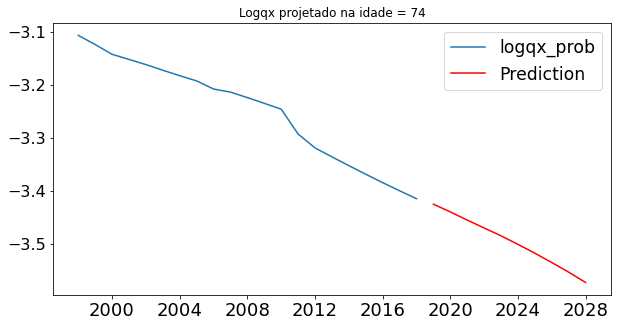

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1085 - mae: 0.2734
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1068 - mae: 0.2707
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0844 - mae: 0.2409
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0803 - mae: 0.2314
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0789 - mae: 0.2308
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0798 - mae: 0.2238
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0718 - mae: 0.2108
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0579 - mae: 0.2009
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0514 - mae: 0.1859
Epoch 10/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0465 - mae: 0.1836
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0456

1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.1089
Epoch 89/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0106 - mae: 0.0952
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0180 - mae: 0.1283
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0196 - mae: 0.1315
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0125 - mae: 0.0979
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0238 - mae: 0.1533
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0207 - mae: 0.1407
Epoch 95/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0166 - mae: 0.1170
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0169 - mae: 0.1245
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mae: 0.0909
Epoch 98/500
1/1 [==============================] - 0s 19ms/step - loss: 0.0231 - m

Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0761
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0486
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0058 - mae: 0.0519
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0560
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0533
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0622
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0238
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0660
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0398
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0443
Epoch 185/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0073 - mae: 0.0612
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0425
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0102 - mae: 0.0803
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 3.1790e-04 - mae: 0.0156
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0590
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0617
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0529
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0303
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0662
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0440
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0278
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0589
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0546
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0280
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0441
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0321
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0637
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0402
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7994e-04 - mae: 0.0221
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0385
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 6.7071e-04 - mae: 0.0255
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0360
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0464
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 3.1426e-04 - mae: 0.0151
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0364
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0693
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0407
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1644e-04 - mae: 0.0236
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0314
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0333
Epoch 444/500
1/1 [==============================] - 0s 3ms/st

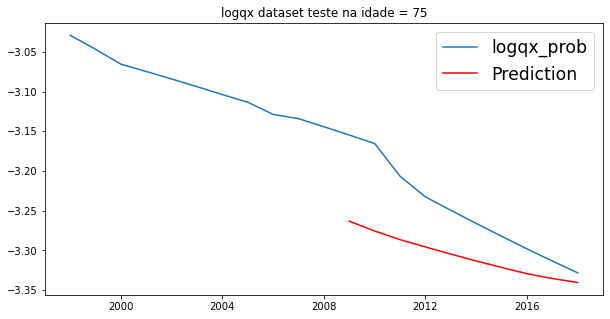

rmse:  [0.06534978]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0775
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0723
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.0907
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0748
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0603
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0707
Epoch 7/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0062 - mae: 0.0700
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0075 - mae: 0.0702
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0466
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0625
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0435
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0440
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0373
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0344
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0255
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 7.8342e-04 - mae: 0.0181
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0554
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0476
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 6.8974e-04 - mae: 0.0205
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0268
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0

1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0662
Epoch 175/500
1/1 [==============================] - 0s 985us/step - loss: 0.0026 - mae: 0.0343
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0331
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0323
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0314
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0337
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0362
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1486e-04 - mae: 0.0221
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0417
Epoch 183/500
1/1 [==============================] - 0s 961us/step - loss: 0.0023 - mae: 0.0400
Epoch 184/500
1/1 [==============================] - 0s 2ms/step -

Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 5.6658e-04 - mae: 0.0180
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0339
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0355
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0456
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0400
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0283
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0384
Epoch 268/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0010 - mae: 0.0259
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0241
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0252
Epoch 271/500
1/1 [==============================] - 0s

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0286
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 6.6905e-04 - mae: 0.0182
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0340
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0404
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0520
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0361
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0457
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 7.6880e-04 - mae: 0.0202
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0364
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0368
Epoch 357/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0250
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0250
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0334
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0301
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0375
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0392
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0285
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0263
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0312
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0290
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0

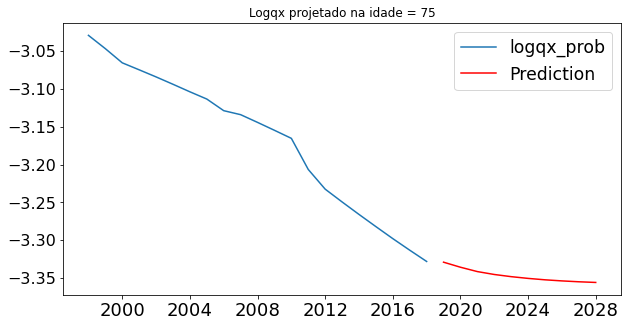

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0514 - mae: 0.1825
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0507 - mae: 0.1834
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0478 - mae: 0.1852
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0426 - mae: 0.1730
Epoch 5/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0506 - mae: 0.1848
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0284 - mae: 0.1566
Epoch 7/500
1/1 [==============================] - 0s 857us/step - loss: 0.0298 - mae: 0.1422
Epoch 8/500
1/1 [==============================] - 0s 738us/step - loss: 0.0244 - mae: 0.1394
Epoch 9/500
1/1 [==============================] - 0s 726us/step - loss: 0.0186 - mae: 0.1234
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0282 - mae: 0.1531
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0742
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0507
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0476
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0575
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.1113
Epoch 94/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0824
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0132 - mae: 0.0994
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0876
Epoch 97/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0069 - mae: 0.0750
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.1041
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0086 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0557
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0604
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0398
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0313
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0636
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0453
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0719
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0332
Epoch 184/500
1/1 [==============================] - 0s 11ms/step - loss: 9.7038e-04 - mae: 0.0266
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0539
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0597
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0075 - mae: 0.0804
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0433
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0601
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0293
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0488
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0336
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 5.8638e-04 - mae: 0.0183
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0419
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0546
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0565
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0479
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0286
Epoch 351/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0015 - mae: 0.0245
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 2.5767e-04 - mae: 0.0131
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0415
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0430
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0438
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0431
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0439
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0359
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0493
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0377
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0510
Epoch 438/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0279
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0408
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0404
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1095e-04 - mae: 0.0234
Epoch 442/500
1/1 [==============================] - ETA: 0s - loss: 5.0986e-04 - mae: 0.020 - 0s 1ms/step - loss: 5.0986e-04 - mae: 0.0206
Epoch 443/500
1/1 [==============================] - 0s 986us/step - loss: 3.6872e-04 - mae: 0.0131
Epoch 444/500
1/1 

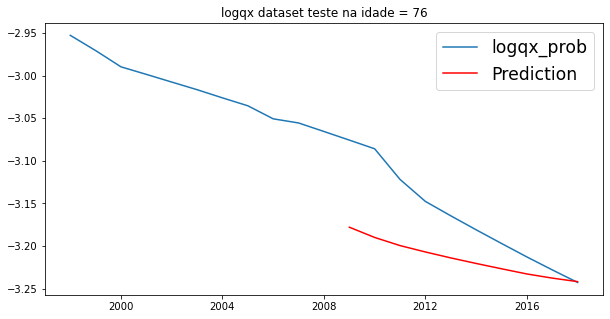

rmse:  [0.06020176]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0783
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0668
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0625
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0614
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0592
Epoch 6/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0043 - mae: 0.0481
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0537
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0498
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0415
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0580
Epoch 11/500
1/1 [==============================] - 0s 975

1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0339
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0275
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0350
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 4.0965e-04 - mae: 0.0176
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0361
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0376
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0029 - mae: 0.0396
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0048 - mae: 0.0523
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0044 - mae: 0.0405
Epoch 97/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0016 - mae: 0.0295
Epoch 98/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0026

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0393
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0402
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0304
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0388
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0359
Epoch 179/500
1/1 [==============================] - 0s 945us/step - loss: 0.0024 - mae: 0.0343
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0291
Epoch 181/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0299
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0318
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0319
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 6.8459e-04 - mae: 0.0194
Epoch 261/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0227
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0254
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 6.5293e-04 - mae: 0.0233
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0517
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0391
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0380
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0387
Epoch 268/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0343
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0439
Epoch 270/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0366
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0266
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0370
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0243
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0283
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0242
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0315
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 7.9969e-04 - mae: 0.0235
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 7.9875e-04 - mae: 0.0212
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0404
Epoch 356/500
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 10ms/step - loss: 7.9537e-04 - mae: 0.0225
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0287
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0233
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0389
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0359
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0286
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0279
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 9.6024e-04 - mae: 0.0233
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0283
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0512
Epoch 442/500
1/1 [==============================] - 0s 1ms/step 

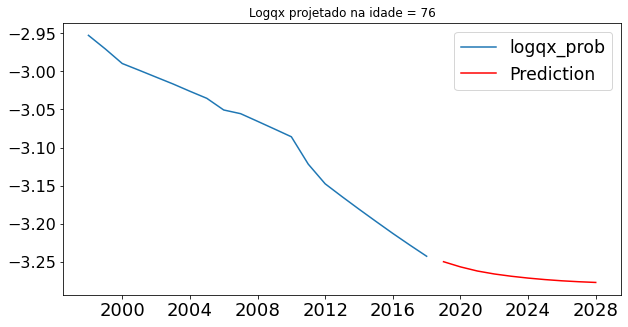

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1029 - mae: 0.2677
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1064 - mae: 0.2768
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1030 - mae: 0.2725
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1004 - mae: 0.2678
Epoch 5/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0838 - mae: 0.2398
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.2348
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0734 - mae: 0.2259
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0613 - mae: 0.2058
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0637 - mae: 0.2149
Epoch 10/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0538 - mae: 0.1881
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0614

1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0991
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0827
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.1075
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0214 - mae: 0.1215
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0131 - mae: 0.1118
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1135
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0209 - mae: 0.1300
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0191 - mae: 0.1230
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0162 - mae: 0.1148
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1287
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0241 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0713
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0569
Epoch 178/500
1/1 [==============================] - 0s 804us/step - loss: 0.0024 - mae: 0.0473
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0624
Epoch 180/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0383
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0280
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0319
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0650
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0459
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0676
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss:

Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0212
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0482
Epoch 265/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0013 - mae: 0.0298
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0485
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0642
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0632
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0390
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0392
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0520
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0475
Epoch 273/500
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0288
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0340
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0308
Epoch 352/500
1/1 [==============================] - ETA: 0s - loss: 0.0013 - mae: 0.032 - 0s 3ms/step - loss: 0.0013 - mae: 0.0329
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 9.5955e-04 - mae: 0.0253
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0290
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0310
Epoch 356/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0018 - mae: 0.0360
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1785e-04 - mae: 0.0212
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0351
Epoch 359/500
1/1 [========

1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0358
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0499
Epoch 437/500
1/1 [==============================] - 0s 7ms/step - loss: 9.6973e-04 - mae: 0.0246
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7957e-04 - mae: 0.0237
Epoch 439/500
1/1 [==============================] - 0s 6ms/step - loss: 5.5169e-04 - mae: 0.0215
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 8.9118e-04 - mae: 0.0264
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0397
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 7.6982e-04 - mae: 0.0239
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0292
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0516
Epoch 445/500
1/1 [==============================] - 0

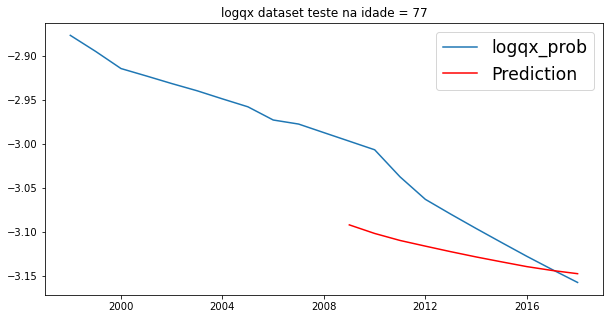

rmse:  [0.05452345]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0666
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0484
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0678
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0608
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0547
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0566
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0557
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0495
Epoch 9/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0390
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0520
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 7ms/step - loss: 0.0033 - mae: 0.0378
Epoch 89/500
1/1 [==============================] - 0s 22ms/step - loss: 0.0058 - mae: 0.0582
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0332
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0371
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0380
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0447
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0287
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0324
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0336
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0250
Epoch 98/500
1/1 [==============================] - 0s 989us/step - loss: 0.0033 -

1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0379
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0442
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0410
Epoch 178/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0530
Epoch 179/500
1/1 [==============================] - 0s 7ms/step - loss: 9.8287e-04 - mae: 0.0261
Epoch 180/500
1/1 [==============================] - 0s 7ms/step - loss: 6.2795e-04 - mae: 0.0192
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0339
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0269
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0445
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0376
Epoch 185/500
1/1 [==============================] - 0s 973us/step

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0334
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 5.7795e-04 - mae: 0.0202
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0248
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0356
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0267
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0288
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0374
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0369
Epoch 270/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0025 - mae: 0.0324
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0253
Epoch 348/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0431
Epoch 349/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0048 - mae: 0.0498
Epoch 350/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0312
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0294
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0329
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0352
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0314
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0247
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0390
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0512
Epoch 434/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0377
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0509
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 7.7055e-04 - mae: 0.0232
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0304
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0293
Epoch 439/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0019 - mae: 0.0321
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0411
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0414
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0291
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - lo

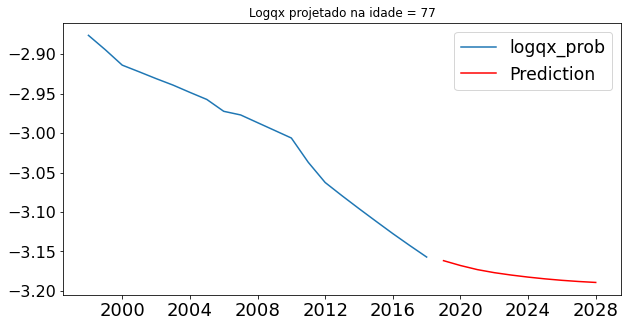

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0572 - mae: 0.2056
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0417 - mae: 0.1661
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0535 - mae: 0.1922
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0378 - mae: 0.1596
Epoch 5/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0426 - mae: 0.1697
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0439 - mae: 0.1752
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0323 - mae: 0.1595
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0332 - mae: 0.1567
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0243 - mae: 0.1313
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0271 - mae: 0.1419
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0228 

1/1 [==============================] - 0s 6ms/step - loss: 0.0078 - mae: 0.0740
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0106 - mae: 0.0956
Epoch 91/500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.091 - 0s 2ms/step - loss: 0.0129 - mae: 0.0910
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0175 - mae: 0.1170
Epoch 93/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0105 - mae: 0.0817
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0153 - mae: 0.1017
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0690
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0777
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0849
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0626
Epoch 99/500
1/1 [===========================

1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0693
Epoch 176/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0026 - mae: 0.0438
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0551
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0297
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0640
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0498
Epoch 181/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0074 - mae: 0.0674
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0579
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0388
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0575
Epoch 185/500
1/1 [==============================] - 0s 8ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0446
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0388
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 4.4794e-04 - mae: 0.0151
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0355
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0279
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0382
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0524
Epoch 269/500
1/1 [==============================] - 0s 21ms/step - loss: 0.0026 - mae: 0.0420
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 8.3356e-04 - mae: 0.0227
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 7.1558e-04 - mae: 0.0218
Epoch 272/500
1/1 [==============================] - 0s 5ms/s

1/1 [==============================] - 0s 2ms/step - loss: 8.6308e-04 - mae: 0.0232
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0365
Epoch 350/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0402
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 3.2816e-04 - mae: 0.0156
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0490
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0271
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0300
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0414
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0388
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 8.7360e-04 - mae: 0.0278
Epoch 358/500
1/1 [==============================] - 0s 1ms/st

1/1 [==============================] - 0s 15ms/step - loss: 0.0081 - mae: 0.0679
Epoch 435/500
1/1 [==============================] - 0s 4ms/step - loss: 8.0107e-04 - mae: 0.0235
Epoch 436/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0392
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 8.6586e-04 - mae: 0.0203
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0416
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 5.6056e-04 - mae: 0.0189
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0309
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0320
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0336
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 8.2292e-04 - mae: 0.0238
Epoch 444/500
1/1 [==============================] - 0s 3

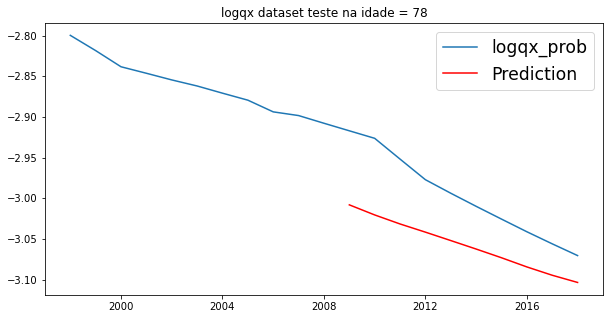

rmse:  [0.06368667]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0561
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0594
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0693
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0591
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0501
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0653
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0383
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0669
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0437
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0537
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0406
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0312
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0374
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 5.1596e-04 - mae: 0.0174
Epoch 92/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0026 - mae: 0.0420
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0391
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0292
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0483
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0260
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0400
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 

1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0414
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0505
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0252
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0317
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0331
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0351
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0385
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0283
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0381
Epoch 183/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0295
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0

Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0341
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 6.3829e-04 - mae: 0.0232
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0477
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 7.3969e-04 - mae: 0.0171
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0379
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0443
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0395
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0012 - mae: 0.0272
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0441
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 5.5346e-04 - mae: 0.0205
Epoch 271/500
1/1 [=============================

1/1 [==============================] - 0s 1ms/step - loss: 5.4571e-04 - mae: 0.0209
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0310
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0313
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0339
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0394
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0323
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9984e-04 - mae: 0.0227
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0316
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0449
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0308
Epoch 357/500
1/1 [==============================] - 0s 2ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0333
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0412
Epoch 435/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0445
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0267
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0326
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0343
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 6.7220e-04 - mae: 0.0219
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0288
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0323
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 4.5761e-04 - mae: 0.0180
Epoch 443/500
1/1 [==============================] - 0s 2ms/step -

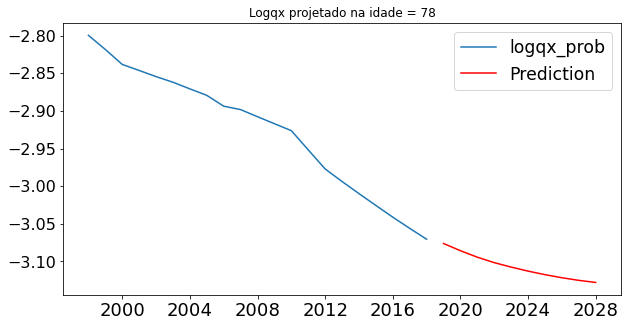

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2585
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0915 - mae: 0.2493
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0636 - mae: 0.2153
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0646 - mae: 0.2187
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0729 - mae: 0.2248
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0510 - mae: 0.1923
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0468 - mae: 0.1783
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0385 - mae: 0.1633
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0436 - mae: 0.1679
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0449 - mae: 0.1818
Epoch 11/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0283 

1/1 [==============================] - 0s 2ms/step - loss: 0.0191 - mae: 0.1309
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0840
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1023
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0174 - mae: 0.1156
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1149
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0176 - mae: 0.1213
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - mae: 0.0849
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0972
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0894
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0119 - mae: 0.0845
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0786
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0561
Epoch 177/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0648
Epoch 178/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0556
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0588
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0512
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0749
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0603
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0666
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0777
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0296
Epoch 263/500
1/1 [==============================] - 0s 974us/step - loss: 5.9583e-04 - mae: 0.0217
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0391
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0435
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0510
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0532
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0624
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0514
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0290
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0477
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0384
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 7.8567e-04 - mae: 0.0266
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0658
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0390
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0458
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0385
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 7.4829e-04 - mae: 0.0227
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0310
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 8.6665e-04 - mae: 0.0201
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0370
Epoch 358/500
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0350
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0466
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 2.7862e-04 - mae: 0.0134
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0358
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0425
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0337
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0299
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0519
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0268
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0305
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - los

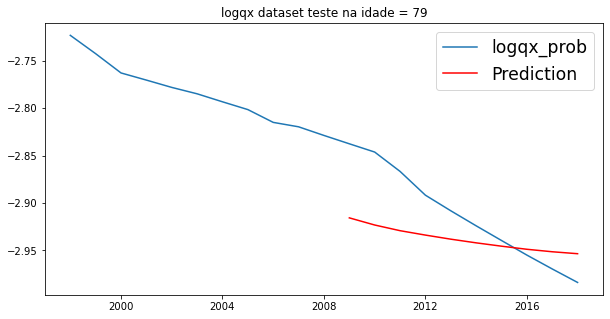

rmse:  [0.04500192]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0529
Epoch 2/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0590
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0541
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0465
Epoch 5/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0646
Epoch 6/500
1/1 [==============================] - 0s 942us/step - loss: 0.0060 - mae: 0.0678
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0657
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0449
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0492
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0516
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0408
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0584
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0475
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0288
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0391
Epoch 93/500
1/1 [==============================] - 0s 22ms/step - loss: 0.0012 - mae: 0.0275
Epoch 94/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0022 - mae: 0.0303
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0339
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0295
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 9.8407e-04 - mae: 0.0253
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.001

1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0313
Epoch 175/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0252
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0371
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0333
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0481
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0278
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 8.1628e-04 - mae: 0.0238
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0267
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0405
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0322
Epoch 184/500
1/1 [==============================] - 0s 7ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 6.5898e-04 - mae: 0.0198
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 7.8229e-04 - mae: 0.0244
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0339
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0492
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0423
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0384
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0371
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0326
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0375
Epoch 269/500
1/1 [==============================] - 0s 992us/step - loss: 8.3474e-04 - mae: 0.0229
Epoch 270/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0475
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0257
Epoch 348/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0223
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0357
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0517
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0356
Epoch 352/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0321
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0338
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0448
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 7.8607e-04 - mae: 0.0187
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 975us/step - loss: 0.0011 - mae: 0.0301
Epoch 433/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0342
Epoch 434/500
1/1 [==============================] - 0s 2ms/step - loss: 9.5900e-04 - mae: 0.0270
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0429
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 7.4245e-04 - mae: 0.0219
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 8.0629e-04 - mae: 0.0240
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0314
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0296
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0352
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0432
Epoch 442/500
1/1 [==============================] - 0s 1ms/

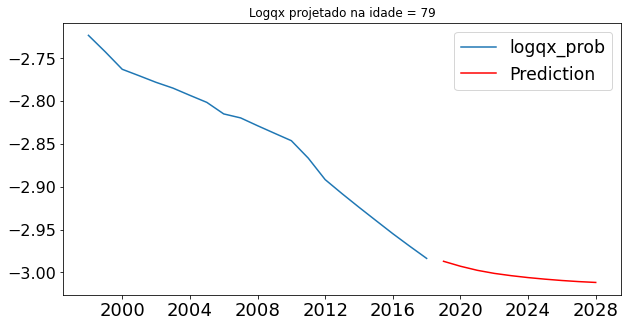

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0959 - mae: 0.2758
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0824 - mae: 0.2555
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0901 - mae: 0.2678
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0782 - mae: 0.2465
Epoch 5/500
1/1 [==============================] - 0s 18ms/step - loss: 0.0761 - mae: 0.2442
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0722 - mae: 0.2346
Epoch 7/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0645 - mae: 0.2245
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0511 - mae: 0.1975
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0528 - mae: 0.2001
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0418 - mae: 0.1805
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0455

1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.0947
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0760
Epoch 91/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0167 - mae: 0.1133
Epoch 92/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0752
Epoch 93/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0071 - mae: 0.0704
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0623
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0088 - mae: 0.0849
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0654
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0750
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0809
Epoch 99/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0084 - 

1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0708
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0601
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0641
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0616
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0514
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0443
Epoch 182/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0068 - mae: 0.0604
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0519
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0527
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0389
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0519
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0355
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0353
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0396
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0358
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 9.2182e-04 - mae: 0.0234
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0434
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0266
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0588
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0407
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 6.3761e-04 - mae: 0.0195
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0422
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0419
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0449
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0424
Epoch 354/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0029 - mae: 0.0416
Epoch 355/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0380
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0564
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0302
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 8.0066e-04 - mae: 0.0187
Epoch 359/500
1/1 [==============================] - 0s 3ms/step -

1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0358
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0381
Epoch 437/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0490
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0267
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3868e-04 - mae: 0.0241
Epoch 440/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0409
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 9.3427e-04 - mae: 0.0254
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0308
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0452
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0323
Epoch 445/500
1/1 [==============================] - 0s 1ms/step -

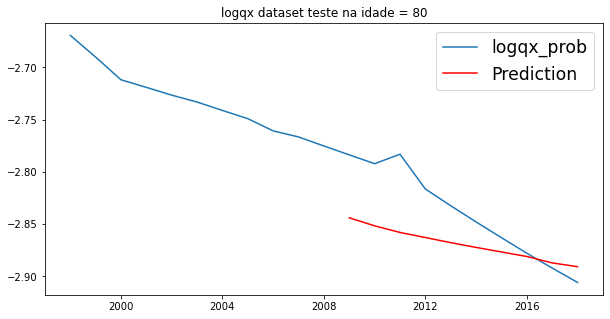

rmse:  [0.04145811]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0111 - mae: 0.0808
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0740
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0879
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0663
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0727
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0734
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0945
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0604
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0499
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0521
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0344
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0246
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0242
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 6.7987e-04 - mae: 0.0210
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0315
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0345
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0044 - mae: 0.0536
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0433
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0298
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0371
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 

1/1 [==============================] - 0s 992us/step - loss: 0.0016 - mae: 0.0320
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0330
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0251
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0313
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0408
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 4.6865e-04 - mae: 0.0171
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0328
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0492
Epoch 183/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0017 - mae: 0.0356
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0486
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 3.2436e-04 - mae: 0.0143
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 9.2773e-04 - mae: 0.0216
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 9.7722e-04 - mae: 0.0265
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0315
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4857e-04 - mae: 0.0230
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0379
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0416
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0444
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0367
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 7.9352e-04 - mae: 0.0215
Epoch 271/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0280
Epoch 348/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0320
Epoch 349/500
1/1 [==============================] - 0s 992us/step - loss: 0.0014 - mae: 0.0287
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0281
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0282
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 6.1623e-04 - mae: 0.0161
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0355
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0273
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0254
Epoch 356/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0310
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0286
Epoch 434/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0289
Epoch 435/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0010 - mae: 0.0230
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0336
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0400
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0389
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0382
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0350
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0263
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0374
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0

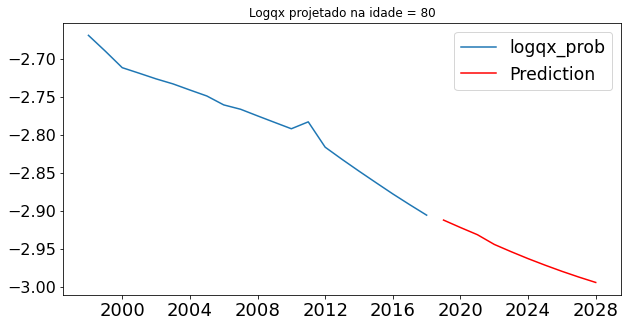

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0547 - mae: 0.1975
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1837
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0481 - mae: 0.1820
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0435 - mae: 0.1770
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0351 - mae: 0.1550
Epoch 6/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0346 - mae: 0.1558
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0321 - mae: 0.1383
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1303
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0223 - mae: 0.1165
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1280
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0188 

1/1 [==============================] - 0s 2ms/step - loss: 0.0162 - mae: 0.0957
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0172 - mae: 0.1120
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0780
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0831
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0828
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.0914
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.0788
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1044
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0123 - mae: 0.0902
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0801
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0129 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0757
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0869
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.0845
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0787
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0141 - mae: 0.0776
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0134 - mae: 0.0930
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0126 - mae: 0.0735
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.0866
Epoch 184/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0139 - mae: 0.1009
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0114 - mae: 0.0765
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 5ms/step - loss: 0.0160 - mae: 0.0920
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0797
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0723
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.0728
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0830
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0742
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0772
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0859
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0131 - mae: 0.0907
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0804
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0086 - mae: 0.0691
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0129 - mae: 0.0949
Epoch 351/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0072 - mae: 0.0606
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0631
Epoch 353/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0093 - mae: 0.0703
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0639
Epoch 355/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0124 - mae: 0.0756
Epoch 356/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0104 - mae: 0.0751
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0651
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0633
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0101 - mae: 0.0700
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0670
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0095 - mae: 0.0843
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0543
Epoch 440/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0685
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0088 - mae: 0.0690
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0110 - mae: 0.0719
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0652
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0687
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0482
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

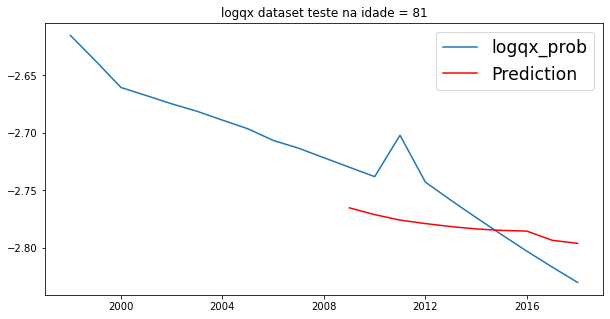

rmse:  [0.03421962]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0368 - mae: 0.1612
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0313 - mae: 0.1419
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0282 - mae: 0.1410
Epoch 4/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0244 - mae: 0.1285
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0130 - mae: 0.0854
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0731
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0501
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0680
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0477
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0900
Epoch 11/500
1/1 [==============================] - 0s 1ms/

Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0590
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0016 - mae: 0.0322
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0532
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0530
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0496
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0298
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0312
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0529
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0313
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0421
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0292
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0376
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0410
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0464
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0435
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0344
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0524
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0486
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0337
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0311
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0443
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0050 - mae: 0.0492
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0471
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0592
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0431
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0381
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0426
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0495
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0455
Epoch 272/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0438
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0405
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0413
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0306
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0500
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0381
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0407
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0504
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0315
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0436
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0402
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0340
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0382
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 8.9469e-04 - mae: 0.0254
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0526
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0321
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0296
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0429
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0288
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0284
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0360
Epoch 447/500
1/1 [==============================] - 0s 999us/step - l

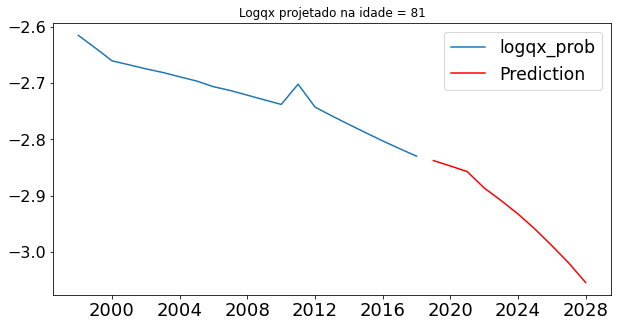

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0510 - mae: 0.1546
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0479 - mae: 0.1434
Epoch 3/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0479 - mae: 0.1449
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0455 - mae: 0.1395
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0430 - mae: 0.1249
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0447 - mae: 0.1346
Epoch 7/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0419 - mae: 0.1281
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0394 - mae: 0.1224
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0414 - mae: 0.1349
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0389 - mae: 0.1194
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0398

1/1 [==============================] - 0s 1ms/step - loss: 0.0330 - mae: 0.1372
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0274 - mae: 0.1278
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0259 - mae: 0.1061
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0292 - mae: 0.1261
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0346 - mae: 0.1344
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0292 - mae: 0.1265
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0315 - mae: 0.1257
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0251 - mae: 0.1090
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1153
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0267 - mae: 0.1241
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0286 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0253 - mae: 0.1167
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0295 - mae: 0.1163
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0302 - mae: 0.1180
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0276 - mae: 0.1229
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0231 - mae: 0.1088
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0267 - mae: 0.1177
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0255 - mae: 0.1154
Epoch 183/500
1/1 [==============================] - 0s 972us/step - loss: 0.0262 - mae: 0.1251
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0286 - mae: 0.1248
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0280 - mae: 0.1292
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0226 - mae: 0.1187
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1093
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0212 - mae: 0.1092
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0218 - mae: 0.1139
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0218 - mae: 0.1145
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0245 - mae: 0.1295
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0263 - mae: 0.1183
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0201 - mae: 0.1104
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1078
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0180 - mae: 0.1058
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0176 - mae: 0.1054
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0280 - mae: 0.1166
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mae: 0.1277
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1013
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1127
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - mae: 0.1230
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0218 - mae: 0.1303
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0178 - mae: 0.1089
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0218 - mae: 0.1102
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0271 - mae: 0.1264
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.0963
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0148 - mae: 0.1014
Epoch 439/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0202 - mae: 0.1092
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.1061
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1022
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0943
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mae: 0.1105
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1051
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0149 - mae: 0.1028
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0188 - mae: 0.1183
Epoch 447/500
1/1 [==============================] - 0s 5ms/step - loss: 0

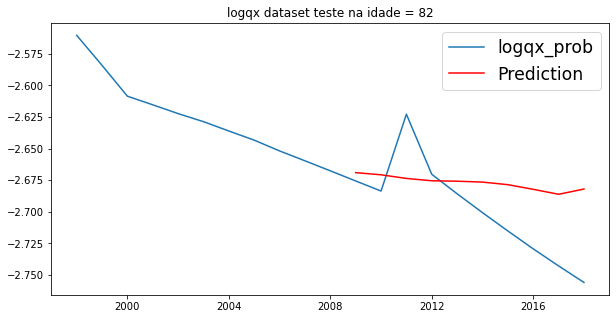

rmse:  [0.0397041]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1900 - mae: 0.3900
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1692 - mae: 0.3482
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1687 - mae: 0.3649
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1361 - mae: 0.3285
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1428 - mae: 0.3298
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1064 - mae: 0.2858
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0895 - mae: 0.2639
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0994 - mae: 0.2684
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0760 - mae: 0.2377
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0802 - mae: 0.2324
Epoch 11/500
1/1 [==============================] - 0s 2ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1192
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.0975
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.0999
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0956
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0867
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0279 - mae: 0.1099
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0789
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0134 - mae: 0.0916
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0213 - mae: 0.1046
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0179 - mae: 0.0891
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0190 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0562
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0556
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0726
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0644
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.0823
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.1025
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0138 - mae: 0.0701
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0614
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0111 - mae: 0.0704
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0646
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0093 - mae: 0.0540
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0685
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0689
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0652
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0791
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0525
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0436
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0555
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0575
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0503
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0658
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0553
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0643
Epoch 352/500
1/1 [==============================] - 0s 979us/step - loss: 0.0112 - mae: 0.0796
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0119 - mae: 0.0723
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0255
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0910
Epoch 356/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0162 - mae: 0.0922
Epoch 357/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0095 - mae: 0.0760
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0583
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0766
Epoch 437/500
1/1 [==============================] - 0s 770us/step - loss: 0.0085 - mae: 0.0731
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0456
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0667
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0376
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0831
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0075 - mae: 0.0742
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0506
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0084 - mae: 0.0664
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0387
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss:

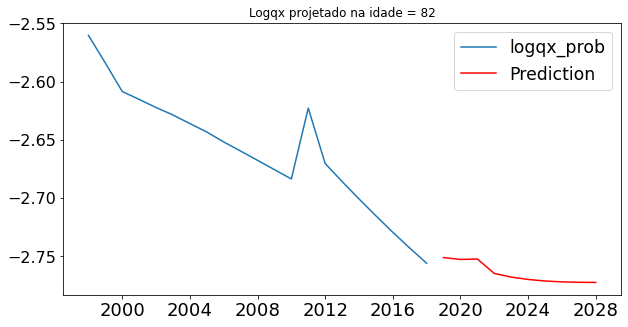

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0946 - mae: 0.2080
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0865 - mae: 0.1900
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0866 - mae: 0.1891
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0853 - mae: 0.1874
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0744 - mae: 0.1730
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0734 - mae: 0.1740
Epoch 7/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0749 - mae: 0.1736
Epoch 8/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0674 - mae: 0.1581
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0703 - mae: 0.1610
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0632 - mae: 0.1683
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0597

1/1 [==============================] - 0s 998us/step - loss: 0.0541 - mae: 0.1761
Epoch 90/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0541 - mae: 0.1719
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1590
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0562 - mae: 0.1680
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0454 - mae: 0.1515
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0555 - mae: 0.1706
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0498 - mae: 0.1687
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0442 - mae: 0.1647
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0462 - mae: 0.1484
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0508 - mae: 0.1536
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0513 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0423 - mae: 0.1532
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0269 - mae: 0.1211
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0441 - mae: 0.1506
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0396 - mae: 0.1503
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0381 - mae: 0.1440
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0404 - mae: 0.1511
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0448 - mae: 0.1728
Epoch 183/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0336 - mae: 0.1393
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0448 - mae: 0.1726
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0472 - mae: 0.1637
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0303 - mae: 0.1479
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0420 - mae: 0.1605
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0435 - mae: 0.1611
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0353 - mae: 0.1533
Epoch 267/500
1/1 [==============================] - 0s 942us/step - loss: 0.0558 - mae: 0.1498
Epoch 268/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0264 - mae: 0.1418
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0344 - mae: 0.1442
Epoch 270/500
1/1 [==============================] - 0s 916us/step - loss: 0.0418 - mae: 0.1554
Epoch 271/500
1/1 [==============================] - 0s 968us/step - loss: 0.0394 - mae: 0.1414
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1639
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0400 - mae: 0.1575
Epoch 351/500
1/1 [==============================] - 0s 978us/step - loss: 0.0278 - mae: 0.1217
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0381 - mae: 0.1440
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0253 - mae: 0.1311
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0341 - mae: 0.1361
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0278 - mae: 0.1406
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0153 - mae: 0.1031
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0269 - mae: 0.1378
Epoch 358/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0235 - mae: 0.1090
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0357 - mae: 0.1541
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0139 - mae: 0.1000
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1037
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1108
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1522
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1141
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0259 - mae: 0.1448
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0249 - mae: 0.1284
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1085
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0250 - mae: 0.1250
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0227 - mae: 0.1228
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

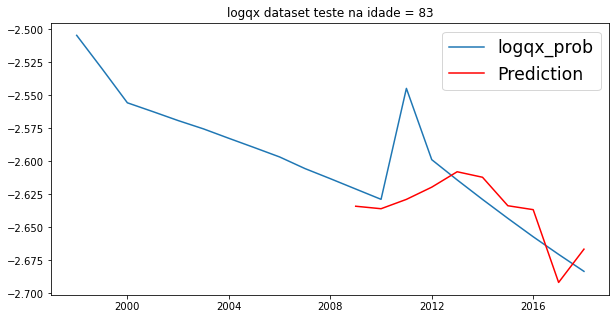

rmse:  [0.03047681]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1746 - mae: 0.3603
Epoch 2/500
1/1 [==============================] - 0s 939us/step - loss: 0.1528 - mae: 0.3328
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1401 - mae: 0.3215
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1341 - mae: 0.3175
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1175 - mae: 0.2893
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1090 - mae: 0.2748
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0928 - mae: 0.2491
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0919 - mae: 0.2632
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0806 - mae: 0.2444
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0815 - mae: 0.2283
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0449 - mae: 0.1689
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0316 - mae: 0.1392
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0431 - mae: 0.1540
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0439 - mae: 0.1536
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0307 - mae: 0.1411
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0456 - mae: 0.1560
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0315 - mae: 0.1452
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0391 - mae: 0.1508
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0282 - mae: 0.1355
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0396 - mae: 0.1444
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0365 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0216 - mae: 0.0898
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0129 - mae: 0.0869
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0200 - mae: 0.0837
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0281 - mae: 0.1138
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0211 - mae: 0.1006
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0186 - mae: 0.1027
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mae: 0.1023
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0152 - mae: 0.0828
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0199 - mae: 0.1127
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.0949
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0794
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0172 - mae: 0.0911
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.0816
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0140 - mae: 0.0866
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0129 - mae: 0.0914
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.0790
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0892
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0148 - mae: 0.0938
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0728
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0691
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0131 - mae: 0.0779
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0854
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0111 - mae: 0.0753
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0841
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0082 - mae: 0.0660
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0540
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0696
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0753
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0662
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0602
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0638
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0620
Epoch 438/500
1/1 [==============================] - 0s 983us/step - loss: 0.0063 - mae: 0.0667
Epoch 439/500
1/1 [==============================] - 0s 972us/step - loss: 0.0039 - mae: 0.0450
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0709
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0634
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0700
Epoch 443/500
1/1 [==============================] - 0s 989us/step - loss: 0.0056 - mae: 0.0619
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0718
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0079 - mae: 0.0691
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - l

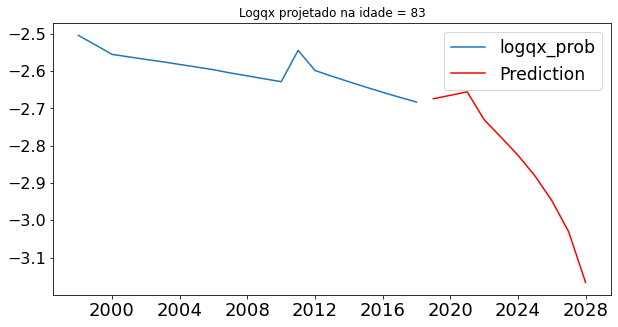

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1614 - mae: 0.2867
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1602 - mae: 0.2875
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1570 - mae: 0.2813
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1534 - mae: 0.2743
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1527 - mae: 0.2765
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1470 - mae: 0.2697
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1470 - mae: 0.2682
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1412 - mae: 0.2605
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1411 - mae: 0.2584
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1373 - mae: 0.2500
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1362 

1/1 [==============================] - 0s 3ms/step - loss: 0.0673 - mae: 0.1933
Epoch 89/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0667 - mae: 0.2086
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0619 - mae: 0.1953
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0629 - mae: 0.1872
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0643 - mae: 0.2025
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0793 - mae: 0.2052
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0716 - mae: 0.2136
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0637 - mae: 0.2015
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0723 - mae: 0.2058
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0581 - mae: 0.1818
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0594 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0640 - mae: 0.1795
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0482 - mae: 0.1630
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0496 - mae: 0.1646
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0590 - mae: 0.1756
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0548 - mae: 0.1684
Epoch 180/500
1/1 [==============================] - 0s 704us/step - loss: 0.0602 - mae: 0.1658
Epoch 181/500
1/1 [==============================] - 0s 765us/step - loss: 0.0572 - mae: 0.1760
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0513 - mae: 0.1685
Epoch 183/500
1/1 [==============================] - 0s 725us/step - loss: 0.0648 - mae: 0.1878
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0451 - mae: 0.1645
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.0664 - mae: 0.2082
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0562 - mae: 0.1773
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0731 - mae: 0.1989
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0389 - mae: 0.1594
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0531 - mae: 0.1778
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0386 - mae: 0.1561
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0465 - mae: 0.1697
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0300 - mae: 0.1188
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0531 - mae: 0.1782
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0432 - mae: 0.1658
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0332 - mae: 0.1461
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0213 - mae: 0.1226
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0252 - mae: 0.1230
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0273 - mae: 0.1390
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0221 - mae: 0.1124
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0245 - mae: 0.1411
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0315 - mae: 0.1310
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0357 - mae: 0.1556
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0289 - mae: 0.1218
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0545 - mae: 0.1905
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0191 - mae: 0.1005
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0126 - mae: 0.1020
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0435
Epoch 439/500
1/1 [==============================] - 0s 965us/step - loss: 0.0044 - mae: 0.0488
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0455
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0417
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0174 - mae: 0.1088
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0122 - mae: 0.0940
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0221 - mae: 0.1182
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - mae: 0.0769
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss:

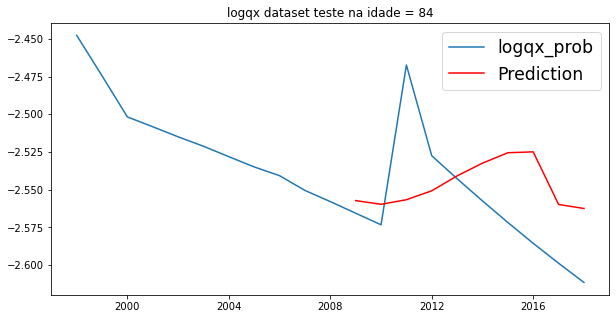

rmse:  [0.04373427]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1408 - mae: 0.3061
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1348 - mae: 0.2902
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1226 - mae: 0.2761
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1142 - mae: 0.2596
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1188 - mae: 0.2559
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0871 - mae: 0.2174
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0902 - mae: 0.2074
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0762 - mae: 0.1980
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0769 - mae: 0.2023
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0612 - mae: 0.1884
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0360 - mae: 0.1392
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0242 - mae: 0.1316
Epoch 90/500
1/1 [==============================] - 0s 890us/step - loss: 0.0111 - mae: 0.0767
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0287 - mae: 0.1323
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0471 - mae: 0.1774
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0135 - mae: 0.0931
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0194 - mae: 0.1076
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0212 - mae: 0.1199
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0296 - mae: 0.1394
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0232 - mae: 0.1235
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0205 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0892
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0704
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.1063
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0123 - mae: 0.0926
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0537
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0864
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0085 - mae: 0.0763
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0676
Epoch 183/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0095 - mae: 0.0849
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0143 - mae: 0.1031
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 943us/step - loss: 0.0056 - mae: 0.0646
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0670
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0638
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0612
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0652
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0562
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0440
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0488
Epoch 270/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0105 - mae: 0.0815
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0510
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0324
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0595
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0436
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0429
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0422
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0635
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0536
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0526
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0348
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0064 - mae: 0.0696
Epoch 359/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 958us/step - loss: 0.0026 - mae: 0.0368
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0319
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0424
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0624
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0481
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0420
Epoch 441/500
1/1 [==============================] - 0s 4ms/step - loss: 7.8040e-04 - mae: 0.0234
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0360
Epoch 443/500
1/1 [==============================] - 0s 6ms/step - loss: 9.3457e-04 - mae: 0.0242
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0578
Epoch 445/500
1/1 [==============================] - 0s 1ms/step

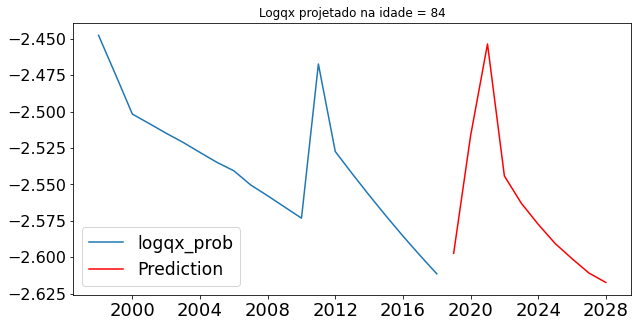

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2384 - mae: 0.3605
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2394 - mae: 0.3527
Epoch 3/500
1/1 [==============================] - 0s 5ms/step - loss: 0.2410 - mae: 0.3601
Epoch 4/500
1/1 [==============================] - 0s 5ms/step - loss: 0.2320 - mae: 0.3430
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2217 - mae: 0.3273
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2197 - mae: 0.3324
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2146 - mae: 0.3257
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2110 - mae: 0.3128
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1943 - mae: 0.2945
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1998 - mae: 0.3010
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1946 

1/1 [==============================] - 0s 1ms/step - loss: 0.1156 - mae: 0.2765
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1106 - mae: 0.2732
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1038 - mae: 0.2653
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1069 - mae: 0.2563
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1178 - mae: 0.2799
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0982 - mae: 0.2507
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1283 - mae: 0.2857
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1057 - mae: 0.2642
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1067 - mae: 0.2597
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2333
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0998 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0909 - mae: 0.2336
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0729 - mae: 0.2041
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0762 - mae: 0.1867
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0808 - mae: 0.2085
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0916 - mae: 0.2408
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0735 - mae: 0.1865
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0724 - mae: 0.2175
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0920 - mae: 0.2278
Epoch 184/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0821 - mae: 0.1949
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0742 - mae: 0.1889
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0726 - mae: 0.2012
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0818 - mae: 0.2212
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0696 - mae: 0.2191
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0752 - mae: 0.2275
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0603 - mae: 0.1806
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0552 - mae: 0.1969
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0893 - mae: 0.2277
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0640 - mae: 0.1790
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0751 - mae: 0.1769
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0550 - mae: 0.1537
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0423 - mae: 0.1724
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0707 - mae: 0.1647
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0603 - mae: 0.1909
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0423 - mae: 0.1668
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0633 - mae: 0.2069
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0660 - mae: 0.2239
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0646 - mae: 0.2073
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0459 - mae: 0.1760
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0376 - mae: 0.1502
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0579 - mae: 0.1825
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0356 - mae: 0.1496
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0210 - mae: 0.1132
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0312 - mae: 0.1495
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0293 - mae: 0.1473
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0888 - mae: 0.2141
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0313 - mae: 0.1554
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1623
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0480 - mae: 0.1490
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0702 - mae: 0.2198
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0532 - mae: 0.1903
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

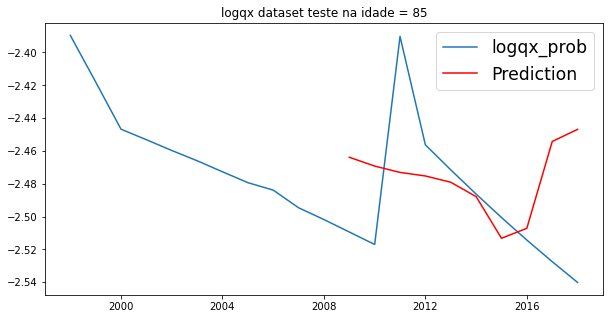

rmse:  [0.05089504]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2149 - mae: 0.3913
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2581 - mae: 0.4312
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1894 - mae: 0.3476
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1378 - mae: 0.2980
Epoch 5/500
1/1 [==============================] - 0s 12ms/step - loss: 0.1623 - mae: 0.3414
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1240 - mae: 0.2721
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1182 - mae: 0.2668
Epoch 8/500
1/1 [==============================] - 0s 14ms/step - loss: 0.1310 - mae: 0.2832
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0977 - mae: 0.2535
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0985 - mae: 0.2648
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0223 - mae: 0.1029
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0183 - mae: 0.0970
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0203 - mae: 0.1109
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0222 - mae: 0.1153
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0239 - mae: 0.1109
Epoch 93/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0293 - mae: 0.1238
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0259 - mae: 0.1196
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0292 - mae: 0.1308
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0267 - mae: 0.1173
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0251 - mae: 0.1225
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0196 - m

1/1 [==============================] - 0s 13ms/step - loss: 0.0208 - mae: 0.1193
Epoch 175/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0162 - mae: 0.0867
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0201 - mae: 0.0952
Epoch 177/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0044 - mae: 0.0576
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0814
Epoch 179/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0082 - mae: 0.0737
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - mae: 0.0764
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0789
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.0928
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0837
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0413
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0711
Epoch 263/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0054 - mae: 0.0575
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0671
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0578
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0651
Epoch 267/500
1/1 [==============================] - 0s 987us/step - loss: 0.0143 - mae: 0.0872
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0569
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0127 - mae: 0.0894
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0075 - mae: 0.0627
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0454
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0597
Epoch 350/500
1/1 [==============================] - 0s 752us/step - loss: 0.0099 - mae: 0.0700
Epoch 351/500
1/1 [==============================] - 0s 734us/step - loss: 0.0064 - mae: 0.0669
Epoch 352/500
1/1 [==============================] - 0s 791us/step - loss: 0.0102 - mae: 0.0683
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0121 - mae: 0.0737
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0596
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0493
Epoch 356/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0449
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0079 - mae: 0.0684
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0423
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0530
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0616
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0519
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0455
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0484
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0392
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0408
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0425
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0559
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

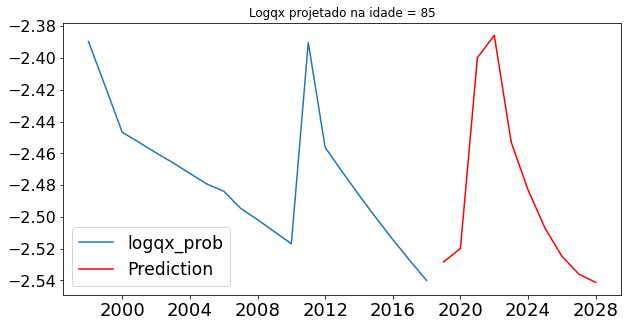

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2521 - mae: 0.3640
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2469 - mae: 0.3567
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2347 - mae: 0.3416
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2332 - mae: 0.3410
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2322 - mae: 0.3388
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2244 - mae: 0.3302
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2161 - mae: 0.3210
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2212 - mae: 0.3298
Epoch 9/500
1/1 [==============================] - 0s 796us/step - loss: 0.2106 - mae: 0.3164
Epoch 10/500
1/1 [==============================] - 0s 969us/step - loss: 0.1987 - mae: 0.3060
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2

1/1 [==============================] - 0s 1ms/step - loss: 0.1230 - mae: 0.2730
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0946 - mae: 0.2361
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1322 - mae: 0.2862
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1144 - mae: 0.2836
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1037 - mae: 0.2729
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1118 - mae: 0.2647
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1183 - mae: 0.2774
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0963 - mae: 0.2459
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1275 - mae: 0.2936
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0931 - mae: 0.2542
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1133 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0803 - mae: 0.2104
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0607 - mae: 0.1788
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0778 - mae: 0.2057
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0872 - mae: 0.1930
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0781 - mae: 0.1770
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0652 - mae: 0.1796
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0727 - mae: 0.2010
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1182 - mae: 0.2647
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0822 - mae: 0.2299
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0665 - mae: 0.1906
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0534 - mae: 0.1922
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0767 - mae: 0.2395
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0436 - mae: 0.1629
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0519 - mae: 0.1774
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0631 - mae: 0.1728
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0504 - mae: 0.1710
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0743 - mae: 0.1944
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0489 - mae: 0.1443
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0580 - mae: 0.1845
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0484 - mae: 0.1560
Epoch 273/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - mae: 0.1045
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0163 - mae: 0.1169
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0238 - mae: 0.1399
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1494
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0207 - mae: 0.1256
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0535 - mae: 0.1668
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0175 - mae: 0.1117
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0372 - mae: 0.1693
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0133 - mae: 0.0996
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mae: 0.1087
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0779
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0194 - mae: 0.1071
Epoch 439/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0121 - mae: 0.0948
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0645
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0451
Epoch 442/500
1/1 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.135 - 0s 3ms/step - loss: 0.0230 - mae: 0.1354
Epoch 443/500
1/1 [==============================] - 0s 20ms/step - loss: 0.0029 - mae: 0.0483
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mae: 0.0989
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0155 - mae: 0.0885
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0355
Epoch 447/500
1/1 [===============

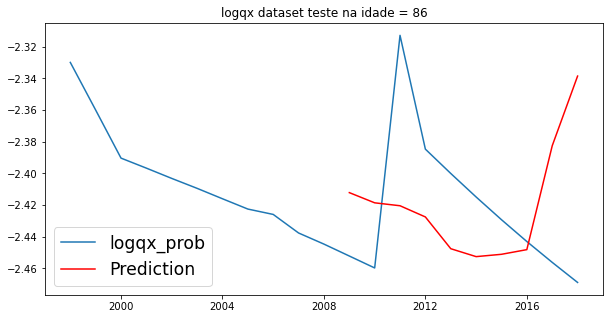

rmse:  [0.06576926]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0826 - mae: 0.1474
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0471 - mae: 0.1161
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0296 - mae: 0.1220
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0572 - mae: 0.1487
Epoch 5/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0428 - mae: 0.1533
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0445 - mae: 0.1710
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.0995
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0209 - mae: 0.1001
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0370 - mae: 0.1444
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0290 - mae: 0.1221
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0608
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0706
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0047 - mae: 0.0596
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0511
Epoch 92/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0043 - mae: 0.0566
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - mae: 0.0725
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0586
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0672
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0659
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0386
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0510
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0414
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0564
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0566
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0368
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0552
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0597
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0503
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0563
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0417
Epoch 185/500
1/1 [==============================] - 0s 6ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0366
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0611
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0448
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0272
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0040 - mae: 0.0445
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0529
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0465
Epoch 269/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0549
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0485
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0558
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 757us/step - loss: 0.0044 - mae: 0.0551
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0096 - mae: 0.0669
Epoch 351/500
1/1 [==============================] - 0s 993us/step - loss: 0.0039 - mae: 0.0479
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0439
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0486
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0326
Epoch 355/500
1/1 [==============================] - 0s 972us/step - loss: 0.0049 - mae: 0.0560
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0430
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0331
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0494
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - l

1/1 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0464
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0178 - mae: 0.0710
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0499
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0479
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0552
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0631
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0530
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0469
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0577
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0440
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

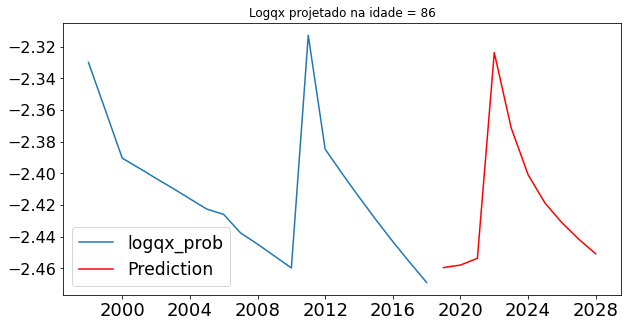

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2542 - mae: 0.3629
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2569 - mae: 0.3638
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2444 - mae: 0.3500
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2448 - mae: 0.3480
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2431 - mae: 0.3495
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2293 - mae: 0.3286
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2291 - mae: 0.3333
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2300 - mae: 0.3294
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2220 - mae: 0.3265
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2112 - mae: 0.3175
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2100 

1/1 [==============================] - 0s 3ms/step - loss: 0.1320 - mae: 0.3026
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1341 - mae: 0.3116
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1457 - mae: 0.3123
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1102 - mae: 0.2784
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1194 - mae: 0.2813
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1187 - mae: 0.2942
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1260 - mae: 0.2918
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1491 - mae: 0.3220
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1046 - mae: 0.2557
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1287 - mae: 0.3084
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1357 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0750 - mae: 0.2171
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1006 - mae: 0.2677
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0942 - mae: 0.2536
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1315 - mae: 0.2850
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1225 - mae: 0.2712
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0848 - mae: 0.2080
Epoch 182/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0805 - mae: 0.2156
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0835 - mae: 0.2211
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0737 - mae: 0.2023
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0759 - mae: 0.2375
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 4ms/step - loss: 0.0797 - mae: 0.2197
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0595 - mae: 0.1824
Epoch 265/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0611 - mae: 0.1761
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0580 - mae: 0.1589
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0918 - mae: 0.1913
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0831 - mae: 0.2195
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0673 - mae: 0.1847
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0775 - mae: 0.1967
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0491 - mae: 0.1697
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0675 - mae: 0.1981
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0319 - mae: 0.1481
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0511 - mae: 0.1667
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0485 - mae: 0.1712
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0314 - mae: 0.1513
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0452 - mae: 0.1607
Epoch 355/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0448 - mae: 0.1634
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0362 - mae: 0.1612
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0424 - mae: 0.1568
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0469 - mae: 0.1653
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0572 - mae: 0.1924
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0362 - mae: 0.1418
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0448 - mae: 0.1598
Epoch 439/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0324 - mae: 0.1600
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1155
Epoch 441/500
1/1 [==============================] - ETA: 0s - loss: 0.0228 - mae: 0.137 - 0s 1ms/step - loss: 0.0228 - mae: 0.1374
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0183 - mae: 0.1187
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0119 - mae: 0.0789
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0084 - mae: 0.0814
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0103 - mae: 0.0995
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.0860
Epoch 447/500
1/1 [=================

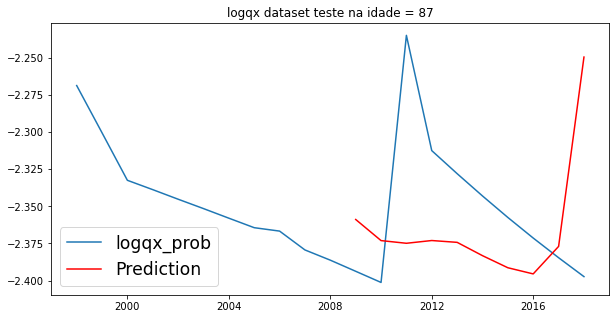

rmse:  [0.07261096]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0857
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0118 - mae: 0.0960
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0203 - mae: 0.1154
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1033
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.1040
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.0968
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0186 - mae: 0.1012
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0149 - mae: 0.0981
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0091 - mae: 0.0798
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0741
Epoch 11/500
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0701
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0099 - mae: 0.0868
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0836
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0849
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0746
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0135 - mae: 0.1039
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0760
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0151 - mae: 0.0878
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0105 - mae: 0.0789
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0106 - mae: 0.0858
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0121 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0704
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0599
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0114 - mae: 0.0823
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0095 - mae: 0.0737
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0266 - mae: 0.1118
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0655
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0644
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0702
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0614
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0061 - mae: 0.0639
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0637
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0495
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0652
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0182 - mae: 0.0983
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0432
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0095 - mae: 0.0811
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0704
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0560
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0498
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0649
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0502
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0560
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0380
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0461
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0650
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0571
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0465
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0090 - mae: 0.0668
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0471
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0516
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0632
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0383
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0523
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0417
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0470
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0159 - mae: 0.0793
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0400
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0541
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0545
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0517
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0

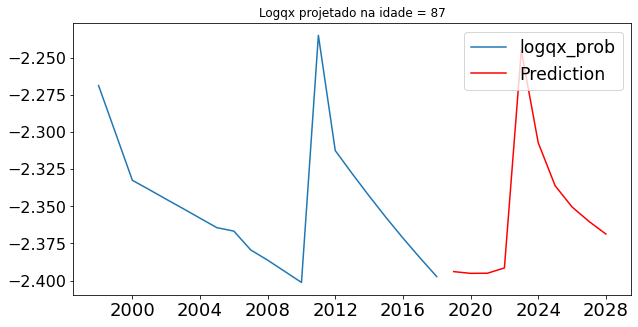

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2578 - mae: 0.3601
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2520 - mae: 0.3541
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2525 - mae: 0.3529
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2472 - mae: 0.3484
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2461 - mae: 0.3526
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2394 - mae: 0.3404
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2323 - mae: 0.3351
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2338 - mae: 0.3343
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2224 - mae: 0.3256
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2205 - mae: 0.3242
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2178 

1/1 [==============================] - 0s 5ms/step - loss: 0.1352 - mae: 0.3217
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1372 - mae: 0.2955
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1161 - mae: 0.2841
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1209 - mae: 0.3087
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1012 - mae: 0.2625
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0920 - mae: 0.2558
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1024 - mae: 0.2558
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1015 - mae: 0.2679
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1121 - mae: 0.2813
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0917 - mae: 0.2497
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1081 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0556 - mae: 0.1656
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0575 - mae: 0.1799
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0688 - mae: 0.2059
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0688 - mae: 0.1944
Epoch 179/500
1/1 [==============================] - 0s 973us/step - loss: 0.0778 - mae: 0.2077
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0781 - mae: 0.1837
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0722 - mae: 0.1834
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0645 - mae: 0.1766
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0537 - mae: 0.1692
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0548 - mae: 0.1667
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0438 - mae: 0.1813
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0293 - mae: 0.1329
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0415 - mae: 0.1477
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0369 - mae: 0.1494
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0532 - mae: 0.1454
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0273 - mae: 0.1091
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0448 - mae: 0.1480
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0428 - mae: 0.1710
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0295 - mae: 0.1434
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0437 - mae: 0.1504
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0648
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0514
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0704
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0228 - mae: 0.1311
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.0908
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0210 - mae: 0.1069
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.1058
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0227 - mae: 0.1305
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0122 - mae: 0.0987
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0707
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0096 - mae: 0.0785
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0510
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0801
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0628
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0630
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0643
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0720
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0650
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0618
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0589
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

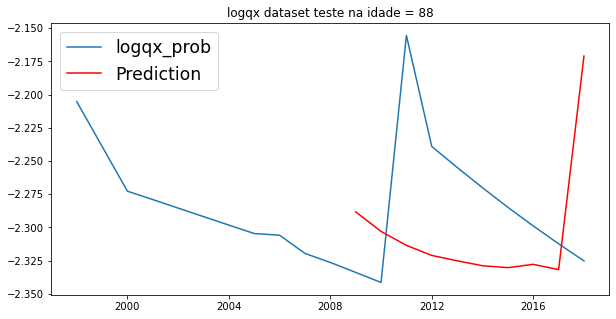

rmse:  [0.08403907]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0571
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0614
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0517
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0587
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0689
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0551
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0726
Epoch 8/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0037 - mae: 0.0512
Epoch 9/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0413
Epoch 10/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0028 - mae: 0.0358
Epoch 11/500
1/1 [==============================] - 0s 1ms

1/1 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0500
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0335
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0345
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0489
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0416
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0574
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0503
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.0765
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0558
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0262
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0362
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0385
Epoch 176/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0305
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0375
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 8.2226e-04 - mae: 0.0253
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0473
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0440
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0421
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0245
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 7.9511e-04 - mae: 0.0224
Epoch 184/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0264
Epoch 261/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0277
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0354
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0450
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0330
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0371
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0076 - mae: 0.0607
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0308
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0288
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0010 - mae: 0.0221
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0305
Epoch 347/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0279
Epoch 348/500
1/1 [==============================] - 0s 889us/step - loss: 9.6964e-04 - mae: 0.0243
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0313
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0373
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0626
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0295
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0455
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0393
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0352
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0326
Epoch 433/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0265
Epoch 434/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0281
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0455
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0391
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 6.4192e-04 - mae: 0.0207
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0372
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0529
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0275
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0264
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - los

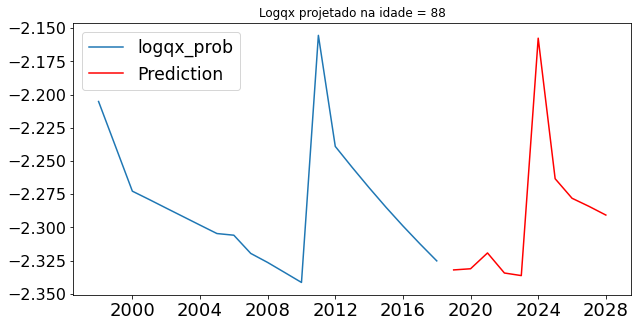

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2588 - mae: 0.3576
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2535 - mae: 0.3488
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2441 - mae: 0.3414
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2361 - mae: 0.3334
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2357 - mae: 0.3322
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2220 - mae: 0.3213
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2237 - mae: 0.3249
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2193 - mae: 0.3230
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.2220 - mae: 0.3257
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2110 - mae: 0.3202
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1963 

1/1 [==============================] - 0s 3ms/step - loss: 0.1518 - mae: 0.3353
Epoch 90/500
1/1 [==============================] - 0s 14ms/step - loss: 0.1537 - mae: 0.3301
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1354 - mae: 0.3078
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1339 - mae: 0.3179
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1194 - mae: 0.3063
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1348 - mae: 0.3116
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1163 - mae: 0.2858
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1413 - mae: 0.3272
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1266 - mae: 0.2961
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1345 - mae: 0.3062
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1028 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.1035 - mae: 0.2275
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0782 - mae: 0.2000
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0773 - mae: 0.2188
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0673 - mae: 0.2079
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0939 - mae: 0.2318
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0669 - mae: 0.2022
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0743 - mae: 0.1931
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.1842
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0622 - mae: 0.1586
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0617 - mae: 0.1620
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0549 - mae: 0.1510
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0621 - mae: 0.1599
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0689 - mae: 0.1959
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0780 - mae: 0.2037
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1819
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0569 - mae: 0.1705
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0359 - mae: 0.1285
Epoch 270/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0439 - mae: 0.1554
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0508 - mae: 0.1744
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0480 - mae: 0.1622
Epoch 273/500
1/1 [==============================] - 0s 947us/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - mae: 0.1276
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0317 - mae: 0.1424
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0277 - mae: 0.1303
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0116 - mae: 0.0839
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0296 - mae: 0.1144
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1084
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0276 - mae: 0.1322
Epoch 357/500
1/1 [==============================] - 0s 923us/step - loss: 0.0222 - mae: 0.1324
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0245 - mae: 0.1291
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0235 - mae: 0.1269
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0691
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0863
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0556
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0460
Epoch 441/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0029 - mae: 0.0436
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - mae: 0.0743
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0669
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0687
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0488
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0682
Epoch 447/500
1/1 [==============================] - 0s 3ms/step - loss: 

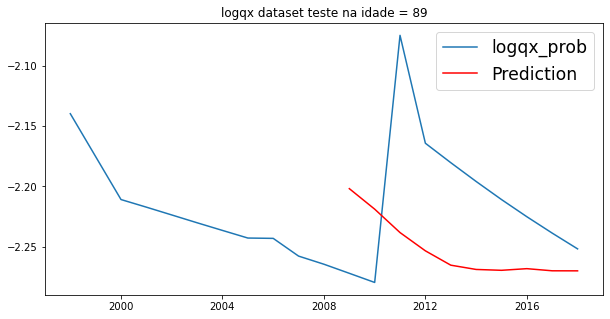

rmse:  [0.07924361]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0536
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0678
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0206 - mae: 0.0799
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0525
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0559
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0642
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0743
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0544
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0585
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0702
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 954us/step - loss: 0.0027 - mae: 0.0429
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0072 - mae: 0.0542
Epoch 90/500
1/1 [==============================] - 0s 918us/step - loss: 0.0031 - mae: 0.0424
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0351
Epoch 92/500
1/1 [==============================] - 0s 997us/step - loss: 0.0088 - mae: 0.0577
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0464
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0371
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0345
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0348
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - mae: 0.0636
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.002

Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0337
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0360
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0472
Epoch 178/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0074 - mae: 0.0502
Epoch 179/500
1/1 [==============================] - 0s 840us/step - loss: 0.0140 - mae: 0.0713
Epoch 180/500
1/1 [==============================] - 0s 719us/step - loss: 0.0035 - mae: 0.0463
Epoch 181/500
1/1 [==============================] - 0s 758us/step - loss: 0.0027 - mae: 0.0420
Epoch 182/500
1/1 [==============================] - 0s 723us/step - loss: 0.0019 - mae: 0.0363
Epoch 183/500
1/1 [==============================] - 0s 721us/step - loss: 0.0019 - mae: 0.0343
Epoch 184/500
1/1 [==============================] - 0s 981us/step - loss: 0.0013 - mae: 0.0301
Epoch 185/500
1/1 [============================

1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0569
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0264
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0368
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0567
Epoch 265/500
1/1 [==============================] - 0s 912us/step - loss: 0.0032 - mae: 0.0427
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0366
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0698
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0409
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0510
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0600
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0485
Epoch 348/500
1/1 [==============================] - 0s 789us/step - loss: 9.8989e-04 - mae: 0.0271
Epoch 349/500
1/1 [==============================] - 0s 774us/step - loss: 0.0018 - mae: 0.0365
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0403
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0448
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0011 - mae: 0.0267
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0371
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0323
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0447
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0341
Epoch 357/500
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 982us/step - loss: 0.0021 - mae: 0.0410
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0382
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0299
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0382
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0455
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0426
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0377
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0432
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0384
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0372
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss:

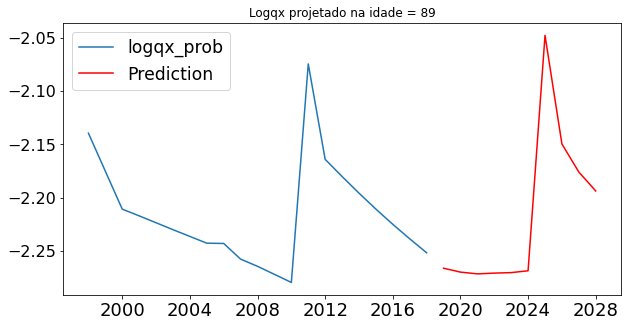

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2547 - mae: 0.3526
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2462 - mae: 0.3417
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2435 - mae: 0.3392
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2366 - mae: 0.3361
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2339 - mae: 0.3306
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2289 - mae: 0.3257
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2276 - mae: 0.3262
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2248 - mae: 0.3263
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2121 - mae: 0.3202
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2159 - mae: 0.3274
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2199 

1/1 [==============================] - 0s 1ms/step - loss: 0.1250 - mae: 0.3010
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1286 - mae: 0.3067
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1351 - mae: 0.3234
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1167 - mae: 0.2710
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1237 - mae: 0.2888
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1077 - mae: 0.2738
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1238 - mae: 0.2828
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1226 - mae: 0.3012
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1344 - mae: 0.3099
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1205 - mae: 0.2819
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1400 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0983 - mae: 0.2397
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0988 - mae: 0.2442
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0830 - mae: 0.2291
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0931 - mae: 0.2536
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0924 - mae: 0.2388
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0863 - mae: 0.2393
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0878 - mae: 0.2402
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0923 - mae: 0.2384
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0898 - mae: 0.2413
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0802 - mae: 0.2147
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0721 - mae: 0.1819
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0583 - mae: 0.1668
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0656 - mae: 0.1846
Epoch 266/500
1/1 [==============================] - 0s 992us/step - loss: 0.0915 - mae: 0.1934
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0555 - mae: 0.1685
Epoch 268/500
1/1 [==============================] - 0s 772us/step - loss: 0.0624 - mae: 0.1638
Epoch 269/500
1/1 [==============================] - 0s 883us/step - loss: 0.0540 - mae: 0.1593
Epoch 270/500
1/1 [==============================] - 0s 719us/step - loss: 0.0505 - mae: 0.1646
Epoch 271/500
1/1 [==============================] - 0s 789us/step - loss: 0.0685 - mae: 0.1872
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0644 - mae: 0.1704
Epoch 273/500
1/1 [==============================] - 0s 2ms/step

1/1 [==============================] - 0s 3ms/step - loss: 0.0616 - mae: 0.1730
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0511 - mae: 0.1514
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0696 - mae: 0.1920
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0790 - mae: 0.2069
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0509 - mae: 0.1696
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0382 - mae: 0.1488
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0448 - mae: 0.1603
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0582 - mae: 0.1769
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0480 - mae: 0.1541
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0609 - mae: 0.1779
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 926us/step - loss: 0.0444 - mae: 0.1701
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0320 - mae: 0.1182
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0224 - mae: 0.1200
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0391 - mae: 0.1622
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0538 - mae: 0.1908
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0235 - mae: 0.1110
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0548 - mae: 0.1846
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0318 - mae: 0.1468
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0422 - mae: 0.1486
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0282 - mae: 0.1158
Epoch 446/500
1/1 [==============================] - 0s 11ms/step - loss

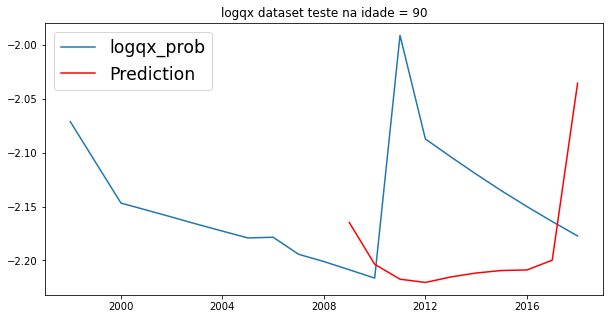

rmse:  [0.11058871]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2463
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0759 - mae: 0.2375
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0625 - mae: 0.2002
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0569 - mae: 0.2000
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0469 - mae: 0.1678
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0403 - mae: 0.1864
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0367 - mae: 0.1646
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0348 - mae: 0.1557
Epoch 9/500
1/1 [==============================] - 0s 993us/step - loss: 0.0546 - mae: 0.1989
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.1026
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - mae: 0.1009
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0105 - mae: 0.0820
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0679
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0779
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0852
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0118 - mae: 0.0877
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0112 - mae: 0.0829
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0133 - mae: 0.0841
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - mae: 0.0782
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0238 - mae: 0.1216
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0113 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0545
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0782
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0130 - mae: 0.0862
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0519
Epoch 179/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0126 - mae: 0.0839
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0686
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0300 - mae: 0.0957
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0492
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0098 - mae: 0.0659
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0778
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0041 - mae: 0.0550
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0398
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0425
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0466
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0472
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0083 - mae: 0.0519
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0387
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - mae: 0.0573
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0601
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0577
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0564
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0366
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0402
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0314
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0639
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0411
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0403
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0319
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mae: 0.0607
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0561
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0422
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0621
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0379
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0370
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0324
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0374
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0494
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0446
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0289
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0516
Epoch 446/500
1/1 [==============================] - 0s 2ms/

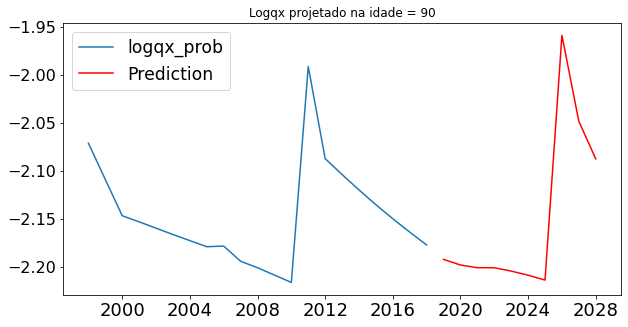

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2761 - mae: 0.3711
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2636 - mae: 0.3609
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2629 - mae: 0.3602
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2581 - mae: 0.3551
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2411 - mae: 0.3399
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2366 - mae: 0.3324
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2409 - mae: 0.3375
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2410 - mae: 0.3386
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2283 - mae: 0.3332
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2316 - mae: 0.3381
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2265 

1/1 [==============================] - 0s 3ms/step - loss: 0.1380 - mae: 0.3410
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1199 - mae: 0.3046
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1370 - mae: 0.2963
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1330 - mae: 0.3164
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1457 - mae: 0.3231
Epoch 94/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1308 - mae: 0.3176
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1252 - mae: 0.2907
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1264 - mae: 0.2983
Epoch 97/500
1/1 [==============================] - ETA: 0s - loss: 0.1410 - mae: 0.340 - 0s 2ms/step - loss: 0.1410 - mae: 0.3404
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1226 - mae: 0.2777
Epoch 99/500
1/1 [===========================

1/1 [==============================] - 0s 1ms/step - loss: 0.0921 - mae: 0.2148
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0735 - mae: 0.2095
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0748 - mae: 0.2083
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0669 - mae: 0.1649
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0727 - mae: 0.1870
Epoch 180/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0480 - mae: 0.1604
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0730 - mae: 0.2108
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1960
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0690 - mae: 0.1956
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0577 - mae: 0.1681
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0319 - mae: 0.1372
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0587 - mae: 0.2019
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0561 - mae: 0.2000
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0193 - mae: 0.1117
Epoch 266/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0388 - mae: 0.1718
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0568 - mae: 0.1765
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0331 - mae: 0.1460
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0446 - mae: 0.1701
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0395 - mae: 0.1531
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1505
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0323 - mae: 0.1182
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0571
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0258 - mae: 0.0887
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0616
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0246 - mae: 0.1001
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0304 - mae: 0.1224
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0743
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0282 - mae: 0.1267
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0548 - mae: 0.1734
Epoch 358/500
1/1 [==============================] - 0s 785us/step - loss: 0.0097 - mae: 0.0830
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0238 - mae: 0.1048
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0718
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.0996
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0679
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0703
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0108 - mae: 0.0838
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0102 - mae: 0.0935
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0843
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0543
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - mae: 0.0958
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

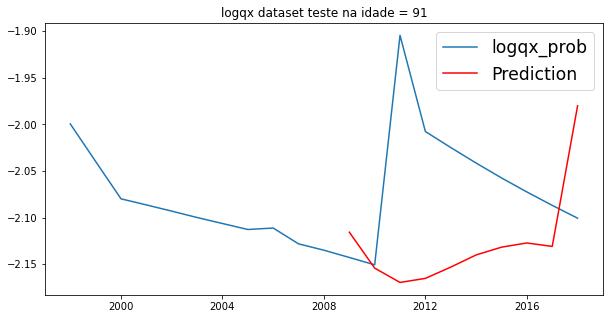

rmse:  [0.12113627]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0658 - mae: 0.1936
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0763 - mae: 0.2201
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0677 - mae: 0.2136
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0613 - mae: 0.1711
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0682 - mae: 0.2226
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0394 - mae: 0.1639
Epoch 7/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0286 - mae: 0.1413
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0360 - mae: 0.1579
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0238 - mae: 0.1260
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0156 - mae: 0.1059
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0427
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0652
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0641
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0525
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0806
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0083 - mae: 0.0692
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0567
Epoch 95/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0112 - mae: 0.0716
Epoch 96/500
1/1 [==============================] - 0s 929us/step - loss: 0.0068 - mae: 0.0664
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0095 - mae: 0.0798
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 -

1/1 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0535
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0788
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0803
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0583
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0063 - mae: 0.0618
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0479
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.0879
Epoch 182/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0440
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0628
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0449
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0461
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0345
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0487
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0385
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0551
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0399
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0479
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0293
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0512
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0282
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0357
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0253
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0363
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0456
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0366
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0480
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0441
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0541
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0464
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0467
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0013 - mae: 0.0296
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0382
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0310
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0375
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0421
Epoch 440/500
1/1 [==============================] - 0s 984us/step - loss: 0.0032 - mae: 0.0296
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0335
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0369
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0367
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0462
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss:

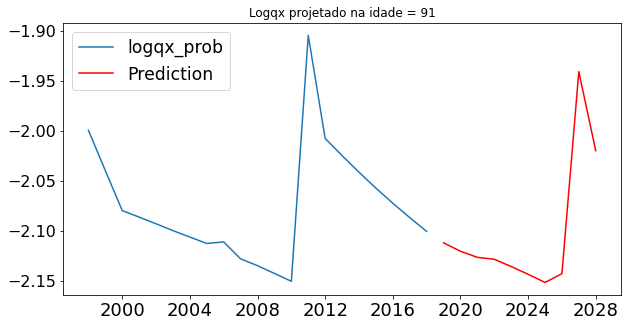

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2740 - mae: 0.3777
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2640 - mae: 0.3628
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2595 - mae: 0.3552
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2562 - mae: 0.3543
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2563 - mae: 0.3577
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2456 - mae: 0.3410
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2442 - mae: 0.3449
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2428 - mae: 0.3420
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2288 - mae: 0.3379
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2255 - mae: 0.3281
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2198 

1/1 [==============================] - 0s 1ms/step - loss: 0.1321 - mae: 0.2985
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1101 - mae: 0.2792
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1166 - mae: 0.2964
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1238 - mae: 0.2765
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1035 - mae: 0.2732
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1407 - mae: 0.3269
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1290 - mae: 0.2830
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1184 - mae: 0.2777
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1140 - mae: 0.2788
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1183 - mae: 0.2936
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1491 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0690 - mae: 0.1830
Epoch 177/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0717 - mae: 0.1543
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0769 - mae: 0.1790
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0653 - mae: 0.1640
Epoch 180/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0675 - mae: 0.1741
Epoch 181/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0582 - mae: 0.1841
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0569 - mae: 0.1601
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0792 - mae: 0.2259
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0579 - mae: 0.2059
Epoch 185/500
1/1 [==============================] - 0s 958us/step - loss: 0.0668 - mae: 0.1946
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 4ms/step - loss: 0.0348 - mae: 0.1350
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0508 - mae: 0.1668
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0428 - mae: 0.1538
Epoch 266/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0446 - mae: 0.1645
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0489 - mae: 0.1580
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0528 - mae: 0.1740
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0514 - mae: 0.1666
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0356 - mae: 0.1201
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0479 - mae: 0.1933
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0446 - mae: 0.1729
Epoch 273/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0400 - mae: 0.1461
Epoch 351/500
1/1 [==============================] - 0s 916us/step - loss: 0.0129 - mae: 0.0909
Epoch 352/500
1/1 [==============================] - 0s 932us/step - loss: 0.0184 - mae: 0.1137
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0439 - mae: 0.1610
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0185 - mae: 0.1096
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - mae: 0.0973
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1122
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0291 - mae: 0.1411
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0213 - mae: 0.1102
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0488 - mae: 0.1795
Epoch 360/500
1/1 [==============================] - 0s 5ms/step - los

Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0923
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0827
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0534 - mae: 0.1731
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0751
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0162 - mae: 0.1003
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0274 - mae: 0.1061
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0168 - mae: 0.1025
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0626
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0878
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0242 - mae: 0.1326
Epoch 447/500
1/1 [==============================] - 0s 1ms/

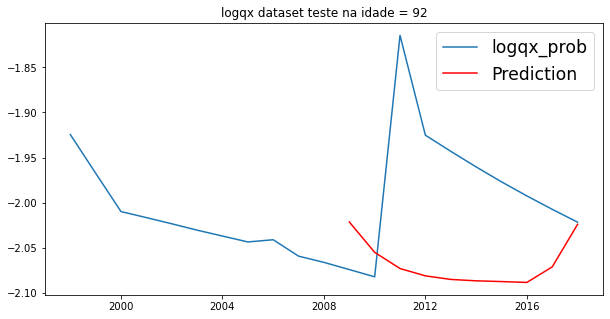

rmse:  [0.12499121]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0570 - mae: 0.1989
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0408 - mae: 0.1674
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0461 - mae: 0.1835
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0609 - mae: 0.2059
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0342 - mae: 0.1482
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0306 - mae: 0.1460
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0357 - mae: 0.1630
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0280 - mae: 0.1413
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0314 - mae: 0.1532
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0267 - mae: 0.1358
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 17ms/step - loss: 0.0229 - mae: 0.1089
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0823
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1125
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0142 - mae: 0.1017
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0122 - mae: 0.0865
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0134 - mae: 0.0922
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0740
Epoch 95/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0131 - mae: 0.0817
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0136 - mae: 0.1062
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0153 - mae: 0.1043
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0609
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0787
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0519
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0563
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0646
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0674
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0110 - mae: 0.0850
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0612
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0789
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0855
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0452
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0628
Epoch 264/500
1/1 [==============================] - 0s 971us/step - loss: 0.0057 - mae: 0.0556
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0029 - mae: 0.0409
Epoch 266/500
1/1 [==============================] - 0s 916us/step - loss: 0.0052 - mae: 0.0484
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0396
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0528
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0669
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0411
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0653
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0319
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0048 - mae: 0.0558
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0435
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0331
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0694
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0509
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0607
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0631
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0619
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0410
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0394
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0291
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0465
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0439
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0432
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0332
Epoch 442/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0680
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 8.8899e-04 - mae: 0.0239
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0314
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0618
Epoch 446/500
1/1 [==============================] - 0s 

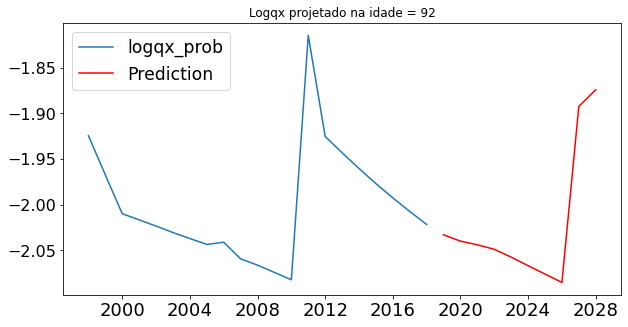

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2788 - mae: 0.3731
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2640 - mae: 0.3587
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2581 - mae: 0.3535
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2508 - mae: 0.3474
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2481 - mae: 0.3443
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2447 - mae: 0.3408
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2392 - mae: 0.3401
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2359 - mae: 0.3342
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2352 - mae: 0.3447
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2279 - mae: 0.3380
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2212 

1/1 [==============================] - 0s 1ms/step - loss: 0.1167 - mae: 0.2811
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1531 - mae: 0.3119
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1266 - mae: 0.3208
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1129 - mae: 0.2893
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1137 - mae: 0.2949
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1049 - mae: 0.2799
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1157 - mae: 0.2828
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1285 - mae: 0.3035
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1102 - mae: 0.2768
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1112 - mae: 0.2900
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1223 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0643 - mae: 0.1794
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2499
Epoch 178/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0645 - mae: 0.1669
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0565 - mae: 0.1981
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0719 - mae: 0.2293
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0760 - mae: 0.2395
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0718 - mae: 0.1890
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0797 - mae: 0.2218
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0741 - mae: 0.1841
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0691 - mae: 0.1826
Epoch 186/500
1/1 [==============================] - 0s 11ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0490 - mae: 0.1454
Epoch 264/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0606 - mae: 0.1657
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0575 - mae: 0.1486
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0706 - mae: 0.2015
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0618 - mae: 0.1880
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0582 - mae: 0.1933
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0717 - mae: 0.2081
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0691 - mae: 0.1987
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0615 - mae: 0.1587
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0728 - mae: 0.1689
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0437 - mae: 0.1519
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0553 - mae: 0.1797
Epoch 352/500
1/1 [==============================] - 0s 946us/step - loss: 0.0595 - mae: 0.1585
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0813 - mae: 0.1982
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0433 - mae: 0.1516
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0727 - mae: 0.1605
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0339 - mae: 0.1327
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0469 - mae: 0.1504
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0418 - mae: 0.1527
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0338 - mae: 0.1258
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0521 - mae: 0.1627
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0266 - mae: 0.1383
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0427 - mae: 0.1171
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0314 - mae: 0.1164
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0214 - mae: 0.1075
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1002
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0407 - mae: 0.1683
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0478 - mae: 0.1401
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0237 - mae: 0.1113
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0388 - mae: 0.1586
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

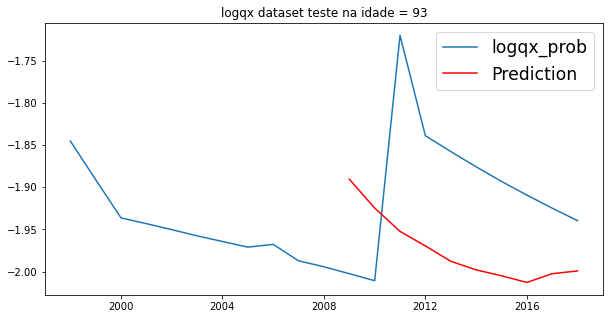

rmse:  [0.12480412]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1057
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0301 - mae: 0.1247
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0284 - mae: 0.1238
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0233 - mae: 0.1349
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0146 - mae: 0.1061
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0214 - mae: 0.1243
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.1091
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0137 - mae: 0.1044
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0936
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0176 - mae: 0.1190
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0804
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0045 - mae: 0.0465
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0562
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0065 - mae: 0.0675
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0083 - mae: 0.0761
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0158 - mae: 0.0682
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0510
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0475
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0210 - mae: 0.0939
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0565
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0604
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0388
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0339
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0379
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0344
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0475
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0498
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0633
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0349
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0442
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0344
Epoch 262/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0500
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0075 - mae: 0.0590
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0105 - mae: 0.0686
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0440
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0512
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0655
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0419
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0028 - mae: 0.0370
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0043 - mae: 0.0539
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0218
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 9.3607e-04 - mae: 0.0242
Epoch 350/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0045 - mae: 0.0451
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0391
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0497
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0574
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0400
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0465
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0329
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0311
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0363
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0316
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0298
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0411
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0318
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0368
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0371
Epoch 442/500
1/1 [==============================] - 0s 11ms/step - loss: 7.5618e-04 - mae: 0.0213
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0430
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0280
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - lo

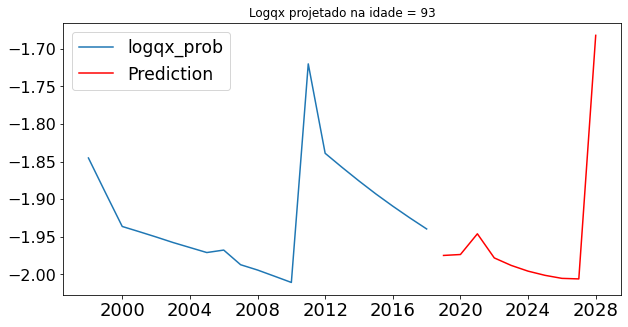

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2725 - mae: 0.3693
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2594 - mae: 0.3560
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2624 - mae: 0.3609
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2530 - mae: 0.3499
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2501 - mae: 0.3446
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2439 - mae: 0.3403
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2462 - mae: 0.3475
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2355 - mae: 0.3381
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2258 - mae: 0.3325
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2245 - mae: 0.3364
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2203 

1/1 [==============================] - 0s 1ms/step - loss: 0.1292 - mae: 0.3088
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1122 - mae: 0.2751
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1154 - mae: 0.2986
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.2993
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1073 - mae: 0.2867
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0986 - mae: 0.2576
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1237 - mae: 0.2907
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.3063
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1135 - mae: 0.2729
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1187 - mae: 0.2829
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1258 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0834 - mae: 0.1892
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0691 - mae: 0.1878
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0804 - mae: 0.2163
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0798 - mae: 0.2158
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0692 - mae: 0.1856
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0658 - mae: 0.1828
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0743 - mae: 0.1898
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0669 - mae: 0.1634
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0539 - mae: 0.1630
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0614 - mae: 0.1999
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0481 - mae: 0.1612
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0645 - mae: 0.1677
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0563 - mae: 0.1728
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1748
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0481 - mae: 0.1669
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0805 - mae: 0.1927
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0723 - mae: 0.1850
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0448 - mae: 0.1384
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0519 - mae: 0.1710
Epoch 272/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0502 - mae: 0.1714
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0456 - mae: 0.1626
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0612 - mae: 0.1531
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0302 - mae: 0.1408
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0557 - mae: 0.1596
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0450 - mae: 0.1543
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0465 - mae: 0.1487
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0378 - mae: 0.1577
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0462 - mae: 0.1767
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0625 - mae: 0.1823
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0464 - mae: 0.1768
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.0983
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0433 - mae: 0.1610
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0265 - mae: 0.1189
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0187 - mae: 0.1041
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0752
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0384 - mae: 0.1174
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0222 - mae: 0.0933
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0127 - mae: 0.1019
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.1052
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0756
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

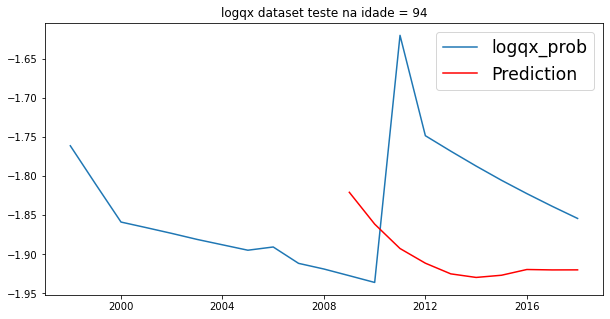

rmse:  [0.140738]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1156
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0272 - mae: 0.1292
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0213 - mae: 0.1181
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0279 - mae: 0.1351
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0261 - mae: 0.1378
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0305 - mae: 0.1410
Epoch 7/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0299 - mae: 0.1478
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1421
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0246 - mae: 0.1311
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0190 - mae: 0.1224
Epoch 11/500
1/1 [==============================] - 0s 1ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0742
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0024 - mae: 0.0381
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0459
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0618
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0595
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0399
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0569
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0606
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0474
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0477
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0544
Epoch 175/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0534
Epoch 176/500
1/1 [==============================] - 0s 919us/step - loss: 0.0015 - mae: 0.0324
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0454
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0348
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0464
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0538
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0483
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0482
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0418
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0517
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0295
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0389
Epoch 264/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0266
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0030 - mae: 0.0345
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0411
Epoch 267/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0018 - mae: 0.0345
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0325
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 9.5045e-04 - mae: 0.0247
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0597
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0589
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 9.1853e-04 - mae: 0.0240
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0466
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0549
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0523
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0363
Epoch 354/500
1/1 [==============================] - 0s 954us/step - loss: 0.0064 - mae: 0.0515
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0069 - mae: 0.0598
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0455
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0379
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - l

1/1 [==============================] - 0s 730us/step - loss: 0.0013 - mae: 0.0315
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0116 - mae: 0.0579
Epoch 437/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0375
Epoch 438/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0339
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0542
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0405
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0408
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0329
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0619
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0295
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss:

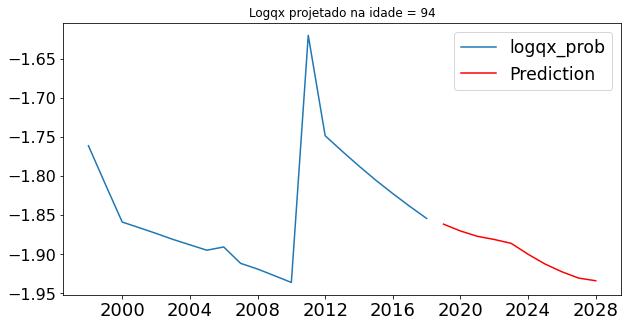

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.3010 - mae: 0.3961
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - mae: 0.3904
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2855 - mae: 0.3804
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2886 - mae: 0.3821
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2747 - mae: 0.3684
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2757 - mae: 0.3682
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2757 - mae: 0.3691
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2649 - mae: 0.3606
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2708 - mae: 0.3656
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2585 - mae: 0.3543
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2659 

1/1 [==============================] - 0s 1ms/step - loss: 0.1541 - mae: 0.3516
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1021 - mae: 0.2628
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1278 - mae: 0.3108
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1541 - mae: 0.3354
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1174 - mae: 0.3032
Epoch 94/500
1/1 [==============================] - 0s 946us/step - loss: 0.1312 - mae: 0.3269
Epoch 95/500
1/1 [==============================] - 0s 960us/step - loss: 0.1333 - mae: 0.3097
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1263 - mae: 0.3235
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1311 - mae: 0.3133
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1093 - mae: 0.2855
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1235 

1/1 [==============================] - 0s 1ms/step - loss: 0.1051 - mae: 0.2093
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0734 - mae: 0.1824
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0548 - mae: 0.1778
Epoch 179/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0654 - mae: 0.1896
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0839 - mae: 0.2068
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0641 - mae: 0.1969
Epoch 182/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0730 - mae: 0.2063
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0744 - mae: 0.1993
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0600 - mae: 0.1589
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0654 - mae: 0.1605
Epoch 186/500
1/1 [==============================] - 0s 6ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0444 - mae: 0.1639
Epoch 264/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0608 - mae: 0.1804
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0541 - mae: 0.1659
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0651 - mae: 0.1739
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0544 - mae: 0.1610
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0674 - mae: 0.1763
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0637 - mae: 0.1971
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0501 - mae: 0.1567
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0707 - mae: 0.1704
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0433 - mae: 0.1508
Epoch 273/500
1/1 [==============================] - 0s 4ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0276 - mae: 0.1357
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0263 - mae: 0.1339
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0368 - mae: 0.1360
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0500 - mae: 0.1832
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0292 - mae: 0.1320
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0267 - mae: 0.1061
Epoch 356/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0260 - mae: 0.1266
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0238 - mae: 0.1213
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0317 - mae: 0.1621
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1096
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0965
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0087 - mae: 0.0698
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0714
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0305 - mae: 0.1493
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0156 - mae: 0.1111
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0892
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0574
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0253 - mae: 0.1106
Epoch 444/500
1/1 [==============================] - 0s 790us/step - loss: 0.0047 - mae: 0.0542
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0509
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss:

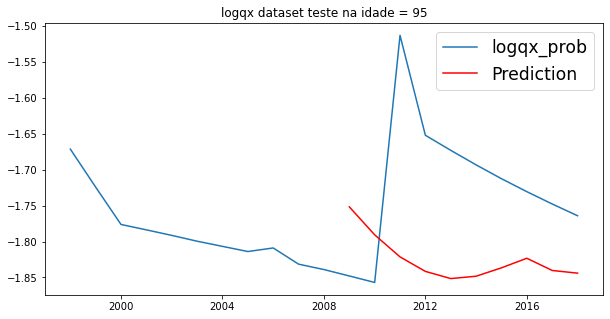

rmse:  [0.15483735]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0328 - mae: 0.1519
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0299 - mae: 0.1315
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0242 - mae: 0.1301
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0442 - mae: 0.1690
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - mae: 0.1286
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0120 - mae: 0.0926
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0219 - mae: 0.1168
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0219 - mae: 0.1185
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0820
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0123 - mae: 0.0924
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0555
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.0966
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0654
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0697
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0586
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0615
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0562
Epoch 95/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0532
Epoch 96/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0100 - mae: 0.0784
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0032 - mae: 0.0438
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0411
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0406
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0078 - mae: 0.0798
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0436
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0395
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0708
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0379
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0512
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0567
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0505
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0700
Epoch 263/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0042 - mae: 0.0535
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0364
Epoch 265/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0024 - mae: 0.0342
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0026 - mae: 0.0375
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - mae: 0.0534
Epoch 268/500
1/1 [==============================] - 0s 921us/step - loss: 0.0041 - mae: 0.0450
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0497
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0469
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0048 - mae: 0.0537
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 959us/step - loss: 0.0015 - mae: 0.0333
Epoch 350/500
1/1 [==============================] - 0s 814us/step - loss: 0.0024 - mae: 0.0380
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0319
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0335
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0442
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0500
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0607
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0396
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0279
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0556
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0570
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0469
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0419
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0524
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0040 - mae: 0.0505
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0344
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0819
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0365
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0259
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0323
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

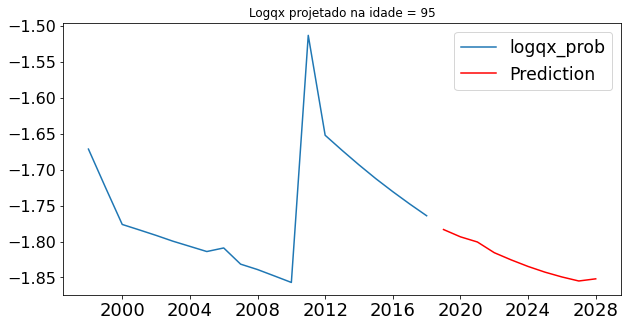

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2652 - mae: 0.3581
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2646 - mae: 0.3580
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2621 - mae: 0.3579
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2615 - mae: 0.3548
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2472 - mae: 0.3403
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2390 - mae: 0.3374
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2319 - mae: 0.3353
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2329 - mae: 0.3377
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2317 - mae: 0.3388
Epoch 10/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2281 - mae: 0.3443
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2120 

1/1 [==============================] - 0s 1ms/step - loss: 0.1198 - mae: 0.2922
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.2875
Epoch 91/500
1/1 [==============================] - 0s 23ms/step - loss: 0.1190 - mae: 0.3042
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1355 - mae: 0.3411
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1184 - mae: 0.2881
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1231 - mae: 0.3046
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1147 - mae: 0.2846
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1146 - mae: 0.2824
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1270 - mae: 0.3021
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1107 - mae: 0.2836
Epoch 99/500
1/1 [==============================] - 0s 957us/step - loss: 0.1311 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0767 - mae: 0.2023
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0803 - mae: 0.2168
Epoch 178/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0768 - mae: 0.2228
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0843 - mae: 0.2059
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0766 - mae: 0.2178
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0866 - mae: 0.2254
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0746 - mae: 0.2111
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0745 - mae: 0.2138
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0643 - mae: 0.1838
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0899 - mae: 0.2293
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0566 - mae: 0.1661
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0770 - mae: 0.1868
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0782 - mae: 0.1595
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0737 - mae: 0.1868
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0825 - mae: 0.2189
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0982 - mae: 0.2156
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0524 - mae: 0.1674
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0507 - mae: 0.1693
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0702 - mae: 0.2087
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0564 - mae: 0.1815
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0772 - mae: 0.2058
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0657 - mae: 0.1733
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0551 - mae: 0.1493
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0465 - mae: 0.1518
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0518 - mae: 0.1631
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.1834
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0504 - mae: 0.1715
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0699 - mae: 0.2027
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0440 - mae: 0.1397
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0465 - mae: 0.1559
Epoch 360/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0382 - mae: 0.1326
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0344 - mae: 0.1554
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0425 - mae: 0.1700
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0360 - mae: 0.1609
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0422 - mae: 0.1254
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0241 - mae: 0.1187
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0287 - mae: 0.1165
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0311 - mae: 0.1529
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0373 - mae: 0.1513
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0284 - mae: 0.1395
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

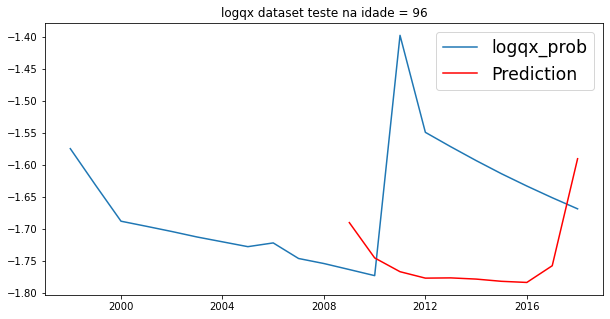

rmse:  [0.1842678]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0771 - mae: 0.2158
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0821 - mae: 0.2288
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0655 - mae: 0.1947
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0549 - mae: 0.1906
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0464 - mae: 0.1653
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0460 - mae: 0.1883
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0423 - mae: 0.1790
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0427 - mae: 0.1772
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0405 - mae: 0.1548
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0243 - mae: 0.1299
Epoch 11/500
1/1 [==============================] - 0s 1ms/s

1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0910
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0140 - mae: 0.0947
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mae: 0.1077
Epoch 91/500
1/1 [==============================] - 0s 987us/step - loss: 0.0107 - mae: 0.0938
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0219 - mae: 0.1315
Epoch 93/500
1/1 [==============================] - 0s 994us/step - loss: 0.0209 - mae: 0.1187
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0121 - mae: 0.0915
Epoch 95/500
1/1 [==============================] - 0s 856us/step - loss: 0.0154 - mae: 0.1003
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.1055
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0889
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.016

1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0767
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0928
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0171 - mae: 0.0924
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0481
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0109 - mae: 0.0873
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0757
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0179 - mae: 0.1092
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0794
Epoch 182/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0401
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0810
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0692
Epoch 261/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0810
Epoch 262/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0525
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0774
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0202 - mae: 0.1077
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0856
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0633
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0501
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0789
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0549
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0648
Epoch 348/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0218 - mae: 0.0901
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0789
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0478
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0689
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0577
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0514
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0619
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0628
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0800
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0442
Epoch 435/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0499
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0678
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0580
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0589
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0764
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0375
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0065 - mae: 0.0650
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0336
Epoch 443/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0430
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0

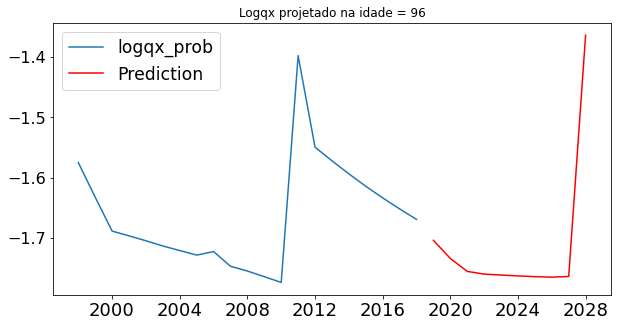

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2676 - mae: 0.3628
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2588 - mae: 0.3505
Epoch 3/500
1/1 [==============================] - 0s 6ms/step - loss: 0.2590 - mae: 0.3533
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2561 - mae: 0.3532
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2509 - mae: 0.3469
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2385 - mae: 0.3346
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2459 - mae: 0.3485
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2281 - mae: 0.3404
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2308 - mae: 0.3455
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2171 - mae: 0.3414
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2164 

1/1 [==============================] - 0s 2ms/step - loss: 0.1145 - mae: 0.2830
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1255 - mae: 0.3064
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1456 - mae: 0.3236
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1464 - mae: 0.3288
Epoch 93/500
1/1 [==============================] - 0s 14ms/step - loss: 0.1171 - mae: 0.2997
Epoch 94/500
1/1 [==============================] - 0s 955us/step - loss: 0.1518 - mae: 0.3297
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1244 - mae: 0.2867
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1305 - mae: 0.2943
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1086 - mae: 0.2678
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1204 - mae: 0.3013
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1189 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0652 - mae: 0.2075
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0849 - mae: 0.2143
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0799 - mae: 0.1870
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0661 - mae: 0.1709
Epoch 180/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0668 - mae: 0.1817
Epoch 181/500
1/1 [==============================] - 0s 925us/step - loss: 0.1230 - mae: 0.2783
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0570 - mae: 0.1949
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0619 - mae: 0.1843
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0802 - mae: 0.2049
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0603 - mae: 0.1554
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 947us/step - loss: 0.0653 - mae: 0.1528
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0729 - mae: 0.1750
Epoch 265/500
1/1 [==============================] - 0s 894us/step - loss: 0.0558 - mae: 0.1762
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0513 - mae: 0.1775
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0756 - mae: 0.1873
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0481 - mae: 0.1686
Epoch 269/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0784 - mae: 0.2050
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0417 - mae: 0.1289
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0490 - mae: 0.1607
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0620 - mae: 0.1877
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - lo

1/1 [==============================] - 0s 1ms/step - loss: 0.0427 - mae: 0.1674
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0691 - mae: 0.1762
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0367 - mae: 0.1319
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0481 - mae: 0.1897
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0460 - mae: 0.1606
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0352 - mae: 0.1435
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0526 - mae: 0.1705
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0250 - mae: 0.1136
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0390 - mae: 0.1310
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0811 - mae: 0.2179
Epoch 360/500
1/1 [==============================] - 0s 981us/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0200 - mae: 0.1076
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1377
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0372 - mae: 0.1382
Epoch 440/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0194 - mae: 0.1074
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0344 - mae: 0.1540
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0183 - mae: 0.1212
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0494 - mae: 0.1623
Epoch 444/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0404 - mae: 0.1542
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.1033
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0265 - mae: 0.1245
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 

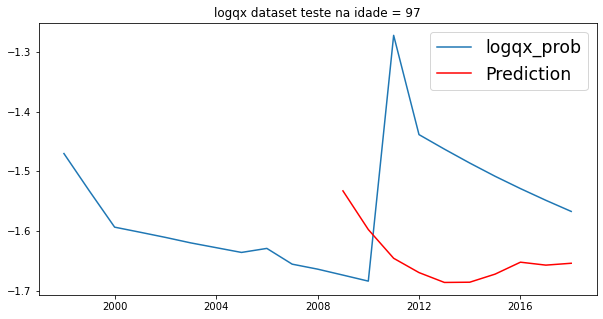

rmse:  [0.19273208]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0596 - mae: 0.2097
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0347 - mae: 0.1504
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0546 - mae: 0.2003
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0342 - mae: 0.1397
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0457 - mae: 0.1832
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0476 - mae: 0.1858
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0403 - mae: 0.1598
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0406 - mae: 0.1724
Epoch 9/500
1/1 [==============================] - 0s 957us/step - loss: 0.0280 - mae: 0.1471
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0269 - mae: 0.1418
Epoch 11/500
1/1 [==============================] - 0s 1m

1/1 [==============================] - 0s 3ms/step - loss: 0.0132 - mae: 0.0897
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0121 - mae: 0.0937
Epoch 90/500
1/1 [==============================] - 0s 928us/step - loss: 0.0103 - mae: 0.0752
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0436
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mae: 0.0786
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0455
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0652
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0688
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0779
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0584
Epoch 98/500
1/1 [==============================] - 0s 960us/step - loss: 0.0065 

1/1 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0432
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0322
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mae: 0.0585
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0355
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0602
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0071 - mae: 0.0678
Epoch 181/500
1/1 [==============================] - 0s 969us/step - loss: 0.0027 - mae: 0.0398
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0457
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0607
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0415
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0026 - mae: 0.0448
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0350
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0586
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0540
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0030 - mae: 0.0437
Epoch 266/500
1/1 [==============================] - 0s 803us/step - loss: 0.0021 - mae: 0.0371
Epoch 267/500
1/1 [==============================] - 0s 726us/step - loss: 0.0036 - mae: 0.0463
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0407
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0508
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0267
Epoch 271/500
1/1 [==============================] - 0s 6ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0495
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0504
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0294
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0539
Epoch 352/500
1/1 [==============================] - 0s 819us/step - loss: 0.0027 - mae: 0.0367
Epoch 353/500
1/1 [==============================] - 0s 755us/step - loss: 0.0017 - mae: 0.0295
Epoch 354/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0334
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0538
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0367
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0379
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0500
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0301
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0290
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0284
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7643e-04 - mae: 0.0207
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 7.5839e-04 - mae: 0.0218
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0293
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0286
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0490
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0425
Epoch 445/500
1/1 [==============================] - 0s 1ms/step -

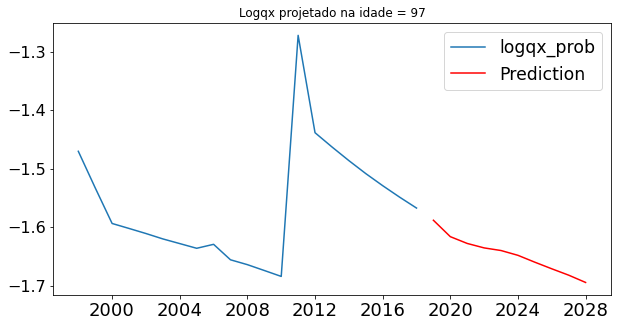

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2474 - mae: 0.3410
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2430 - mae: 0.3345
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2379 - mae: 0.3331
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2317 - mae: 0.3299
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2241 - mae: 0.3205
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2212 - mae: 0.3255
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2192 - mae: 0.3325
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2145 - mae: 0.3323
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1980 - mae: 0.3255
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1996 - mae: 0.3262
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1881 

1/1 [==============================] - 0s 1ms/step - loss: 0.1226 - mae: 0.2874
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1281 - mae: 0.2948
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1416 - mae: 0.3227
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1330 - mae: 0.2956
Epoch 93/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1262 - mae: 0.2967
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1368 - mae: 0.3049
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1219 - mae: 0.2838
Epoch 96/500
1/1 [==============================] - 0s 946us/step - loss: 0.1097 - mae: 0.2640
Epoch 97/500
1/1 [==============================] - 0s 6ms/step - loss: 0.1268 - mae: 0.2911
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1247 - mae: 0.2901
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1363 - 

1/1 [==============================] - 0s 2ms/step - loss: 0.0809 - mae: 0.2405
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0684 - mae: 0.2158
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0649 - mae: 0.1988
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0617 - mae: 0.1858
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0574 - mae: 0.1775
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0705 - mae: 0.1928
Epoch 182/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0927 - mae: 0.2064
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0892 - mae: 0.1938
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0536 - mae: 0.1582
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0597 - mae: 0.1716
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0372 - mae: 0.1472
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0385 - mae: 0.1462
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0582 - mae: 0.1945
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0459 - mae: 0.1573
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0419 - mae: 0.1684
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0505 - mae: 0.1626
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0551 - mae: 0.1599
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0518 - mae: 0.1618
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0393 - mae: 0.1489
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0355 - mae: 0.1401
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0925
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0350 - mae: 0.1330
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0378 - mae: 0.1286
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0348 - mae: 0.1417
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0141 - mae: 0.1034
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0179 - mae: 0.1231
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0238 - mae: 0.1369
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0194 - mae: 0.1059
Epoch 358/500
1/1 [==============================] - 0s 937us/step - loss: 0.0402 - mae: 0.1454
Epoch 359/500
1/1 [==============================] - 0s 958us/step - loss: 0.0112 - mae: 0.0752
Epoch 360/500
1/1 [==============================] - 0s 10ms/step - lo

1/1 [==============================] - 0s 4ms/step - loss: 0.0108 - mae: 0.0834
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0676
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0363 - mae: 0.1421
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0551
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0202 - mae: 0.1092
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0554
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0675
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0126 - mae: 0.0929
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0172 - mae: 0.1163
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0757
Epoch 447/500
1/1 [==============================] - 0s 5ms/step - loss: 0

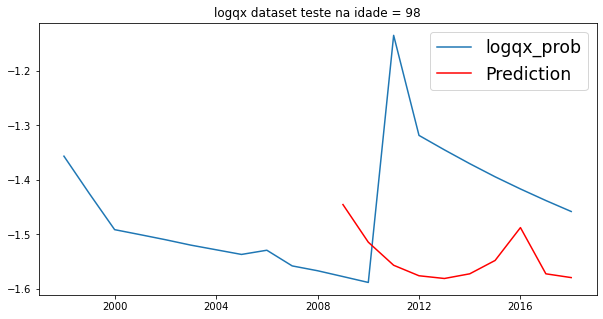

rmse:  [0.20626303]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0538 - mae: 0.1917
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0493 - mae: 0.1864
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0503 - mae: 0.1773
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0404 - mae: 0.1672
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0412 - mae: 0.1765
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0315 - mae: 0.1524
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0452 - mae: 0.1922
Epoch 8/500
1/1 [==============================] - 0s 992us/step - loss: 0.0277 - mae: 0.1386
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0225 - mae: 0.1300
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0282 - mae: 0.1506
Epoch 11/500
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0691
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0812
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0497
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.0851
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0168 - mae: 0.0954
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0722
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0065 - mae: 0.0611
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0555
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0572
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0439
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0121 - mae: 0.0846
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0614
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0666
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0621
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0358
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0583
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0591
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0640
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0643
Epoch 184/500
1/1 [==============================] - 0s 6ms/step - loss: 9.8437e-04 - mae: 0.0270
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0583
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0445
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0396
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0057 - mae: 0.0660
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0343
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0443
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0579
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 9.4812e-04 - mae: 0.0274
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0273
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0589
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - los

Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0575
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0424
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0343
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0454
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0537
Epoch 354/500
1/1 [==============================] - 0s 751us/step - loss: 0.0051 - mae: 0.0550
Epoch 355/500
1/1 [==============================] - 0s 917us/step - loss: 0.0060 - mae: 0.0470
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0120 - mae: 0.0627
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0350
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0571
Epoch 359/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0266
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0378
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0497
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0530
Epoch 439/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0032 - mae: 0.0447
Epoch 440/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0035 - mae: 0.0506
Epoch 441/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0308
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0090 - mae: 0.0516
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0391
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0447
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 

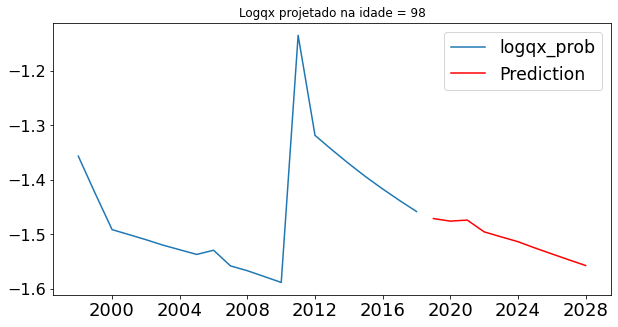

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2580 - mae: 0.3502
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2593 - mae: 0.3506
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2495 - mae: 0.3413
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2490 - mae: 0.3396
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2435 - mae: 0.3363
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2433 - mae: 0.3406
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2413 - mae: 0.3395
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2427 - mae: 0.3424
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2300 - mae: 0.3338
Epoch 10/500
1/1 [==============================] - 0s 17ms/step - loss: 0.2276 - mae: 0.3350
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2204

1/1 [==============================] - 0s 1ms/step - loss: 0.1330 - mae: 0.3130
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1464 - mae: 0.3564
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1504 - mae: 0.3583
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1231 - mae: 0.2911
Epoch 93/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1538 - mae: 0.3398
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1444 - mae: 0.3391
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1410 - mae: 0.3278
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1316 - mae: 0.3134
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1465 - mae: 0.3254
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1505 - mae: 0.3446
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1379 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0844 - mae: 0.2239
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1049 - mae: 0.2353
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0978 - mae: 0.2321
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0737 - mae: 0.2023
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0645 - mae: 0.2018
Epoch 181/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0963 - mae: 0.2489
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0785 - mae: 0.2355
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0867 - mae: 0.2287
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0749 - mae: 0.2194
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0726 - mae: 0.2236
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0535 - mae: 0.1457
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0607 - mae: 0.1731
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0641 - mae: 0.1836
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0528 - mae: 0.1573
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0549 - mae: 0.1663
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0717 - mae: 0.1913
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0617 - mae: 0.1628
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0852 - mae: 0.1825
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0681 - mae: 0.1864
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0682 - mae: 0.2010
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0811 - mae: 0.2080
Epoch 350/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0371 - mae: 0.1250
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0424 - mae: 0.1643
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0574 - mae: 0.1892
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0529 - mae: 0.1560
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0426 - mae: 0.1420
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0772 - mae: 0.1741
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0607 - mae: 0.1644
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0672 - mae: 0.1867
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0374 - mae: 0.1206
Epoch 359/500
1/1 [==============================] - 0s 14ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0573 - mae: 0.1553
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1191
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0331 - mae: 0.1426
Epoch 439/500
1/1 [==============================] - 0s 20ms/step - loss: 0.0234 - mae: 0.1089
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0349 - mae: 0.1467
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0553 - mae: 0.1730
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0447 - mae: 0.1542
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0450 - mae: 0.1682
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0520 - mae: 0.1457
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0511 - mae: 0.1380
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 

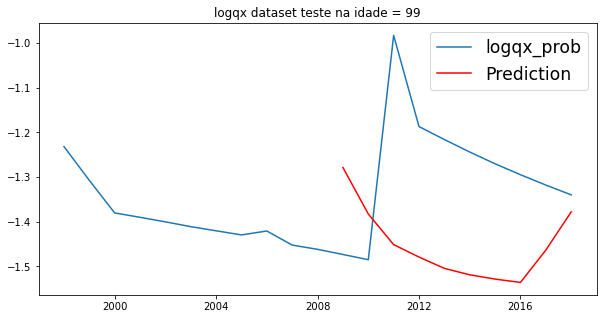

rmse:  [0.25690777]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0894 - mae: 0.2491
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0734 - mae: 0.2307
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0723 - mae: 0.2282
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0627 - mae: 0.1988
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0542 - mae: 0.1779
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0625 - mae: 0.2073
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0500 - mae: 0.1796
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0624 - mae: 0.2085
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0531 - mae: 0.1900
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0429 - mae: 0.1613
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0180 - mae: 0.1185
Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0221 - mae: 0.1282
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0212 - mae: 0.1232
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0230 - mae: 0.1292
Epoch 92/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0296 - mae: 0.1147
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0244 - mae: 0.1257
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0251 - mae: 0.1295
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0165 - mae: 0.1095
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0144 - mae: 0.1015
Epoch 97/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0171 - mae: 0.1110
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0164 - ma

Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1067
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0091 - mae: 0.0785
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0132 - mae: 0.0950
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0181 - mae: 0.1019
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0862
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1005
Epoch 181/500
1/1 [==============================] - 0s 993us/step - loss: 0.0094 - mae: 0.0725
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0771
Epoch 183/500
1/1 [==============================] - 0s 716us/step - loss: 0.0110 - mae: 0.0899
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0739
Epoch 185/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0583
Epoch 262/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0176 - mae: 0.0846
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0620
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0537
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0067 - mae: 0.0661
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0040 - mae: 0.0486
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0730
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0731
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0652
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0101 - mae: 0.0722
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0588
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0158 - mae: 0.0792
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0433
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0451
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0512
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0315
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0676
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0690
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0469
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0313
Epoch 358/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0029 - mae: 0.0418
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0385
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0520
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0625
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0342
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 6.7312e-04 - mae: 0.0245
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0673
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0648
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0474
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0544
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - los

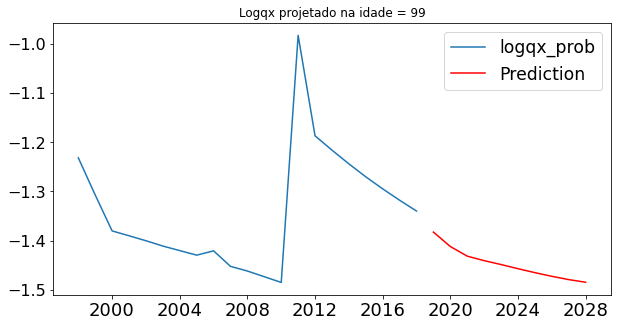

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - mae: 0.3669
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - mae: 0.3624
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2565 - mae: 0.3519
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2524 - mae: 0.3450
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2524 - mae: 0.3466
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2490 - mae: 0.3441
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2456 - mae: 0.3434
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2390 - mae: 0.3416
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2296 - mae: 0.3320
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2254 - mae: 0.3333
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2258 

1/1 [==============================] - 0s 1ms/step - loss: 0.1347 - mae: 0.3213
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1258 - mae: 0.2969
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1395 - mae: 0.3330
Epoch 92/500
1/1 [==============================] - 0s 11ms/step - loss: 0.1187 - mae: 0.2945
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1375 - mae: 0.3212
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1437 - mae: 0.3234
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1327 - mae: 0.3198
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1240 - mae: 0.2923
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1478 - mae: 0.3404
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1195 - mae: 0.2773
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1437 - m

1/1 [==============================] - 0s 1ms/step - loss: 0.0793 - mae: 0.2163
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0714 - mae: 0.1847
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0706 - mae: 0.1787
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0749 - mae: 0.1754
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0774 - mae: 0.1859
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0807 - mae: 0.1749
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0842 - mae: 0.1950
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0713 - mae: 0.2023
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0790 - mae: 0.2352
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0534 - mae: 0.1676
Epoch 186/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0614 - mae: 0.1657
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0326 - mae: 0.1514
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0830 - mae: 0.2479
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0610 - mae: 0.1894
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0382 - mae: 0.1432
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0450 - mae: 0.1417
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0440 - mae: 0.1505
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0402 - mae: 0.1401
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0364 - mae: 0.1353
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1416
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0196 - mae: 0.1060
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0309 - mae: 0.1409
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0118 - mae: 0.1011
Epoch 353/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0268 - mae: 0.1346
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0145 - mae: 0.0751
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0265 - mae: 0.1261
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0330 - mae: 0.1322
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0376 - mae: 0.1520
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0329 - mae: 0.1384
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0166 - mae: 0.1173
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0768
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mae: 0.1174
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0881
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0691
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0782
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - mae: 0.0801
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0702
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0906
Epoch 445/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0078 - mae: 0.0724
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0174 - mae: 0.1301
Epoch 447/500
1/1 [==============================] - 0s 5ms/step - loss: 

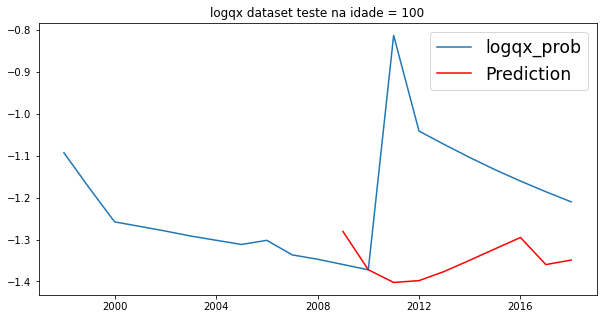

rmse:  [0.27150642]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0767 - mae: 0.2002
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0983 - mae: 0.2487
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0753 - mae: 0.2103
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0617 - mae: 0.1891
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0513 - mae: 0.1790
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0554 - mae: 0.1975
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0488 - mae: 0.1637
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0427 - mae: 0.1643
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0364 - mae: 0.1488
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0519 - mae: 0.1765
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0102 - mae: 0.0783
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0198 - mae: 0.0962
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0748
Epoch 91/500
1/1 [==============================] - 0s 957us/step - loss: 0.0118 - mae: 0.0841
Epoch 92/500
1/1 [==============================] - 0s 925us/step - loss: 0.0055 - mae: 0.0595
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0822
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0849
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0174 - mae: 0.0918
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0838
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0180 - mae: 0.1126
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 

1/1 [==============================] - 0s 2ms/step - loss: 0.0077 - mae: 0.0608
Epoch 176/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0532
Epoch 177/500
1/1 [==============================] - 0s 992us/step - loss: 0.0044 - mae: 0.0599
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0569
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0312
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0213 - mae: 0.0816
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0841
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0457
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0824
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0782
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0593
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0576
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0466
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0607
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0046 - mae: 0.0453
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0514
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0512
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0593
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0394
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0041 - mae: 0.0512
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 973us/step - loss: 0.0072 - mae: 0.0736
Epoch 349/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0392
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0635
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0288
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0359
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0571
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0609
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0027 - mae: 0.0378
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0037 - mae: 0.0432
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0606
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0595
Epoch 436/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mae: 0.0635
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0422
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0330
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0520
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0382
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mae: 0.0490
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0638
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0570
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0249
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0

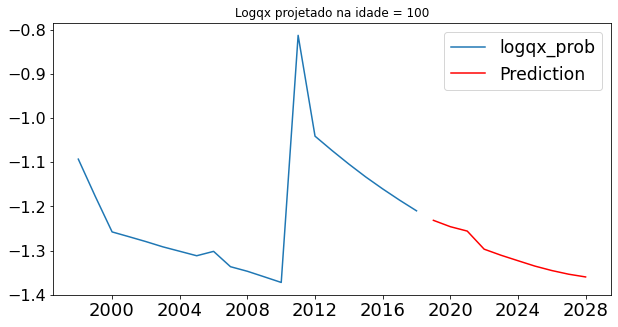

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2775 - mae: 0.3714
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2741 - mae: 0.3665
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2664 - mae: 0.3601
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2606 - mae: 0.3531
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2568 - mae: 0.3515
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2569 - mae: 0.3499
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2486 - mae: 0.3464
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2447 - mae: 0.3458
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2485 - mae: 0.3494
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2340 - mae: 0.3390
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2287 

1/1 [==============================] - 0s 1ms/step - loss: 0.1326 - mae: 0.3178
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1333 - mae: 0.3299
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1409 - mae: 0.3364
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1137 - mae: 0.2884
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1292 - mae: 0.3224
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1504 - mae: 0.3345
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1346 - mae: 0.3075
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1349 - mae: 0.3233
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1367 - mae: 0.3199
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1430 - mae: 0.3305
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1430 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.1227 - mae: 0.2992
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1118 - mae: 0.2577
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1021 - mae: 0.2676
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1327 - mae: 0.3198
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1330 - mae: 0.2920
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1101 - mae: 0.2628
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1270 - mae: 0.2848
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0996 - mae: 0.2582
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1008 - mae: 0.2619
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1052 - mae: 0.2501
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0546 - mae: 0.1714
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0800 - mae: 0.2121
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0984 - mae: 0.2401
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0613 - mae: 0.1753
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0579 - mae: 0.1604
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0722 - mae: 0.1565
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0542 - mae: 0.1500
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0735 - mae: 0.1995
Epoch 271/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0989 - mae: 0.2309
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0826 - mae: 0.2012
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0708 - mae: 0.1601
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0383 - mae: 0.1361
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0425 - mae: 0.1583
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0471 - mae: 0.1661
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0953 - mae: 0.2356
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0573 - mae: 0.1570
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0581 - mae: 0.1545
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0409 - mae: 0.1252
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0568 - mae: 0.1481
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0459 - mae: 0.1327
Epoch 360/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0504 - mae: 0.1420
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0520 - mae: 0.1681
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0643 - mae: 0.2002
Epoch 440/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0387 - mae: 0.1300
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0791 - mae: 0.2148
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0712 - mae: 0.1910
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0313 - mae: 0.1355
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0367 - mae: 0.1421
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0444 - mae: 0.1709
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0379 - mae: 0.1333
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

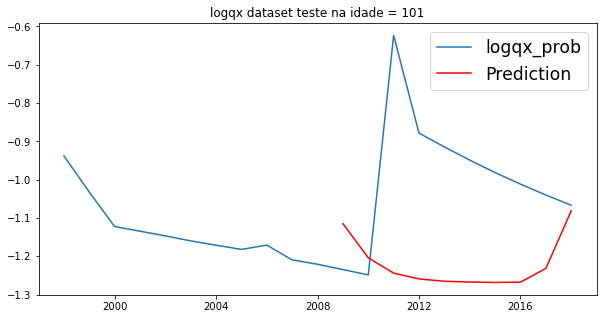

rmse:  [0.30918105]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1216 - mae: 0.2862
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0964 - mae: 0.2497
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0972 - mae: 0.2630
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0982 - mae: 0.2522
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0892 - mae: 0.2499
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0760 - mae: 0.2357
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0615 - mae: 0.1909
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0842 - mae: 0.2527
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0727 - mae: 0.2444
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0662 - mae: 0.2154
Epoch 11/500
1/1 [==============================] - 0s 7ms/

1/1 [==============================] - 0s 6ms/step - loss: 0.0244 - mae: 0.1166
Epoch 89/500
1/1 [==============================] - 0s 972us/step - loss: 0.0263 - mae: 0.1194
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0219 - mae: 0.1101
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0320 - mae: 0.1263
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0346 - mae: 0.1369
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0277 - mae: 0.1258
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0276 - mae: 0.1117
Epoch 95/500
1/1 [==============================] - 0s 21ms/step - loss: 0.0240 - mae: 0.1261
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0277 - mae: 0.1281
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0241 - mae: 0.0968
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0300 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.0869
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.0996
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0100 - mae: 0.0770
Epoch 178/500
1/1 [==============================] - 0s 745us/step - loss: 0.0165 - mae: 0.0861
Epoch 179/500
1/1 [==============================] - 0s 969us/step - loss: 0.0154 - mae: 0.0779
Epoch 180/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0111 - mae: 0.0797
Epoch 181/500
1/1 [==============================] - 0s 779us/step - loss: 0.0198 - mae: 0.0943
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0149 - mae: 0.0825
Epoch 183/500
1/1 [==============================] - 0s 739us/step - loss: 0.0158 - mae: 0.0842
Epoch 184/500
1/1 [==============================] - 0s 783us/step - loss: 0.0165 - mae: 0.0914
Epoch 185/500
1/1 [==============================] - 0s 763us/st

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0603
Epoch 262/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0164 - mae: 0.1104
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0574
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0096 - mae: 0.0825
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0813
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0679
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0115 - mae: 0.0872
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0151 - mae: 0.1017
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0092 - mae: 0.0761
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0466
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0062 - mae: 0.0613
Epoch 349/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0149 - mae: 0.0861
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.0862
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0592
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mae: 0.0592
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0075 - mae: 0.0735
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0707
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0622
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0794
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0144 - mae: 0.0721
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0059 - mae: 0.0642
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0667
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0035 - mae: 0.0472
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0031 - mae: 0.0381
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mae: 0.0794
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0056 - mae: 0.0580
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0035 - mae: 0.0411
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0524
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0602
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0031 - mae: 0.0425
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0

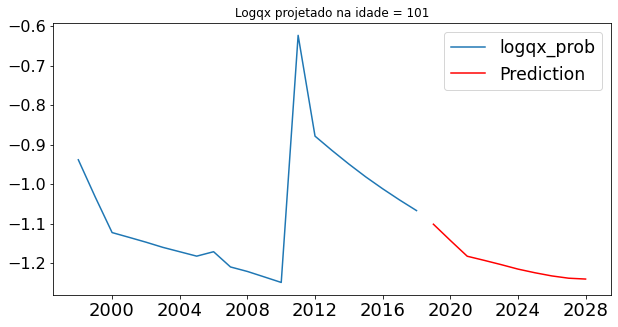

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2571 - mae: 0.3518
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2461 - mae: 0.3398
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2468 - mae: 0.3407
Epoch 4/500
1/1 [==============================] - 0s 6ms/step - loss: 0.2422 - mae: 0.3339
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2349 - mae: 0.3331
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2378 - mae: 0.3435
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2258 - mae: 0.3356
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2171 - mae: 0.3301
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2183 - mae: 0.3433
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1963 - mae: 0.3217
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2096 

1/1 [==============================] - 0s 1ms/step - loss: 0.1067 - mae: 0.2578
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0996 - mae: 0.2470
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1037 - mae: 0.2437
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1150 - mae: 0.2612
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0935 - mae: 0.2360
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1052 - mae: 0.2514
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1256 - mae: 0.2816
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1075 - mae: 0.2505
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1090 - mae: 0.2695
Epoch 98/500
1/1 [==============================] - 0s 6ms/step - loss: 0.1043 - mae: 0.2505
Epoch 99/500
1/1 [==============================] - 0s 993us/step - loss: 0.1033 - 

1/1 [==============================] - 0s 4ms/step - loss: 0.0477 - mae: 0.1438
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0679 - mae: 0.1719
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0555 - mae: 0.1626
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0629 - mae: 0.1874
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0539 - mae: 0.1796
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1174 - mae: 0.2505
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0590 - mae: 0.1848
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0467 - mae: 0.1493
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0577 - mae: 0.1792
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0574 - mae: 0.1529
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0391 - mae: 0.1470
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0535 - mae: 0.1798
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0355 - mae: 0.1392
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1604
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0347 - mae: 0.1486
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0519 - mae: 0.1662
Epoch 268/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0537 - mae: 0.1876
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0319 - mae: 0.1384
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0370 - mae: 0.1277
Epoch 271/500
1/1 [==============================] - 0s 749us/step - loss: 0.0531 - mae: 0.1513
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0201 - mae: 0.1056
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0332 - mae: 0.1143
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1069
Epoch 352/500
1/1 [==============================] - 0s 925us/step - loss: 0.0151 - mae: 0.0950
Epoch 353/500
1/1 [==============================] - 0s 964us/step - loss: 0.0223 - mae: 0.1311
Epoch 354/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0213 - mae: 0.1147
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0194 - mae: 0.1130
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0395 - mae: 0.1401
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0278 - mae: 0.1262
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0375 - mae: 0.1612
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0148 - mae: 0.0981
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0541
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1011
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0684
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0917
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0068 - mae: 0.0586
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0144 - mae: 0.0907
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0792
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0974
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0090 - mae: 0.0723
Epoch 446/500
1/1 [==============================] - 0s 8ms/step - loss: 0

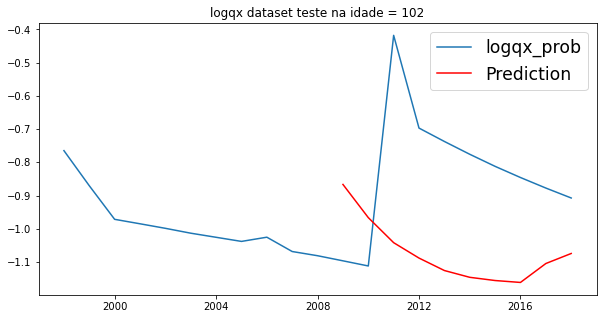

rmse:  [0.34674198]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0547 - mae: 0.1853
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1649
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0468 - mae: 0.1848
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0423 - mae: 0.1605
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0324 - mae: 0.1388
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0404 - mae: 0.1638
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0413 - mae: 0.1553
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0226 - mae: 0.1217
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0334 - mae: 0.1395
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0328 - mae: 0.1496
Epoch 11/500
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1032
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mae: 0.0872
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0109 - mae: 0.0907
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.1008
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0115 - mae: 0.0948
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0893
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0918
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0089 - mae: 0.0838
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0097 - mae: 0.0899
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0096 - mae: 0.0814
Epoch 98/500
1/1 [==============================] - 0s 797us/step - loss: 0.0103 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mae: 0.0864
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0548
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0715
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0114 - mae: 0.0912
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0044 - mae: 0.0551
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0804
Epoch 181/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0656
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0097 - mae: 0.0860
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0488
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0739
Epoch 185/500
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0044 - mae: 0.0558
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0473
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0383
Epoch 265/500
1/1 [==============================] - 0s 954us/step - loss: 0.0033 - mae: 0.0468
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0536
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0701
Epoch 268/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0477
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0598
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0488
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0534
Epoch 272/500
1/1 [==============================] - 0s 2ms/step - loss:

1/1 [==============================] - 0s 910us/step - loss: 0.0061 - mae: 0.0591
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0590
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0411
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0490
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mae: 0.0588
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0386
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0544
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0377
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0036 - mae: 0.0463
Epoch 358/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.0740
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0273
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0454
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0413
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0331
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0462
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0378
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0457
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0027 - mae: 0.0409
Epoch 444/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0372
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0533
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

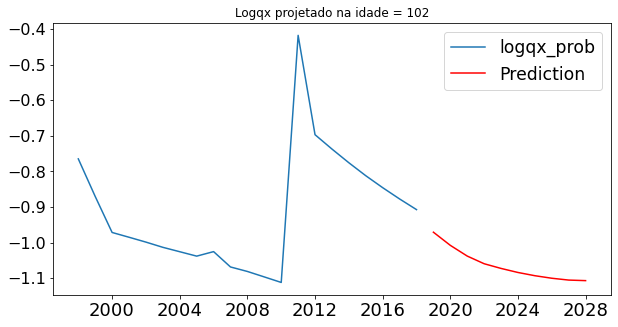

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - mae: 0.3599
Epoch 2/500
1/1 [==============================] - 0s 6ms/step - loss: 0.2561 - mae: 0.3493
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2548 - mae: 0.3465
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2537 - mae: 0.3468
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2482 - mae: 0.3449
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2356 - mae: 0.3385
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2240 - mae: 0.3296
Epoch 8/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2252 - mae: 0.3345
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2165 - mae: 0.3275
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.2175 - mae: 0.3375
Epoch 11/500
1/1 [==============================] - 0s 2ms/step - loss: 0.2230 

1/1 [==============================] - 0s 2ms/step - loss: 0.1172 - mae: 0.2770
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1183 - mae: 0.2783
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1106 - mae: 0.2735
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1230 - mae: 0.2882
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1222 - mae: 0.2875
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1084 - mae: 0.2527
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1190 - mae: 0.3033
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1112 - mae: 0.2663
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1340 - mae: 0.2827
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1076 - mae: 0.2623
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1047 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0778 - mae: 0.1800
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0507 - mae: 0.1544
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0590 - mae: 0.1814
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0760 - mae: 0.1926
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0654 - mae: 0.1744
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0644 - mae: 0.1918
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0612 - mae: 0.1908
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0589 - mae: 0.1927
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0594 - mae: 0.1411
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0618 - mae: 0.1774
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0483 - mae: 0.1527
Epoch 263/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0362 - mae: 0.1379
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0555 - mae: 0.1588
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0576 - mae: 0.1946
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0369 - mae: 0.1539
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0413 - mae: 0.1771
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0412 - mae: 0.1531
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0435 - mae: 0.1420
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0500 - mae: 0.1548
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0326 - mae: 0.1513
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0232 - mae: 0.1242
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0092 - mae: 0.0837
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0220 - mae: 0.1180
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0888
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0283 - mae: 0.1387
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0160 - mae: 0.1131
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0511 - mae: 0.1720
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0174 - mae: 0.1094
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0205 - mae: 0.1189
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0149 - mae: 0.1138
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0114 - mae: 0.0880
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0170 - mae: 0.1052
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mae: 0.1065
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mae: 0.0725
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0539
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0629
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0590
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0296 - mae: 0.0984
Epoch 444/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0248 - mae: 0.1083
Epoch 445/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0147 - mae: 0.0974
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0

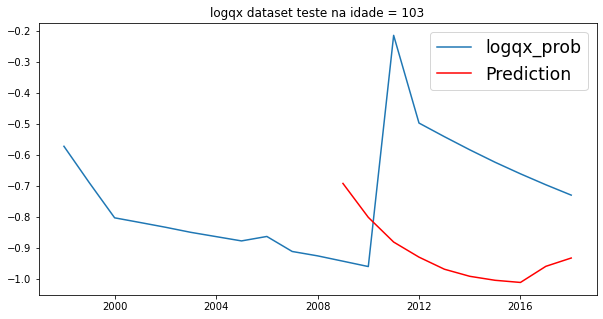

rmse:  [0.38027215]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1409
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0457 - mae: 0.1687
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0503 - mae: 0.1820
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0501 - mae: 0.1686
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0500 - mae: 0.1802
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0339 - mae: 0.1390
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0418 - mae: 0.1641
Epoch 8/500
1/1 [==============================] - 0s 771us/step - loss: 0.0348 - mae: 0.1431
Epoch 9/500
1/1 [==============================] - 0s 812us/step - loss: 0.0322 - mae: 0.1407
Epoch 10/500
1/1 [==============================] - 0s 825us/step - loss: 0.0326 - mae: 0.1561
Epoch 11/500
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0960
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0928
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.1031
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mae: 0.0892
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0110 - mae: 0.0914
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0923
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0119 - mae: 0.0913
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0082 - mae: 0.0790
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0145 - mae: 0.1071
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0899
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0629
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0185 - mae: 0.0930
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0706
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0088 - mae: 0.0645
Epoch 179/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0141 - mae: 0.1005
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0088 - mae: 0.0742
Epoch 181/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0033 - mae: 0.0411
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0122 - mae: 0.0897
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0689
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0525
Epoch 185/500
1/1 [==============================] - 0s 12ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0642
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0632
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0515
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0521
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0521
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0715
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0539
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0490
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0338
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0543
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0488
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0624
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mae: 0.0554
Epoch 352/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0351
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 9.5519e-04 - mae: 0.0250
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0343
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0533
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0632
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0028 - mae: 0.0385
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0060 - mae: 0.0540
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0021 - mae: 0.0363
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0539
Epoch 438/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0018 - mae: 0.0391
Epoch 439/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0481
Epoch 440/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0051 - mae: 0.0574
Epoch 441/500
1/1 [==============================] - 0s 930us/step - loss: 0.0087 - mae: 0.0722
Epoch 442/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0424
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0473
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0554
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0069 - mae: 0.0544
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - los

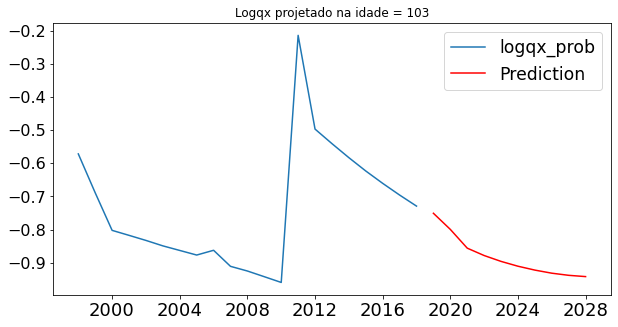

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3119 - mae: 0.3985
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3056 - mae: 0.3926
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2927 - mae: 0.3807
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2933 - mae: 0.3846
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2873 - mae: 0.3790
Epoch 6/500
1/1 [==============================] - 0s 989us/step - loss: 0.2784 - mae: 0.3720
Epoch 7/500
1/1 [==============================] - 0s 969us/step - loss: 0.2829 - mae: 0.3750
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2746 - mae: 0.3717
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2735 - mae: 0.3705
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2651 - mae: 0.3693
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2

Epoch 89/500
1/1 [==============================] - 0s 15ms/step - loss: 0.1522 - mae: 0.3509
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1427 - mae: 0.3358
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1610 - mae: 0.3759
Epoch 92/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1403 - mae: 0.3487
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1419 - mae: 0.3383
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1707 - mae: 0.3716
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1604 - mae: 0.3574
Epoch 96/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1509 - mae: 0.3649
Epoch 97/500
1/1 [==============================] - 0s 705us/step - loss: 0.1529 - mae: 0.3594
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1447 - mae: 0.3434
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - l

1/1 [==============================] - 0s 1ms/step - loss: 0.1113 - mae: 0.2650
Epoch 177/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1242 - mae: 0.2934
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1186 - mae: 0.2975
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1082 - mae: 0.2714
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1182 - mae: 0.2843
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1353 - mae: 0.3115
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1111 - mae: 0.2895
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1104 - mae: 0.2557
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1041 - mae: 0.2467
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1162 - mae: 0.2899
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0650 - mae: 0.1940
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0536 - mae: 0.1968
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0649 - mae: 0.1855
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0626 - mae: 0.1564
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0782 - mae: 0.1893
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0787 - mae: 0.1917
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0629 - mae: 0.1958
Epoch 270/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0756 - mae: 0.2020
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0614 - mae: 0.1811
Epoch 272/500
1/1 [==============================] - 0s 920us/step - loss: 0.0611 - mae: 0.1751
Epoch 273/500
1/1 [==============================] - 0s 960us/step - los

1/1 [==============================] - 0s 2ms/step - loss: 0.0480 - mae: 0.1526
Epoch 351/500
1/1 [==============================] - 0s 926us/step - loss: 0.0405 - mae: 0.1644
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0584 - mae: 0.1870
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0499 - mae: 0.1785
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0642 - mae: 0.1887
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0472 - mae: 0.1549
Epoch 356/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0565 - mae: 0.1552
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0384 - mae: 0.1352
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0498 - mae: 0.1677
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0269 - mae: 0.1154
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 6ms/step - loss: 0.0190 - mae: 0.0964
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0162 - mae: 0.1126
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0174 - mae: 0.0989
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0221 - mae: 0.1274
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0136 - mae: 0.0951
Epoch 442/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0378 - mae: 0.1612
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0310 - mae: 0.1398
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0255 - mae: 0.1411
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0706
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0117 - mae: 0.0967
Epoch 447/500
1/1 [==============================] - 0s 14ms/step - loss: 

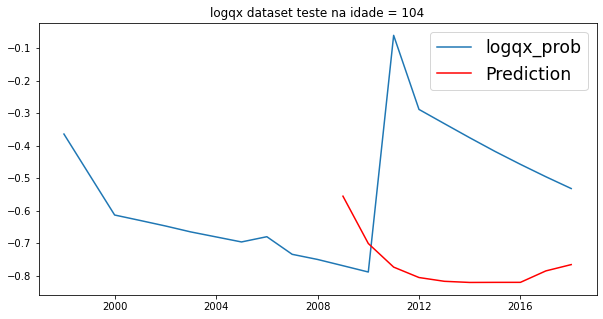

rmse:  [0.41157907]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0962 - mae: 0.2566
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0841 - mae: 0.2333
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0635 - mae: 0.1905
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0775 - mae: 0.2213
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0660 - mae: 0.2072
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0567 - mae: 0.1932
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0483 - mae: 0.1831
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0609 - mae: 0.2117
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0411 - mae: 0.1731
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0455 - mae: 0.1865
Epoch 11/500
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0263 - mae: 0.1314
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0218 - mae: 0.1242
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0154 - mae: 0.0969
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0186 - mae: 0.1204
Epoch 92/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0223 - mae: 0.1177
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mae: 0.1067
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0229 - mae: 0.1383
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0991
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0192 - mae: 0.1248
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0171 - mae: 0.1090
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0105 - mae: 0.0805
Epoch 176/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0157 - mae: 0.1059
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0175 - mae: 0.1074
Epoch 178/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0127 - mae: 0.0967
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0918
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0168 - mae: 0.1173
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0294 - mae: 0.1481
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.1079
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0131 - mae: 0.1023
Epoch 184/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0160 - mae: 0.0990
Epoch 185/500
1/1 [==============================] - 0s 928us/step - loss

1/1 [==============================] - 0s 2ms/step - loss: 0.0122 - mae: 0.0781
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0807
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0134 - mae: 0.0935
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0945
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0092 - mae: 0.0738
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0582
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0123 - mae: 0.0915
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0140 - mae: 0.0982
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0617
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0142 - mae: 0.0948
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0074 - mae: 0.0775
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mae: 0.0657
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0717
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0079 - mae: 0.0662
Epoch 353/500
1/1 [==============================] - 0s 915us/step - loss: 0.0038 - mae: 0.0474
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0181 - mae: 0.1066
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mae: 0.0525
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mae: 0.0578
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0074 - mae: 0.0627
Epoch 358/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0161 - mae: 0.0916
Epoch 359/500
1/1 [==============================] - 0s 756us/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.0161 - mae: 0.0898
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0612
Epoch 438/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0077 - mae: 0.0686
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0746
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0117 - mae: 0.0765
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0042 - mae: 0.0481
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0035 - mae: 0.0492
Epoch 443/500
1/1 [==============================] - 0s 880us/step - loss: 0.0050 - mae: 0.0591
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0051 - mae: 0.0543
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0533
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss

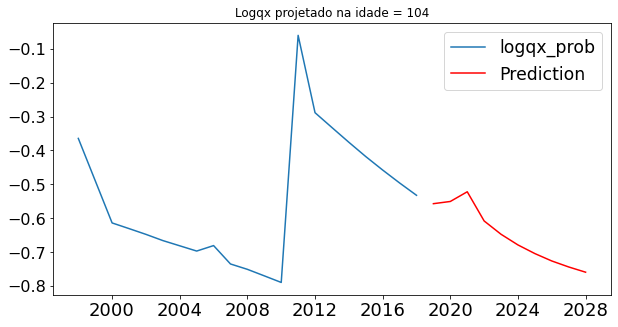

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.3506 - mae: 0.4319
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3523 - mae: 0.4305
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3301 - mae: 0.4155
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3329 - mae: 0.4183
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3104 - mae: 0.4028
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3040 - mae: 0.4103
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.3001 - mae: 0.4048
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3053 - mae: 0.4178
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2969 - mae: 0.4168
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2798 - mae: 0.4121
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2848 

1/1 [==============================] - 0s 3ms/step - loss: 0.1465 - mae: 0.3529
Epoch 90/500
1/1 [==============================] - 0s 6ms/step - loss: 0.1590 - mae: 0.3565
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1374 - mae: 0.3493
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1550 - mae: 0.3687
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1402 - mae: 0.3445
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1331 - mae: 0.3418
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1611 - mae: 0.3695
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1436 - mae: 0.3536
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1692 - mae: 0.3865
Epoch 98/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1274 - mae: 0.3136
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1285 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2406
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0564 - mae: 0.1640
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0711 - mae: 0.1929
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0681 - mae: 0.1824
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0494 - mae: 0.1548
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0657 - mae: 0.2045
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0653 - mae: 0.2010
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0858 - mae: 0.2151
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0910 - mae: 0.2443
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0711 - mae: 0.2046
Epoch 186/500
1/1 [==============================] - 0s 14ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0667 - mae: 0.2049
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0604 - mae: 0.1833
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0415 - mae: 0.1508
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0536 - mae: 0.1696
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0518 - mae: 0.1619
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0475 - mae: 0.1625
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0588 - mae: 0.1634
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0562 - mae: 0.1729
Epoch 270/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0575 - mae: 0.1873
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0561 - mae: 0.2009
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0446 - mae: 0.1273
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0671 - mae: 0.1870
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0559 - mae: 0.1728
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0450 - mae: 0.1541
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0334 - mae: 0.1413
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0340 - mae: 0.1394
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0717 - mae: 0.2171
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0582 - mae: 0.2038
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0598 - mae: 0.1797
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0358 - mae: 0.1227
Epoch 359/500
1/1 [==============================] - 0s 991us/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0450 - mae: 0.1691
Epoch 437/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0533 - mae: 0.1677
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0304 - mae: 0.1319
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0423 - mae: 0.1584
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0430 - mae: 0.1403
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0411 - mae: 0.1522
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0328 - mae: 0.1211
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0314 - mae: 0.1518
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0501 - mae: 0.1693
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0595 - mae: 0.1973
Epoch 446/500
1/1 [==============================] - 0s 2ms/step - loss: 0

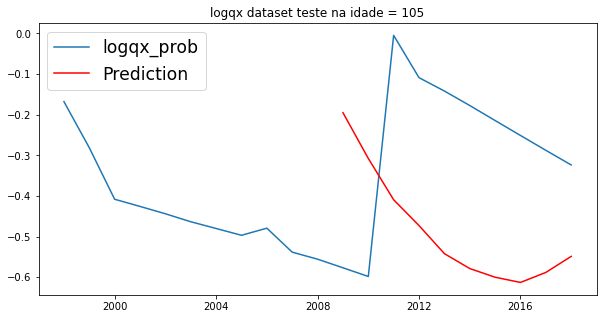

rmse:  [0.35606962]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0346 - mae: 0.1560
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0549 - mae: 0.1853
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0549 - mae: 0.1934
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0515 - mae: 0.1788
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0492 - mae: 0.1795
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0446 - mae: 0.1733
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0510 - mae: 0.1940
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0477 - mae: 0.1797
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0394 - mae: 0.1502
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0438 - mae: 0.1749
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 4ms/step - loss: 0.0270 - mae: 0.1392
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1553
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0213 - mae: 0.1205
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1323
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0218 - mae: 0.1199
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0219 - mae: 0.1271
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0227 - mae: 0.1278
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - mae: 0.1207
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0225 - mae: 0.1151
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0260 - mae: 0.1305
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0204 - ma

1/1 [==============================] - 0s 3ms/step - loss: 0.0106 - mae: 0.0827
Epoch 175/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0186 - mae: 0.1050
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0204 - mae: 0.0999
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1201
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0169 - mae: 0.0991
Epoch 179/500
1/1 [==============================] - 0s 737us/step - loss: 0.0227 - mae: 0.1234
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0148 - mae: 0.0954
Epoch 181/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0109 - mae: 0.0803
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0297 - mae: 0.1129
Epoch 183/500
1/1 [==============================] - 0s 995us/step - loss: 0.0152 - mae: 0.0974
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - los

1/1 [==============================] - 0s 4ms/step - loss: 0.0121 - mae: 0.0783
Epoch 262/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0836
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0116 - mae: 0.0859
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0837
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0782
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0161 - mae: 0.0935
Epoch 267/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0127 - mae: 0.0828
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0672
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0840
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0237 - mae: 0.1131
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0831
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0123 - mae: 0.0898
Epoch 350/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0150 - mae: 0.0853
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.1013
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0067 - mae: 0.0698
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0758
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0701
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0094 - mae: 0.0678
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0124 - mae: 0.0895
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0160 - mae: 0.0885
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0089 - mae: 0.0731
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0564
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0634
Epoch 438/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0109 - mae: 0.0735
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0803
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0728
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0104 - mae: 0.0887
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0097 - mae: 0.0798
Epoch 443/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0095 - mae: 0.0779
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0591
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0

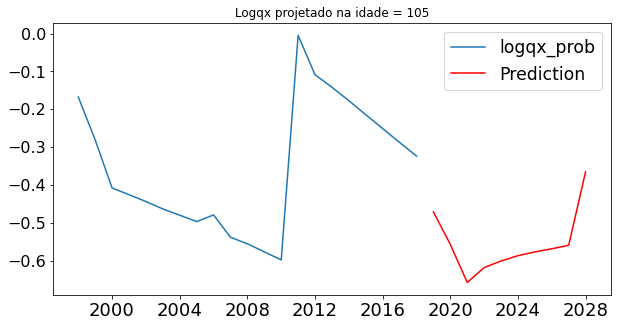

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.4221 - mae: 0.4807
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4110 - mae: 0.4722
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3988 - mae: 0.4607
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4147 - mae: 0.4694
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3795 - mae: 0.4528
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3787 - mae: 0.4519
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.3803 - mae: 0.4555
Epoch 8/500
1/1 [==============================] - 0s 5ms/step - loss: 0.3660 - mae: 0.4487
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3517 - mae: 0.4432
Epoch 10/500
1/1 [==============================] - 0s 17ms/step - loss: 0.3322 - mae: 0.4388
Epoch 11/500
1/1 [==============================] - 0s 952us/step - loss: 0.36

1/1 [==============================] - 0s 4ms/step - loss: 0.1794 - mae: 0.4100
Epoch 90/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1552 - mae: 0.3758
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1791 - mae: 0.4073
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1367 - mae: 0.3561
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1249 - mae: 0.3319
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1315 - mae: 0.3514
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1172 - mae: 0.3302
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1329 - mae: 0.3360
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1143 - mae: 0.3273
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1432 - mae: 0.3366
Epoch 99/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1427 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0570 - mae: 0.2052
Epoch 177/500
1/1 [==============================] - 0s 964us/step - loss: 0.0596 - mae: 0.2151
Epoch 178/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0852 - mae: 0.2216
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0538 - mae: 0.1809
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0526 - mae: 0.1714
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0407 - mae: 0.1530
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0508 - mae: 0.1562
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0632 - mae: 0.2075
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0540 - mae: 0.2059
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0744 - mae: 0.2018
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss

1/1 [==============================] - 0s 3ms/step - loss: 0.0773 - mae: 0.2132
Epoch 264/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0491 - mae: 0.1656
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0502 - mae: 0.1860
Epoch 266/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0311 - mae: 0.1385
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0413 - mae: 0.1575
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0591 - mae: 0.1839
Epoch 269/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0610 - mae: 0.1857
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0350 - mae: 0.1300
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0655 - mae: 0.1802
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0431 - mae: 0.1744
Epoch 273/500
1/1 [==============================] - 0s 3ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0310 - mae: 0.1216
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0241 - mae: 0.1295
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0435 - mae: 0.1503
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0473 - mae: 0.1782
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0354 - mae: 0.1570
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1671
Epoch 356/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0504 - mae: 0.1751
Epoch 357/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0419 - mae: 0.1655
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0324 - mae: 0.1374
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0315 - mae: 0.1296
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0338 - mae: 0.1409
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0266 - mae: 0.1298
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0331 - mae: 0.1422
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0335 - mae: 0.1314
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0473 - mae: 0.1610
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0416 - mae: 0.1681
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0431 - mae: 0.1560
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0307 - mae: 0.1304
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0448 - mae: 0.1667
Epoch 446/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0342 - mae: 0.1339
Epoch 447/500
1/1 [==============================] - 0s 946us/step - loss:

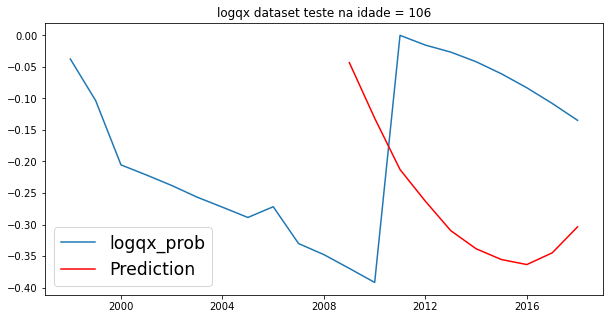

rmse:  [0.26433882]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0681 - mae: 0.2005
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0601 - mae: 0.1922
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0411 - mae: 0.1702
Epoch 4/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0625 - mae: 0.1942
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0720 - mae: 0.2160
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0767 - mae: 0.2351
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0551 - mae: 0.1881
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0490 - mae: 0.1897
Epoch 9/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0675 - mae: 0.2298
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0318 - mae: 0.1419
Epoch 11/500
1/1 [==============================] - 0s 3ms/

Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0327 - mae: 0.1519
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0371 - mae: 0.1605
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0302 - mae: 0.1538
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0304 - mae: 0.1452
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0197 - mae: 0.1003
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0255 - mae: 0.1190
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0276 - mae: 0.1267
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0279 - mae: 0.1277
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0321 - mae: 0.1384
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0284 - mae: 0.1361
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss

1/1 [==============================] - 0s 4ms/step - loss: 0.0362 - mae: 0.1655
Epoch 177/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0320 - mae: 0.1602
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0260 - mae: 0.1361
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0300 - mae: 0.1438
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0268 - mae: 0.1095
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1425
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0243 - mae: 0.1315
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0365 - mae: 0.1398
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0297 - mae: 0.1164
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0322 - mae: 0.1514
Epoch 186/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0214 - mae: 0.1120
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0300 - mae: 0.1310
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0169 - mae: 0.0991
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0177 - mae: 0.1051
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0230 - mae: 0.0987
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0264 - mae: 0.1354
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0192 - mae: 0.1000
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mae: 0.0973
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0207 - mae: 0.1162
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0155 - mae: 0.0998
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0167 - mae: 0.1009
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mae: 0.0906
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0134 - mae: 0.0886
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0108 - mae: 0.0851
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mae: 0.0814
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0774
Epoch 356/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0080 - mae: 0.0801
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0081 - mae: 0.0731
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0589
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0769
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 1ms/step - loss: 0.0083 - mae: 0.0696
Epoch 438/500
1/1 [==============================] - 0s 948us/step - loss: 0.0060 - mae: 0.0594
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0106 - mae: 0.0896
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0768
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mae: 0.0821
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0056 - mae: 0.0592
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0080 - mae: 0.0676
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0619
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.0832
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0113 - mae: 0.0741
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss:

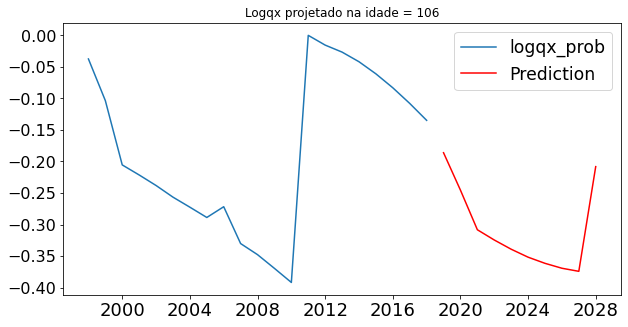

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.5468 - mae: 0.5762
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.5018 - mae: 0.5481
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.5183 - mae: 0.5552
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.5093 - mae: 0.5577
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4772 - mae: 0.5262
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4813 - mae: 0.5256
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.4621 - mae: 0.5105
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.4420 - mae: 0.5136
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4323 - mae: 0.4959
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.4205 - mae: 0.4949
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4188 

1/1 [==============================] - 0s 1ms/step - loss: 0.2228 - mae: 0.4670
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1990 - mae: 0.4345
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2040 - mae: 0.4469
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2256 - mae: 0.4698
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2252 - mae: 0.4686
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2324 - mae: 0.4730
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2079 - mae: 0.4480
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2231 - mae: 0.4682
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2500 - mae: 0.4844
Epoch 98/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2117 - mae: 0.4522
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2085 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0927 - mae: 0.2367
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0772 - mae: 0.2554
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0853 - mae: 0.2156
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0851 - mae: 0.2513
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0294 - mae: 0.1378
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0829 - mae: 0.2256
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0620 - mae: 0.1981
Epoch 183/500
1/1 [==============================] - 0s 898us/step - loss: 0.0632 - mae: 0.2007
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0753 - mae: 0.2212
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0801 - mae: 0.2517
Epoch 186/500
1/1 [==============================] - 0s 738us/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0334 - mae: 0.1407
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0733 - mae: 0.2081
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0479 - mae: 0.1756
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0278 - mae: 0.1360
Epoch 267/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0605 - mae: 0.2049
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0499 - mae: 0.1824
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0773 - mae: 0.2410
Epoch 270/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0652 - mae: 0.1767
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0705 - mae: 0.2224
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0721 - mae: 0.2103
Epoch 273/500
1/1 [==============================] - 0s 5ms/step - loss: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0687 - mae: 0.2182
Epoch 351/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0526 - mae: 0.1701
Epoch 352/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0561 - mae: 0.1684
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0691 - mae: 0.2130
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0341 - mae: 0.1638
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0614 - mae: 0.2140
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0403 - mae: 0.1524
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0532 - mae: 0.1691
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0745 - mae: 0.2187
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1075
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0418 - mae: 0.1647
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0371 - mae: 0.1492
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0470 - mae: 0.1781
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0468 - mae: 0.1712
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0289 - mae: 0.1355
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0611 - mae: 0.1847
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0334 - mae: 0.1728
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0269 - mae: 0.1413
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0319 - mae: 0.1398
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0327 - mae: 0.1398
Epoch 447/500
1/1 [==============================] - 0s 1ms/step - loss: 0

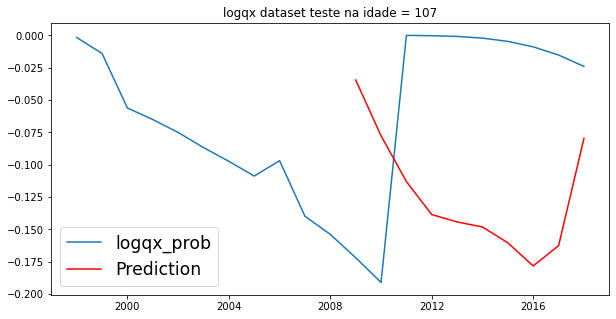

rmse:  [0.13542404]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1613 - mae: 0.3112
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1483 - mae: 0.2929
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0900 - mae: 0.2376
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0877 - mae: 0.2633
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0434 - mae: 0.1662
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0790 - mae: 0.2095
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1292 - mae: 0.2893
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1298 - mae: 0.3057
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1264 - mae: 0.2967
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1066 - mae: 0.2365
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 3ms/step - loss: 0.0283 - mae: 0.1304
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0364 - mae: 0.1580
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0247 - mae: 0.1443
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0269 - mae: 0.1282
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0398 - mae: 0.1612
Epoch 93/500
1/1 [==============================] - 0s 823us/step - loss: 0.0268 - mae: 0.1250
Epoch 94/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0381 - mae: 0.1598
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0295 - mae: 0.1406
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0260 - mae: 0.1281
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0242 - mae: 0.1179
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0264 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.0291 - mae: 0.1340
Epoch 175/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0232 - mae: 0.1211
Epoch 176/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0213 - mae: 0.1270
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0328 - mae: 0.1430
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0151 - mae: 0.1023
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0126 - mae: 0.0919
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1258
Epoch 181/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0405 - mae: 0.1635
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0217 - mae: 0.1295
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0178 - mae: 0.1107
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mae: 0.0929
Epoch 262/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0130 - mae: 0.0919
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0216 - mae: 0.1293
Epoch 264/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0106 - mae: 0.0727
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0151 - mae: 0.0958
Epoch 266/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0245 - mae: 0.1348
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0961
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0315 - mae: 0.1420
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0118 - mae: 0.0906
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0147 - mae: 0.1040
Epoch 271/500
1/1 [==============================] - 0s 776us/step - loss:

1/1 [==============================] - 0s 2ms/step - loss: 0.0227 - mae: 0.1259
Epoch 349/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0125 - mae: 0.0897
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1280
Epoch 351/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0103 - mae: 0.0828
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0167 - mae: 0.1182
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0332 - mae: 0.1423
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0162 - mae: 0.1035
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0210 - mae: 0.1322
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mae: 0.0653
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0143 - mae: 0.1035
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 

1/1 [==============================] - 0s 3ms/step - loss: 0.0093 - mae: 0.0839
Epoch 436/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0043 - mae: 0.0480
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0137 - mae: 0.1060
Epoch 438/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0680
Epoch 439/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0181 - mae: 0.1200
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0768
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0107 - mae: 0.0855
Epoch 442/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0165 - mae: 0.1097
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0293 - mae: 0.1416
Epoch 444/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0212 - mae: 0.1224
Epoch 445/500
1/1 [==============================] - 0s 4ms/step - loss: 0

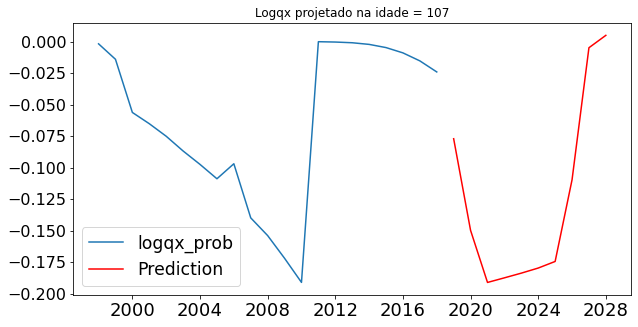

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.5289 - mae: 0.5925
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.5042 - mae: 0.5722
Epoch 3/500
1/1 [==============================] - 0s 4ms/step - loss: 0.4685 - mae: 0.5491
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.4764 - mae: 0.5681
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4691 - mae: 0.5552
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4232 - mae: 0.5271
Epoch 7/500
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - mae: 0.5376
Epoch 8/500
1/1 [==============================] - 0s 916us/step - loss: 0.4116 - mae: 0.5119
Epoch 9/500
1/1 [==============================] - 0s 769us/step - loss: 0.3855 - mae: 0.5023
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.3917 - mae: 0.4972
Epoch 11/500
1/1 [==============================] - 0s 3ms/step - loss: 0.4

Epoch 89/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1133 - mae: 0.3316
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1411 - mae: 0.3573
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1169 - mae: 0.3126
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1376 - mae: 0.3265
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1096 - mae: 0.3139
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1399 - mae: 0.3320
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1528 - mae: 0.3614
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1199 - mae: 0.3220
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1465 - mae: 0.3483
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1304 - mae: 0.3157
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0667 - mae: 0.2178
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0817 - mae: 0.2143
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0891 - mae: 0.2424
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0769 - mae: 0.2428
Epoch 180/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0815 - mae: 0.2161
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0696 - mae: 0.1996
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0577 - mae: 0.2049
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1006 - mae: 0.2870
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0595 - mae: 0.2106
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0616 - mae: 0.1847
Epoch 186/500
1/1 [==============================] - 0s 968us/step - loss:

1/1 [==============================] - 0s 746us/step - loss: 0.0551 - mae: 0.1944
Epoch 264/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0888 - mae: 0.2521
Epoch 265/500
1/1 [==============================] - 0s 712us/step - loss: 0.0700 - mae: 0.1895
Epoch 266/500
1/1 [==============================] - 0s 715us/step - loss: 0.0528 - mae: 0.1711
Epoch 267/500
1/1 [==============================] - 0s 750us/step - loss: 0.0664 - mae: 0.2289
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0602 - mae: 0.1925
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0796 - mae: 0.2383
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0670 - mae: 0.2240
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0431 - mae: 0.1833
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0678 - mae: 0.2177
Epoch 273/500
1/1 [==============================] - 0s 1ms/step -

1/1 [==============================] - 0s 1ms/step - loss: 0.0607 - mae: 0.1965
Epoch 351/500
1/1 [==============================] - 0s 983us/step - loss: 0.0602 - mae: 0.1911
Epoch 352/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0799 - mae: 0.2350
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0470 - mae: 0.1691
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0478 - mae: 0.1770
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0578 - mae: 0.2186
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0591 - mae: 0.2008
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0628 - mae: 0.2182
Epoch 358/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0407 - mae: 0.1818
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0566 - mae: 0.1968
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0787 - mae: 0.2295
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0370 - mae: 0.1667
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0624 - mae: 0.2225
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0449 - mae: 0.1717
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0608 - mae: 0.1992
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0641 - mae: 0.2057
Epoch 443/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0594 - mae: 0.1957
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0557 - mae: 0.2025
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0489 - mae: 0.1862
Epoch 446/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0460 - mae: 0.1675
Epoch 447/500
1/1 [==============================] - 0s 5ms/step - loss: 0

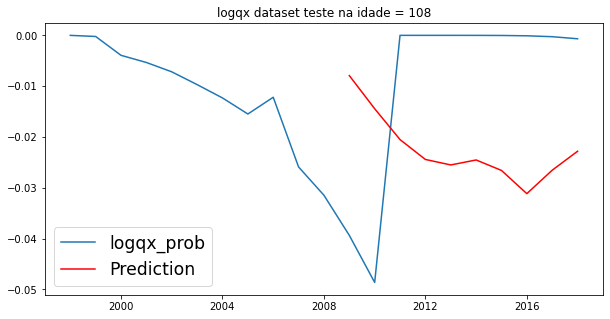

rmse:  [0.02698129]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1556 - mae: 0.3253
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1177 - mae: 0.2625
Epoch 3/500
1/1 [==============================] - 0s 969us/step - loss: 0.1394 - mae: 0.2926
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1152 - mae: 0.2756
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1014 - mae: 0.2613
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1158 - mae: 0.2768
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1500 - mae: 0.3323
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1057 - mae: 0.2561
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0880 - mae: 0.2315
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1063 - mae: 0.2353
Epoch 11/500
1/1 [==============================] - 0s 3m

1/1 [==============================] - 0s 1ms/step - loss: 0.0300 - mae: 0.1404
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0342 - mae: 0.1355
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0499 - mae: 0.1780
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0485 - mae: 0.1600
Epoch 92/500
1/1 [==============================] - 0s 13ms/step - loss: 0.0599 - mae: 0.1837
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0371 - mae: 0.1568
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0507 - mae: 0.1821
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0515 - mae: 0.1766
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0456 - mae: 0.1683
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0539 - mae: 0.1971
Epoch 98/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0600 - m

1/1 [==============================] - 0s 3ms/step - loss: 0.0490 - mae: 0.1779
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0227 - mae: 0.1366
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0429 - mae: 0.1525
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0311 - mae: 0.1350
Epoch 179/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0409 - mae: 0.1640
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0416 - mae: 0.1460
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0439 - mae: 0.1776
Epoch 182/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0385 - mae: 0.1417
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0584 - mae: 0.1950
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0340 - mae: 0.1514
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0466 - mae: 0.1676
Epoch 263/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0377 - mae: 0.1509
Epoch 264/500
1/1 [==============================] - 0s 952us/step - loss: 0.0267 - mae: 0.1325
Epoch 265/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0355 - mae: 0.1475
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0368 - mae: 0.1486
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0396 - mae: 0.1550
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0273 - mae: 0.1347
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0392 - mae: 0.1441
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0477 - mae: 0.1620
Epoch 271/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0337 - mae: 0.1532
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 17ms/step - loss: 0.0206 - mae: 0.0908
Epoch 350/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0423 - mae: 0.1598
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0356 - mae: 0.1615
Epoch 352/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0390 - mae: 0.1610
Epoch 353/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0455 - mae: 0.1770
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0441 - mae: 0.1623
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0452 - mae: 0.1524
Epoch 356/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0412 - mae: 0.1575
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0257 - mae: 0.1183
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0250 - mae: 0.1075
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 

1/1 [==============================] - 0s 940us/step - loss: 0.0461 - mae: 0.1623
Epoch 437/500
1/1 [==============================] - 0s 966us/step - loss: 0.0365 - mae: 0.1497
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0389 - mae: 0.1541
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0202 - mae: 0.1050
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0322 - mae: 0.1421
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0326 - mae: 0.1422
Epoch 442/500
1/1 [==============================] - 0s 955us/step - loss: 0.0357 - mae: 0.1451
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0319 - mae: 0.1413
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0263 - mae: 0.1277
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0256 - mae: 0.1167
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - l

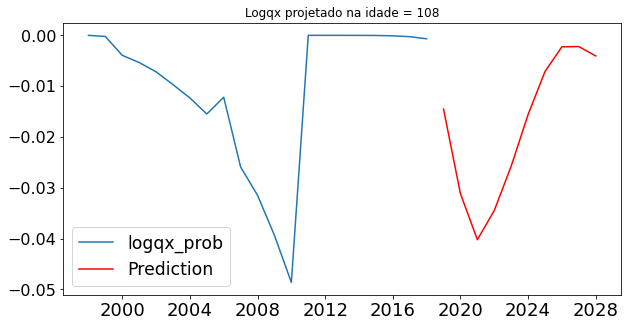

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.6727 - mae: 0.6969
Epoch 2/500
1/1 [==============================] - 0s 4ms/step - loss: 0.6728 - mae: 0.7170
Epoch 3/500
1/1 [==============================] - 0s 6ms/step - loss: 0.6543 - mae: 0.7172
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.5937 - mae: 0.6600
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.5998 - mae: 0.6706
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.5226 - mae: 0.6199
Epoch 7/500
1/1 [==============================] - 0s 5ms/step - loss: 0.5320 - mae: 0.6476
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.5631 - mae: 0.6639
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.5354 - mae: 0.6222
Epoch 10/500
1/1 [==============================] - 0s 15ms/step - loss: 0.4783 - mae: 0.6030
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4129

1/1 [==============================] - 0s 3ms/step - loss: 0.2192 - mae: 0.4153
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1328 - mae: 0.3373
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2391 - mae: 0.4603
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.2031 - mae: 0.4099
Epoch 93/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1398 - mae: 0.3463
Epoch 94/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1437 - mae: 0.3248
Epoch 95/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1241 - mae: 0.3289
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1332 - mae: 0.3263
Epoch 97/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1991 - mae: 0.4024
Epoch 98/500
1/1 [==============================] - 0s 969us/step - loss: 0.2141 - mae: 0.4311
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1554 - 

1/1 [==============================] - 0s 944us/step - loss: 0.1805 - mae: 0.3768
Epoch 177/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1732 - mae: 0.3736
Epoch 178/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1303 - mae: 0.3525
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1793 - mae: 0.3580
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1825 - mae: 0.3906
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1868 - mae: 0.4033
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1214 - mae: 0.3357
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1638 - mae: 0.3794
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1684 - mae: 0.3653
Epoch 185/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1473 - mae: 0.3256
Epoch 186/500
1/1 [==============================] - 0s 3ms/step - loss:

1/1 [==============================] - 0s 3ms/step - loss: 0.1077 - mae: 0.2548
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0873 - mae: 0.2532
Epoch 265/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1235 - mae: 0.2848
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1400 - mae: 0.2782
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0598 - mae: 0.1755
Epoch 268/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0718 - mae: 0.1739
Epoch 269/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1209 - mae: 0.2671
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0810 - mae: 0.2123
Epoch 271/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1022 - mae: 0.2288
Epoch 272/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0528 - mae: 0.1957
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0816 - mae: 0.2507
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0862 - mae: 0.2560
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0723 - mae: 0.2262
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0928 - mae: 0.2548
Epoch 354/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0951 - mae: 0.2702
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0780 - mae: 0.2191
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0950 - mae: 0.2813
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1095 - mae: 0.2717
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1014 - mae: 0.2566
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1270 - mae: 0.2880
Epoch 360/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.1044 - mae: 0.2740
Epoch 438/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0940 - mae: 0.2778
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0883 - mae: 0.2536
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0758 - mae: 0.1980
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0537 - mae: 0.2015
Epoch 442/500
1/1 [==============================] - 0s 947us/step - loss: 0.0800 - mae: 0.2349
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0831 - mae: 0.2101
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1140 - mae: 0.3120
Epoch 445/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0662 - mae: 0.2268
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1082 - mae: 0.2650
Epoch 447/500
1/1 [==============================] - 0s 2ms/step - loss:

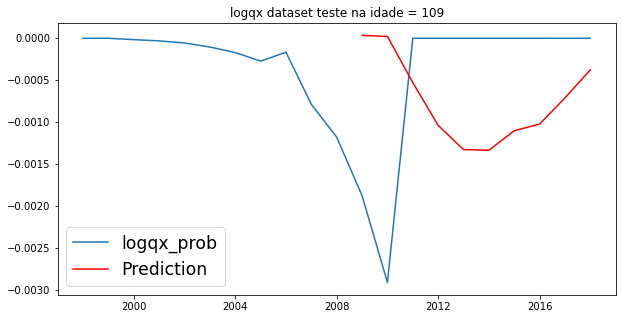

rmse:  [0.00141792]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0651 - mae: 0.1948
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0788 - mae: 0.2312
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1089 - mae: 0.2975
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0951 - mae: 0.2563
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0527 - mae: 0.1931
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0791 - mae: 0.2335
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0756 - mae: 0.2329
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0875 - mae: 0.2459
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0816 - mae: 0.2115
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0587 - mae: 0.1990
Epoch 11/500
1/1 [==============================] - 0s 1ms/

1/1 [==============================] - 0s 1ms/step - loss: 0.0543 - mae: 0.1712
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0571 - mae: 0.1875
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0435 - mae: 0.1584
Epoch 91/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0626 - mae: 0.1840
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0805 - mae: 0.1813
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0616 - mae: 0.1846
Epoch 94/500
1/1 [==============================] - 0s 964us/step - loss: 0.0437 - mae: 0.1431
Epoch 95/500
1/1 [==============================] - 0s 944us/step - loss: 0.0632 - mae: 0.2058
Epoch 96/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0465 - mae: 0.1783
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0687 - mae: 0.2067
Epoch 98/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0690

1/1 [==============================] - 0s 1ms/step - loss: 0.0506 - mae: 0.1828
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0489 - mae: 0.1738
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0370 - mae: 0.1673
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0608 - mae: 0.2134
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0416 - mae: 0.1296
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0559 - mae: 0.1991
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0361 - mae: 0.1523
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0469 - mae: 0.1600
Epoch 183/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0540 - mae: 0.1867
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0282 - mae: 0.1131
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0548 - mae: 0.1687
Epoch 263/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0435 - mae: 0.1375
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0283 - mae: 0.1224
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0698 - mae: 0.1891
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0403 - mae: 0.1510
Epoch 267/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0293 - mae: 0.1316
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0460 - mae: 0.1665
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0374 - mae: 0.1510
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0392 - mae: 0.1627
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0488 - mae: 0.1657
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.0565 - mae: 0.1793
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0530 - mae: 0.1767
Epoch 351/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0510 - mae: 0.1819
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0451 - mae: 0.1512
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0390 - mae: 0.1349
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0528 - mae: 0.1743
Epoch 355/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0478 - mae: 0.1696
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0376 - mae: 0.1300
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0464 - mae: 0.1475
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0468 - mae: 0.1326
Epoch 359/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 988us/step - loss: 0.0358 - mae: 0.1371
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0386 - mae: 0.1384
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0234 - mae: 0.1164
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0368 - mae: 0.1606
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0299 - mae: 0.1217
Epoch 441/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0526 - mae: 0.1705
Epoch 442/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0342 - mae: 0.1456
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0295 - mae: 0.1291
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0308 - mae: 0.1257
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0481 - mae: 0.1709
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

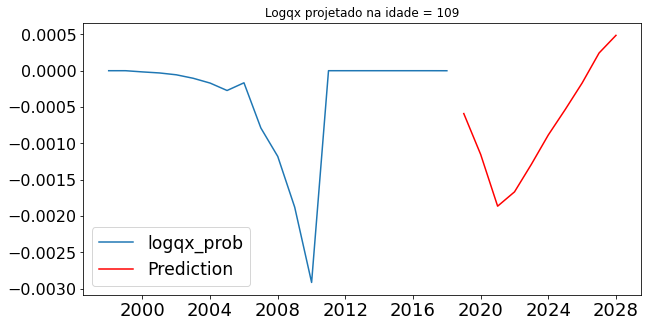

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.5195 - mae: 0.6713
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.4462 - mae: 0.6099
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.4706 - mae: 0.6225
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.4098 - mae: 0.5952
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.4194 - mae: 0.5989
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.3658 - mae: 0.5724
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.3726 - mae: 0.5716
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.3519 - mae: 0.5345
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2771 - mae: 0.4966
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.2755 - mae: 0.4813
Epoch 11/500
1/1 [==============================] - 0s 1ms/step - loss: 0.3200 

1/1 [==============================] - 0s 3ms/step - loss: 0.0723 - mae: 0.2095
Epoch 90/500
1/1 [==============================] - 0s 741us/step - loss: 0.1142 - mae: 0.2271
Epoch 91/500
1/1 [==============================] - 0s 723us/step - loss: 0.1394 - mae: 0.3093
Epoch 92/500
1/1 [==============================] - 0s 738us/step - loss: 0.1160 - mae: 0.1971
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0865 - mae: 0.2217
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1414 - mae: 0.3057
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1222 - mae: 0.2603
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1525 - mae: 0.3223
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1303 - mae: 0.2831
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1241 - mae: 0.2816
Epoch 99/500
1/1 [==============================] - 0s 2ms/step - loss: 0.144

1/1 [==============================] - 0s 4ms/step - loss: 0.1022 - mae: 0.2769
Epoch 177/500
1/1 [==============================] - 0s 929us/step - loss: 0.1369 - mae: 0.3260
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0813 - mae: 0.2170
Epoch 179/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1007 - mae: 0.2570
Epoch 180/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1128 - mae: 0.2481
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0939 - mae: 0.2207
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1149 - mae: 0.2547
Epoch 183/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1123 - mae: 0.2512
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1041 - mae: 0.2823
Epoch 185/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0936 - mae: 0.2651
Epoch 186/500
1/1 [==============================] - 0s 15ms/step - loss

1/1 [==============================] - 0s 3ms/step - loss: 0.1003 - mae: 0.2772
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0784 - mae: 0.2528
Epoch 265/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1032 - mae: 0.2704
Epoch 266/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0807 - mae: 0.2208
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1088 - mae: 0.2413
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0920 - mae: 0.1989
Epoch 269/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1161 - mae: 0.2488
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1166 - mae: 0.2796
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0802 - mae: 0.2100
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0903 - mae: 0.2337
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0751 - mae: 0.2244
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0934 - mae: 0.2485
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0863 - mae: 0.2286
Epoch 353/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1059 - mae: 0.2312
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1296 - mae: 0.2528
Epoch 355/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0616 - mae: 0.1911
Epoch 356/500
1/1 [==============================] - 0s 4ms/step - loss: 0.1131 - mae: 0.2331
Epoch 357/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0998 - mae: 0.2354
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1136 - mae: 0.2652
Epoch 359/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0859 - mae: 0.2134
Epoch 360/500
1/1 [==============================] - 0s 4ms/step - loss: 0

1/1 [==============================] - 0s 968us/step - loss: 0.0781 - mae: 0.2208
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0947 - mae: 0.2375
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1112 - mae: 0.2476
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1104 - mae: 0.2818
Epoch 440/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0725 - mae: 0.2002
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1257 - mae: 0.2707
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1050 - mae: 0.2822
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0771 - mae: 0.2189
Epoch 444/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1170 - mae: 0.2868
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0973 - mae: 0.2387
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

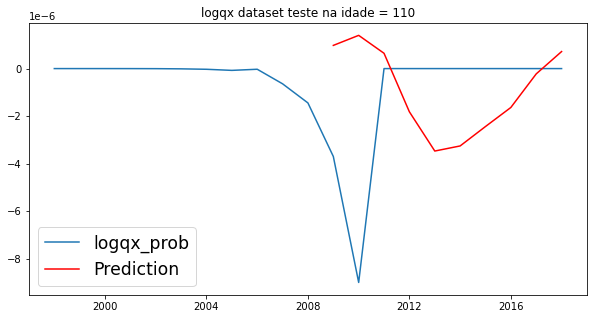

rmse:  [4.06501297e-06]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0794 - mae: 0.2138
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0707 - mae: 0.2145
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0806 - mae: 0.2183
Epoch 4/500
1/1 [==============================] - 0s 928us/step - loss: 0.0685 - mae: 0.2190
Epoch 5/500
1/1 [==============================] - 0s 981us/step - loss: 0.0842 - mae: 0.2228
Epoch 6/500
1/1 [==============================] - 0s 965us/step - loss: 0.0723 - mae: 0.2319
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0650 - mae: 0.2217
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0726 - mae: 0.1994
Epoch 9/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0621 - mae: 0.1801
Epoch 10/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0623 - mae: 0.1950
Epoch 11/500
1/1 [==============================

1/1 [==============================] - 0s 1ms/step - loss: 0.0509 - mae: 0.1754
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0554 - mae: 0.1829
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0641 - mae: 0.1914
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0472 - mae: 0.1560
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0675 - mae: 0.1753
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0454 - mae: 0.1513
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0665 - mae: 0.1846
Epoch 95/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0589 - mae: 0.1729
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0559 - mae: 0.1487
Epoch 97/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0846 - mae: 0.2130
Epoch 98/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0406 - ma

1/1 [==============================] - 0s 2ms/step - loss: 0.0755 - mae: 0.1934
Epoch 176/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0704 - mae: 0.1798
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0436 - mae: 0.1472
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0576 - mae: 0.1867
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0672 - mae: 0.1847
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0746 - mae: 0.2196
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0560 - mae: 0.1881
Epoch 182/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0477 - mae: 0.1603
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0433 - mae: 0.1345
Epoch 184/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0574 - mae: 0.1673
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.0480 - mae: 0.1508
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0564 - mae: 0.1627
Epoch 264/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0474 - mae: 0.1426
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0809 - mae: 0.2141
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0665 - mae: 0.1918
Epoch 267/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0670 - mae: 0.1901
Epoch 268/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0568 - mae: 0.1678
Epoch 269/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0534 - mae: 0.1474
Epoch 270/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0587 - mae: 0.1669
Epoch 271/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0526 - mae: 0.1697
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0607 - mae: 0.1991
Epoch 350/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0513 - mae: 0.1649
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0417 - mae: 0.1487
Epoch 352/500
1/1 [==============================] - 0s 972us/step - loss: 0.0424 - mae: 0.1337
Epoch 353/500
1/1 [==============================] - 0s 10ms/step - loss: 0.0529 - mae: 0.1539
Epoch 354/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0542 - mae: 0.1502
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0526 - mae: 0.1524
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0549 - mae: 0.1394
Epoch 357/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0455 - mae: 0.1533
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0577 - mae: 0.1794
Epoch 359/500
1/1 [==============================] - 0s 3ms/step - loss

1/1 [==============================] - 0s 1ms/step - loss: 0.0470 - mae: 0.1527
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0505 - mae: 0.1738
Epoch 438/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0450 - mae: 0.1253
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0445 - mae: 0.1420
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0356 - mae: 0.1365
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0404 - mae: 0.1550
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0495 - mae: 0.1501
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0408 - mae: 0.1303
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0400 - mae: 0.1481
Epoch 445/500
1/1 [==============================] - 0s 983us/step - loss: 0.0393 - mae: 0.1250
Epoch 446/500
1/1 [==============================] - 0s 1ms/step - loss:

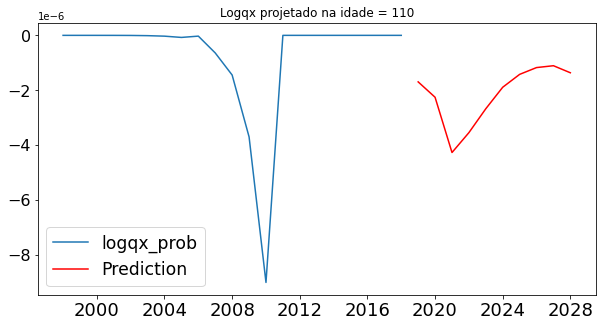

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.9750 - mae: 0.9275
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.8477 - mae: 0.8366
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.8730 - mae: 0.8713
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.8399 - mae: 0.8535
Epoch 5/500
1/1 [==============================] - 0s 5ms/step - loss: 0.7471 - mae: 0.7937
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.7538 - mae: 0.8035
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.6889 - mae: 0.7638
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.6414 - mae: 0.7356
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.6494 - mae: 0.7504
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.6199 - mae: 0.7375
Epoch 11/500
1/1 [==============================] - 0s 4ms/step - loss: 0.5901 

1/1 [==============================] - 0s 972us/step - loss: 0.1854 - mae: 0.3381
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1538 - mae: 0.2901
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.2003 - mae: 0.3811
Epoch 92/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1800 - mae: 0.3324
Epoch 93/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1419 - mae: 0.2975
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1572 - mae: 0.3148
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1890 - mae: 0.3052
Epoch 96/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1702 - mae: 0.2660
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1552 - mae: 0.3219
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1398 - mae: 0.3073
Epoch 99/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0697 - 

1/1 [==============================] - 0s 1ms/step - loss: 0.1029 - mae: 0.2683
Epoch 177/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1084 - mae: 0.2496
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1943 - mae: 0.3390
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1377 - mae: 0.2904
Epoch 180/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0843 - mae: 0.2153
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1378 - mae: 0.2200
Epoch 182/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1249 - mae: 0.2352
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1621 - mae: 0.3216
Epoch 184/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1507 - mae: 0.3144
Epoch 185/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1743 - mae: 0.3632
Epoch 186/500
1/1 [==============================] - 0s 968us/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.1019 - mae: 0.2156
Epoch 264/500
1/1 [==============================] - 0s 3ms/step - loss: 0.1232 - mae: 0.2611
Epoch 265/500
1/1 [==============================] - 0s 5ms/step - loss: 0.1784 - mae: 0.3425
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1637 - mae: 0.2886
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1278 - mae: 0.2360
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0834 - mae: 0.1894
Epoch 269/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1262 - mae: 0.3000
Epoch 270/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0718 - mae: 0.1895
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1803 - mae: 0.3566
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1521 - mae: 0.3042
Epoch 273/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 1ms/step - loss: 0.1543 - mae: 0.3164
Epoch 350/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0794 - mae: 0.2278
Epoch 351/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1022 - mae: 0.2456
Epoch 352/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1268 - mae: 0.2573
Epoch 353/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1123 - mae: 0.2251
Epoch 354/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0911 - mae: 0.2365
Epoch 355/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1558 - mae: 0.3298
Epoch 356/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1315 - mae: 0.2864
Epoch 357/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1037 - mae: 0.2364
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1128 - mae: 0.2369
Epoch 359/500
1/1 [==============================] - 0s 2ms/step - loss: 0

1/1 [==============================] - 0s 2ms/step - loss: 0.1108 - mae: 0.2474
Epoch 437/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0940 - mae: 0.2378
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1123 - mae: 0.2535
Epoch 439/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1102 - mae: 0.2365
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0689 - mae: 0.2224
Epoch 441/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0685 - mae: 0.1960
Epoch 442/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1357 - mae: 0.2881
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0836 - mae: 0.1849
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.1066 - mae: 0.2613
Epoch 445/500
1/1 [==============================] - 0s 1ms/step - loss: 0.1081 - mae: 0.2365
Epoch 446/500
1/1 [==============================] - 0s 3ms/step - loss: 0

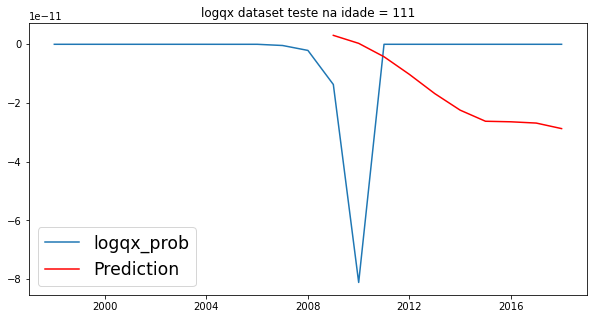

rmse:  [3.27829419e-11]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0594 - mae: 0.1736
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0928 - mae: 0.1969
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0717 - mae: 0.2059
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0784 - mae: 0.2036
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0818 - mae: 0.2359
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0644 - mae: 0.1738
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0685 - mae: 0.1725
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0606 - mae: 0.1846
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0659 - mae: 0.1989
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0575 - mae: 0.1557
Epoch 11/500
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 4ms/step - loss: 0.0696 - mae: 0.1896
Epoch 89/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0480 - mae: 0.1315
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0876 - mae: 0.2298
Epoch 91/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0605 - mae: 0.1716
Epoch 92/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0767 - mae: 0.1837
Epoch 93/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0502 - mae: 0.1308
Epoch 94/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0609 - mae: 0.1895
Epoch 95/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0668 - mae: 0.1547
Epoch 96/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0607 - mae: 0.1914
Epoch 97/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0504 - mae: 0.1451
Epoch 98/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0575 - ma

1/1 [==============================] - 0s 4ms/step - loss: 0.0329 - mae: 0.1292
Epoch 176/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0568 - mae: 0.1536
Epoch 177/500
1/1 [==============================] - 0s 990us/step - loss: 0.0654 - mae: 0.1831
Epoch 178/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0479 - mae: 0.1393
Epoch 179/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0686 - mae: 0.1851
Epoch 180/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0669 - mae: 0.1795
Epoch 181/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0939 - mae: 0.2233
Epoch 182/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0721 - mae: 0.1917
Epoch 183/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0533 - mae: 0.1411
Epoch 184/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0802 - mae: 0.1884
Epoch 185/500
1/1 [==============================] - 0s 2ms/step - los

1/1 [==============================] - 0s 1ms/step - loss: 0.0676 - mae: 0.1666
Epoch 263/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0802 - mae: 0.2075
Epoch 264/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0475 - mae: 0.1722
Epoch 265/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0552 - mae: 0.1693
Epoch 266/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0515 - mae: 0.1765
Epoch 267/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0612 - mae: 0.1611
Epoch 268/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0659 - mae: 0.1688
Epoch 269/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0542 - mae: 0.1842
Epoch 270/500
1/1 [==============================] - 0s 11ms/step - loss: 0.0698 - mae: 0.1856
Epoch 271/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0496 - mae: 0.1543
Epoch 272/500
1/1 [==============================] - 0s 1ms/step - loss:

1/1 [==============================] - 0s 1ms/step - loss: 0.0727 - mae: 0.1975
Epoch 349/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0598 - mae: 0.1819
Epoch 350/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0567 - mae: 0.1803
Epoch 351/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0648 - mae: 0.1707
Epoch 352/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0643 - mae: 0.1826
Epoch 353/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0616 - mae: 0.1735
Epoch 354/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0575 - mae: 0.1766
Epoch 355/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0608 - mae: 0.1522
Epoch 356/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0689 - mae: 0.1708
Epoch 357/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0627 - mae: 0.1742
Epoch 358/500
1/1 [==============================] - 0s 1ms/step - loss: 0

1/1 [==============================] - 0s 3ms/step - loss: 0.0631 - mae: 0.1834
Epoch 436/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0642 - mae: 0.1609
Epoch 437/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0599 - mae: 0.1727
Epoch 438/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0719 - mae: 0.1805
Epoch 439/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0660 - mae: 0.1688
Epoch 440/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0677 - mae: 0.1869
Epoch 441/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0446 - mae: 0.1451
Epoch 442/500
1/1 [==============================] - 0s 933us/step - loss: 0.0544 - mae: 0.1591
Epoch 443/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0519 - mae: 0.1419
Epoch 444/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0596 - mae: 0.1610
Epoch 445/500
1/1 [==============================] - 0s 2ms/step - loss:

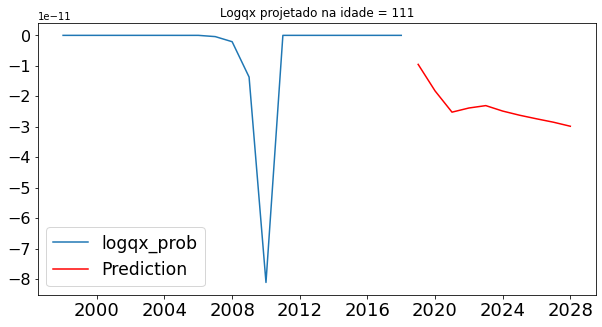

Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 979us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
E

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 322/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

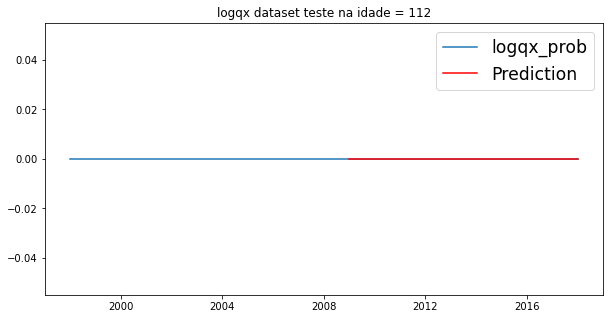

rmse:  [0.]
Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 251/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 331/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 411/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 491/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

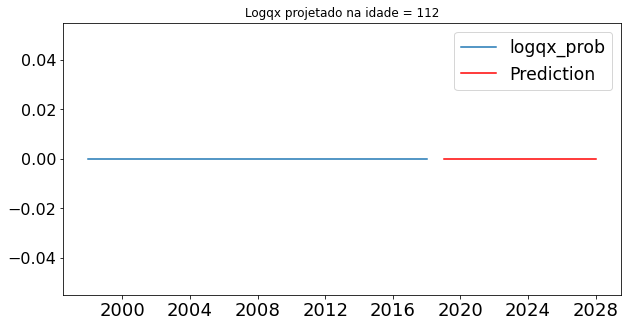

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00

1/1 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 875us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 911us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+0

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 251/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 331/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 741us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 818us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 727us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 924us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 844us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 726us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 481/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 916us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

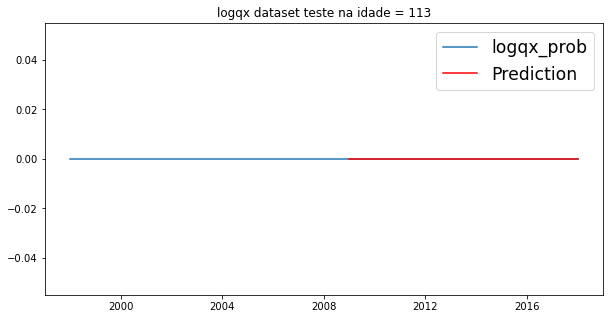

rmse:  [0.]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 950us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - 

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

1/1 [==============================] - 0s 911us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 955us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0

1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 251/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 331/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 411/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 491/500
1/1 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - mae: 0.00

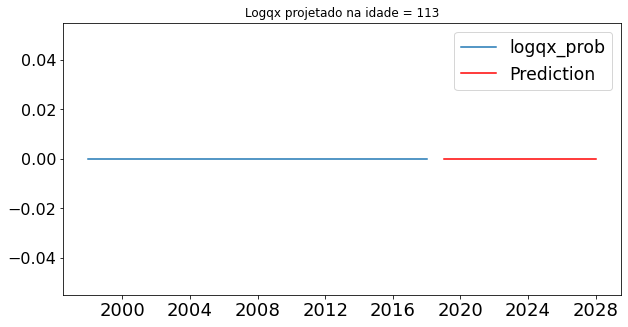

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 967us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
E

Epoch 162/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 251/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 331/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 411/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 968us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 491/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

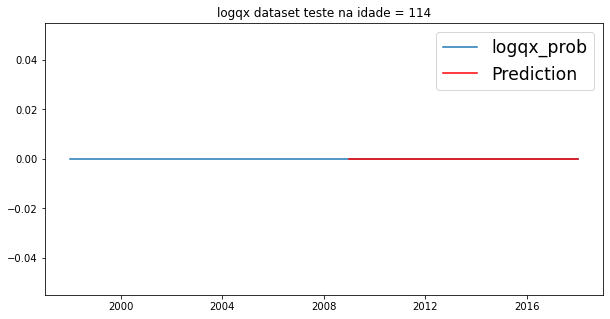

rmse:  [0.]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae

1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 82/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 162/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 912us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 896us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 322/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 401/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 481/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.00

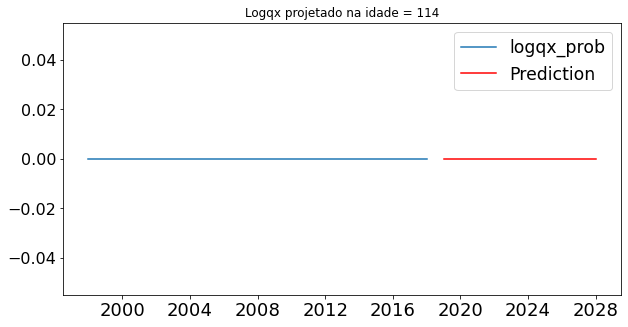

Epoch 1/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
E

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 910us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 842us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 785us/step - loss: 0.0000e+00 - mae:

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 251/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

Epoch 322/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 331/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 411/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.00

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 491/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

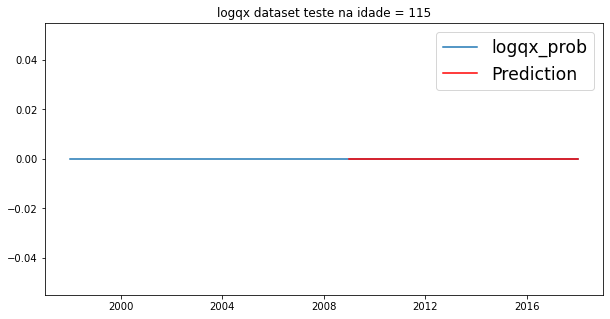

rmse:  [0.]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae

Epoch 82/500
1/1 [==============================] - 0s 951us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 990us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 91/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - ma

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 960us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 171/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
1/1 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 996us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 322/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 928us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 971us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

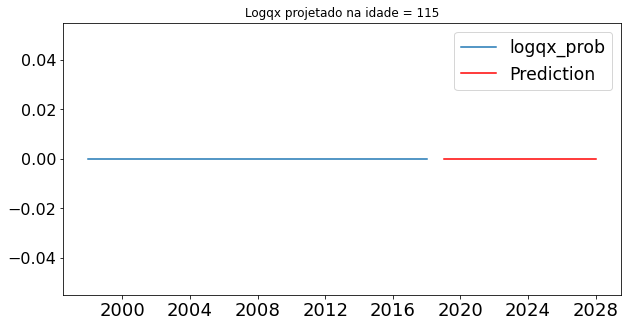

Epoch 1/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 82/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 162/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 322/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 983us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

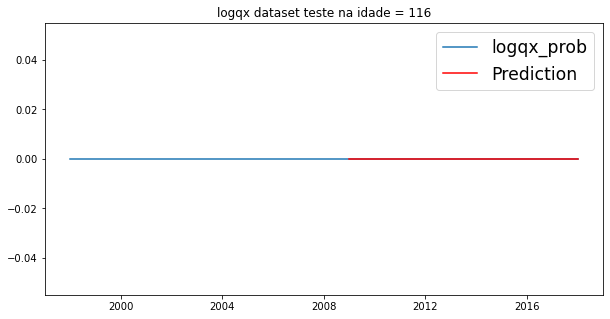

rmse:  [0.]
Epoch 1/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 7/500
1/1 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 8/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 9/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 10/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae

1/1 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 82/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 88/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 89/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 90/500
1/1 [==============================] - 0s 947us/step - loss: 0.0000e+00 - mae: 0.0000e+00


1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 162/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 163/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 164/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 165/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 166/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 167/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 168/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 169/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 170/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
1/1 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 248/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 249/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 250/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 322/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 323/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 324/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 325/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 326/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 327/500
1/1 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 328/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 329/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 330/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 408/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 409/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 410/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.000

1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 482/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 483/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 484/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 485/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 486/500
1/1 [==============================] - 0s 979us/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 487/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 488/500
1/1 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 489/500
1/1 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 490/500
1/1 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - mae: 0.0

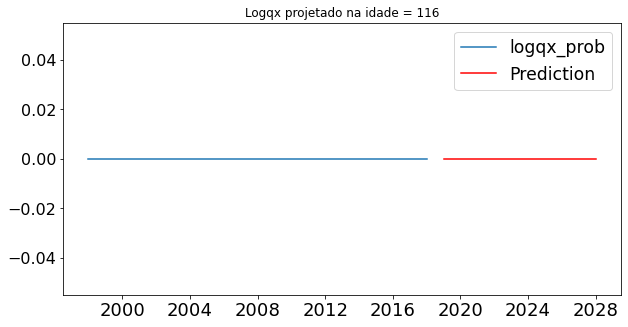


Tempo de processamento:
02:01:26.10



In [11]:
predict_res = []
pred_actual_rmse_res = []

w_max = max(df_dados['idade']) # definir maior idade nas tábuas. testes: 3

# inicio do cronometro do processamento
start = time.time()

n_input = 10
n_features = 1
n_epochs = 500 #1000
n_batch = 2
n_neurons = 50
t_projecao = 10

for x in range(0, w_max+1):
    
    # Série para cada idade ao longo dos anos de 1998 a 2018
    #serie = df_lstm[df_lstm['idade']==x]['logqx_prob']
    serie = df_lstm[df_lstm['idade']==x]
    serie.drop(['idade', 'ano'], axis=1, inplace=True)

    # Separar base de treino e teste === preparar dados
    treino, teste = serie[:-5], serie[-5:]
    
    # Padronizar dados
    scaler = MinMaxScaler()
    scaler.fit(treino)
    treino = scaler.transform(treino)
    teste = scaler.transform(teste)
    
    # IDENTIFICAR
    #generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    generator = TimeseriesGenerator(treino, treino, length=n_input)
    
    # ============ CAMADAS =========
    model = Sequential()
    model.add(LSTM(n_neurons, activation='relu', input_shape=(n_input, n_features)))
    model.add(Dropout(0.20))
    model.add(Dense(1))
    #model.add(Dense(y.shape[1], activation='sigmoid'))
    model.compile(optimizer='adam', loss='mse', metrics=["mae"])
    
    # fit model
    #model.fit_generator(generator, epochs=n_epochs)
    # ADAPTADO PARA A ATUALIZAÇÃO DO KERAS (28/11/2020)
    model.fit(generator, epochs=n_epochs, batch_size=n_batch)
    
    
    #Previsão
    pred_list = []
    batch = treino[-n_input:].reshape((1, n_input, n_features))

    for i in range(n_input):
        pred_list.append(model.predict(batch)[0])
        batch = np.append(batch[:,1:,:], [[pred_list[i]]], axis=1)


    df_predict = pd.DataFrame(scaler.inverse_transform(pred_list), 
                            index=serie[-n_input:].index, columns=['Prediction'])
    
    df_teste = pd.concat([serie, df_predict], axis=1)

    
    #plt.figure(figsize=(10,5))
    fig = plt.figure(figsize=(10,5))
    ax = plt.subplot(111)
    ax.plot(df_teste.index, df_teste['logqx_prob'])
    ax.plot(df_teste.index, df_teste['Prediction'], color='r')
    #ax.legend(loc='best', fontsize='xx-large')
    ax.legend(loc='best', fontsize='xx-large', labels=['logqx_prob', 'Prediction'])
    
    #plt.figure(figsize=(10,5))
    #plt.plot(df_teste.index, df_teste['logqx_prob'])
    #plt.plot(df_teste.index, df_teste['Prediction'], color='r')
    #plt.legend(loc='best', fontsize='xx-large')
    #plt.xticks(fontsize=18)
    #plt.yticks(fontsize=16)
    plt.title('logqx dataset teste na idade = %i' %x) # Título parametrizado com a idade
    plt.savefig(pasta_graficos + '/' + 'prev_test_idade'+str(x)+'.png')
    plt.show()
    
    
    pred_actual_rmse = rmse(df_teste.iloc[-n_input:, [0]], df_teste.iloc[-n_input:, [1]])
    print("rmse: ", pred_actual_rmse)
    
    
    pred_actual_rmse_res.append(pred_actual_rmse)
    
    treino = serie
    
    scaler.fit(treino)
    treino = scaler.transform(treino)
    
    #generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    #model.fit_generator(generator,epochs=n_epochs)
    # ADAPTADO PARA A ATUALIZAÇÃO DO KERAS (28/11/2020)
    generator = TimeseriesGenerator(treino, treino, length=n_input)
    model.fit(generator, epochs=n_epochs, batch_size=n_batch)
    
    pred_list = []

    batch = treino[-n_input:].reshape((1, n_input, n_features))

    for i in range(n_input):   
        pred_list.append(model.predict(batch)[0]) 
        batch = np.append(batch[:,1:,:],[[pred_list[i]]],axis=1)
          
    # prever para t_projecao anos
    add_dates = [serie.index[-1] + DateOffset(years=x) for x in range(0, t_projecao + 1)]
    #add_dates = [serie.index[-1] + pd.offsets.YearBegin(x) for x in range(0,6)]
    future_dates = pd.DataFrame(index=add_dates[1:],columns=serie.columns)
    
    
    #inverse transform forecasts and test
    df_predict = pd.DataFrame(scaler.inverse_transform(pred_list),
                          index=future_dates[-n_input:].index, columns=['Prediction'])

    
    predict_res.append(df_predict.values.tolist())
    
    df_proj = pd.concat([serie,df_predict], axis=1)
    
    
    # plt.figure(figsize=(10, 5))
    fig = plt.figure(figsize=(10,5))
    ax = plt.subplot(111)
    ax.plot(df_proj.index, df_proj['logqx_prob'])
    ax.plot(df_proj.index, df_proj['Prediction'], color='r')
    ax.legend(loc='best', fontsize='xx-large', labels=['logqx_prob', 'Prediction'])
    
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=16)
    plt.title('Logqx projetado na idade = %i' %x) # Título parametrizado com a idade
    plt.savefig(pasta_graficos + '/' + 'proj_log_qx'+str(x)+'.png')
    plt.show()


# fim do cronometro do processamento

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print()
print('Tempo de processamento:')
print('{:0>2}:{:0>2}:{:05.2f}'.format(int(hours), int(minutes), seconds))
print()



#### 5 - Valores de RMSE por idade

In [12]:
pd.DataFrame(pred_actual_rmse_res) # RMSE para cada idade

,0
0,0.233179
1,0.508525
2,0.507810
3,0.222306
4,0.197885
...,...
112,0.000000
113,0.000000
114,0.000000
115,0.000000


In [ ]:
#### 6 - Base resultante dos anos de 2019 a 2028, por idade

In [33]:
df_lstm_res = pd.DataFrame(predict_res)

In [34]:
df_lstm_res.head()

,0,1,2,3,4,5,6,7,8,9
0,[-4.432304138673916],[-4.479200119695817],[-4.537957326133465],[-4.563061418666686],[-4.590569904800633],[-4.618164434845874],[-4.64658283976485],[-4.6758441388594045],[-4.706058555618373],[-4.73698305580019]
1,[-7.06657088757294],[-7.064171297366821],[-7.059750282810604],[-7.062093963684615],[-7.063832180836346],[-7.06481291428325],[-7.064908981868539],[-7.064581568292811],[-7.0641708774816],[-7.064041337507803]
2,[-7.567763052563372],[-7.600327892990256],[-7.634567463929278],[-7.650709040985187],[-7.66526043781923],[-7.679230930424575],[-7.692655563106542],[-7.705481797744865],[-7.718308769163731],[-7.729928931836648]
3,[-7.7879943024791265],[-7.792532097828598],[-7.794773478613134],[-7.795364469442085],[-7.79565581153669],[-7.795591888918291],[-7.795167136321629],[-7.794886580939666],[-7.794434992212187],[-7.794261212907948]
4,[-7.99678761638723],[-8.013184070025382],[-8.034577328715777],[-8.039546436543539],[-8.042686760996153],[-8.045230120969673],[-8.04800321290975],[-8.049732798439555],[-8.051324083169021],[-8.052347608491557]


In [40]:
df_lstm_res[0][0][0]

-4.432304138673916

In [39]:
df_lstm_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       117 non-null    object
 1   1       117 non-null    object
 2   2       117 non-null    object
 3   3       117 non-null    object
 4   4       117 non-null    object
 5   5       117 non-null    object
 6   6       117 non-null    object
 7   7       117 non-null    object
 8   8       117 non-null    object
 9   9       117 non-null    object
dtypes: object(10)
memory usage: 9.3+ KB


In [52]:
# Função para unir as listas em linha
def unirSeries(df, explode):
    idx = df.index.repeat(df[explode[0]].str.len())
    df1 = pd.concat([
        pd.DataFrame({x: np.concatenate(df[x].values)}) for x in explode], axis=1)
    df1.index = idx

    return df1.join(df.drop(explode, 1), how='left')

In [54]:
colunas = np.arange(2019, 2029)
df_temp = pd.DataFrame(predict_res, columns=colunas)
df_lstm_res = unirSeries(df_temp,colunas)
df_lstm_res = df_dados.reset_index(drop=True)

In [55]:
df_lstm_res.head()

,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,-4.432304,-4.479200,-4.537957,-4.563061,-4.590570,-4.618164,-4.646583,-4.675844,-4.706059,-4.736983
1,-7.066571,-7.064171,-7.059750,-7.062094,-7.063832,-7.064813,-7.064909,-7.064582,-7.064171,-7.064041
2,-7.567763,-7.600328,-7.634567,-7.650709,-7.665260,-7.679231,-7.692656,-7.705482,-7.718309,-7.729929
3,-7.787994,-7.792532,-7.794773,-7.795364,-7.795656,-7.795592,-7.795167,-7.794887,-7.794435,-7.794261
4,-7.996788,-8.013184,-8.034577,-8.039546,-8.042687,-8.045230,-8.048003,-8.049733,-8.051324,-8.052348


In [56]:
df_forecast_res_exp = pd.DataFrame(np.exp(df_lstm_res))

In [57]:
df_forecast_res_exp.head()

,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,0.011887,0.011342,0.010695,0.010430,0.010147,0.009871,0.009594,0.009318,0.009040,0.008765
1,0.000853,0.000855,0.000859,0.000857,0.000855,0.000855,0.000855,0.000855,0.000855,0.000855
2,0.000517,0.000500,0.000483,0.000476,0.000469,0.000462,0.000456,0.000450,0.000445,0.000439
3,0.000415,0.000413,0.000412,0.000412,0.000412,0.000412,0.000412,0.000412,0.000412,0.000412
4,0.000337,0.000331,0.000324,0.000322,0.000321,0.000321,0.000320,0.000319,0.000319,0.000318


In [58]:
df_forecast_res_exp.to_csv(pasta_resultados + '/' + 'lstm_previsao_qx.csv')

In [16]:
# Annual Start: AS (INICIA COM 01-01-YYYY). Somente A, o final 31-12-YYYY
#df_previsao_lstm = pd.DataFrame(np.array(predict_res).reshape(n_input, w_max+1),index=pd.date_range(start='1/1/2019',
#                                                                     periods=t_projecao, freq='AS')) 

In [17]:
df_previsao_lstm.head()

,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
2019-01-01,-4.432304,-4.479200,-4.537957,-4.563061,-4.590570,-4.618164,-4.646583,-4.675844,-4.706059,-4.736983,...,-8.382352,-8.380410,-8.381930,-8.329911,-8.322109,-8.306923,-8.307891,-8.308328,-8.309990,-8.311403
2020-01-01,-8.311836,-8.313173,-8.316209,-8.249738,-8.235399,-8.187481,-8.235478,-8.268644,-8.290690,-8.309147,...,-6.525932,-6.528102,-6.527749,-6.526006,-6.523852,-6.520974,-6.486325,-6.487257,-6.487787,-6.488268
2021-01-01,-6.488326,-6.488242,-6.488250,-6.488275,-6.488297,-6.488316,-6.470086,-6.474485,-6.477253,-6.479210,...,-6.330788,-6.339703,-6.346256,-6.352768,-6.358481,-6.363571,-6.367843,-6.371477,-6.374269,-6.284238
2022-01-01,-6.295232,-6.304633,-6.312096,-6.319038,-6.325023,-6.330292,-6.334787,-6.338545,-6.341545,-6.234917,...,-5.692403,-5.693058,-5.586217,-5.591565,-5.595667,-5.597492,-5.599083,-5.600343,-5.601313,-5.602027
2023-01-01,-5.602451,-5.602717,-5.520902,-5.532986,-5.544146,-5.550682,-5.556851,-5.562263,-5.567047,-5.571132,...,-4.808120,-4.810198,-4.811923,-4.813289,-4.814257,-4.715232,-4.722229,-4.727829,-4.729832,-4.731304


In [18]:
df_forecast_res_exp = pd.DataFrame(np.exp(df_previsao_lstm))

In [19]:
df_forecast_res_exp

,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
2019-01-01,0.011887,0.011342,0.010695,0.010430,0.010147,0.009871,0.009594,0.009318,0.009040,0.008765,...,0.000229,0.000229,0.000229,0.000241,0.000243,0.000247,0.000247,0.000246,0.000246,0.000246
2020-01-01,0.000246,0.000245,0.000245,0.000261,0.000265,0.000278,0.000265,0.000256,0.000251,0.000246,...,0.001465,0.001462,0.001462,0.001465,0.001468,0.001472,0.001524,0.001523,0.001522,0.001521
2021-01-01,0.001521,0.001521,0.001521,0.001521,0.001521,0.001521,0.001549,0.001542,0.001538,0.001535,...,0.001781,0.001765,0.001753,0.001742,0.001732,0.001723,0.001716,0.001710,0.001705,0.001865
2022-01-01,0.001845,0.001828,0.001814,0.001802,0.001791,0.001782,0.001774,0.001767,0.001762,0.001960,...,0.003371,0.003369,0.003749,0.003729,0.003714,0.003707,0.003701,0.003697,0.003693,0.003690
2023-01-01,0.003689,0.003688,0.004002,0.003954,0.003910,0.003885,0.003861,0.003840,0.003822,0.003806,...,0.008163,0.008146,0.008132,0.008121,0.008113,0.008958,0.008895,0.008846,0.008828,0.008815
2024-01-01,0.008805,0.008797,0.008792,0.008788,0.008786,0.009606,0.009543,0.009497,0.009477,0.009463,...,0.020812,0.020686,0.020577,0.020482,0.020399,0.020326,0.020265,0.020213,0.023177,0.023005
2025-01-01,0.022852,0.022758,0.022683,0.022618,0.022562,0.022515,0.022479,0.022450,0.025171,0.025010,...,0.050080,0.058558,0.058001,0.057419,0.055775,0.054544,0.053259,0.051851,0.050345,0.048816
2026-01-01,0.047153,0.063861,0.063755,0.063780,0.062995,0.062798,0.062670,0.062587,0.062540,0.062519,...,0.125447,0.124292,0.150711,0.153484,0.138778,0.138949,0.142830,0.138322,0.136949,0.135906
2027-01-01,0.135151,0.134608,0.134509,0.186005,0.155462,0.154112,0.153063,0.152443,0.151691,0.149592,...,0.544629,0.523685,0.507513,0.494733,0.484089,0.475620,0.468351,0.624308,0.572917,0.518124
2028-01-01,0.538827,0.548379,0.556120,0.561685,0.566332,0.571615,0.694036,0.830193,0.782408,0.734737,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Gravar resultados

In [20]:
df_forecast_res_exp.to_csv(pasta_resultados + '/' + 'lstm_previsao_qx.csv')

In [23]:
pd.DataFrame(pred_actual_rmse_res).to_csv(pasta_resultados + '/' + 'pred_actual_rmse_res.csv', header=['RMSE'])

In [12]:
df_predict.head(10) # novo: 100 neuronios

,Prediction
2019-01-01,-7.775806
2020-01-01,-7.771693
2021-01-01,-7.767473
2022-01-01,-7.764277
2023-01-01,-7.761777
2024-01-01,-7.759818
2025-01-01,-7.758498
2026-01-01,-7.757859
2027-01-01,-7.757556
2028-01-01,-7.757950


In [16]:
df_forecast_res = pd.DataFrame(forecasts_res)

In [17]:
df_forecast_res.to_csv(pasta_resultados + '/' + 'lstm_previsao.csv')

In [7]:
df_forecast_res = pd.read_csv(pasta_resultados + '/' + 'lstm_previsao.csv', index_col=[0])
# index_col para não importar Unnamed column.